# Prepare

In [34]:
%load_ext autoreload
%autoreload 2

import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from copy import deepcopy

import experiments as meas
from slab import AttrDict
from experiments import MultimodeStation, CharacterizationRunner, SweepRunner

from job_server import JobClient
from job_server.database import get_database
from job_server.config_versioning import ConfigVersionManager

# Initialize database and config manager
db = get_database()
config_dir = 'C:/python/multimode_expts/configs'
config_manager = ConfigVersionManager(config_dir)

# Initialize job client (handle submitting and waiting for jobs)
client = JobClient()

# Check server health
health = client.health_check()
print(f"Server status: {health['status']}")
print(f"Pending jobs: {health['pending_jobs']}")

# Initialize database and config manager
db = get_database()
config_dir = 'C:/python/multimode_expts/configs'
config_manager = ConfigVersionManager(config_dir)

# Initialize job client (handle submitting and waiting for jobs)
client = JobClient()

# Check server health
health = client.health_check()
client.print_queue()

# Who is running these experiments??
user = 'jonginn'

print(f"Welcome {user}!")

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Server status: healthy
Pending jobs: 0

=== Job Queue ===

No job currently running

Pending: 0 jobs

Welcome jonginn!


In [35]:
# Initialize station to retrieve soc and configs
config_dict = {'hardware_config': 'CFG-HW-20260906-00001',
 'multiphoton_config': 'CFG-MP-20260121-00001',
 'man1_storage_swap': 'CFG-M1-20260906-00019',
 'floquet_storage_swap': 'CFG-FL-20260906-00041'}



station = MultimodeStation(
    user = user,
    experiment_name = "260818_qsim_spectroscopy",
    project = "EncSpec",
    log_measurements=True,
    
    storage_man_file = config_dict['man1_storage_swap'],
    hardware_config= config_dict['hardware_config'],
    floquet_file=config_dict['floquet_storage_swap'],
)

[STATION] Using hardware_config version: CFG-HW-20260906-00001
[STATION] Using main multiphoton_config version: CFG-MP-20260121-00001
[STATION] Using man1_storage_swap version: CFG-M1-20260906-00019
[STATION] Using floquet_storage_swap version: CFG-FL-20260906-00041
[STATION] Lab-notebook vault: G:\Shared drives\SLab\Multimode
Data, plots, logs will be stored in: C:\experiments\260818_qsim_spectroscopy
Hardware configs will be read from C:\python\multimode_expts\configs\versions\hardware_config\CFG-HW-20260906-00001.yml
dict_keys(['Pyro.NameServer', 'Qick101'])
QICK running on ZCU216, software version 0.2.291

Firmware configuration (built Tue Oct 15 12:06:51 2024):

	Global clocks (MHz): tProcessor 430.080, RF reference 245.760

	7 signal generator channels:
	0:	axis_signal_gen_v6 - envelope memory 32768 samples (5.128 us)
		fs=6389.760 MHz, fabric=399.360 MHz, 32-bit DDS, range=6389.760 MHz
		DAC tile 2, blk 0 is 0_230, on JHC3
	1:	axis_signal_gen_v6 - envelope memory 32768 samples (

# Global Exp Config Setting

In [3]:
station.ds_storage.df

,stor_name,freq (MHz),precision (MHz),pi (mus),h_pi (mus),gain (DAC units),last_update,bs_rate_coeffs_g,bs_rate_coeffs_e,freq_coeffs_g,freq_coeffs_e,gain_range_g,gain_range_e,joint_parity,dr_ac_stark_rate,dr_jp_phase
0,M1-S1,342.105410,NaN,0.557694,0.278847,5000,2026-09-06 21:21:22.369784,"[2.71800440497595e-10, 3.5345716702085755e-05,...","[2.617101263255993e-10, 3.5294007231684914e-05...","[-5.581106410081517e-38, 3.497594370968036e-33...","[-5.787229142339564e-38, 3.802111265047564e-33...","[2823.494166114352, 10936.689003179721]","[2834.8504180018463, 11002.012121829115]","[352.95224967922866, 3259, 3.513105914802541, ...",NaN,NaN
1,M1-S2,512.695252,NaN,0.615557,0.307779,7008,2026-09-06 21:23:35.491765,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,M1-S3,689.103320,NaN,0.883949,0.441975,4960,2026-09-06 21:25:46.028223,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,M1-S4,868.676827,NaN,1.053991,0.526996,9851,2026-09-06 21:27:35.190119,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,M1-S5,1044.993117,NaN,1.173960,0.586980,9990,2026-09-06 21:29:36.115753,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,M1-S6,1236.785773,NaN,1.167909,0.583954,10050,2026-09-06 21:31:25.228604,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,M1-S7,1414.679004,NaN,1.151378,0.575689,10320,2026-09-06 21:33:03.188702,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,M1-S8,-1.000000,-1.00,-1.000000,-1.000000,-1,51:31.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,M1-S9,-1.000000,-1.00,-1.000000,-1.000000,-1,51:31.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,M1-S10,-1.000000,-1.00,-1.000000,-1.000000,-1,51:31.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
measurement_config_default_dict = {
    'avoid_yoko': False,
    'use_multiphoton_swap': False,
    
    
}

active_reset_default_dict = {
    "reset_dump_mode": 2,
    "dump_reset_iter_num": 1,
}

floquet_default_dict = {
    #For phase accumulation:
    "include_10cycles_buffer": True,
    "include_10cycles_buffer_in_pi_half" : True,
    
    # flat_top: legacy 3-segment pulse; preload_flattop: one preloaded arb envelope
    "floquet_waveform": "preload_flattop",
    "floquet_hardware_loop" : True,
    "scramble_sync_cycles" : 1,
    "palindrome_scramble": False,    
}

# Broadband qubit ge calibration

This makes a separate `pi_ge_broadband`; the ordinary `pi_ge` and `hpi_ge` are not changed.

Run the cells in order: add the runtime config row, run the same amplitude-Rabi sweep at (n=0,1,2,3), choose one common gain, run the exact pulse-path validation, and then check zero-photon phase accumulation. The plotted values are population-transfer coordinates obtained from each (n)'s own g/e IQ references, not leakage-resolved gate fidelities.

Start with the ordinary `pi_ge` sigma. If the pi points separate with photon number, shorten `broadband_sigma` and repeat. Save a config snapshot only after inspecting the plots.

## Resetting Config files

In [5]:
from experiments.qsim.floquet_dark_mode_readout import (
    DarkBaseExperiment,
    BroadbandGeValidationProgram,
)


broadband_gain_limit = 30000
photon_numbers = [0]

RESET_GE_BROADBAND = False
SET_SIGMA_FRACTION = 3

print(station.hardware_cfg.device.qubit.pulses.pi_ge_broadband)

{'frequency': [3569.082846496114], 'gain': [24803], 'sigma': [0.011666666666666667], 'length': [0.0], 'type': ['gauss']}


In [6]:

ge_frequencies = np.asarray(
    station.hardware_cfg.device.multiphoton.pi['gn-en'].frequency[:4],
    dtype=float,
)

pi_ge = station.hardware_cfg.device.qubit.pulses.pi_ge
broadband_frequency = 0.5 * (
    ge_frequencies.min() + ge_frequencies.max()
)
broadband_sigma = float(pi_ge.sigma[0] / SET_SIGMA_FRACTION)
broadband_gain = int(np.clip(
    round(pi_ge.gain[0] * SET_SIGMA_FRACTION), 0, broadband_gain_limit
))

# If the four pi points do not overlap, shorten this and rerun from here.
# broadband_sigma = 0.020
if RESET_GE_BROADBAND:
    station.hardware_cfg.device.qubit.pulses['pi_ge_broadband'] = AttrDict(dict(
        frequency=[broadband_frequency],
        gain=[broadband_gain],
        sigma=[broadband_sigma],
        length=[0.0],
        type=['gauss'],
    ))
    print('gN-eN frequencies:', ge_frequencies)
    print('broadband frequency:', broadband_frequency)
    
station.hardware_cfg.device.qubit.pulses.pi_ge_broadband

{'frequency': [3569.082846496114],
 'gain': [24803],
 'sigma': [0.011666666666666667],
 'length': [0.0],
 'type': ['gauss']}

In [ ]:
# Define the amplitude-Rabi runner
# =====================================
broadband_amprabi_defaults = AttrDict(dict(
    start=0,
    step=200,
    expts=151,       # gain = 0 ... 30000
    reps=200,
    rounds=1,
    sigma_test=broadband_sigma,
    qubit=0,
    qubits=[0],
    pulse_type='gauss',
    flat_length=0,
    user_defined_freq=[True, broadband_frequency],
    checkZZ=False,
    checkEF=False,
    pulse_ge_init=False,
    pulse_ge_after=False,
    normalize=False,
    single_shot=False,
    prepulse=False,
    pre_sweep_pulse=[],
    postpulse=False,
    post_sweep_pulse=[],
    gate_based=True,
    active_reset=False,
    relax_delay=2500,
))

def broadband_amprabi_preproc(station, default_expt_cfg, **kwargs):
    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.update(kwargs)
    expt_cfg.qubits = [int(expt_cfg.qubit)]
    expt_cfg.prepulse = bool(expt_cfg.pre_sweep_pulse)
    return expt_cfg

broadband_amprabi_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.AmplitudeRabiExperiment,
    default_expt_cfg=broadband_amprabi_defaults,
    preprocessor=broadband_amprabi_preproc,
    job_client=client,
)

In [ ]:
# Execute amplitude Rabi from |g,n> and |e,n> (8 jobs total)
# These are pure-state preparations, so conditional shelving is not needed.
# =====================================
broadband_rabi_from_g = [None] * len(photon_numbers)
broadband_rabi_from_e = [None] * len(photon_numbers)

for photon_number in photon_numbers:
    prep_gN = []
    for n in range(photon_number):
        prep_gN += [
            ['multiphoton', f'g{n}-e{n}', 'pi', 0.0],
            ['multiphoton', f'e{n}-f{n}', 'pi', 0.0],
            ['multiphoton', f'f{n}-g{n + 1}', 'pi', 0.0],
        ]
    prep_eN = prep_gN + [[
        'multiphoton', f'g{photon_number}-e{photon_number}', 'pi', 0.0
    ]]

    print(f'Running broadband Rabi from |g,{photon_number}>')
    broadband_rabi_from_g[photon_number] = broadband_amprabi_runner.execute(
        sigma_test=broadband_sigma,
        user_defined_freq=[True, broadband_frequency],
        pre_sweep_pulse=prep_gN,
        show=False,
        log=True,
    )
    broadband_rabi_from_g[photon_number].display()

    print(f'Running broadband Rabi from |e,{photon_number}>')
    broadband_rabi_from_e[photon_number] = broadband_amprabi_runner.execute(
        sigma_test=broadband_sigma,
        user_defined_freq=[True, broadband_frequency],
        pre_sweep_pulse=prep_eN,
        show=False,
        log=True,
    )
    broadband_rabi_from_e[photon_number].display()

In [ ]:
# Put every photon number on its own g/e readout axis
gain = np.asarray(broadband_rabi_from_g[0].data['xpts'], dtype=float)
g_to_e = np.zeros((len(photon_numbers), len(gain)))
e_to_g = np.zeros_like(g_to_e)

for row, photon_number in enumerate(photon_numbers):
    z_from_g = (
        np.asarray(broadband_rabi_from_g[photon_number].data['avgi']) +
        1j * np.asarray(broadband_rabi_from_g[photon_number].data['avgq'])
    )
    z_from_e = (
        np.asarray(broadband_rabi_from_e[photon_number].data['avgi']) +
        1j * np.asarray(broadband_rabi_from_e[photon_number].data['avgq'])
    )

    z_g = z_from_g[0]
    z_e = z_from_e[0]
    readout_axis = z_e - z_g

    pe_from_g = np.real(
        (z_from_g - z_g) * np.conj(readout_axis)
    ) / abs(readout_axis)**2
    pe_from_e = np.real(
        (z_from_e - z_g) * np.conj(readout_axis)
    ) / abs(readout_axis)**2

    g_to_e[row] = pe_from_g
    e_to_g[row] = 1 - pe_from_e

plt.figure(figsize=(10, 6))
for row, photon_number in enumerate(photon_numbers):
    plt.plot(gain, g_to_e[row], label=f'|g,{photon_number}> to e')
    plt.plot(gain, e_to_g[row], '--', label=f'|e,{photon_number}> to g')
plt.axhline(1, color='0.7')
plt.xlabel('gain')
plt.ylabel('population-transfer coordinate')
plt.ylim(-0.1, 1.1)
plt.legend(ncol=2)
plt.show()

In [ ]:
# Choose one gain where all eight curves above are near 1.
# The N=0 fit is only a starting value; overwrite it after looking at the plot.
broadband_gain = int(np.clip(
    round(broadband_rabi_from_g[0].data['pi_gain_avgi']),
    0,
    broadband_gain_limit,
))
# broadband_gain = 12345

station.hardware_cfg.device.qubit.pulses.pi_ge_broadband.gain = [
    broadband_gain
]
print('pi_ge_broadband gain:', broadband_gain)
station.hardware_cfg.device.qubit.pulses.pi_ge_broadband

## Error Amplification

In [7]:
import numpy as np
import fitting.fitting as fitter
from experiments.single_qubit.error_amplification import (
    ErrorAmplificationExperiment,
)

bb = station.hardware_cfg.device.qubit.pulses.pi_ge_broadband


broadband_error_amp_defaults = AttrDict(dict(
    reps=50,
    rounds=1,
    qubit=0,
    qubits=[0],
    n_start=1,
    n_step=1,
    n_pulses=10,
    active_reset=False,
    man_reset=True,
    storage_reset=True,
    relax_delay=2500,
    parameter_to_test='frequency',
    pulse_type=['qubit', 'ge_broadband', 'pi', 0.0],
))

broadband_error_amp_runner = CharacterizationRunner(
    station=station,
    ExptClass=ErrorAmplificationExperiment,
    default_expt_cfg=broadband_error_amp_defaults,
    job_client=client,
    use_queue=True,
    show=False,
)


### Coarse

Job submitted: JOB-20260905-00175 (queue position: 1)

[0.0s] Job JOB-20260905-00175: pending

[2.8s] Job JOB-20260905-00175: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260905-00175_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 9/10 [00:58<00:06,  6.49s/it]
[78.9s] Job JOB-20260905-00175: completed
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [01:04<00:00,  6.49s/it]
Saving C:\experiments\260818_qsim_spectroscopy\data\JOB-20260905-00175_ErrorAmplificationExperiment.h5
[WORKER] Saving expt object to: C:

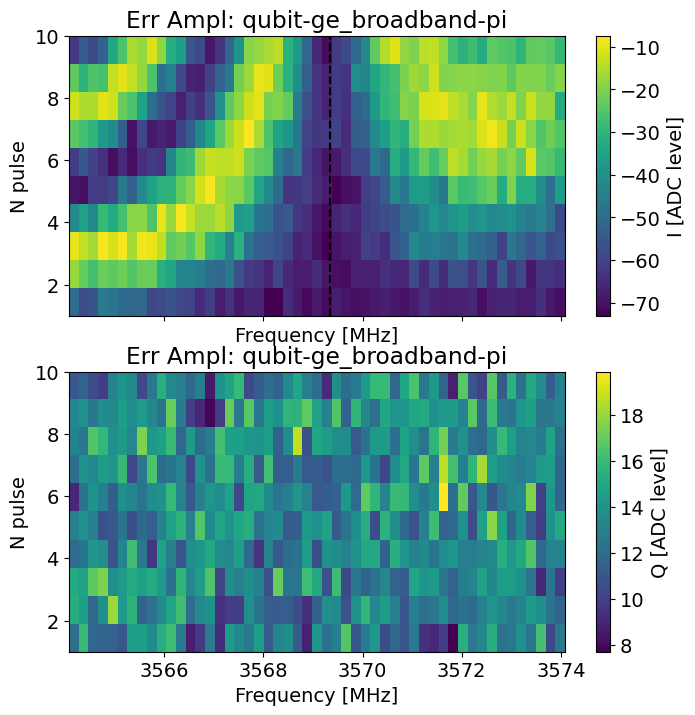

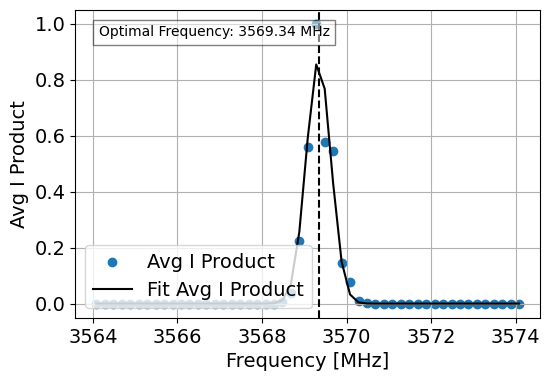

current broadband frequency: 3569.082846 MHz
N=0 fitted frequency: 3569.337553 +/- 0.011805 MHz


In [8]:
center = float(bb.frequency[0])
band = 5.0 
expts = 51

bb_freq_error_amp = broadband_error_amp_runner.execute(
    parameter_to_test='frequency',
    start=center - band,
    step=2 * band / (expts - 1),
    expts=expts,
    reps=50,
    n_pulses=10,
    pulse_type=['qubit', 'ge_broadband', 'pi', 0],
    postprocess=False,
    show=False,
    log=True,  
)

x = np.asarray(bb_freq_error_amp.data['x_pts'], dtype=float)
y = np.asarray(bb_freq_error_amp.data['prod_avgi'], dtype=float)

p, pcov = fitter.fitgaussian(x, y, periodic=False)
best_frequency = float(p[2])
best_frequency_err = float(np.sqrt(np.diag(pcov))[2])

bb_freq_error_amp.data['fit_avgi'] = p
bb_freq_error_amp.data['prod_avgi_fit'] = fitter.gaussianfunc(x, *p)
bb_freq_error_amp.data['fit_prod_avgi_err'] = np.sqrt(np.diag(pcov))

bb_freq_error_amp.display()
print(f'current broadband frequency: {center:.6f} MHz')
print(
    f'N=0 fitted frequency: {best_frequency:.6f} '
    f'+/- {best_frequency_err:.6f} MHz'
)

bb.frequency[0] = best_frequency

broadband gain scan: 21803 ... 27803 (step 240, limit 30000)
Job submitted: JOB-20260905-00176 (queue position: 1)

[0.0s] Job JOB-20260905-00176: pending

[2.9s] Job JOB-20260905-00176: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260905-00176_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 9/10 [00:30<00:03,  3.34s/it]
[36.6s] Job JOB-20260905-00176: completed
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:33<00:00,  3.34s/it]
Saving C:\experiments\260818_qsim_spectroscopy\data\JOB-20260905-00176_Error

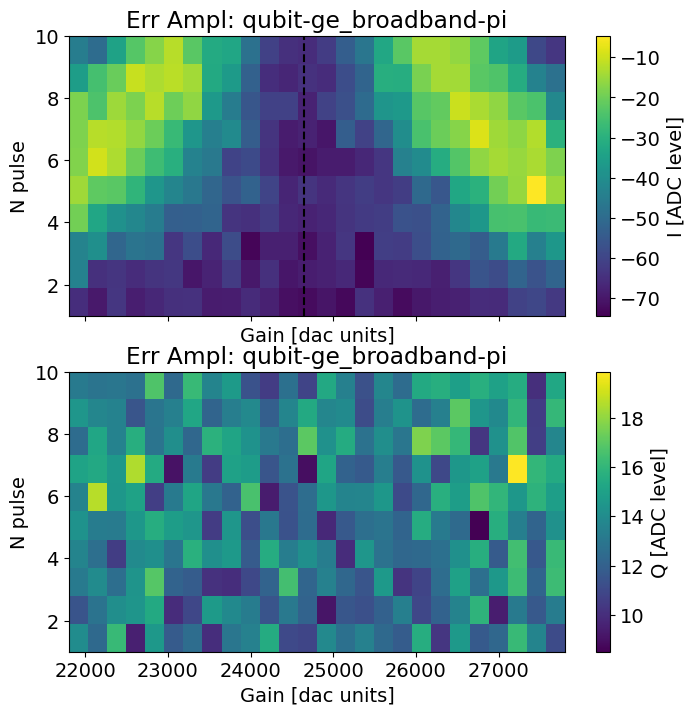

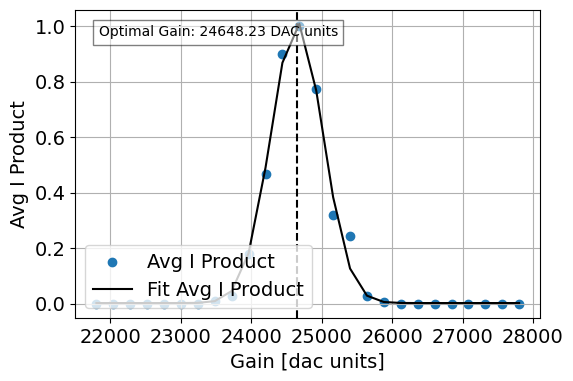

current broadband gain: 24803
N=0 fitted gain: 24648.2 +/- 9.4
capped integer gain candidate: 24648


In [9]:

gain_limit = broadband_gain_limit
gain_expts = 26
current_gain = int(round(float(bb.gain[0])))
gain_half_band = 3000

gain_width = 2 * gain_half_band
gain_start = max(
    0,
    min(current_gain - gain_half_band, gain_limit - gain_width),
)
gain_step = gain_width // (gain_expts - 1)
gain_stop = gain_start + gain_step * (gain_expts - 1)

print(
    f'broadband gain scan: {gain_start} ... {gain_stop} '
    f'(step {gain_step}, limit {gain_limit})'
)

bb_gain_error_amp = broadband_error_amp_runner.execute(
    parameter_to_test='gain',
    start=gain_start,
    step=gain_step,
    expts=gain_expts,
    reps=50,
    n_pulses=10,
    pulse_type=['qubit', 'ge_broadband', 'pi', 0],
    postprocess=False,
    show=False,
    log=False,  # refit below before displaying or logging
)

x_gain = np.asarray(bb_gain_error_amp.data['x_pts'], dtype=float)
y_gain = np.asarray(bb_gain_error_amp.data['prod_avgi'], dtype=float)

p_gain, pcov_gain = fitter.fitgaussian(
    x_gain, y_gain, periodic=False
)
fitted_gain = float(p_gain[2])
best_gain = int(round(np.clip(
    fitted_gain, gain_start, gain_stop
)))
best_gain_err = float(np.sqrt(np.diag(pcov_gain))[2])

bb_gain_error_amp.data['fit_avgi'] = p_gain
bb_gain_error_amp.data['prod_avgi_fit'] = fitter.gaussianfunc(
    x_gain, *p_gain
)
bb_gain_error_amp.data['fit_prod_avgi_err'] = np.sqrt(
    np.diag(pcov_gain)
)

bb_gain_error_amp.display()
print(f'current broadband gain: {current_gain}')
print(
    f'N=0 fitted gain: {fitted_gain:.1f} '
    f'+/- {best_gain_err:.1f}'
)
print(f'capped integer gain candidate: {best_gain}')

bb.gain[0] = best_gain

### Fine

Job submitted: JOB-20260905-00177 (queue position: 1)

[0.0s] Job JOB-20260905-00177: pending

[2.0s] Job JOB-20260905-00177: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260905-00177_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 9/10 [00:58<00:06,  6.48s/it]
[65.9s] Job JOB-20260905-00177: completed
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [01:04<00:00,  6.48s/it]
Saving C:\experiments\260818_qsim_spectroscopy\data\JOB-20260905-00177_ErrorAmplificationExperiment.h5
[WORKER] Saving expt object to: C:

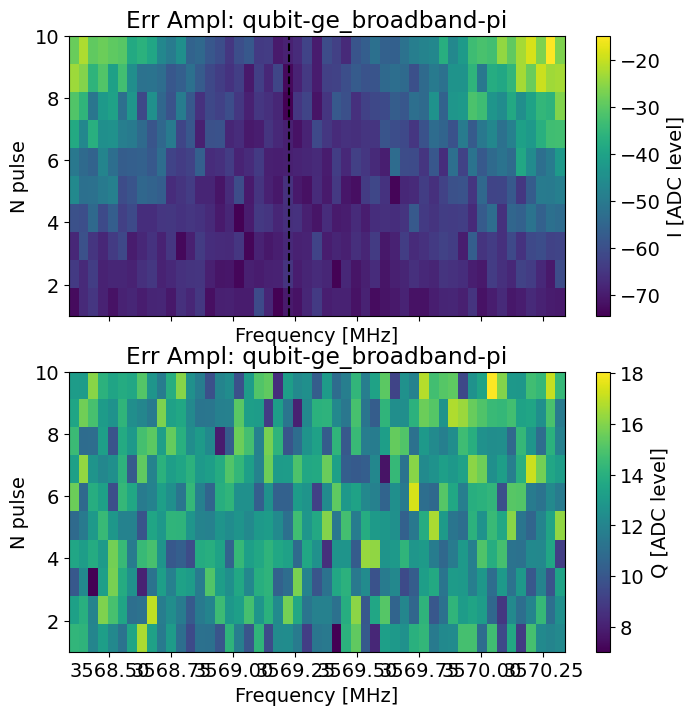

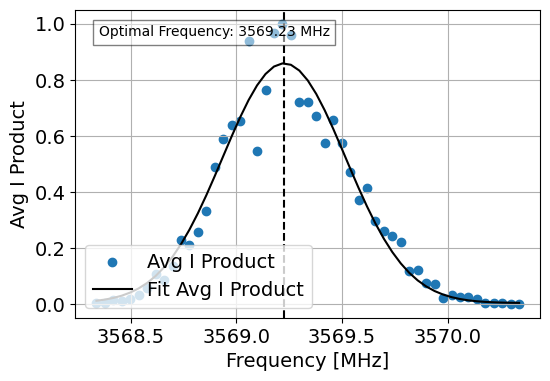

current broadband frequency: 3569.337553 MHz
N=0 fitted frequency: 3569.225474 +/- 0.009372 MHz


In [10]:
center = float(bb.frequency[0])
band = 1.0 
expts = 51

bb_freq_error_amp = broadband_error_amp_runner.execute(
    parameter_to_test='frequency',
    start=center - band,
    step=2 * band / (expts - 1),
    expts=expts,
    reps=50,
    n_pulses=10,
    pulse_type=['qubit', 'ge_broadband', 'pi', 0],
    postprocess=False,
    show=False,
    log=True,  
)

x = np.asarray(bb_freq_error_amp.data['x_pts'], dtype=float)
y = np.asarray(bb_freq_error_amp.data['prod_avgi'], dtype=float)

p, pcov = fitter.fitgaussian(x, y, periodic=False)
best_frequency = float(p[2])
best_frequency_err = float(np.sqrt(np.diag(pcov))[2])

bb_freq_error_amp.data['fit_avgi'] = p
bb_freq_error_amp.data['prod_avgi_fit'] = fitter.gaussianfunc(x, *p)
bb_freq_error_amp.data['fit_prod_avgi_err'] = np.sqrt(np.diag(pcov))

bb_freq_error_amp.display()
print(f'current broadband frequency: {center:.6f} MHz')
print(
    f'N=0 fitted frequency: {best_frequency:.6f} '
    f'+/- {best_frequency_err:.6f} MHz'
)

bb.frequency[0] = best_frequency

broadband gain scan: 23148 ... 26148 (step 120, limit 30000)
Job submitted: JOB-20260905-00178 (queue position: 1)

[0.0s] Job JOB-20260905-00178: pending

[2.8s] Job JOB-20260905-00178: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260905-00178_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 9/10 [00:30<00:03,  3.35s/it]
[34.9s] Job JOB-20260905-00178: completed
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:33<00:00,  3.35s/it]
Saving C:\experiments\260818_qsim_spectroscopy\data\JOB-20260905-00178_Error

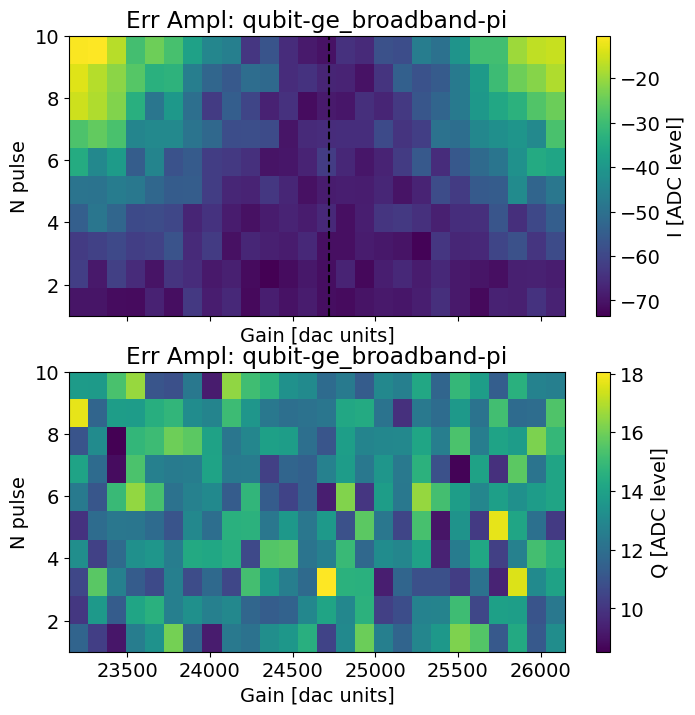

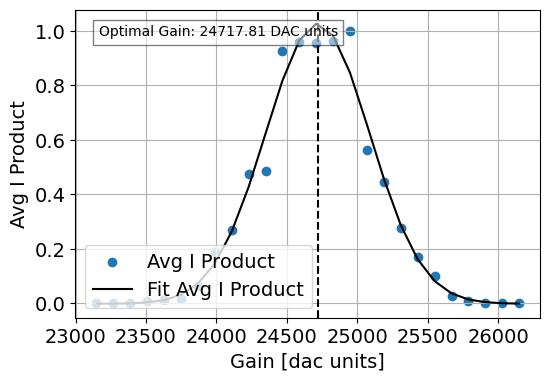

current broadband gain: 24648
N=0 fitted gain: 24717.8 +/- 12.6
capped integer gain candidate: 24718


In [11]:
gain_limit = broadband_gain_limit
gain_expts = 26
current_gain = int(round(float(bb.gain[0])))
gain_half_band = 1500

gain_width = 2 * gain_half_band
gain_start = max(
    0,
    min(current_gain - gain_half_band, gain_limit - gain_width),
)
gain_step = gain_width // (gain_expts - 1)
gain_stop = gain_start + gain_step * (gain_expts - 1)

print(
    f'broadband gain scan: {gain_start} ... {gain_stop} '
    f'(step {gain_step}, limit {gain_limit})'
)

bb_gain_error_amp = broadband_error_amp_runner.execute(
    parameter_to_test='gain',
    start=gain_start,
    step=gain_step,
    expts=gain_expts,
    reps=50,
    n_pulses=10,
    pulse_type=['qubit', 'ge_broadband', 'pi', 0],
    postprocess=False,
    show=False,
    log=True,  # refit below before displaying or logging
)

x_gain = np.asarray(bb_gain_error_amp.data['x_pts'], dtype=float)
y_gain = np.asarray(bb_gain_error_amp.data['prod_avgi'], dtype=float)

p_gain, pcov_gain = fitter.fitgaussian(
    x_gain, y_gain, periodic=False
)
fitted_gain = float(p_gain[2])
best_gain = int(round(np.clip(
    fitted_gain, gain_start, gain_stop
)))
best_gain_err = float(np.sqrt(np.diag(pcov_gain))[2])

bb_gain_error_amp.data['fit_avgi'] = p_gain
bb_gain_error_amp.data['prod_avgi_fit'] = fitter.gaussianfunc(
    x_gain, *p_gain
)
bb_gain_error_amp.data['fit_prod_avgi_err'] = np.sqrt(
    np.diag(pcov_gain)
)

bb_gain_error_amp.display()
print(f'current broadband gain: {current_gain}')
print(
    f'N=0 fitted gain: {fitted_gain:.1f} '
    f'+/- {best_gain_err:.1f}'
)
print(f'capped integer gain candidate: {best_gain}')

bb.gain[0] = best_gain

In [ ]:
station.update_all_station_snapshots()

## Validation

In [ ]:
# Exact-path validation
# case 0: |g,n> reference
# case 1: |e,n> reference
# case 2: |g,n> --pi_ge_broadband--> |e,n>
# case 3: |e,n> --pi_ge_broadband--> |g,n>
broadband_validation_cases = [0, 1, 2, 3]

broadband_validation_defaults = AttrDict(dict(
    expts=1,
    reps=500,
    rounds=1,
    qubits=[0],
    swept_params=['validation_photon_number', 'validation_case'],
    validation_photon_numbers=photon_numbers,
    validation_cases=broadband_validation_cases,
    validation_photon_number=0,
    validation_case=0,
    active_reset=False,
    pre_relax_delay=0,
    relax_delay=2500,
    normalize=False,
    perform_wigner=False,
    dedupe_waveforms=True,
    prepulse=False,
    postpulse=False,
    init_stor=0,
    ro_stor=0,
))

broadband_validation_runner = CharacterizationRunner(
    station=station,
    ExptClass=DarkBaseExperiment,
    ExptProgram=BroadbandGeValidationProgram,
    default_expt_cfg=broadband_validation_defaults,
    job_client=client,
)

In [ ]:
# Execute and inspect the configured ['qubit', 'ge_broadband', 'pi', phase]
broadband_validation = broadband_validation_runner.execute(
    reps=500,
    show=False,
    log=True,
)

validation_iq = (
    np.asarray(broadband_validation.data['avgi'], dtype=float) +
    1j * np.asarray(broadband_validation.data['avgq'], dtype=float)
).reshape(len(photon_numbers), len(broadband_validation_cases))

validation_transfer = np.zeros((len(photon_numbers), 2))
for row, photon_number in enumerate(photon_numbers):
    z_g, z_e, z_g_to_e, z_e_to_g = validation_iq[row]
    readout_axis = z_e - z_g

    validation_transfer[row, 0] = np.real(
        (z_g_to_e - z_g) * np.conj(readout_axis)
    ) / abs(readout_axis)**2
    validation_transfer[row, 1] = 1 - np.real(
        (z_e_to_g - z_g) * np.conj(readout_axis)
    ) / abs(readout_axis)**2

plt.figure(figsize=(7, 4))
plt.plot(photon_numbers, validation_transfer[:, 0], 'o-', label='g to e')
plt.plot(photon_numbers, validation_transfer[:, 1], 'o--', label='e to g')
plt.axhline(1, color='0.7')
plt.xlabel('manipulate photon number')
plt.ylabel('population-transfer coordinate')
plt.xticks(photon_numbers)
plt.ylim(-0.1, 1.1)
plt.legend()
plt.show()

for row, photon_number in enumerate(photon_numbers):
    print(
        f'N={photon_number}: '
        f'g->e={validation_transfer[row, 0]:.4f}, '
        f'e->g={validation_transfer[row, 1]:.4f}'
    )

In [ ]:
station.update_all_station_snapshots()

# N-photon M1-storage full-swap calibration

This section calibrates one direct \( |N,0\rangle \leftrightarrow |0,N\rangle \) M1-storage swap at a time. The N=1 row remains M1-Sj; additional rows are named M1-Sj@N2, M1-Sj@N3, and so on.

Run the cells in order. Measurement cells do not update ds_storage. A result is written only by the separate accept cell after its plot, and the snapshot is a separate final action.


## 1. Select and initialize one row

Choose one storage mode and one photon number. A missing @N row is copied from the legacy N=1 row. For an existing row, list only the fields to reset; leave the tuple empty to preserve it.


In [ ]:
import importlib
from copy import deepcopy

import numpy as np
import matplotlib.pyplot as plt
from slab import AttrDict

from experiments.characterization_runner import CharacterizationRunner
from experiments.sweep_runner import SweepRunner
from experiments.MM_dual_rail_base import MM_dual_rail_base
from experiments.single_qubit import error_amplification
from experiments.single_qubit.sideband_general import SidebandGeneralExperiment
from fitting.fit_display_classes import ChevronFitting

importlib.reload(error_amplification)
ErrorAmplificationExperiment = error_amplification.ErrorAmplificationExperiment

multiphoton_swap_storage_mode = 2
multiphoton_swap_photon_number = 2
if multiphoton_swap_photon_number < 1:
    raise ValueError('multiphoton_swap_photon_number must be at least one')
multiphoton_swap_gain_limit = 30000
multiphoton_swap_storage_wait_us = 0.2
# Start conservatively: the legacy storage active-reset pulse is only N=1 calibrated.
# Enable active reset only after verifying that it empties the N-photon residue.
multiphoton_swap_active_reset = False
multiphoton_swap_relax_delay_us = 2500.0

# Choose from: 'freq', 'precision', 'pi', 'h_pi', 'gain'.
# Example: ('freq', 'pi', 'h_pi')
multiphoton_swap_reset_fields = ()

multiphoton_swap_base_name = f'M1-S{multiphoton_swap_storage_mode}'
multiphoton_swap_pulse_name = station.ds_storage.multiphoton_swap_name(
    multiphoton_swap_base_name, multiphoton_swap_photon_number
)

if not station.ds_storage.has_row(multiphoton_swap_pulse_name):
    station.ds_storage.initialize_multiphoton_swap(
        multiphoton_swap_base_name, multiphoton_swap_photon_number
    )
    print('initialized missing row from', multiphoton_swap_base_name)
elif multiphoton_swap_reset_fields:
    station.ds_storage.initialize_multiphoton_swap(
        multiphoton_swap_base_name,
        multiphoton_swap_photon_number,
        overwrite=True,
        fields=multiphoton_swap_reset_fields,
    )
    print('reset fields:', multiphoton_swap_reset_fields)
else:
    print('preserving existing row')

print('calibrating:', multiphoton_swap_pulse_name)
print('frequency:', station.ds_storage.get_freq(multiphoton_swap_pulse_name), 'MHz')
print('gain:', station.ds_storage.get_gain(multiphoton_swap_pulse_name))
print('pi length:', station.ds_storage.get_pi(multiphoton_swap_pulse_name), 'us')


## 2. State preparation and endpoint decoder

The Chevron and error amplification use the same preparation. The decoder uses only the top two transitions,

\[
f_{N-1}\leftrightarrow g_N,\qquad e_{N-1}\leftrightarrow f_{N-1},
\]

so only an exact return to \( |g,N\rangle \) is marked bright. Lower M1 occupations remain dark instead of being mistaken for a successful return.


In [ ]:
multiphoton_swap_prep_descriptions = [
    ['qubit', 'ge', 'pi', 0.0],
    ['qubit', 'ef', 'pi', 0.0],
    ['man', 'M1', 'pi', 0.0],
]
for n in range(1, multiphoton_swap_photon_number):
    multiphoton_swap_prep_descriptions += [
        ['multiphoton', f'g{n}-e{n}', 'pi', 0.0],
        ['multiphoton', f'e{n}-f{n}', 'pi', 0.0],
        ['multiphoton', f'f{n}-g{n + 1}', 'pi', 0.0],
    ]

# ErrorAmplificationProgram already supplies the first three storage-prep pulses.
multiphoton_swap_extra_prep = multiphoton_swap_prep_descriptions[3:]

n_top = multiphoton_swap_photon_number - 1
multiphoton_swap_endpoint_decoder_descriptions = [
    ['multiphoton', f'f{n_top}-g{n_top + 1}', 'pi', 0.0],
    ['multiphoton', f'e{n_top}-f{n_top}', 'pi', 0.0],
]

pulse_builder = MM_dual_rail_base(station.hardware_cfg, soccfg=station.soccfg)
multiphoton_swap_prep_pulse = pulse_builder.get_prepulse_creator(
    multiphoton_swap_prep_descriptions
).pulse.tolist()
multiphoton_swap_endpoint_decoder = pulse_builder.get_prepulse_creator(
    multiphoton_swap_endpoint_decoder_descriptions
).pulse.tolist()

print('preparation:')
for pulse in multiphoton_swap_prep_descriptions:
    print(' ', pulse)
print('endpoint decoder:')
for pulse in multiphoton_swap_endpoint_decoder_descriptions:
    print(' ', pulse)


## 3. Frequency-length Chevron

This is the same SidebandGeneralExperiment and SweepRunner flow used by the ordinary M1-storage calibration. The length sweep includes a true zero-pulse reference.


In [ ]:
chevron_frequency_span_MHz = 0.40
chevron_frequency_points = 25
chevron_length_points = 41
chevron_length_stop_us = 2.2 * station.ds_storage.get_pi(multiphoton_swap_pulse_name)
chevron_gain = station.ds_storage.get_gain(multiphoton_swap_pulse_name)
chevron_reps = 100

chevron_center_MHz = float(station.ds_storage.get_freq(multiphoton_swap_pulse_name))
chevron_channel = 'low' if chevron_center_MHz < 1800 else 'high'

multiphoton_swap_chevron_defaults = AttrDict(dict(
    start=0.0,
    step=chevron_length_stop_us / (chevron_length_points - 1),
    expts=chevron_length_points,
    reps=chevron_reps,
    rounds=1,
    qubit=0,
    qubits=[0],
    flux_drive=[chevron_channel, chevron_center_MHz, chevron_gain, 0.0],
    length_placeholder=0.0,
    prepulse=True,
    pre_sweep_pulse=multiphoton_swap_prep_pulse,
    postpulse=True,
    post_sweep_pulse=multiphoton_swap_endpoint_decoder,
    update_post_pulse_phase=[False, 0.0],
    active_reset=multiphoton_swap_active_reset,
    man_reset=True,
    storage_reset=[multiphoton_swap_storage_mode],
    reset_dump_mode=active_reset_default_dict['reset_dump_mode'],
    dump_reset_iter_num=active_reset_default_dict['dump_reset_iter_num'],
    relax_delay=multiphoton_swap_relax_delay_us,
))

multiphoton_swap_chevron_runner = SweepRunner(
    station=station,
    ExptClass=SidebandGeneralExperiment,
    default_expt_cfg=multiphoton_swap_chevron_defaults,
    sweep_param='freq',
    postprocessor=None,
    job_client=client,
)


In [ ]:
multiphoton_swap_chevron = multiphoton_swap_chevron_runner.execute(
    sweep_start=chevron_center_MHz - chevron_frequency_span_MHz / 2,
    sweep_stop=chevron_center_MHz + chevron_frequency_span_MHz / 2,
    sweep_npts=chevron_frequency_points,
    gain=chevron_gain,
    batch=True,
    show=False,
    log=True,
)
print('jobs:', multiphoton_swap_chevron_runner.last_job_ids)


In [ ]:
chevron_time = np.asarray(multiphoton_swap_chevron.data['xpts'], dtype=float)
if chevron_time.ndim > 1:
    chevron_time = chevron_time[0]

multiphoton_swap_chevron_analysis = ChevronFitting(
    frequencies=np.asarray(multiphoton_swap_chevron.data['freq_sweep'], dtype=float),
    time=chevron_time,
    response_matrix=np.asarray(multiphoton_swap_chevron.data['avgi'], dtype=float),
    config=station.hardware_cfg,
    station=station,
)
multiphoton_swap_chevron_analysis.analyze()
multiphoton_swap_chevron_analysis.display_results(title=multiphoton_swap_chevron.fname)

chevron_frequency_candidate_MHz = float(
    multiphoton_swap_chevron_analysis.results['best_frequency_contrast']
)
chevron_pi_candidate_us = abs(
    np.pi / multiphoton_swap_chevron_analysis.results['best_fit_params_period']['omega']
)
print('Chevron candidate:', chevron_frequency_candidate_MHz, 'MHz,', chevron_pi_candidate_us, 'us')
print('Inspect the plot before running the accept cell.')


### Accept the Chevron result

Edit the two assignments if the fit selected the wrong branch. This is the first cell that changes the in-memory row.


In [ ]:
selected_frequency_MHz = chevron_frequency_candidate_MHz
selected_pi_us = chevron_pi_candidate_us

station.ds_storage.update_freq(multiphoton_swap_pulse_name, selected_frequency_MHz)
station.ds_storage.update_pi(multiphoton_swap_pulse_name, selected_pi_us)
station.ds_storage.update_h_pi(multiphoton_swap_pulse_name, selected_pi_us / 2)
station.ds_storage.update_gain(multiphoton_swap_pulse_name, chevron_gain)
station.ds_storage.update_precision(
    multiphoton_swap_pulse_name,
    chevron_frequency_span_MHz / (chevron_frequency_points - 1),
)
print('accepted Chevron values for', multiphoton_swap_pulse_name)


## 4. Error amplification

Every depth uses an even number of physical swaps. The depth-zero row is an in-situ preparation/readout reference. The plotted score is the mean IQ distance from that row, and measurement cells only print a candidate.


In [ ]:
storage_wait_cycles = int(station.soccfg.us2cycles(multiphoton_swap_storage_wait_us))

multiphoton_swap_error_amp_defaults = AttrDict(dict(
    reps=75,
    rounds=1,
    qubit=0,
    qubits=[0],
    n_start=0,
    n_step=1,
    n_pulses=6,
    active_reset=multiphoton_swap_active_reset,
    man_mode_no=1,
    man_reset=True,
    storage_reset=[multiphoton_swap_storage_mode],
    reset_dump_mode=active_reset_default_dict['reset_dump_mode'],
    dump_reset_iter_num=active_reset_default_dict['dump_reset_iter_num'],
    relax_delay=multiphoton_swap_relax_delay_us,
    expts=31,
    parameter_to_test='frequency',
    pulse_type=['storage', multiphoton_swap_pulse_name, 'pi', 0.0],
    pre_sweep_pulse=multiphoton_swap_extra_prep,
    post_sweep_pulse=multiphoton_swap_endpoint_decoder_descriptions,
    floquet_sync_delay=storage_wait_cycles,
))

multiphoton_swap_error_amp_runner = CharacterizationRunner(
    station=station,
    ExptClass=ErrorAmplificationExperiment,
    default_expt_cfg=multiphoton_swap_error_amp_defaults,
    job_client=client,
    use_queue=True,
    show=False,
)


### 4-1. Coarse frequency


In [ ]:
coarse_frequency_center_MHz = float(station.ds_storage.get_freq(multiphoton_swap_pulse_name))
coarse_frequency_half_span_MHz = 0.10
coarse_frequency_points = 31

multiphoton_swap_coarse_frequency = multiphoton_swap_error_amp_runner.execute(
    parameter_to_test='frequency',
    start=coarse_frequency_center_MHz - coarse_frequency_half_span_MHz,
    step=2 * coarse_frequency_half_span_MHz / (coarse_frequency_points - 1),
    expts=coarse_frequency_points,
    n_start=0,
    n_step=1,
    n_pulses=6,
    reps=75,
    postprocess=False,
    show=False,
    log=True,
)
multiphoton_swap_coarse_frequency.display(fit=False)

x = np.asarray(multiphoton_swap_coarse_frequency.data['x_pts'], dtype=float)
z = (
    np.asarray(multiphoton_swap_coarse_frequency.data['avgi'], dtype=float)
    + 1j * np.asarray(multiphoton_swap_coarse_frequency.data['avgq'], dtype=float)
)
return_error = np.mean(np.abs(z[1:] - z[0])**2, axis=0)
coarse_frequency_candidate_MHz = float(x[np.argmin(return_error)])

plt.figure(figsize=(6, 3.5))
plt.plot(x, return_error, 'o-')
plt.axvline(coarse_frequency_candidate_MHz, color='black', linestyle='--')
plt.xlabel('frequency (MHz)')
plt.ylabel('mean return IQ error')
plt.title('coarse frequency; inspect before accepting')
plt.grid()
plt.show()
print('coarse frequency candidate:', coarse_frequency_candidate_MHz, 'MHz')


In [ ]:
selected_frequency_MHz = coarse_frequency_candidate_MHz
station.ds_storage.update_freq(multiphoton_swap_pulse_name, selected_frequency_MHz)
station.ds_storage.update_precision(
    multiphoton_swap_pulse_name,
    2 * coarse_frequency_half_span_MHz / (coarse_frequency_points - 1),
)
print('accepted coarse frequency:', selected_frequency_MHz)


### 4-2. Coarse gain

Set an even half-span and step. The last point is capped at 30000 because the flat-top program also uses a half-gain register.


In [ ]:
coarse_gain_center = station.ds_storage.get_gain(multiphoton_swap_pulse_name)
coarse_gain_half_span = 2000
coarse_gain_step = 200

coarse_gain_start = max(0, 2 * round((coarse_gain_center - coarse_gain_half_span) / 2))
coarse_gain_stop = min(
    multiphoton_swap_gain_limit,
    2 * round((coarse_gain_center + coarse_gain_half_span) / 2),
)
coarse_gain_points = (coarse_gain_stop - coarse_gain_start) // coarse_gain_step + 1
coarse_gain_stop = coarse_gain_start + coarse_gain_step * (coarse_gain_points - 1)
print('coarse gain sweep:', coarse_gain_start, '...', coarse_gain_stop, 'step', coarse_gain_step)

multiphoton_swap_coarse_gain = multiphoton_swap_error_amp_runner.execute(
    parameter_to_test='gain',
    start=coarse_gain_start,
    step=coarse_gain_step,
    expts=coarse_gain_points,
    n_start=0,
    n_step=1,
    n_pulses=6,
    reps=75,
    postprocess=False,
    show=False,
    log=True,
)
multiphoton_swap_coarse_gain.display(fit=False)

x = np.asarray(multiphoton_swap_coarse_gain.data['x_pts'], dtype=float)
z = (
    np.asarray(multiphoton_swap_coarse_gain.data['avgi'], dtype=float)
    + 1j * np.asarray(multiphoton_swap_coarse_gain.data['avgq'], dtype=float)
)
return_error = np.mean(np.abs(z[1:] - z[0])**2, axis=0)
coarse_gain_candidate = int(x[np.argmin(return_error)])

plt.figure(figsize=(6, 3.5))
plt.plot(x, return_error, 'o-')
plt.axvline(coarse_gain_candidate, color='black', linestyle='--')
plt.xlabel('gain')
plt.ylabel('mean return IQ error')
plt.title('coarse gain; inspect before accepting')
plt.grid()
plt.show()
print('coarse gain candidate:', coarse_gain_candidate)


In [ ]:
selected_gain = int(np.clip(coarse_gain_candidate, 0, multiphoton_swap_gain_limit))
station.ds_storage.update_gain(multiphoton_swap_pulse_name, selected_gain)
print('accepted coarse gain:', selected_gain)


### 4-3. Fine gain


In [ ]:
fine_gain_center = station.ds_storage.get_gain(multiphoton_swap_pulse_name)
fine_gain_half_span = 600
fine_gain_step = 40

fine_gain_start = max(0, 2 * round((fine_gain_center - fine_gain_half_span) / 2))
fine_gain_stop = min(
    multiphoton_swap_gain_limit,
    2 * round((fine_gain_center + fine_gain_half_span) / 2),
)
fine_gain_points = (fine_gain_stop - fine_gain_start) // fine_gain_step + 1
fine_gain_stop = fine_gain_start + fine_gain_step * (fine_gain_points - 1)
print('fine gain sweep:', fine_gain_start, '...', fine_gain_stop, 'step', fine_gain_step)

multiphoton_swap_fine_gain = multiphoton_swap_error_amp_runner.execute(
    parameter_to_test='gain',
    start=fine_gain_start,
    step=fine_gain_step,
    expts=fine_gain_points,
    n_start=0,
    n_step=1,
    n_pulses=10,
    reps=100,
    postprocess=False,
    show=False,
    log=True,
)
multiphoton_swap_fine_gain.display(fit=False)

x = np.asarray(multiphoton_swap_fine_gain.data['x_pts'], dtype=float)
z = (
    np.asarray(multiphoton_swap_fine_gain.data['avgi'], dtype=float)
    + 1j * np.asarray(multiphoton_swap_fine_gain.data['avgq'], dtype=float)
)
return_error = np.mean(np.abs(z[1:] - z[0])**2, axis=0)
fine_gain_candidate = int(x[np.argmin(return_error)])

plt.figure(figsize=(6, 3.5))
plt.plot(x, return_error, 'o-')
plt.axvline(fine_gain_candidate, color='black', linestyle='--')
plt.xlabel('gain')
plt.ylabel('mean return IQ error')
plt.title('fine gain; inspect before accepting')
plt.grid()
plt.show()
print('fine gain candidate:', fine_gain_candidate)


In [ ]:
selected_gain = int(np.clip(fine_gain_candidate, 0, multiphoton_swap_gain_limit))
station.ds_storage.update_gain(multiphoton_swap_pulse_name, selected_gain)
print('accepted fine gain:', selected_gain)


### 4-4. Fine frequency


In [ ]:
fine_frequency_center_MHz = float(station.ds_storage.get_freq(multiphoton_swap_pulse_name))
fine_frequency_half_span_MHz = 0.02
fine_frequency_points = 31

multiphoton_swap_fine_frequency = multiphoton_swap_error_amp_runner.execute(
    parameter_to_test='frequency',
    start=fine_frequency_center_MHz - fine_frequency_half_span_MHz,
    step=2 * fine_frequency_half_span_MHz / (fine_frequency_points - 1),
    expts=fine_frequency_points,
    n_start=0,
    n_step=1,
    n_pulses=10,
    reps=100,
    postprocess=False,
    show=False,
    log=True,
)
multiphoton_swap_fine_frequency.display(fit=False)

x = np.asarray(multiphoton_swap_fine_frequency.data['x_pts'], dtype=float)
z = (
    np.asarray(multiphoton_swap_fine_frequency.data['avgi'], dtype=float)
    + 1j * np.asarray(multiphoton_swap_fine_frequency.data['avgq'], dtype=float)
)
return_error = np.mean(np.abs(z[1:] - z[0])**2, axis=0)
fine_frequency_candidate_MHz = float(x[np.argmin(return_error)])

plt.figure(figsize=(6, 3.5))
plt.plot(x, return_error, 'o-')
plt.axvline(fine_frequency_candidate_MHz, color='black', linestyle='--')
plt.xlabel('frequency (MHz)')
plt.ylabel('mean return IQ error')
plt.title('fine frequency; inspect before accepting')
plt.grid()
plt.show()
print('fine frequency candidate:', fine_frequency_candidate_MHz, 'MHz')


In [ ]:
selected_frequency_MHz = fine_frequency_candidate_MHz
station.ds_storage.update_freq(multiphoton_swap_pulse_name, selected_frequency_MHz)
station.ds_storage.update_precision(
    multiphoton_swap_pulse_name,
    2 * fine_frequency_half_span_MHz / (fine_frequency_points - 1),
)
print('accepted fine frequency:', selected_frequency_MHz)


## 5. Validation

The odd check compares zero and one swap: the endpoint marker should change from bright to dark. The even check compares zero and two swaps: the endpoint marker should return to the same IQ point. Together they distinguish coherent transfer from simple photon loss.


In [ ]:
validation_frequency_MHz = float(station.ds_storage.get_freq(multiphoton_swap_pulse_name))
validation_gain = station.ds_storage.get_gain(multiphoton_swap_pulse_name)
validation_pi_us = float(station.ds_storage.get_pi(multiphoton_swap_pulse_name))

odd_validation_defaults = deepcopy(multiphoton_swap_chevron_defaults)
odd_validation_defaults.update(dict(
    start=0.0,
    step=validation_pi_us,
    expts=2,
    reps=300,
    flux_drive=[
        'low' if validation_frequency_MHz < 1800 else 'high',
        validation_frequency_MHz,
        validation_gain,
        0.0,
    ],
))

odd_validation_runner = CharacterizationRunner(
    station=station,
    ExptClass=SidebandGeneralExperiment,
    default_expt_cfg=odd_validation_defaults,
    job_client=client,
    show=False,
)
multiphoton_swap_odd_validation = odd_validation_runner.execute(
    postprocess=False, show=False, log=True
)

odd_z = (
    np.asarray(multiphoton_swap_odd_validation.data['avgi'], dtype=float).reshape(-1)
    + 1j * np.asarray(multiphoton_swap_odd_validation.data['avgq'], dtype=float).reshape(-1)
)
plt.figure(figsize=(5, 4))
plt.plot(odd_z.real, odd_z.imag, 'o-')
for label, value in zip(('zero swaps', 'one swap'), odd_z):
    plt.annotate(label, (value.real, value.imag))
plt.xlabel('I')
plt.ylabel('Q')
plt.title(f'{multiphoton_swap_pulse_name}: odd-swap validation')
plt.grid()
plt.show()
print('zero-to-one-swap IQ separation:', abs(odd_z[1] - odd_z[0]))


In [ ]:
multiphoton_swap_even_validation = multiphoton_swap_error_amp_runner.execute(
    parameter_to_test='frequency',
    start=validation_frequency_MHz,
    step=0.0,
    expts=1,
    n_start=0,
    n_step=1,
    n_pulses=1,
    reps=300,
    postprocess=False,
    show=False,
    log=True,
)

even_z = (
    np.asarray(multiphoton_swap_even_validation.data['avgi'], dtype=float).reshape(-1)
    + 1j * np.asarray(multiphoton_swap_even_validation.data['avgq'], dtype=float).reshape(-1)
)
plt.figure(figsize=(5, 4))
plt.plot(even_z.real, even_z.imag, 'o-')
for label, value in zip(('zero swaps', 'two swaps'), even_z):
    plt.annotate(label, (value.real, value.imag))
plt.xlabel('I')
plt.ylabel('Q')
plt.title(f'{multiphoton_swap_pulse_name}: even-return validation')
plt.grid()
plt.show()
print('zero-to-two-swap IQ error:', abs(even_z[1] - even_z[0]))


## 6. Save the accepted row

Run this only after inspecting both validation plots. The production flag stays False until it is changed explicitly in measurement_config_default_dict. After enabling it, rerun the exact-path phase calibration.


In [ ]:
multiphoton_swap_snapshot_id = station.snapshot_man1_storage_swap(update_main=False)
print('saved non-main ds_storage snapshot:', multiphoton_swap_snapshot_id)
print('production flag:', measurement_config_default_dict['use_multiphoton_swap'])


# Calling Floquet parameter helper and optional resetting

In [12]:
# Review first. Nothing is written to YAML by the cells above.
station.preview_config_update()

# Save a new non-main hardware config only after the plots look acceptable.
# broadband_config_id = station.snapshot_hardware_config(update_main=False)
# print(broadband_config_id)
#
# Put the returned CFG-HW-... in config_dict at the top after restarting.
# Only make it the main config intentionally:
# station.snapshot_hardware_config(update_main=True)

Comparing configurations:
Parent config file: C:\python\multimode_expts\configs\versions\hardware_config\CFG-HW-20260904-00038.yml
Key 'device.qubit.pulses.pi_ge_broadband.frequency' differs:
  Old value (config1): [3569.082846496114]
  New value (config2): [3569.2254739783066]
Key 'device.qubit.pulses.pi_ge_broadband.gain' differs:
  Old value (config1): [24803]
  New value (config2): [24718]


In [13]:
from experiments.MM_dual_rail_base import MM_dual_rail_base

def get_floquet_parameters(station, man_mode_no, stor_mode_no):
    """
    Get pulse parameters for a given storage mode. 
    Also returns prepulse and postpulse (single photon prep and meas for ge meas)

    Args:
        station: MultimodeStation object for managing frequency data.
        man_mode_no: Manipulation mode number.
        stor_mode_no: Storage mode number.

    Returns:
        A tuple containing freq, gain, ch, prepulse, and postpulse.
    """
    stor_name = 'M' + str(man_mode_no) + '-S' + str(stor_mode_no)
    freq = station.ds_floquet.get_freq(stor_name)
    gain = station.ds_floquet.get_gain(stor_name)
    length = station.ds_floquet.get_len(stor_name)
    pi_frac = station.ds_floquet.get_pi_frac(stor_name)
    ch = 'low' if freq < 1000 else 'high'

    mm_base_dummy = MM_dual_rail_base(station.hardware_cfg, station.soccfg)
    prep_man_pi = mm_base_dummy.prep_man_photon(man_mode_no)
    prepulse = mm_base_dummy.get_prepulse_creator(prep_man_pi).pulse.tolist()
    postpulse = mm_base_dummy.get_prepulse_creator(prep_man_pi[-1:-3:-1]).pulse.tolist() # for ge meas, only do f0g1 and ef pi

    return freq, gain, length, pi_frac, ch, prepulse, postpulse


## Datset for Sidebands

In [14]:
# True reinitializes frequency/gain from ds_storage; False keeps the calibrated dataset.
RESET_FLOQUET_DATASET = True
WAVEFORM_TO_USE = 'preload_flattop'  # 'gauss' keeps the original Gaussian initialization.

# Requested envelope lengths below are quantized to DAC clocks; the next cell includes sync timing too.
preload_flat_length_us = 0.037
preload_ramp_sigma_us = 0.002
preload_pi_frac = 40

if RESET_FLOQUET_DATASET:
    if WAVEFORM_TO_USE == 'gauss':
        station.ds_floquet.import_from_swap_dataset(
            station.ds_storage, gain_div=1, pi_div=40)
        for i in range(7):
            station.ds_floquet.update_gauss_n_sigma(f"M1-S{i+1}", 4)
            station.ds_floquet.update_waveform(f"M1-S{i+1}", 'gauss')
            station.ds_floquet.update_gauss_sigma(f"M1-S{i+1}", 0.02)
    elif WAVEFORM_TO_USE == 'preload_flattop':
        station.ds_floquet.import_from_swap_dataset(
            station.ds_storage, gain_div=1, pi_div=preload_pi_frac)
        for i in range(7):
            station.ds_floquet.update_waveform(f"M1-S{i+1}", 'preload_flattop')
            station.ds_floquet.update_len(f"M1-S{i+1}", preload_flat_length_us)
            station.ds_floquet.update_ramp_sigma(f"M1-S{i+1}", preload_ramp_sigma_us)
    else:
        raise ValueError("WAVEFORM_TO_USE must be 'gauss' or 'preload_flattop'")

# Keep copied experiment defaults consistent; None uses the saved dataset when not resetting.
floquet_default_dict["floquet_waveform"] = WAVEFORM_TO_USE if RESET_FLOQUET_DATASET else None
# station.snapshot_floquet_storage_swap(update_main=False)

In [15]:
import importlib
from experiments.qsim import floquet_dark_mode_readout
importlib.reload(floquet_dark_mode_readout)

TROTTER_MODES_IN_USE = [4, 5, 6, 7]  # Use the same modes as the intended scramble.
# Same DAC-envelope and integer tProc sync timing as the spectroscopy program.
floquet_timing = floquet_dark_mode_readout.EncodingHamiltonianSpectroscopyExperiment.hardware_parameters(
    station, TROTTER_MODES_IN_USE, floquet_default_dict['scramble_sync_cycles'],
    floquet_waveform=floquet_default_dict.get('floquet_waveform'),
)
floquet_cycle_us = floquet_timing.floquet_cycle_us
effective_g_kHz = (1000 * floquet_timing.couplings_MHz).tolist()
print(f"Modes: {TROTTER_MODES_IN_USE}; scheduled Floquet cycle: {floquet_cycle_us:.9f} us")
print("Clock-quantized effective g (kHz):", effective_g_kHz)

Modes: [4, 5, 6, 7]; scheduled Floquet cycle: 0.219637134 us
Clock-quantized effective g (kHz): [28.45602605863192, 28.45602605863192, 28.45602605863192, 28.45602605863192]


In [71]:
# Keep the legacy manual adjustment, but do not break the common preload envelope.
if station.ds_floquet.get_waveform('M1-S6') != 'preload_flattop':
    station.ds_floquet.update_len('M1-S6', 0.01)

station.ds_floquet.df


,stor_name,pi_frac,freq (MHz),gain (DAC units),len (mus),ramp_sigma (mus),phase_from_M1-S1 (deg),phase_from_M1-S2 (deg),phase_from_M1-S3 (deg),phase_from_M1-S4 (deg),phase_from_M1-S5 (deg),phase_from_M1-S6 (deg),phase_from_M1-S7 (deg),last_update,gauss_n_sigma,waveform,gauss_sigma (mus)
0,M1-S1,40,350.758735,5976,0.016,0.002,0.000000,1.348261,-0.714108,-1.185636,-5.540442,4.502922,7.525691,2026-09-05 03:03:53.700958,4.0,preload_flattop,0.02
1,M1-S2,40,522.615176,6018,0.016,0.002,-1.556715,0.000000,-2.279301,-2.728604,-6.962451,-25.715038,3.992331,2026-09-05 03:03:53.700958,4.0,preload_flattop,0.02
2,M1-S3,40,698.353962,5968,0.016,0.002,0.776382,2.388967,0.000000,-0.414152,-4.681373,4.630528,6.031610,2026-09-05 03:03:53.701958,4.0,preload_flattop,0.02
3,M1-S4,40,878.239842,9142,0.016,0.002,1.122058,2.845372,0.553701,0.000000,-4.322448,0.791379,6.361822,2026-09-05 03:03:53.702958,4.0,preload_flattop,0.02
4,M1-S5,40,1054.268874,9613,0.016,0.002,5.327247,7.021905,4.618270,4.150745,0.000000,-0.117344,10.492014,2026-09-05 03:03:53.702958,4.0,preload_flattop,0.02
5,M1-S6,40,1248.384711,9000,0.016,0.002,-6.784764,-3.909776,-4.651446,-0.926033,0.120369,0.000000,-2.754202,2026-09-05 03:03:53.703958,4.0,preload_flattop,0.02
6,M1-S7,40,1424.962994,9209,0.016,0.002,-5.098466,-3.392622,-5.824957,-6.238562,-10.640807,3.051138,0.000000,2026-09-05 03:03:53.704958,4.0,preload_flattop,0.02


# Single shot

In [7]:
# Define defaults, smart config preprocessing and post-measurement updates
# =====================================
singleshot_defaults = AttrDict(dict(    
    reps=5000,
    relax_delay=500,
    check_f=False,
    active_reset=False,
    man_reset=False,
    storage_reset=False,
    qubit=0,
    pulse_manipulate=False,
    # cavity_freq=4984.373226159381,
    # cavity_gain=400,
    # cavity_length=2,
    prepulse=False,
    pre_sweep_pulse=None,
    gate_based=True,
    qubits=[0],
)) # Shouldn't be modifying this on the fly!
# You can use kwargs in the run function to override these values

def singleshot_postproc(station, expt):
    expt.analyze(plot=False, station=station, subdir=station.autocalib_path)
    fids = expt.data['fids']
    confusion_matrix = expt.data['confusion_matrix']
    thresholds_new = expt.data['thresholds']
    angle = expt.data['angle']
    print(fids)

    hardware_cfg = station.hardware_cfg
    hardware_cfg.device.readout.phase = [hardware_cfg.device.readout.phase[0] + angle]
    hardware_cfg.device.readout.threshold = thresholds_new
    hardware_cfg.device.readout.threshold_list = [thresholds_new]
    hardware_cfg.device.readout.Ie = [np.median(expt.data['Ie_rot'])]
    hardware_cfg.device.readout.Ig = [np.median(expt.data['Ig_rot'])]
    if expt.cfg.expt.active_reset:
        hardware_cfg.device.readout.confusion_matrix_with_active_reset = confusion_matrix
    else:
        hardware_cfg.device.readout.confusion_matrix_without_reset = confusion_matrix
    print('Updated readout!')

Job submitted: JOB-20260907-00168 (queue position: 1)

[0.0s] Job JOB-20260907-00168: pending

[2.8s] Job JOB-20260907-00168: running
[WORKER] Loading HistogramExperiment from experiments.single_qubit.single_shot
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260907-00168_HistogramExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 66%|████████████████████████▏            | 3276/5000 [00:06<00:03, 498.45it/s]
[23.7s] Job JOB-20260907-00168: completed
100%|█████████████████████████████████████| 5000/5000 [00:10<00:00, 498.65it/s]
Unrotated:
Ig -66.3636955107352 +/- 16.157519483775673 	 Qg 0.2739102147039688 +/- 13.325870445346158 	 Amp g 66.36426077827805
Ie -3.346128822381262 +/- 17.31096305730799 	 Qe 7.328887443070918 +/- 13.121119192424949 	 Amp e 8.05662269497419
Rotated:
Ig -66.02405044754647 +/- 16.249421713305832 	 Qg 7.5663994874568

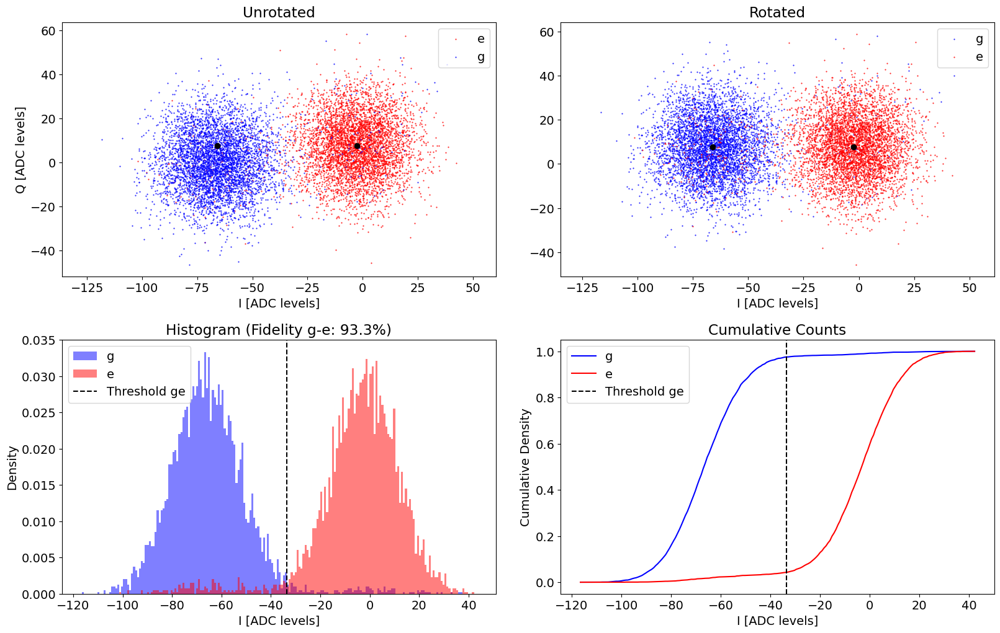

Unrotated:
Ig -66.3636955107352 +/- 16.157519483775673 	 Qg 0.2739102147039688 +/- 13.325870445346158 	 Amp g 66.36426077827805
Ie -3.346128822381262 +/- 17.31096305730799 	 Qe 7.328887443070918 +/- 13.121119192424949 	 Amp e 8.05662269497419
Rotated:
Ig -66.02405044754647 +/- 16.249421713305832 	 Qg 7.566399487456854 +/- 13.213650251837514 	 Amp g 66.45619338108337
Ie -2.473039370230545 +/- 17.391366775237298 	 Qe 7.762904478909631 +/- 13.014360242535034 	 Amp e 8.147306897090933


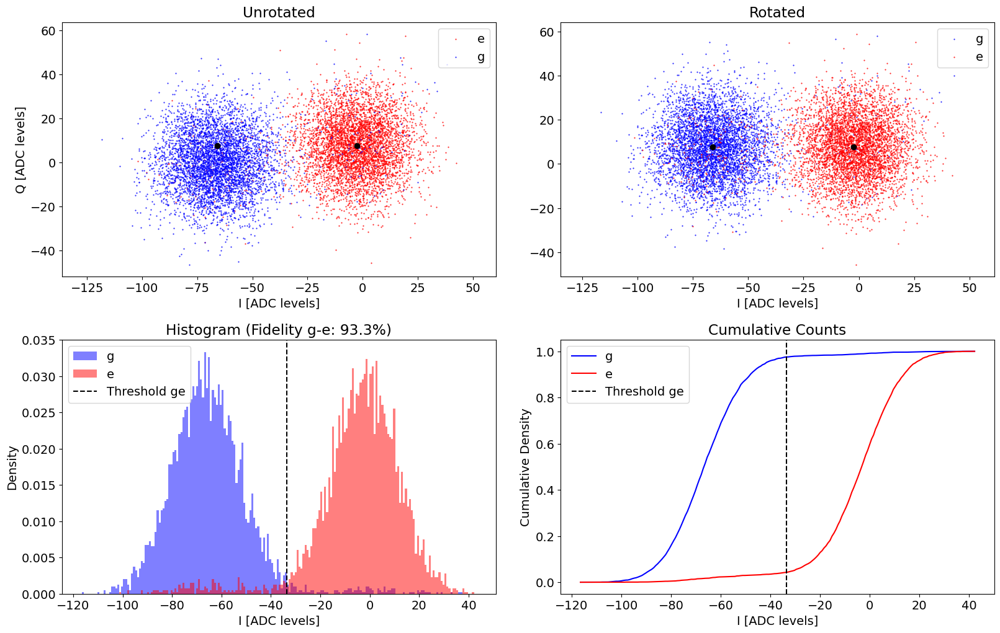

ge fidelity (%): 93.27951190238049
rotation angle (deg): -6.387810245156235
threshold ge: -33.57101982362295


In [8]:
# Execute
# =================================
ss_runner = CharacterizationRunner(
    station = station,
    ExptClass = meas.HistogramExperiment,
    default_expt_cfg = singleshot_defaults,
    postprocessor = singleshot_postproc,
    job_client=client,
)

ss = ss_runner.execute(
    check_f=False,
    active_reset=False, # on recalibration of readout, turn off active reset because it will be wrong for selecting when to apply the qubit pulse
    relax_delay=2000,
    # active_reset=True,
    # relax_delay=200,
    priority=1,
    # coupler_current = 0
    avoid_yoko = measurement_config_default_dict['avoid_yoko'],
    
    
)
ss.display(station)

In [ ]:
station.update_all_station_snapshots()

# Floquet pulse calibrations

## Freq chevron

In [81]:
floquet_freq_chev_defaults = AttrDict(dict(
    expts = 1,
    reps = 100,
    rounds = 1,
    qubits = [0],
    ro_stor = 0, # storage mode number that gets read out in the end
    f0g1_cavity = 1,  #  1/2 name of manipulate cavity
    # if 0, this means to read out man instead
    detunes=np.linspace(-0.3, 0.3, 11).tolist(),
    swept_params = ['detune', 'length'],
    normalize = False,
    active_reset = False,
    man_reset = False, 
    storage_reset = False, 
    prepulse=True,
    postpulse=True,
    init_fock=True,
)) # Shouldn't be modifying this on the fly!
floquet_freq_chev_defaults.update(active_reset_default_dict)
floquet_freq_chev_defaults.update(floquet_default_dict)
# You can use kwargs in the run function to override these values

def floquet_freq_chev_preproc(station, default_expt_cfg, **kwargs):
    assert 'init_stor' in kwargs
    expt_cfg = deepcopy(default_expt_cfg)
    ds_floquet = station.ds_floquet
    init_stor = kwargs.pop('init_stor') # storage mode number to initialize to n=1 Fock state
    lengths = np.linspace(0.01, 3.0 * ds_floquet.get_len(f'M1-S{init_stor}'), 10).tolist()

    expt_cfg.init_stor = init_stor
    expt_cfg.lengths = lengths
    expt_cfg.update(kwargs)
    print(expt_cfg)
    return expt_cfg

def floquet_freq_chev_postproc(station, expt):
    expt_cfg = expt.cfg.expt
    stor_name = f'M{expt_cfg.f0g1_cavity}-S{expt_cfg.init_stor}'

    from fitting.fit_display_classes import ChevronFitting

    chevron_analysis = ChevronFitting(
        frequencies=np.array(expt.data['ypts']),
        time=np.array(expt.data['xpts']),
        response_matrix=expt.data['avgi'],
        config=station.hardware_cfg,
        station=station,
    )

    chevron_analysis.analyze()
    
    best_detune = chevron_analysis.results.get('best_frequency_contrast')

    if best_detune is not None:
        pi_frac = station.ds_floquet.get_pi_frac(stor_name)
        print(f"Best detune found: {best_detune:.4f} MHz")
        current_freq = station.ds_floquet.get_freq(stor_name)
        new_freq = current_freq + best_detune
        station.ds_floquet.update_freq(stor_name, new_freq)
        print(f"Updated {stor_name} frequency to {new_freq:.4f} MHz")
        frac_pi_len = abs(np.pi / chevron_analysis.results['best_fit_params_period']['omega'])
        station.ds_floquet.update_len(stor_name, frac_pi_len)
        print(f'Updated the pi/{pi_frac} length from {station.ds_floquet.get_len(stor_name):.4f} to {frac_pi_len:.4f}')
    
    chevron_analysis.display_results()
    expt.analysis = chevron_analysis
    station.snapshot_floquet_storage_swap(update_main=False)

In [ ]:
stor_modes_to_run = [1, 2, 5, 6, 7] #list(range(1,8))
freq_len_expt = [None] * len(stor_modes_to_run)

floquet_freq_chev_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.FloquetChevronExperiment,
    ExptProgram=meas.FloquetChevronProgram,
    default_expt_cfg=floquet_freq_chev_defaults,
    preprocessor=floquet_freq_chev_preproc,
    postprocessor=floquet_freq_chev_postproc,
    job_client=client,
)

for i, init_stor in enumerate(stor_modes_to_run):
    # ds_floquet.update_gain(f'M1-S{init_stor}', ds_floquet.get_gain(f'M1-S{init_stor}') * 0.75)
    # print(f'Updating gain for M1-S{init_stor} to {ds_floquet.get_gain(f"M1-S{init_stor}")}')

    print(f'Running Floquet Frequency vs Length Chevron for Storage Mode {init_stor}')
    freq_len_expt[i] = floquet_freq_chev_runner.execute(
        init_stor=init_stor,
        # detunes=np.linspace(-0.2, 0.2, 51).tolist(),
        detunes=np.linspace(-1, 1, 51).tolist(),
        reps=100,
        
        # relax_delay=8000,
        relax_delay = 200,
        active_reset=True,
        man_reset=True, 
        storage_reset=[init_stor], 
        reset_dump_mode = 1,
    )
    freq_len_expt[i].display()
    # clear_output(wait=True)

In [ ]:
for i in range(len(stor_modes_to_run)):
    floquet_freq_chev_postproc(station, freq_len_expt[i])

In [ ]:
station.update_all_station_snapshots()

### Fine

In [ ]:
stor_modes_to_run = [1, 2, 5, 6, 7] #list(range(1,8))
freq_len_expt  = [None] * len(stor_modes_to_run)
freq_span_expt = [ 0.5,  0.3, None, None,  0.2,  0.2,  0.2]



floquet_freq_chev_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.FloquetChevronExperiment,
    ExptProgram=meas.FloquetChevronProgram,
    default_expt_cfg=floquet_freq_chev_defaults,
    preprocessor=floquet_freq_chev_preproc,
    postprocessor=floquet_freq_chev_postproc,
    job_client=client,
)

for i, init_stor in enumerate(stor_modes_to_run):
    # ds_floquet.update_gain(f'M1-S{init_stor}', ds_floquet.get_gain(f'M1-S{init_stor}') * 0.75)
    # print(f'Updating gain for M1-S{init_stor} to {ds_floquet.get_gain(f"M1-S{init_stor}")}')
    stor_idx = init_stor - 1
    freq_span = freq_span_expt[stor_idx]
    if freq_span is None:
        freq_span = 1.0
    print(f'Running Floquet Frequency vs Length Chevron for Storage Mode {init_stor}')
    freq_len_expt[i] = floquet_freq_chev_runner.execute(
        init_stor=init_stor,
        detunes=np.linspace(-freq_span, freq_span, 51).tolist(),
        reps=100,
        
        relax_delay = 200, #8000
        active_reset=True,
        man_reset=True, 
        storage_reset=[init_stor], 
        reset_dump_mode = 1,
    )
    if not station.log_measurements:
        freq_len_expt[i].display()
    # clear_output(wait=True)

## Error amplification on floquet pulses

In [ ]:
error_amp_floquet_defaults = AttrDict(dict(
    reps=100,
    rounds=1,
    qubits=[0],
    active_reset=False,
    man_mode_no=1,
    stor_is_dump=False,
    man_reset=True,
    storage_reset=True,
    relax_delay=2500, 
    expts=25,
    qubit_start_storage='g',
    floquet_waveform=floquet_default_dict["floquet_waveform"],
    floquet_hardware_loop=floquet_default_dict["floquet_hardware_loop"],
    scramble_sync_cycles=floquet_default_dict["scramble_sync_cycles"],
)) # Shouldn't be modifying this on the fly!
error_amp_floquet_defaults.update(active_reset_default_dict)
# You can use kwargs in the run function to override these values

error_amp_gain_floquet_coarse_defaults = AttrDict(dict(
    n_pulses=8,
    span=4000,#4000
    expts=30,#30
))

error_amp_freq_floquet_coarse_defaults = AttrDict(dict(
    n_pulses=7,
    span=0.25,
    expts=50,
))


def error_amp_floquet_preproc(station, default_expt_cfg, **kwargs):
    assert 'stor_mode_no' in kwargs
    assert 'parameter_to_test' in kwargs 

    # construct the defaults
    expt_cfg = deepcopy(default_expt_cfg)
    if kwargs['parameter_to_test'] == 'gain':
        expt_cfg.update(error_amp_gain_floquet_coarse_defaults)
    elif kwargs['parameter_to_test'] == 'frequency':
        expt_cfg.update(error_amp_freq_floquet_coarse_defaults)
    # override with the passed kwargs
    expt_cfg.update(kwargs)

    freq, gain, length, pi_frac, ch, prepulse, postpulse = get_floquet_parameters(station, expt_cfg.man_mode_no, expt_cfg.stor_mode_no)
    pulse_type = ['floquet', f'M{expt_cfg.man_mode_no}-{"D" if expt_cfg.stor_is_dump else "S"}{expt_cfg.stor_mode_no}', f'pi/{pi_frac}', 0]
    # freq = 695.7
    # gain = 10000
    if expt_cfg.parameter_to_test == 'frequency':
        start = freq - expt_cfg.span / 2
        step = expt_cfg.span / (expt_cfg.expts - 1)
    elif expt_cfg.parameter_to_test == 'gain':
        start = int(gain - expt_cfg.span / 2)
        step = int(expt_cfg.span / (expt_cfg.expts - 1))
    else:
        raise ValueError("parameter_to_test must be either 'frequency' or 'gain'.")
    expt_cfg.start = start
    expt_cfg.step = step
    expt_cfg.pulse_type = pulse_type 
    return expt_cfg

def error_amp_floquet_postproc(station, expt):
    expt.analyze(data=expt.data, state_fin='e')

    opt_val = expt.data['fit_avgi'][2]
    stor_name = 'M1-S' + str(expt.cfg.expt.stor_mode_no)
    if expt.cfg.expt.parameter_to_test == 'gain':
        station.ds_floquet.update_gain(stor_name, opt_val)
        print(f'Updated gain for {stor_name} to {opt_val}')
    elif expt.cfg.expt.parameter_to_test == 'frequency':
        station.ds_floquet.update_freq(stor_name, opt_val)
        print(f'Updated frequency for {stor_name} to {opt_val}')
    station.snapshot_floquet_storage_swap(update_main=False)


error_amp_floquet_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.single_qubit.error_amplification.ErrorAmplificationExperiment,
    default_expt_cfg=error_amp_floquet_defaults,
    preprocessor=error_amp_floquet_preproc,
    postprocessor=error_amp_floquet_postproc,
    job_client=client,
)

In [ ]:
# stor_modes_to_run = [1, 2, 5, 6, 7] #list(range(1,8))
stor_modes_to_run = [4, 5]
error_amp_gain1 = [None] * len(stor_modes_to_run)
error_amp_freq1 = [None] * len(stor_modes_to_run)
error_amp_gain2 = [None] * len(stor_modes_to_run)
error_amp_freq2 = [None] * len(stor_modes_to_run)


freq_span_list = [0.1, 0.1, None, None, 0.15, 0.1, 0.05] # set for the Coarse
gain_span_list = [None, None, None, None, None, None, None]

### Coarse

In [ ]:
freq_span_default = 0.1
gain_span_default = 0.3

do_freq_erroramp = True
do_gain_erroramp = True

for i, stor_i in enumerate(stor_modes_to_run):
    stor_idx = stor_i - 1
    stor_name = 'M1-S' + str(stor_i)
    
    freq_span = freq_span_default if freq_span_list[stor_idx] is None else freq_span_list[stor_idx]
    gain_span = gain_span_default if gain_span_list[stor_idx] is None else gain_span_list[stor_idx]
    
    if do_freq_erroramp:
        error_amp_freq1[i] = error_amp_floquet_runner.execute(
            stor_mode_no=stor_i,
            parameter_to_test='frequency',
            go_kwargs=dict(analyze=False, progress=True, display=False),
            span = freq_span, # 0.2 is default, but we want to be more precise since we are already close
            
            # relax_delay=8000,
            relax_delay = 200,
            active_reset=True,
            man_reset=True, 
            storage_reset=[stor_i], 
            reset_dump_mode = active_reset_default_dict["reset_dump_mode"],
        )
        if not station.log_measurements:
            error_amp_freq1[i].display()
    if do_gain_erroramp:
        error_amp_gain1[i] = error_amp_floquet_runner.execute(
            stor_mode_no=stor_i,
            parameter_to_test='gain',   
            go_kwargs=dict(analyze=False, progress=True, display=False),
            span=int(station.ds_floquet.get_gain(stor_name) * gain_span), #0.7 is default
            # span = 59,
            expts = 60,
            # expts=60,
            
            # relax_delay=8000,
            relax_delay = 200,
            active_reset=True,
            man_reset=True, 
            storage_reset=[stor_i], 
            reset_dump_mode = active_reset_default_dict["reset_dump_mode"],
        )
        if not station.log_measurements:
            error_amp_gain1[i].display()

### Fine

In [ ]:
freq_span_default = 0.1
gain_span_default = 0.3

do_freq_erroramp = True
do_gain_erroramp = True

stor_modes_to_run = [7]
for i, stor_i in enumerate(stor_modes_to_run):
    stor_idx = stor_i - 1
    stor_name = 'M1-S' + str(stor_i)
    
    freq_span = freq_span_default if freq_span_list[stor_idx] is None else freq_span_list[stor_idx]
    gain_span = gain_span_default if gain_span_list[stor_idx] is None else gain_span_list[stor_idx]
    
    if do_freq_erroramp:
        error_amp_freq1[i] = error_amp_floquet_runner.execute(
            stor_mode_no=stor_i,
            parameter_to_test='frequency',
            go_kwargs=dict(analyze=False, progress=True, display=False),
            span = freq_span / 2, # 0.2 is default, but we want to be more precise since we are already close
            
            # relax_delay=8000,
            relax_delay = 200,
            active_reset=True,
            man_reset=True, 
            storage_reset=[stor_i], 
            reset_dump_mode = 1,
        )
        if not station.log_measurements:
            error_amp_freq1[i].display()
    if do_gain_erroramp:
        error_amp_gain1[i] = error_amp_floquet_runner.execute(
            stor_mode_no=stor_i,
            parameter_to_test='gain',   
            go_kwargs=dict(analyze=False, progress=True, display=False),
            span=int(station.ds_floquet.get_gain(stor_name) * gain_span / 2), #0.7 is default
            # span = 59,
            expts = 60,
            # expts=60,
            
            # relax_delay=8000,
            relax_delay = 200,
            active_reset=True,
            man_reset=True, 
            storage_reset=[stor_i], 
            reset_dump_mode = 1,
        )
        if not station.log_measurements:
            error_amp_gain1[i].display()

In [ ]:
station.update_all_station_snapshots()

In [ ]:
station.ds_floquet.df

## Phase accumulation matrix from stark shifts

In [ ]:
phase_expts = [[None for _ in range(7)] for _ in range(7)]

In [110]:
sideband_stark_error_amp_defaults = AttrDict(dict(
    expts=1,
    reps=100,
    rounds=1,
    qubits=[0],
    f0g1_cavity=1,  #  1/2 name of manipulate cavity
    init_stor=0, # storage mode number to initialize to n=1 Fock state (0=man)
    ro_stor=0, # storage mode number that gets read out in the end (0=man)
    advance_phases=np.linspace(-15, 15, 51).tolist(),
    n_pulses=np.arange(0, 24, 4).tolist(),
    swept_params=['n_pulse', 'advance_phase'],
    normalize=False, # not sure what this does
    active_reset=False,
    man_reset=False, 
    storage_reset=False, 
    prepulse=True,
    postpulse=True,
    init_fock=True,
))
sideband_stark_error_amp_defaults.update(active_reset_default_dict)
sideband_stark_error_amp_defaults.update(floquet_default_dict)

def sideband_stark_error_amp_preproc(station, default_expt_cfg, **kwargs):
    assert 'stor_A' in kwargs
    assert 'stor_B' in kwargs

    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.update(kwargs)
    print(expt_cfg)
    return expt_cfg

def sideband_stark_error_amp_postproc(station, expt):
    storA = expt.cfg.expt.stor_A
    storB = expt.cfg.expt.stor_B
    stor_name = 'M1-S' + str(storA)
    from_stor_name = 'M1-S' + str(storB)
    expt.analyze(fit=True)
    expt.display(fit=True)
    # opt_phase = expt.data['fit_avgi'][2] / 2 # divide by 2 since did pi/12, -pi/12 on the from_stor swap
    opt_phase = expt.data['fit_avgi'][2] # not dividing seems to give the correct result somehow? TODO: figure out why
    print("Opt phase on", stor_name, "from", from_stor_name, ":", opt_phase)
    station.ds_floquet.update_phase_from(stor_name, from_stor_name, opt_phase)
    # Legacy block: snapshot intentionally disabled.

sideband_stark_error_amp_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.SidebandStarkAmplificationExperiment,
    ExptProgram=meas.qsim.floquet_dark_mode_readout.SidebandStarkAmplificationModifiedProgram, #meas.SidebandStarkAmplificationProgram,
    default_expt_cfg=sideband_stark_error_amp_defaults,
    preprocessor=sideband_stark_error_amp_preproc,
    postprocessor=sideband_stark_error_amp_postproc,
    job_client=client,
)

In [ ]:
stor_modes_to_run = [2, 5] #list(range(1,8))

for iA, init_storA in enumerate(stor_modes_to_run): #range(1,8):
    for iB, init_storB in enumerate(stor_modes_to_run): #range(1,8):
        if init_storA == init_storB:
            continue
        print("Starting experiment for storage modes:", init_storA, "from", init_storB)

        qbe = sideband_stark_error_amp_runner.execute(
            stor_A=init_storA,
            stor_B=init_storB,
            # relax_delay=8000,
            relax_delay = 100,
            active_reset=True,
            man_reset=True, 
            storage_reset=[init_storA, init_storB], 
            reset_dump_mode = 1,
            reps=100,
            include_10cycles_buffer = floquet_default_dict["include_10cycles_buffer"],
            advance_phases=np.linspace(-10, 10, 101).tolist(),
            # n_pulses=np.arange(0, 42, 7).tolist(),
        )
        phase_expts[init_storA - 1][init_storB - 1] = qbe

In [ ]:
station.update_all_station_snapshots()

In [ ]:
stor_modes_to = [5] #list(range(1,8))
stor_modes_from = [3]
for iA, init_storA in enumerate(stor_modes_to): #range(1,8):
    for iB, init_storB in enumerate(stor_modes_from): #range(1,8):
        if init_storA == init_storB:
            continue
        print("Starting experiment for storage modes:", init_storA, "from", init_storB)

        qbe = sideband_stark_error_amp_runner.execute(
            stor_A=init_storA,
            stor_B=init_storB,
            
            # relax_delay=8000,
            relax_delay = 100,
            active_reset=True,
            man_reset=True, 
            storage_reset=[init_storA, init_storB], 
            reset_dump_mode = active_reset_default_dict["reset_dump_mode"],
            reps=100,
            include_10cycles_buffer = floquet_default_dict["include_10cycles_buffer"],
            advance_phases=np.linspace(-10, 10, 101).tolist(),
            # n_pulses=np.arange(0, 24, 4).tolist(),
        )
        phase_expts[init_storA - 1][init_storB - 1] = qbe

In [ ]:
station.snapshot_floquet_storage_swap(update_main=False)

In [ ]:
station.ds_floquet.update_len('M1-S4', 0.065348)

In [ ]:
station.snapshot_floquet_storage_swap()

In [ ]:
station.update_all_station_snapshots()

# Gaussian/Preloadd floquet pulse calibratons

In [21]:
station.ds_storage.df

,stor_name,freq (MHz),precision (MHz),pi (mus),h_pi (mus),gain (DAC units),last_update,bs_rate_coeffs_g,bs_rate_coeffs_e,freq_coeffs_g,freq_coeffs_e,gain_range_g,gain_range_e,joint_parity,dr_ac_stark_rate,dr_jp_phase
0,M1-S1,342.105410,NaN,0.557694,0.278847,5000,2026-09-06 21:21:22.369784,"[2.71800440497595e-10, 3.5345716702085755e-05,...","[2.617101263255993e-10, 3.5294007231684914e-05...","[-5.581106410081517e-38, 3.497594370968036e-33...","[-5.787229142339564e-38, 3.802111265047564e-33...","[2823.494166114352, 10936.689003179721]","[2834.8504180018463, 11002.012121829115]","[352.95224967922866, 3259, 3.513105914802541, ...",NaN,NaN
1,M1-S2,512.695252,NaN,0.615557,0.307779,7008,2026-09-06 21:23:35.491765,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,M1-S3,689.103320,NaN,0.883949,0.441975,4960,2026-09-06 21:25:46.028223,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,M1-S4,868.676827,NaN,1.053991,0.526996,9851,2026-09-06 21:27:35.190119,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,M1-S5,1044.993117,NaN,1.173960,0.586980,9990,2026-09-06 21:29:36.115753,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,M1-S6,1236.785773,NaN,1.167909,0.583954,10050,2026-09-06 21:31:25.228604,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,M1-S7,1414.679004,NaN,1.151378,0.575689,10320,2026-09-06 21:33:03.188702,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,M1-S8,-1.000000,-1.00,-1.000000,-1.000000,-1,51:31.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,M1-S9,-1.000000,-1.00,-1.000000,-1.000000,-1,51:31.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,M1-S10,-1.000000,-1.00,-1.000000,-1.000000,-1,51:31.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [22]:
station.ds_floquet.df

,stor_name,pi_frac,freq (MHz),gain (DAC units),len (mus),ramp_sigma (mus),phase_from_M1-S1 (deg),phase_from_M1-S2 (deg),phase_from_M1-S3 (deg),phase_from_M1-S4 (deg),phase_from_M1-S5 (deg),phase_from_M1-S6 (deg),phase_from_M1-S7 (deg),last_update,gauss_n_sigma,waveform,gauss_sigma (mus)
0,M1-S1,40,342.107449,4988,0.037,0.002,0.000000,0.077320,7.395563,13.029806,9.504455,9.948546,5.059489,2026-09-05 16:13:21.811347,4.0,preload_flattop,0.02
1,M1-S2,40,512.713468,7022,0.037,0.002,10.631114,0.000000,16.870708,3.949460,8.066179,5.347237,11.944568,2026-09-05 16:13:21.812347,4.0,preload_flattop,0.02
2,M1-S3,40,689.107122,4955,0.037,0.002,-16.010854,-19.429282,0.000000,0.371785,2.306797,5.885760,-0.454681,2026-09-05 16:13:21.813347,4.0,preload_flattop,0.02
3,M1-S4,40,868.386346,5972,0.037,0.002,-13.620542,-3.883497,-0.386818,0.000000,2.193470,1.995581,-0.989142,2026-09-05 20:47:26.138137,4.0,preload_flattop,0.02
4,M1-S5,40,1044.589374,6664,0.037,0.002,-19.475623,-5.830271,-2.328724,-1.923010,0.000000,0.129140,-2.922322,2026-09-05 20:53:38.803193,4.0,preload_flattop,0.02
5,M1-S6,40,1236.323243,6623,0.037,0.002,-19.835320,-5.829775,-2.331942,-1.848178,0.460990,0.000000,-2.855867,2026-09-05 20:59:49.115176,4.0,preload_flattop,0.02
6,M1-S7,40,1414.487071,6799,0.037,0.002,-9.142233,-11.882928,0.305648,0.883366,3.157679,2.914350,0.000000,2026-09-05 21:06:00.353030,4.0,preload_flattop,0.02


## Gain Chevron

In [23]:
floquet_gain_chev_defaults = AttrDict(dict(
    expts = 1,
    reps = 100,
    rounds = 1,
    qubits = [0],
    ro_stor = 0, # storage mode number that gets read out in the end
    f0g1_cavity = 1,  #  1/2 name of manipulate cavity
    # if 0, this means to read out man instead
    detunes=np.linspace(-0.3, 0.3, 11).tolist(),
    swept_params = ['detune', 'gain'],
    normalize = False,
    active_reset = False,
    man_reset = False, 
    storage_reset = False, 
    prepulse=True,
    postpulse=True,
    init_fock=True,
)) # Shouldn't be modifying this on the fly!
floquet_gain_chev_defaults.update(active_reset_default_dict)
floquet_gain_chev_defaults.update(floquet_default_dict)
# You can use kwargs in the run function to override these values

def floquet_gain_chev_preproc(station, default_expt_cfg, **kwargs):
    assert 'init_stor' in kwargs
    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.update(kwargs)
    ds_floquet = station.ds_floquet
    init_stor = kwargs.pop('init_stor') # storage mode number to initialize to n=1 Fock state
    # gains = np.linspace(0.01, 3.0 * ds_floquet.get_gain(f'M1-S{init_stor}'), 200).tolist()
    max_gain = expt_cfg.get("max_gain", 15000)
    gain_expts = expt_cfg.get("gain_expts", 11)
    if max_gain != 15000:
        gains = np.linspace(0, max_gain, gain_expts).astype(int).tolist()
    else:
        gains = np.linspace(0, np.minimum(10.0 * ds_floquet.get_gain(f'M1-S{init_stor}'), max_gain), gain_expts).astype(int).tolist()

    expt_cfg.init_stor = init_stor
    expt_cfg.gains = gains
    print(expt_cfg)
    return expt_cfg

def floquet_gain_chev_postproc(station, expt):
    expt_cfg = expt.cfg.expt
    stor_name = f'M{expt_cfg.f0g1_cavity}-S{expt_cfg.init_stor}'

    from fitting.fit_display_classes import ChevronFitting

    chevron_analysis = ChevronFitting(
        frequencies=np.array(expt.data['ypts']),
        time=np.array(expt.data['xpts']),
        response_matrix=expt.data['avgi'],
        config=station.hardware_cfg,
        station=station,
    )

    chevron_analysis.analyze()
    
    best_detune = chevron_analysis.results.get('best_frequency_contrast')

    if best_detune is not None:
        pi_frac = station.ds_floquet.get_pi_frac(stor_name)
        print(f"Best detune found: {best_detune:.4f} MHz")
        current_freq = station.ds_floquet.get_freq(stor_name)
        new_freq = current_freq + best_detune
        station.ds_floquet.update_freq(stor_name, new_freq)
        print(f"Updated {stor_name} frequency to {new_freq:.4f} MHz")
        frac_pi_gain = abs((np.pi)/ chevron_analysis.results['best_fit_params_contrast']['omega'])
        station.ds_floquet.update_gain(stor_name, frac_pi_gain)
        print(f'Updated the pi/{pi_frac} gain from {station.ds_floquet.get_gain(stor_name):.4f} to {frac_pi_gain:.4f}')
    
    chevron_analysis.display_results()
    expt.analysis = chevron_analysis
    station.snapshot_floquet_storage_swap(update_main=False)

Running Floquet Frequency vs Gain Chevron for Storage Mode 3
{'expts': 1, 'reps': 50, 'rounds': 1, 'qubits': [0], 'ro_stor': 0, 'f0g1_cavity': 1, 'detunes': [-5.0, -4.8, -4.6, -4.4, -4.2, -4.0, -3.8, -3.5999999999999996, -3.4, -3.2, -3.0, -2.8, -2.5999999999999996, -2.4, -2.1999999999999997, -2.0, -1.7999999999999998, -1.5999999999999996, -1.4, -1.1999999999999997, -1.0, -0.7999999999999998, -0.5999999999999996, -0.39999999999999947, -0.1999999999999993, 0.0, 0.20000000000000018, 0.40000000000000036, 0.6000000000000005, 0.8000000000000007, 1.0, 1.2000000000000002, 1.4000000000000004, 1.6000000000000005, 1.8000000000000007, 2.0, 2.2, 2.4000000000000004, 2.6000000000000005, 2.8000000000000007, 3.0, 3.200000000000001, 3.4000000000000004, 3.5999999999999996, 3.8000000000000007, 4.0, 4.200000000000001, 4.4, 4.600000000000001, 4.800000000000001, 5.0], 'swept_params': ['detune', 'gain'], 'normalize': False, 'active_reset': True, 'man_reset': True, 'storage_reset': [3], 'prepulse': True, 'post

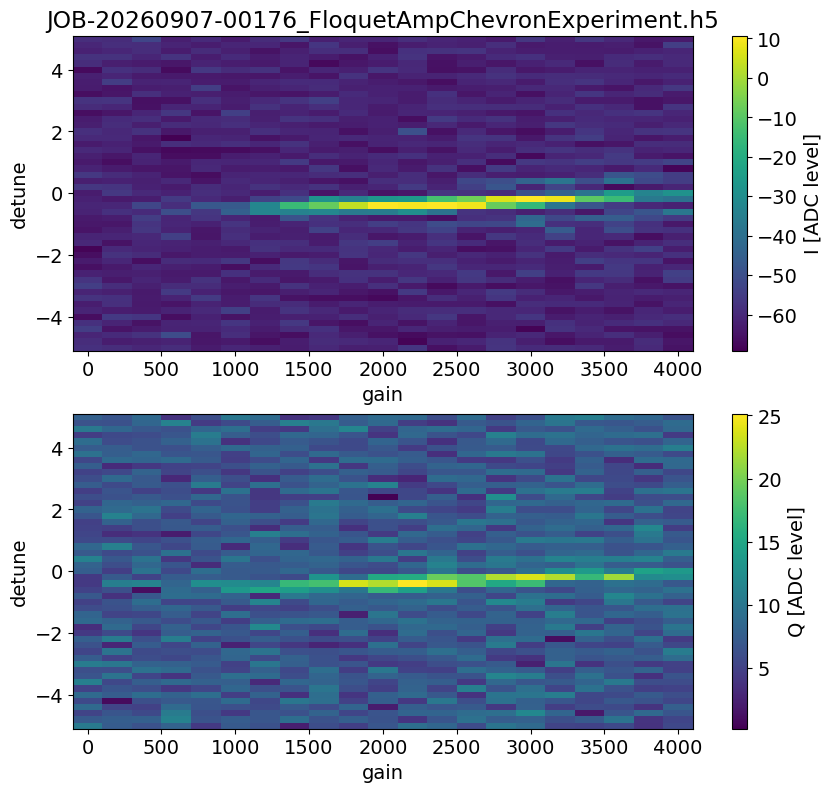

In [24]:
from experiments.qsim.floquet_gain_chevron import FloquetGainChevronExperiment
from experiments.qsim.floquet_gain_chevron import FloquetGainChevronProgram

stor_modes_to_run = [3] #list(range(1,8))
freq_len_expt = [None] * len(stor_modes_to_run)
you_have_to_do_amp_chev = True
if you_have_to_do_amp_chev == True:
    floquet_gain_chev_runner = CharacterizationRunner(
        station=station,
        ExptClass=FloquetGainChevronExperiment,
        ExptProgram=FloquetGainChevronProgram,
        default_expt_cfg=floquet_gain_chev_defaults,
        preprocessor=floquet_gain_chev_preproc,
        # postprocessor=floquet_gain_chev_postproc,
        job_client=client,
    )

    for i, init_stor in enumerate(stor_modes_to_run):
        # ds_floquet.update_gain(f'M1-S{init_stor}', ds_floquet.get_gain(f'M1-S{init_stor}') * 0.75)
        # print(f'Updating gain for M1-S{init_stor} to {ds_floquet.get_gain(f"M1-S{init_stor}")}')

        print(f'Running Floquet Frequency vs Gain Chevron for Storage Mode {init_stor}')
        freq_len_expt[i] = floquet_gain_chev_runner.execute(
            init_stor=init_stor,
            detunes=np.linspace(-5, 5, 51).tolist(),
            # detunes=np.linspace(-0.5, 0.5, 21).tolist(),
            # relax_delay=8000,
            reps=50,
            gain_expts = 21,
            max_gain = 4000,
            
            
            relax_delay = 200, #8000 #200
            active_reset=True,
            man_reset=True, 
            storage_reset=[init_stor], 
            reset_dump_mode = active_reset_default_dict["reset_dump_mode"],
            # floquet_waveform='gauss',
            # floquet_gauss_sigma = floquet_gauss_sigma,
            
            
            debug = False
        )
        if not station.log_measurements:
            freq_len_expt[i].display()
        # clear_output(wait=True)

uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as i

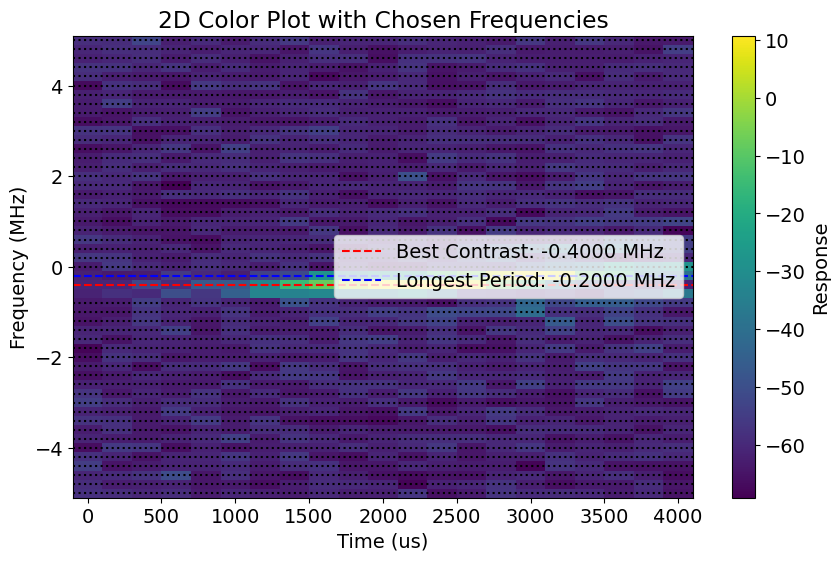

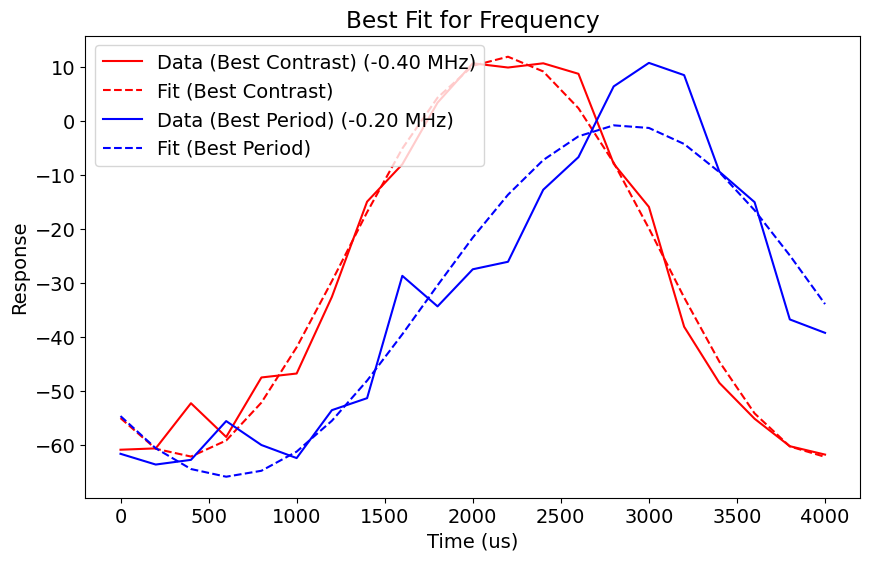

[CONFIG] Created new floquet_storage_swap version CFG-FL-20260907-00002


In [25]:
floquet_gain_chev_postproc(station, freq_len_expt[0])

In [143]:
# station.ds_floquet.update_gain("M1-S6", 13648)
station.ds_floquet.update_gain("M1-S3", 2400)
# station.ds_floquet.update_freq("M1-S4", 878.2990264499939)

# station.ds_floquet.update_freq("M1-S4", 873.5242589230924)

In [ ]:
station.ds_floquet.df

In [ ]:
station.update_all_station_snapshots()

## Error Amplification for Gaussian pulses

In [181]:
error_amp_floquet_defaults = AttrDict(dict(
    reps=100,
    rounds=1,
    qubits=[0],
    active_reset=False,
    man_mode_no=1,
    stor_is_dump=False,
    man_reset=True,
    storage_reset=True,
    relax_delay=2500, 
    expts=25,
    qubit_start_storage='g',
    floquet_hardware_loop=floquet_default_dict["floquet_hardware_loop"],
    scramble_sync_cycles=floquet_default_dict["scramble_sync_cycles"],
)) # Shouldn't be modifying this on the fly!
error_amp_floquet_defaults.update(active_reset_default_dict)
error_amp_floquet_defaults.update(floquet_default_dict)
# You can use kwargs in the run function to override these values

error_amp_gain_floquet_coarse_defaults = AttrDict(dict(
    n_pulses=8,
    span=4000,#4000
    expts=30,#30
))

error_amp_freq_floquet_coarse_defaults = AttrDict(dict(
    n_pulses=7,
    span=0.25,
    expts=50,
))


def error_amp_floquet_preproc(station, default_expt_cfg, **kwargs):
    assert 'stor_mode_no' in kwargs
    assert 'parameter_to_test' in kwargs 

    # construct the defaults
    expt_cfg = deepcopy(default_expt_cfg)
    if kwargs['parameter_to_test'] == 'gain':
        expt_cfg.update(error_amp_gain_floquet_coarse_defaults)
    elif kwargs['parameter_to_test'] == 'frequency':
        expt_cfg.update(error_amp_freq_floquet_coarse_defaults)
    # override with the passed kwargs
    expt_cfg.update(kwargs)

    freq, gain, length, pi_frac, ch, prepulse, postpulse = get_floquet_parameters(station, expt_cfg.man_mode_no, expt_cfg.stor_mode_no)
    pulse_type = ['floquet', f'M{expt_cfg.man_mode_no}-{"D" if expt_cfg.stor_is_dump else "S"}{expt_cfg.stor_mode_no}', f'pi/{pi_frac}', 0]
    # freq = 695.7
    # gain = 10000
    if expt_cfg.parameter_to_test == 'frequency':
        start = freq - expt_cfg.span / 2
        step = expt_cfg.span / (expt_cfg.expts - 1)
    elif expt_cfg.parameter_to_test == 'gain':
        start = int(gain - expt_cfg.span / 2)
        step = int(expt_cfg.span / (expt_cfg.expts - 1))
    else:
        raise ValueError("parameter_to_test must be either 'frequency' or 'gain'.")
    expt_cfg.start = start
    expt_cfg.step = step
    expt_cfg.pulse_type = pulse_type 
    return expt_cfg

def error_amp_floquet_postproc(station, expt):
    expt.analyze(data=expt.data, state_fin='e')

    opt_val = expt.data['fit_avgi'][2]
    stor_name = 'M1-S' + str(expt.cfg.expt.stor_mode_no)
    if expt.cfg.expt.parameter_to_test == 'gain':
        station.ds_floquet.update_gain(stor_name, opt_val)
        print(f'Updated gain for {stor_name} to {opt_val}')
    elif expt.cfg.expt.parameter_to_test == 'frequency':
        station.ds_floquet.update_freq(stor_name, opt_val)
        print(f'Updated frequency for {stor_name} to {opt_val}')
    station.snapshot_floquet_storage_swap(update_main=False)


error_amp_floquet_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.single_qubit.error_amplification.ErrorAmplificationExperiment,
    default_expt_cfg=error_amp_floquet_defaults,
    preprocessor=error_amp_floquet_preproc,
    postprocessor=error_amp_floquet_postproc,
    job_client=client,
)

In [182]:
# stor_modes_to_run = [1, 2, 5, 6, 7] #list(range(1,8))
# stor_modes_to_run = [4, 5, 6, 7] #list(range(1,8))

stor_modes_to_run = [1, 2, 3, 4, 5, 6, 7]
error_amp_gain1 = [None] * len(stor_modes_to_run)
error_amp_freq1 = [None] * len(stor_modes_to_run)
error_amp_gain2 = [None] * len(stor_modes_to_run)
error_amp_freq2 = [None] * len(stor_modes_to_run)


freq_span_list = [0.1,  0.07, 0.07, 0.1,  0.07,   0.1, 0.05] # set for the Coarse
gain_span_list = [None, None, None, None,  0.25,  0.25, 0.25]

Job submitted: JOB-20260906-00336 (queue position: 1)

[1.6s] Job JOB-20260906-00336: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260906-00336_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 29%|████████████▌                               | 2/7 [00:06<00:15,  3.05s/it]
[25.1s] Job JOB-20260906-00336: completed
100%|████████████████████████████████████████████| 7/7 [00:21<00:00,  3.10s/it]
Saving C:\experiments\260818_qsim_spectroscopy\data\JOB-20260906-00336_ErrorAmplificationExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260818_qsim_spectroscopy\expt_objs\JOB-20260906-00336_expt.pkl

Job completed! Data: C:\experiments\260818_qsim_spectroscopy\data\JOB-20260906-00336_ErrorAmplificationExperiment.h5


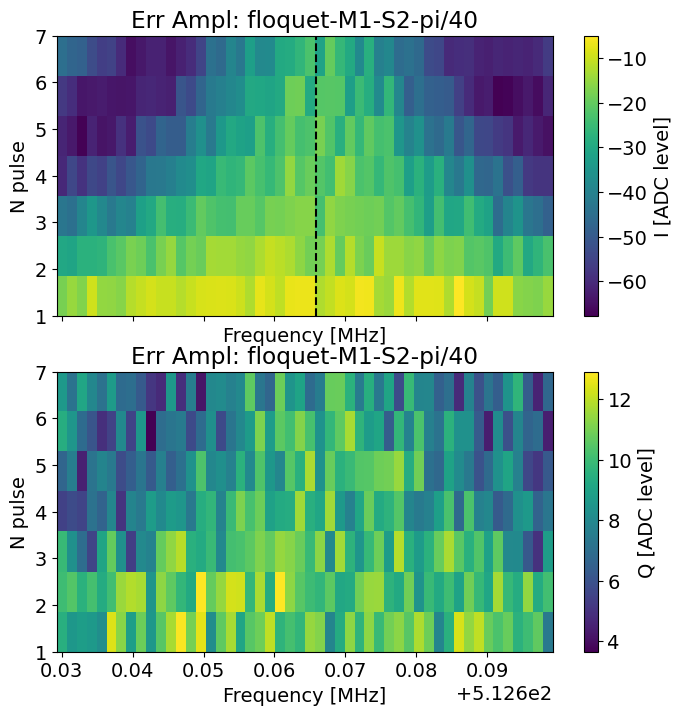

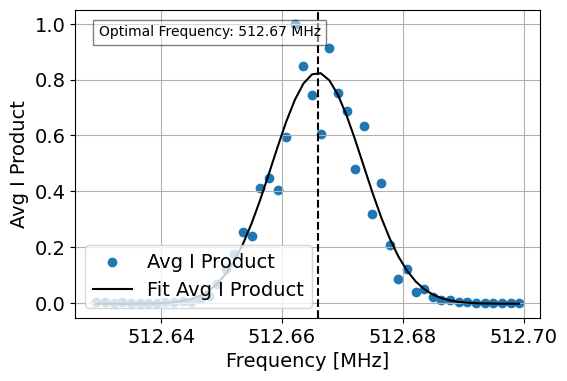

Job submitted: JOB-20260906-00337 (queue position: 1)

[3.2s] Job JOB-20260906-00337: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260906-00337_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 75%|█████████████████████████████████           | 6/8 [00:22<00:07,  3.71s/it]
[36.0s] Job JOB-20260906-00337: completed
100%|████████████████████████████████████████████| 8/8 [00:29<00:00,  3.71s/it]
Saving C:\experiments\260818_qsim_spectroscopy\data\JOB-20260906-00337_ErrorAmplificationExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260818_qsim_spectroscopy\expt_objs\JOB-20260906-00337_expt.pkl

Job completed! Data: C:\experiments\260818_qsim_spectroscopy\data\JOB-20260906-00337_ErrorAmplificationExperiment.h5


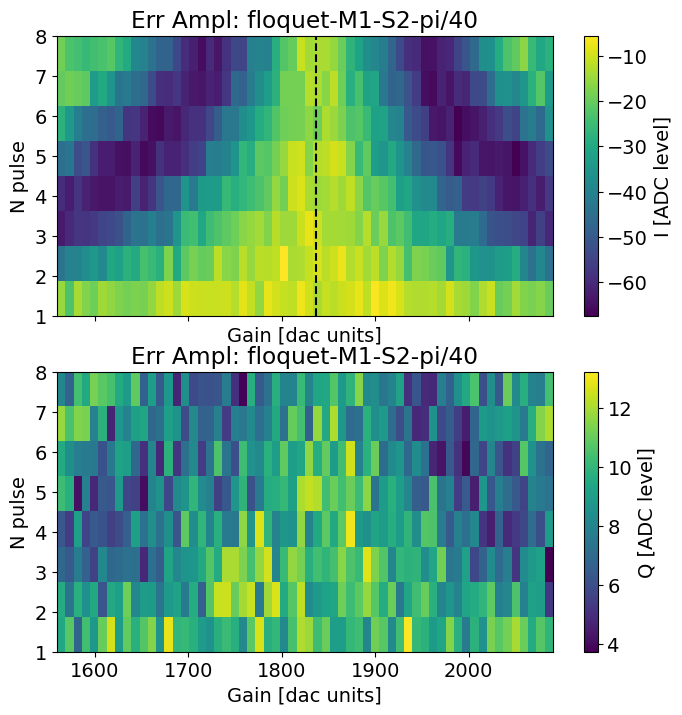

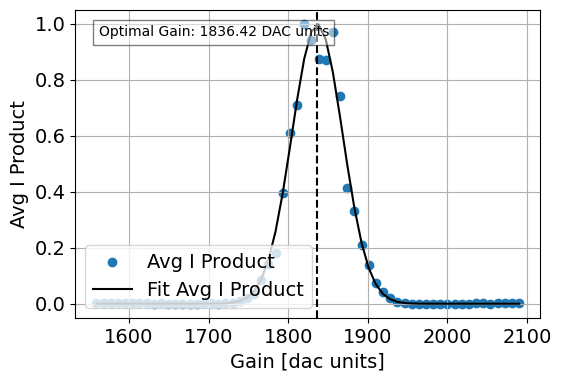

In [185]:
freq_span_default = 0.1
gain_span_default = 0.3

do_freq_erroramp = False
do_gain_erroramp = False


do_freq_erroramp = True
do_gain_erroramp = True

do_active_reset = True
relax_delay = 200
if not do_active_reset:
    relax_delay = 8000




stor_modes_to_run = [2]

for i, stor_i in enumerate(stor_modes_to_run):
    stor_idx = stor_i - 1
    stor_name = 'M1-S' + str(stor_i)
    
    freq_span = freq_span_default if freq_span_list[stor_idx] is None else freq_span_list[stor_idx]
    gain_span = gain_span_default if gain_span_list[stor_idx] is None else gain_span_list[stor_idx]
    
    if do_freq_erroramp:
        error_amp_freq1[i] = error_amp_floquet_runner.execute(
            stor_mode_no=stor_i,
            parameter_to_test='frequency',
            go_kwargs=dict(analyze=False, progress=True, display=False),
            span = freq_span, # 0.2 is default, but we want to be more precise since we are already close
            
            relax_delay=relax_delay,
            # relax_delay = 200,
            active_reset=do_active_reset,
            man_reset=True, 
            storage_reset=[stor_i], 
            reset_dump_mode = active_reset_default_dict["reset_dump_mode"],
            
            # floquet_sync_delay = 10
            
        )
        if not station.log_measurements:
            error_amp_freq1[i].display()
    if do_gain_erroramp:
        error_amp_gain1[i] = error_amp_floquet_runner.execute(
            stor_mode_no=stor_i,
            parameter_to_test='gain',
            go_kwargs=dict(analyze=False, progress=True, display=False),
            span=int(station.ds_floquet.get_gain(stor_name) * gain_span), #0.7 is default
            # span = 59,
            expts = 60,
            # expts=60,
            
            # relax_delay=8000,
            relax_delay = relax_delay,
            active_reset=do_active_reset,
            man_reset=True, 
            storage_reset=[stor_i], 
            reset_dump_mode = active_reset_default_dict["reset_dump_mode"],
            
            # floquet_sync_delay = 10
        )
        if not station.log_measurements:
            error_amp_gain1[i].display()

In [151]:
station.ds_floquet.df

,stor_name,pi_frac,freq (MHz),gain (DAC units),len (mus),ramp_sigma (mus),phase_from_M1-S1 (deg),phase_from_M1-S2 (deg),phase_from_M1-S3 (deg),phase_from_M1-S4 (deg),phase_from_M1-S5 (deg),phase_from_M1-S6 (deg),phase_from_M1-S7 (deg),last_update,gauss_n_sigma,waveform,gauss_sigma (mus)
0,M1-S1,40,342.107449,4988,0.037,0.002,0.000000,0.077320,7.395563,13.029806,9.504455,9.948546,5.059489,2026-09-05 16:13:21.811347,4.0,preload_flattop,0.02
1,M1-S2,40,512.713468,7022,0.037,0.002,10.631114,0.000000,16.870708,3.949460,8.066179,5.347237,11.944568,2026-09-05 16:13:21.812347,4.0,preload_flattop,0.02
2,M1-S3,40,688.774542,2515,0.037,0.002,-16.010854,-19.429282,0.000000,0.371785,2.306797,5.885760,-0.454681,2026-09-06 21:55:23.859806,4.0,preload_flattop,0.02
3,M1-S4,40,868.386346,5972,0.037,0.002,-13.620542,-3.883497,-0.386818,0.000000,2.193470,1.995581,-0.989142,2026-09-05 20:47:26.138137,4.0,preload_flattop,0.02
4,M1-S5,40,1044.589374,6664,0.037,0.002,-19.475623,-5.830271,-2.328724,-1.923010,0.000000,0.129140,-2.922322,2026-09-05 20:53:38.803193,4.0,preload_flattop,0.02
5,M1-S6,40,1236.323243,6623,0.037,0.002,-19.835320,-5.829775,-2.331942,-1.848178,0.460990,0.000000,-2.855867,2026-09-05 20:59:49.115176,4.0,preload_flattop,0.02
6,M1-S7,40,1414.487071,6799,0.037,0.002,-9.142233,-11.882928,0.305648,0.883366,3.157679,2.914350,0.000000,2026-09-05 21:06:00.353030,4.0,preload_flattop,0.02


In [60]:
station.update_all_station_snapshots()

[CONFIG] Reusing existing hardware_config version CFG-HW-20260905-00009
[CONFIG] Reusing existing multiphoton_config version CFG-MP-20260121-00001
[CONFIG] Reusing existing man1_storage_swap version CFG-M1-20260905-00002
[CONFIG] Reusing existing floquet_storage_swap version CFG-FL-20260905-00089
Config snapshots for current station:
  hardware_config: CFG-HW-20260905-00009
  multiphoton_config: CFG-MP-20260121-00001
  man1_storage_swap: CFG-M1-20260905-00002
  floquet_storage_swap: CFG-FL-20260905-00089


{'hardware_config': 'CFG-HW-20260905-00009',
 'multiphoton_config': 'CFG-MP-20260121-00001',
 'man1_storage_swap': 'CFG-M1-20260905-00002',
 'floquet_storage_swap': 'CFG-FL-20260905-00089'}

## Fine Error Amplification for Gaussian pulses

Job submitted: JOB-20260905-00218 (queue position: 1)

[0.0s] Job JOB-20260905-00218: pending

[2.0s] Job JOB-20260905-00218: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260905-00218_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 6/7 [00:18<00:03,  3.11s/it]
[24.5s] Job JOB-20260905-00218: completed
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:21<00:00,  3.11s/it]
Saving C:\experiments\260818_qsim_spectroscopy\data\JOB-20260905-00218_ErrorAmplificationExperiment.h5
[WORKER] Saving expt object to: C:

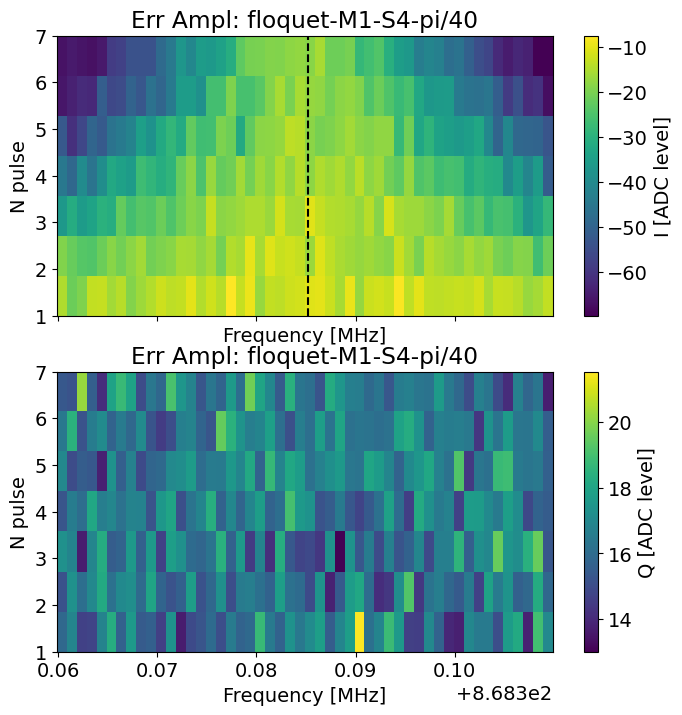

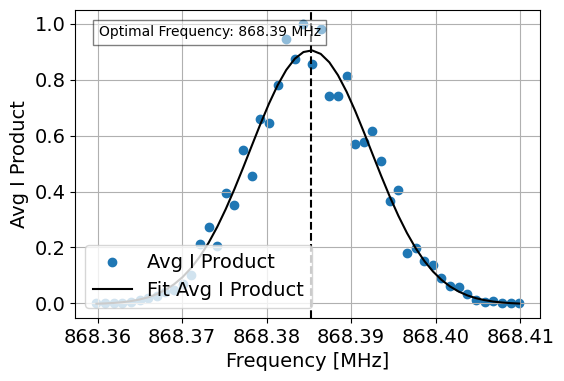

Job submitted: JOB-20260905-00219 (queue position: 1)

[0.0s] Job JOB-20260905-00219: pending

[3.1s] Job JOB-20260905-00219: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260905-00219_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 7/8 [00:26<00:03,  3.76s/it]
[32.4s] Job JOB-20260905-00219: completed
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:29<00:00,  3.73s/it]
Saving C:\experiments\260818_qsim_spectroscopy\data\JOB-20260905-00219_ErrorAmplificationExperiment.h5
[WORKER] Saving expt object to: C:

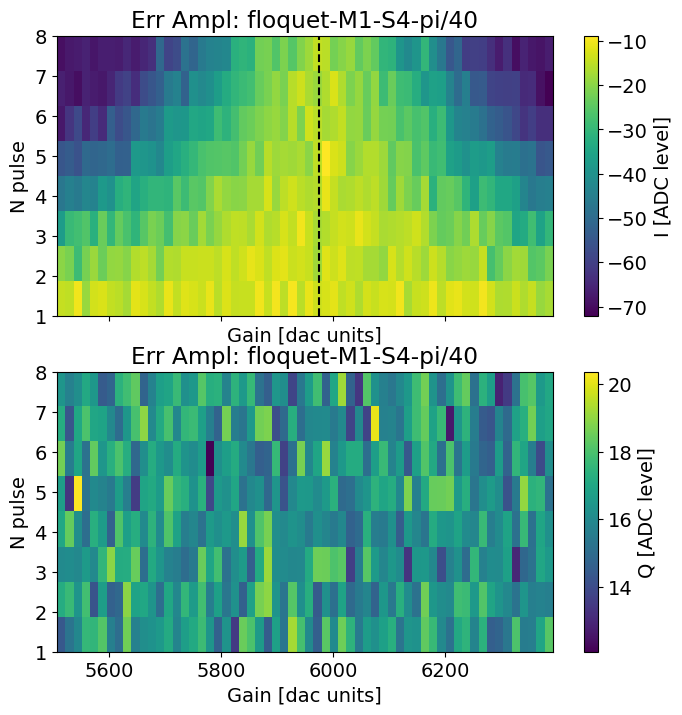

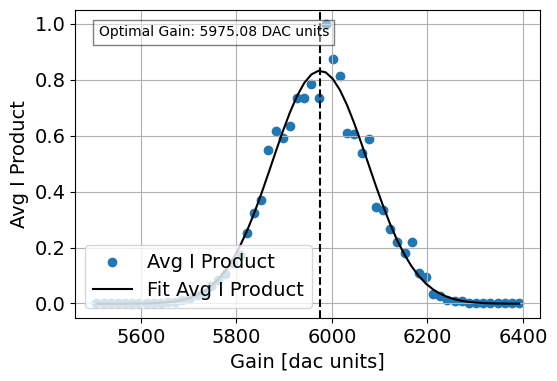

Job submitted: JOB-20260905-00220 (queue position: 1)

[0.0s] Job JOB-20260905-00220: pending

[2.0s] Job JOB-20260905-00220: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260905-00220_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 6/7 [00:18<00:03,  3.12s/it]
[23.7s] Job JOB-20260905-00220: completed
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:21<00:00,  3.11s/it]
Saving C:\experiments\260818_qsim_spectroscopy\data\JOB-20260905-00220_ErrorAmplificationExperiment.h5
[WORKER] Saving expt object to: C:

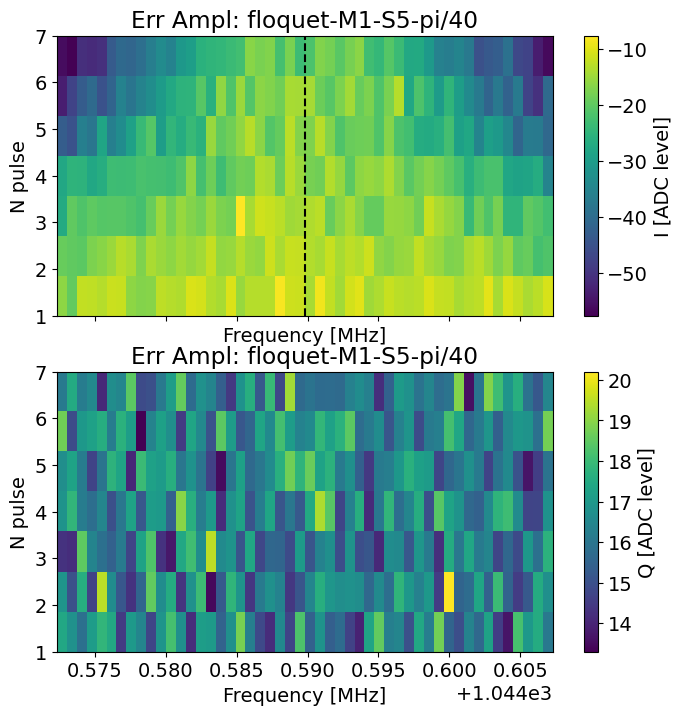

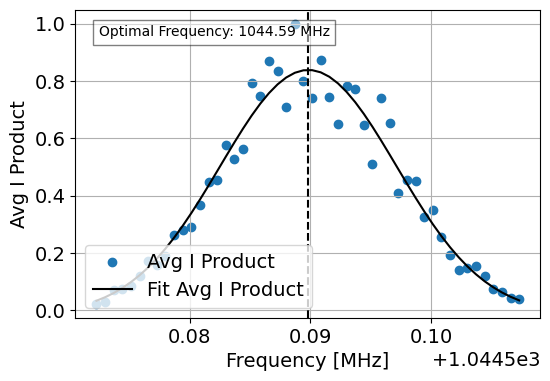

Job submitted: JOB-20260905-00221 (queue position: 1)

[0.0s] Job JOB-20260905-00221: pending

[2.0s] Job JOB-20260905-00221: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260905-00221_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 7/8 [00:25<00:03,  3.74s/it]
[31.7s] Job JOB-20260905-00221: completed
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:29<00:00,  3.72s/it]
Saving C:\experiments\260818_qsim_spectroscopy\data\JOB-20260905-00221_ErrorAmplificationExperiment.h5
[WORKER] Saving expt object to: C:

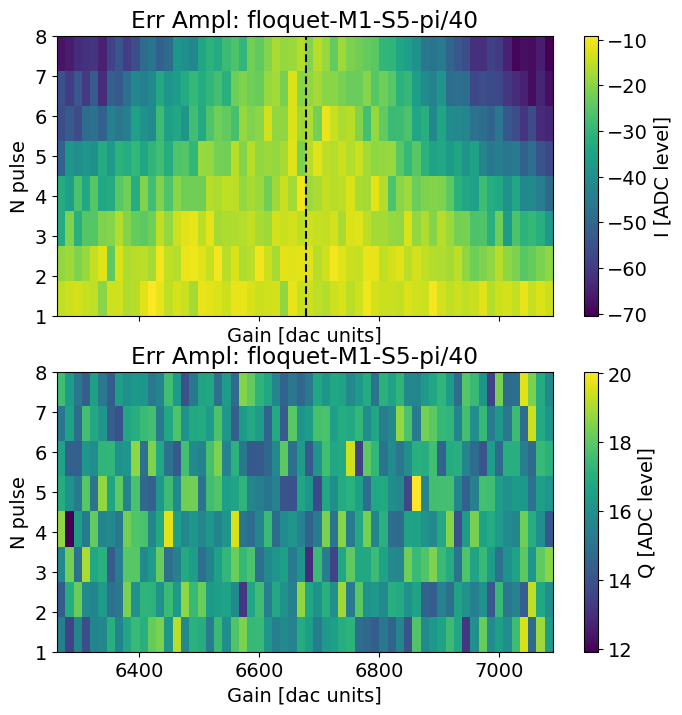

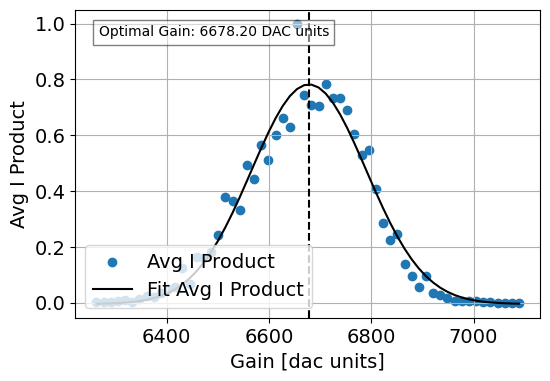

Job submitted: JOB-20260905-00222 (queue position: 1)

[0.0s] Job JOB-20260905-00222: pending

[2.0s] Job JOB-20260905-00222: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260905-00222_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 6/7 [00:18<00:03,  3.14s/it]
[22.8s] Job JOB-20260905-00222: completed
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:21<00:00,  3.12s/it]
Saving C:\experiments\260818_qsim_spectroscopy\data\JOB-20260905-00222_ErrorAmplificationExperiment.h5
[WORKER] Saving expt object to: C:

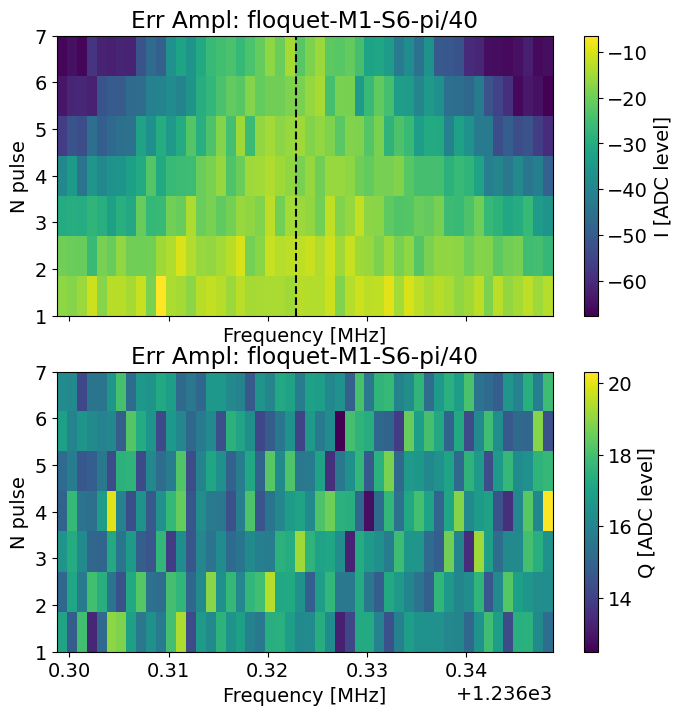

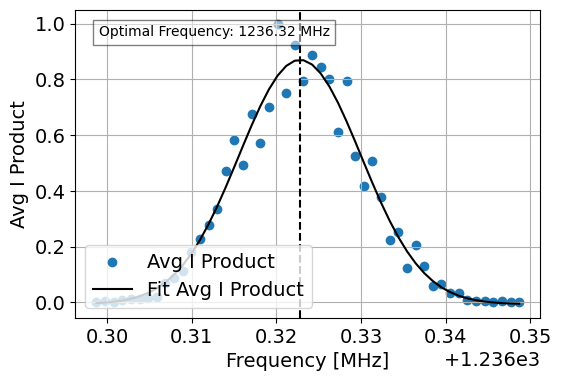

Job submitted: JOB-20260905-00223 (queue position: 1)

[0.0s] Job JOB-20260905-00223: pending

[3.2s] Job JOB-20260905-00223: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260905-00223_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 7/8 [00:25<00:03,  3.74s/it]
[32.9s] Job JOB-20260905-00223: completed
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:29<00:00,  3.72s/it]
Saving C:\experiments\260818_qsim_spectroscopy\data\JOB-20260905-00223_ErrorAmplificationExperiment.h5
[WORKER] Saving expt object to: C:

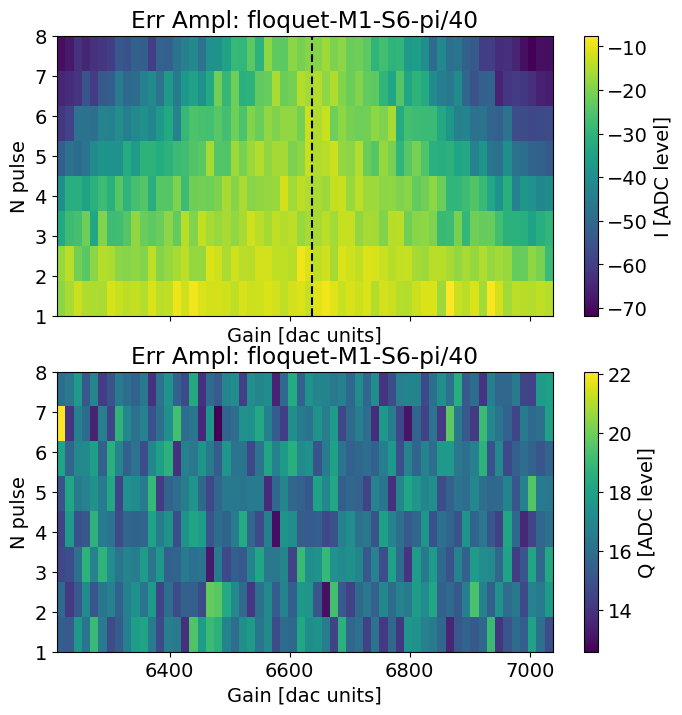

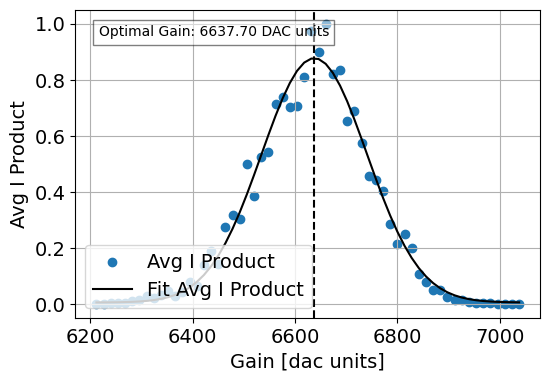

Job submitted: JOB-20260905-00224 (queue position: 1)

[0.0s] Job JOB-20260905-00224: pending

[2.0s] Job JOB-20260905-00224: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260905-00224_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 6/7 [00:18<00:03,  3.17s/it]
[25.6s] Job JOB-20260905-00224: completed
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:21<00:00,  3.14s/it]
Saving C:\experiments\260818_qsim_spectroscopy\data\JOB-20260905-00224_ErrorAmplificationExperiment.h5
[WORKER] Saving expt object to: C:

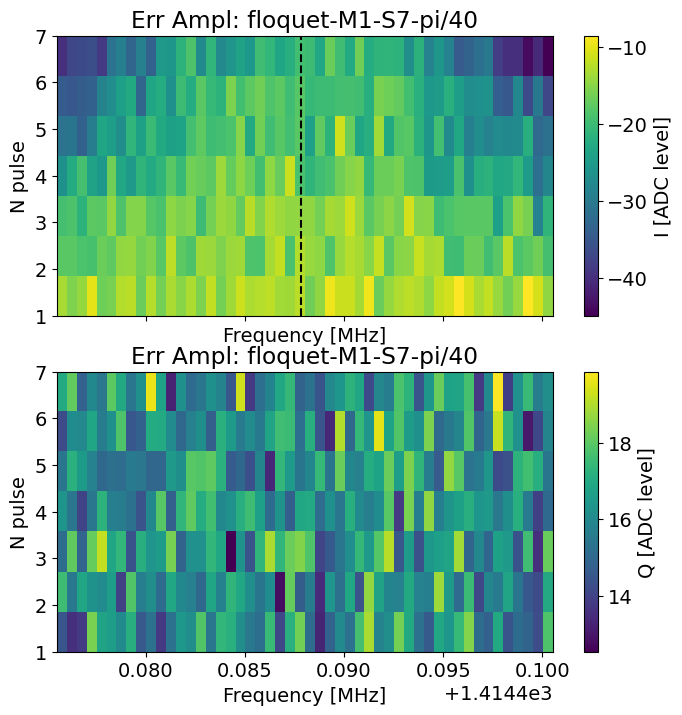

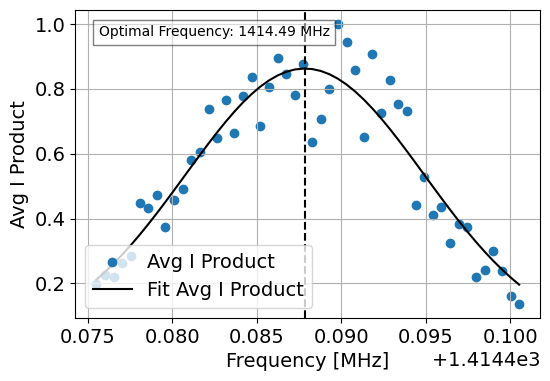

Job submitted: JOB-20260905-00225 (queue position: 1)

[0.0s] Job JOB-20260905-00225: pending

[3.3s] Job JOB-20260905-00225: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260905-00225_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 7/8 [00:25<00:03,  3.75s/it]
[31.6s] Job JOB-20260905-00225: completed
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:29<00:00,  3.72s/it]
Saving C:\experiments\260818_qsim_spectroscopy\data\JOB-20260905-00225_ErrorAmplificationExperiment.h5
[WORKER] Saving expt object to: C:

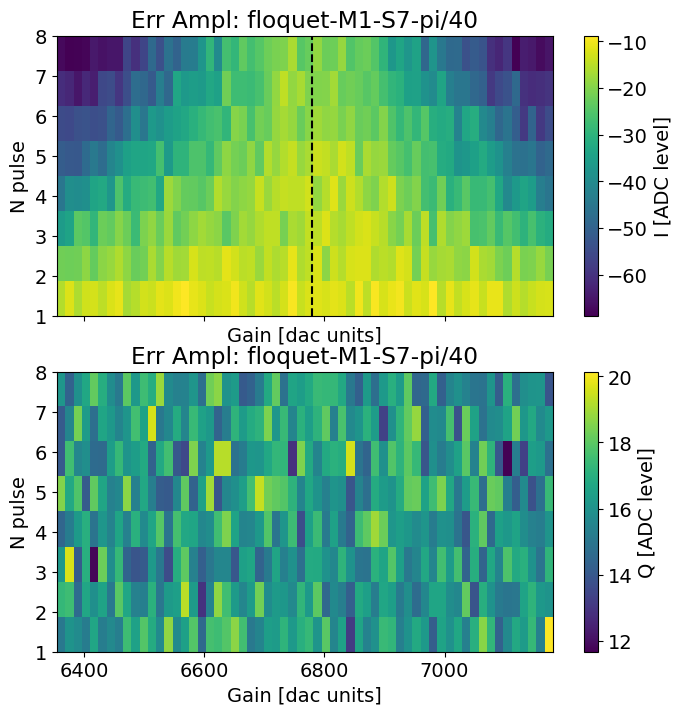

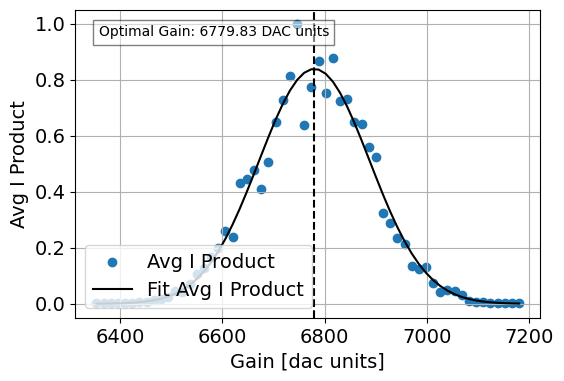

In [61]:
freq_span_default = 0.1
gain_span_default = 0.3

do_freq_erroramp = True
do_gain_erroramp = True

for i, stor_i in enumerate(stor_modes_to_run):
    stor_idx = stor_i - 1
    stor_name = 'M1-S' + str(stor_i)
    
    freq_span = freq_span_default if freq_span_list[stor_idx] is None else freq_span_list[stor_idx]
    gain_span = gain_span_default if gain_span_list[stor_idx] is None else gain_span_list[stor_idx]
    
    if do_freq_erroramp:
        error_amp_freq1[i] = error_amp_floquet_runner.execute(
            stor_mode_no=stor_i,
            parameter_to_test='frequency',
            go_kwargs=dict(analyze=False, progress=True, display=False),
            span = freq_span / 2, # 0.2 is default, but we want to be more precise since we are already close
            
            # relax_delay=8000,
            relax_delay = 200,
            active_reset=True,
            man_reset=True, 
            storage_reset=[stor_i], 
            reset_dump_mode = active_reset_default_dict["reset_dump_mode"],
            
            # floquet_sync_delay = 10
            
        )
        if not station.log_measurements:
            error_amp_freq1[i].display()
    if do_gain_erroramp:
        error_amp_gain1[i] = error_amp_floquet_runner.execute(
            stor_mode_no=stor_i,
            parameter_to_test='gain',   
            go_kwargs=dict(analyze=False, progress=True, display=False),
            span=int(station.ds_floquet.get_gain(stor_name) * gain_span / 2), #0.7 is default
            # span = 59,
            expts = 60,
            # expts=60,
            
            # relax_delay=8000,
            relax_delay = 200,
            active_reset=True,
            man_reset=True, 
            storage_reset=[stor_i], 
            reset_dump_mode = active_reset_default_dict["reset_dump_mode"],
            
            # floquet_sync_delay = 10
            
        )
        if not station.log_measurements:
            error_amp_gain1[i].display()

## Phase Accumulation

In [111]:
phase_expts = [[None for _ in range(7)] for _ in range(7)]

sideband_stark_error_amp_defaults = AttrDict(dict(
    expts=1,
    reps=100,
    rounds=1,
    qubits=[0],
    f0g1_cavity=1,  #  1/2 name of manipulate cavity
    init_stor=0, # storage mode number to initialize to n=1 Fock state (0=man)
    ro_stor=0, # storage mode number that gets read out in the end (0=man)
    advance_phases=np.linspace(-15, 15, 51).tolist(),
    n_pulses=np.arange(0, 24, 4).tolist(),
    swept_params=['n_pulse', 'advance_phase'],
    normalize=False, # not sure what this does
    active_reset=False,
    man_reset=False, 
    storage_reset=False, 
    prepulse=True,
    postpulse=True,
    init_fock=True,
))
sideband_stark_error_amp_defaults.update(active_reset_default_dict)
sideband_stark_error_amp_defaults.update(floquet_default_dict)


def sideband_stark_error_amp_preproc(station, default_expt_cfg, **kwargs):
    assert 'stor_A' in kwargs
    assert 'stor_B' in kwargs

    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.update(kwargs)
    print(expt_cfg)
    return expt_cfg

def sideband_stark_error_amp_postproc(station, expt):
    storA = expt.cfg.expt.stor_A
    storB = expt.cfg.expt.stor_B
    stor_name = 'M1-S' + str(storA)
    from_stor_name = 'M1-S' + str(storB)
    expt.analyze(fit=True)
    expt.display(fit=True)
    # opt_phase = expt.data['fit_avgi'][2] / 2 # divide by 2 since did pi/12, -pi/12 on the from_stor swap
    opt_phase = expt.data['fit_avgi'][2] # not dividing seems to give the correct result somehow? TODO: figure out why
    print("Opt phase on", stor_name, "from", from_stor_name, ":", opt_phase)
    station.ds_floquet.update_phase_from(stor_name, from_stor_name, opt_phase)
    # Legacy block: snapshot intentionally disabled.

sideband_stark_error_amp_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.SidebandStarkAmplificationExperiment,
    # ExptProgram=meas.qsim.floquet_dark_mode_readout.SidebandStarkAmplificationModifiedProgram,
    ExptProgram=meas.qsim.floquet_dark_mode_readout.SidebandStarkAmplificationModifiedProgram_old, #meas.SidebandStarkAmplificationProgram,
    default_expt_cfg=sideband_stark_error_amp_defaults,
    preprocessor=sideband_stark_error_amp_preproc,
    postprocessor=sideband_stark_error_amp_postproc,
    job_client=client,
)

Starting experiment for storage modes: 3 from 6
{'expts': 1, 'reps': 100, 'rounds': 1, 'qubits': [0], 'f0g1_cavity': 1, 'init_stor': 0, 'ro_stor': 0, 'advance_phases': [-30.0, -28.8, -27.6, -26.4, -25.2, -24.0, -22.8, -21.6, -20.4, -19.200000000000003, -18.0, -16.8, -15.600000000000001, -14.4, -13.2, -12.0, -10.8, -9.600000000000001, -8.400000000000002, -7.199999999999999, -6.0, -4.800000000000001, -3.6000000000000014, -2.400000000000002, -1.2000000000000028, 0.0, 1.1999999999999993, 2.3999999999999986, 3.6000000000000014, 4.799999999999997, 6.0, 7.199999999999996, 8.399999999999999, 9.600000000000001, 10.799999999999997, 12.0, 13.199999999999996, 14.399999999999999, 15.600000000000001, 16.799999999999997, 18.0, 19.199999999999996, 20.4, 21.6, 22.799999999999997, 24.0, 25.199999999999996, 26.4, 27.599999999999994, 28.799999999999997, 30.0], 'n_pulses': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9], 'swept_params': ['n_pulse', 'advance_phase'], 'normalize': False, 'active_reset': True, 'man_reset': Tr

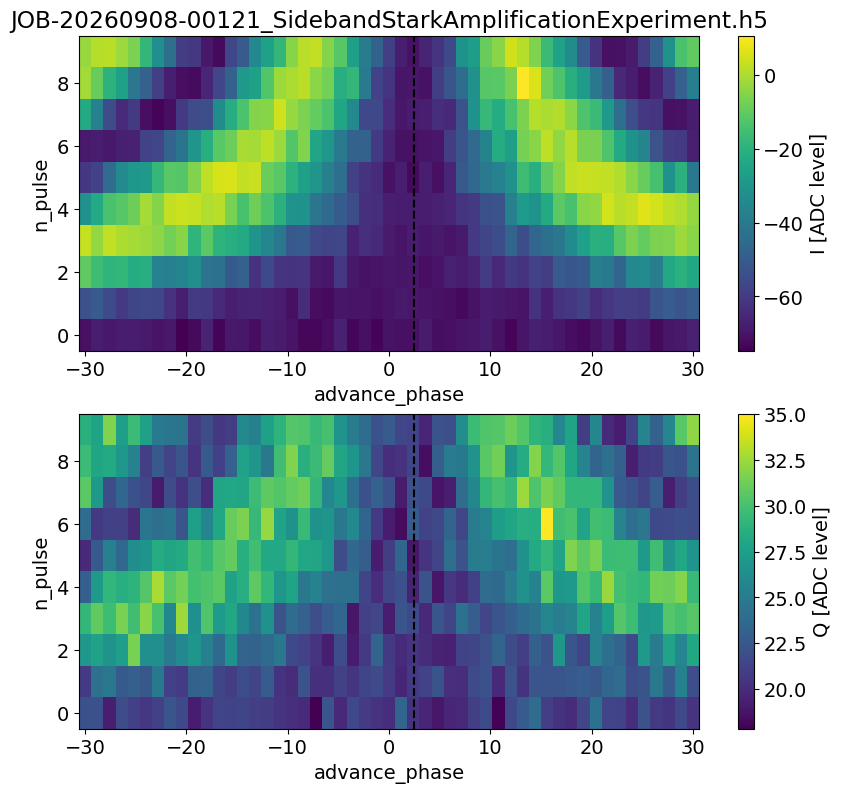

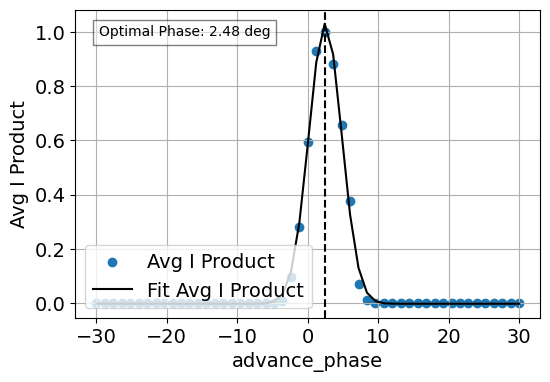

Opt phase on M1-S3 from M1-S6 : 2.4757853316640777
[log_measurement] Appended section to G:\Shared drives\SLab\Multimode\Lab\jonginn\EncSpec\2026\09\2026-09-08.md


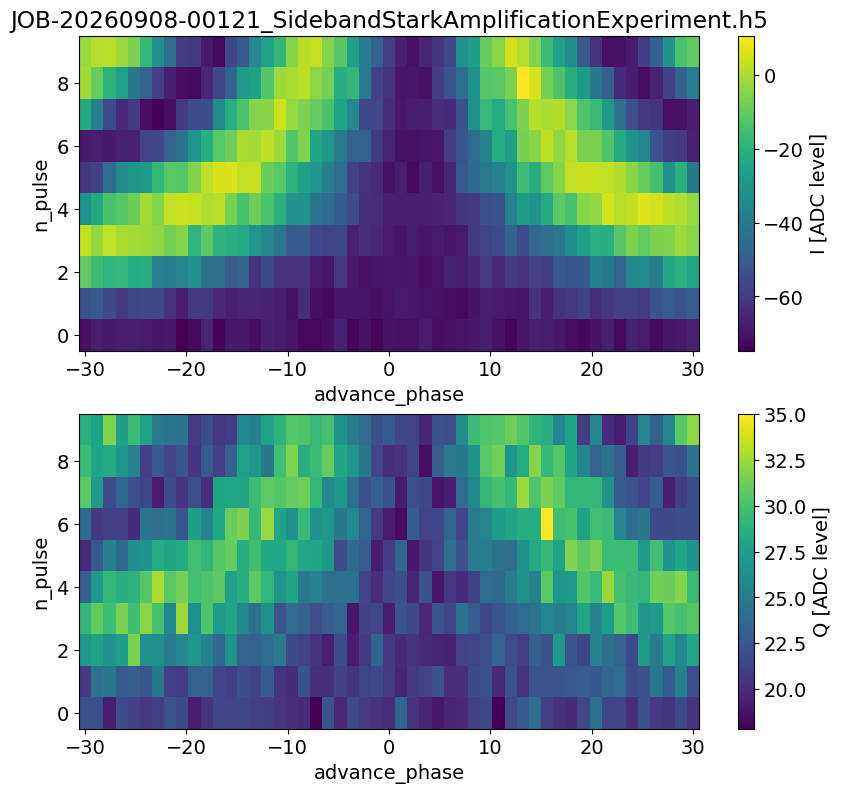

Starting experiment for storage modes: 6 from 3
{'expts': 1, 'reps': 100, 'rounds': 1, 'qubits': [0], 'f0g1_cavity': 1, 'init_stor': 0, 'ro_stor': 0, 'advance_phases': [-30.0, -28.8, -27.6, -26.4, -25.2, -24.0, -22.8, -21.6, -20.4, -19.200000000000003, -18.0, -16.8, -15.600000000000001, -14.4, -13.2, -12.0, -10.8, -9.600000000000001, -8.400000000000002, -7.199999999999999, -6.0, -4.800000000000001, -3.6000000000000014, -2.400000000000002, -1.2000000000000028, 0.0, 1.1999999999999993, 2.3999999999999986, 3.6000000000000014, 4.799999999999997, 6.0, 7.199999999999996, 8.399999999999999, 9.600000000000001, 10.799999999999997, 12.0, 13.199999999999996, 14.399999999999999, 15.600000000000001, 16.799999999999997, 18.0, 19.199999999999996, 20.4, 21.6, 22.799999999999997, 24.0, 25.199999999999996, 26.4, 27.599999999999994, 28.799999999999997, 30.0], 'n_pulses': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9], 'swept_params': ['n_pulse', 'advance_phase'], 'normalize': False, 'active_reset': True, 'man_reset': Tr

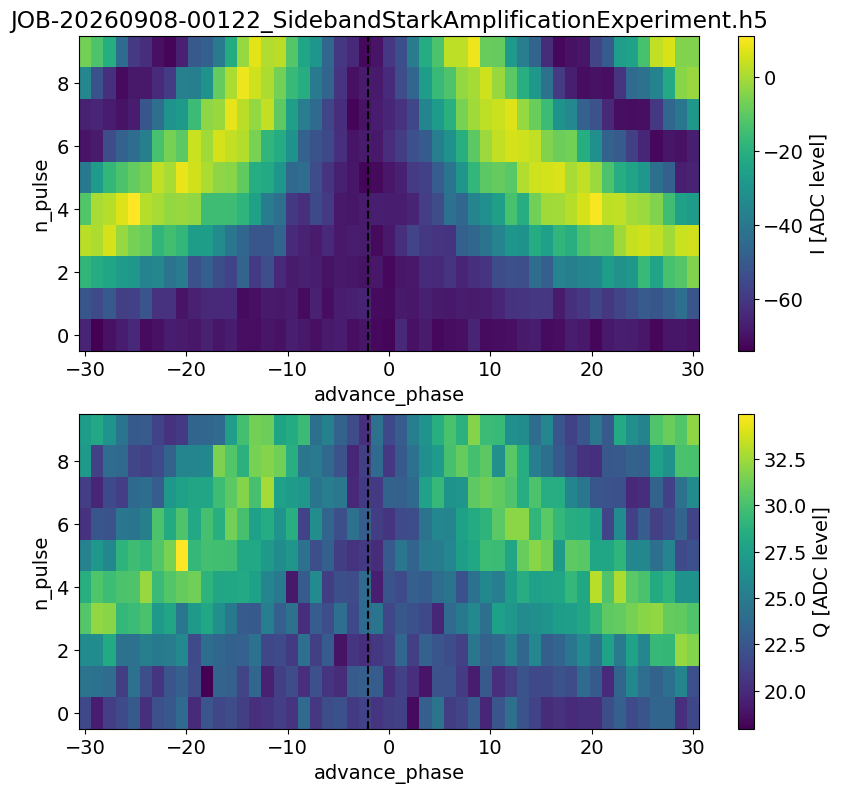

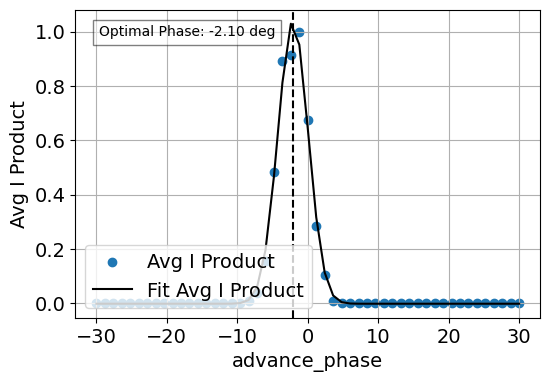

Opt phase on M1-S6 from M1-S3 : -2.0966357551143346
[log_measurement] Appended section to G:\Shared drives\SLab\Multimode\Lab\jonginn\EncSpec\2026\09\2026-09-08.md


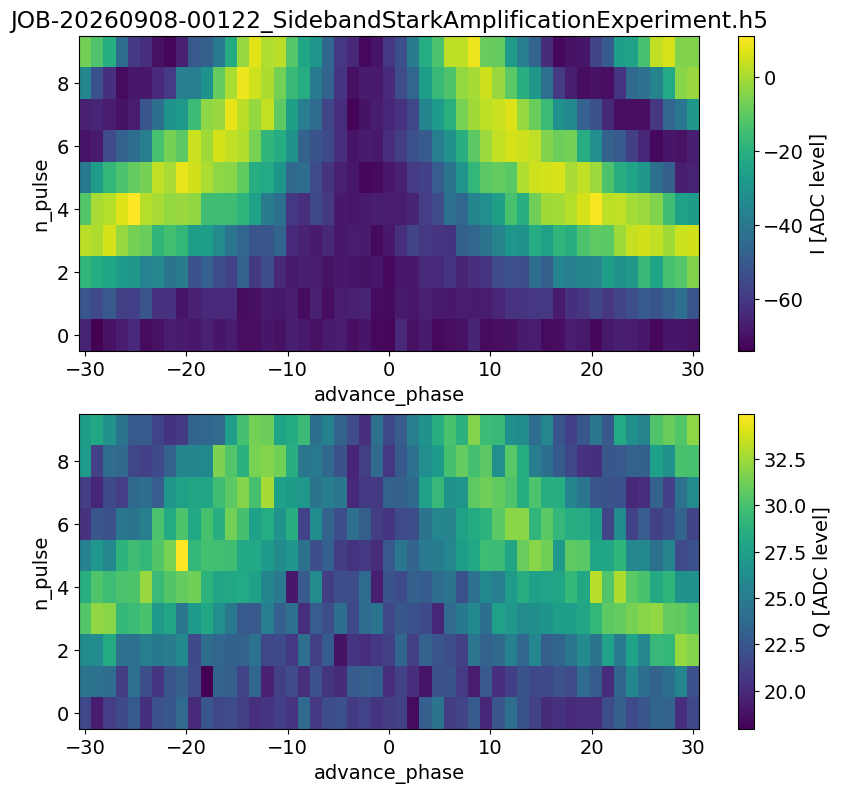

In [112]:
# stor_modes_to_run = [1, 2, 5, 6, 7] #list(range(1,8))
stor_modes_to_run = [3, 6] #list(range(1,8))

# stor_modes_to_run = [1, 4] #list(range(1,8))

do_active_reset = True
relax_delay = 200
if not do_active_reset:
    relax_delay = 8000
    
    
for iA, init_storA in enumerate(stor_modes_to_run): #range(1,8):
    for iB, init_storB in enumerate(stor_modes_to_run): #range(1,8):
        if init_storA == init_storB:
            continue
        print("Starting experiment for storage modes:", init_storA, "from", init_storB)

        qbe = sideband_stark_error_amp_runner.execute(
            stor_A=init_storA,
            stor_B=init_storB,
            # relax_delay=8000,
            relax_delay = relax_delay,
            active_reset=do_active_reset,
            man_reset=True, 
            storage_reset=[init_storA, init_storB], 
            reset_dump_mode = active_reset_default_dict["reset_dump_mode"],
            reps=100,
            include_10cycles_buffer = floquet_default_dict["include_10cycles_buffer"],
            include_10cycles_buffer_in_pi_half = floquet_default_dict["include_10cycles_buffer_in_pi_half"],
            advance_phases=np.linspace(-30, 30, 51).tolist(),
            n_pulses=np.arange(0, 10, 1).tolist(),
            
            scramble_sync_cycles = floquet_default_dict["scramble_sync_cycles"]
        )
        phase_expts[init_storA - 1][init_storB - 1] = qbe

In [ ]:
station.update_all_station_snapshots()

### Redo or add calibration

In [ ]:
stor_modes_to = [2] #list(range(1,8))
stor_modes_from = [6]
for iA, init_storA in enumerate(stor_modes_to): #range(1,8):
    for iB, init_storB in enumerate(stor_modes_from): #range(1,8):
        if init_storA == init_storB:
            continue
        print("Starting experiment for storage modes:", init_storA, "from", init_storB)

        qbe = sideband_stark_error_amp_runner.execute(
            stor_A=init_storA,
            stor_B=init_storB,
            
            # relax_delay=8000,
            relax_delay = 100,
            active_reset=True,
            man_reset=True, 
            storage_reset=[init_storA, init_storB], 
            reset_dump_mode = active_reset_default_dict["reset_dump_mode"],
            reps=100,
            include_10cycles_buffer = floquet_default_dict["include_10cycles_buffer"],
            
            include_10cycles_buffer_in_pi_half = floquet_default_dict["include_10cycles_buffer_in_pi_half"],
            
            scramble_sync_cycles = floquet_default_dict["scramble_sync_cycles"], 
            advance_phases=np.linspace(-30, 30, 301).tolist(),
            # n_pulses=np.arange(0, 24, 4).tolist(),
        )
        phase_expts[init_storA - 1][init_storB - 1] = qbe

### Add modes

Starting experiment for storage modes: 2 from 3
{'expts': 1, 'reps': 100, 'rounds': 1, 'qubits': [0], 'f0g1_cavity': 1, 'init_stor': 0, 'ro_stor': 0, 'advance_phases': [-20.0, -19.6, -19.2, -18.8, -18.4, -18.0, -17.6, -17.2, -16.8, -16.4, -16.0, -15.6, -15.2, -14.8, -14.399999999999999, -14.0, -13.6, -13.2, -12.8, -12.399999999999999, -12.0, -11.6, -11.2, -10.799999999999999, -10.399999999999999, -10.0, -9.6, -9.2, -8.799999999999999, -8.399999999999999, -8.0, -7.6, -7.199999999999999, -6.799999999999999, -6.399999999999999, -6.0, -5.6, -5.199999999999999, -4.799999999999999, -4.399999999999999, -4.0, -3.599999999999998, -3.1999999999999993, -2.8000000000000007, -2.3999999999999986, -2.0, -1.5999999999999979, -1.1999999999999993, -0.7999999999999972, -0.3999999999999986, 0.0, 0.40000000000000213, 0.8000000000000007, 1.2000000000000028, 1.6000000000000014, 2.0, 2.400000000000002, 2.8000000000000007, 3.200000000000003, 3.6000000000000014, 4.0, 4.400000000000002, 4.800000000000001, 5.2000

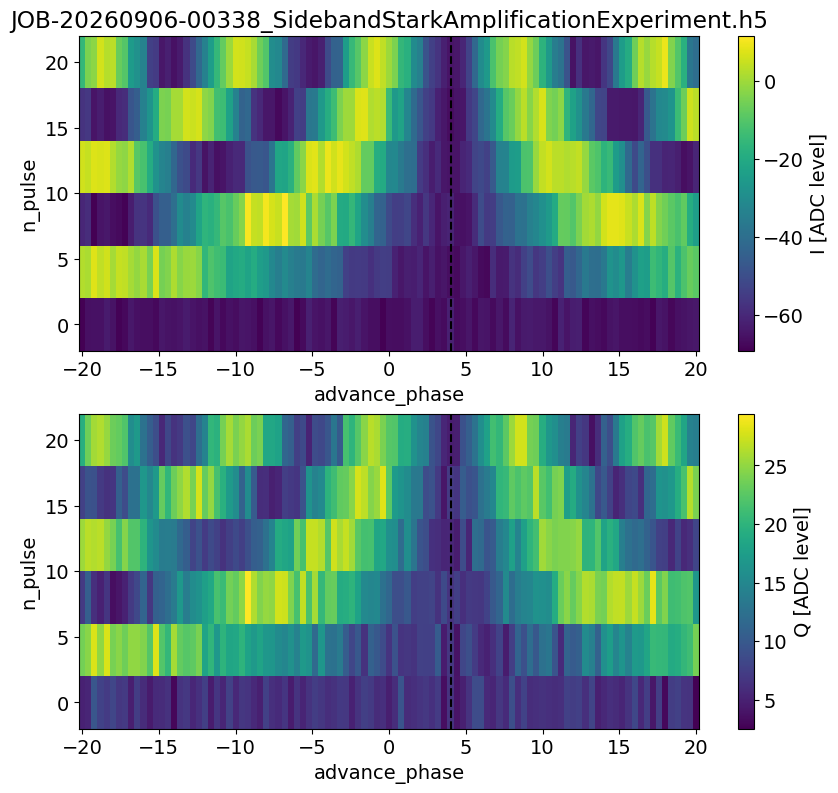

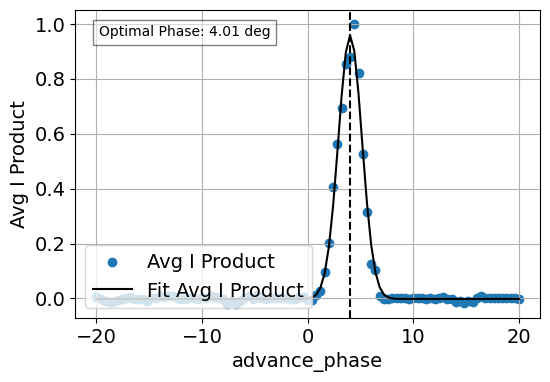

Opt phase on M1-S2 from M1-S3 : 4.0094248096275855
[log_measurement] Appended section to G:\Shared drives\SLab\Multimode\Lab\jonginn\EncSpec\2026\09\2026-09-06.md


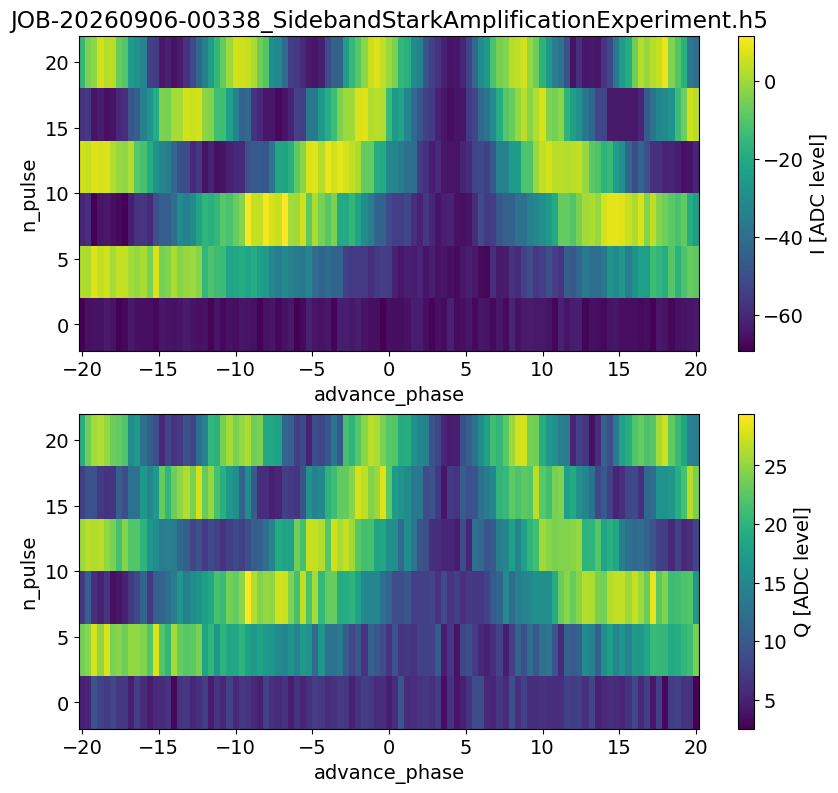

Starting experiment for storage modes: 2 from 4
{'expts': 1, 'reps': 100, 'rounds': 1, 'qubits': [0], 'f0g1_cavity': 1, 'init_stor': 0, 'ro_stor': 0, 'advance_phases': [-20.0, -19.6, -19.2, -18.8, -18.4, -18.0, -17.6, -17.2, -16.8, -16.4, -16.0, -15.6, -15.2, -14.8, -14.399999999999999, -14.0, -13.6, -13.2, -12.8, -12.399999999999999, -12.0, -11.6, -11.2, -10.799999999999999, -10.399999999999999, -10.0, -9.6, -9.2, -8.799999999999999, -8.399999999999999, -8.0, -7.6, -7.199999999999999, -6.799999999999999, -6.399999999999999, -6.0, -5.6, -5.199999999999999, -4.799999999999999, -4.399999999999999, -4.0, -3.599999999999998, -3.1999999999999993, -2.8000000000000007, -2.3999999999999986, -2.0, -1.5999999999999979, -1.1999999999999993, -0.7999999999999972, -0.3999999999999986, 0.0, 0.40000000000000213, 0.8000000000000007, 1.2000000000000028, 1.6000000000000014, 2.0, 2.400000000000002, 2.8000000000000007, 3.200000000000003, 3.6000000000000014, 4.0, 4.400000000000002, 4.800000000000001, 5.2000

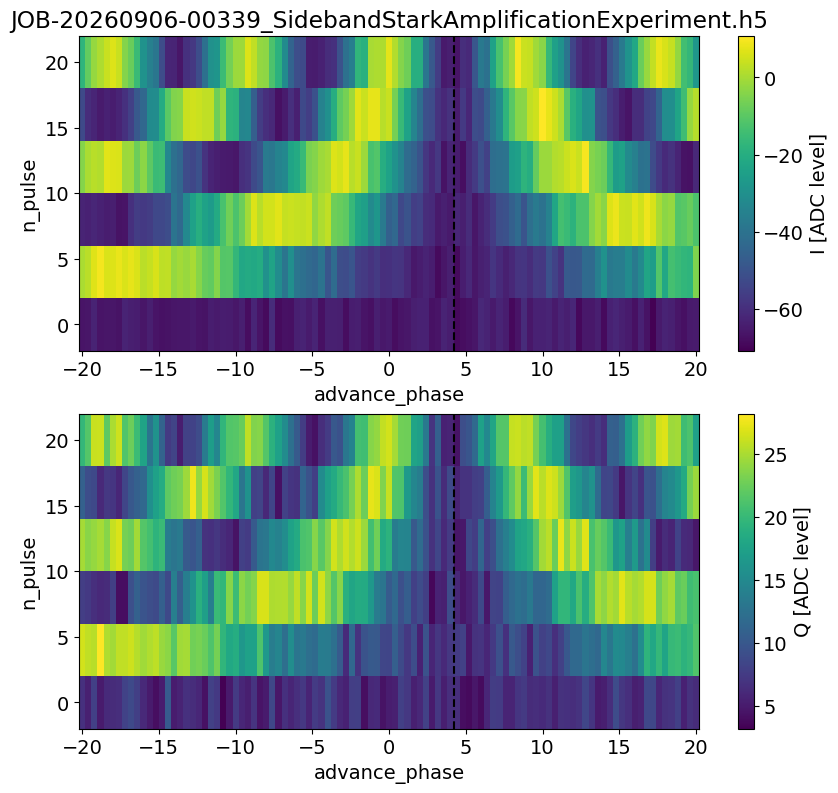

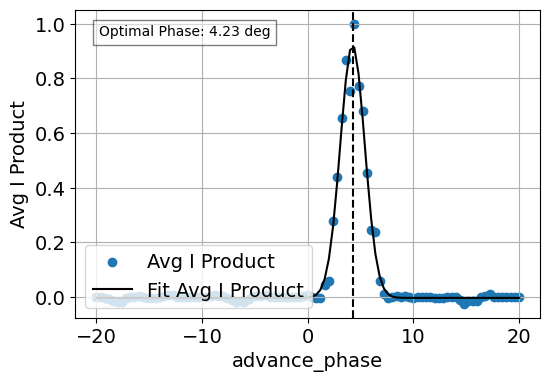

Opt phase on M1-S2 from M1-S4 : 4.233247536471396
[log_measurement] Appended section to G:\Shared drives\SLab\Multimode\Lab\jonginn\EncSpec\2026\09\2026-09-06.md


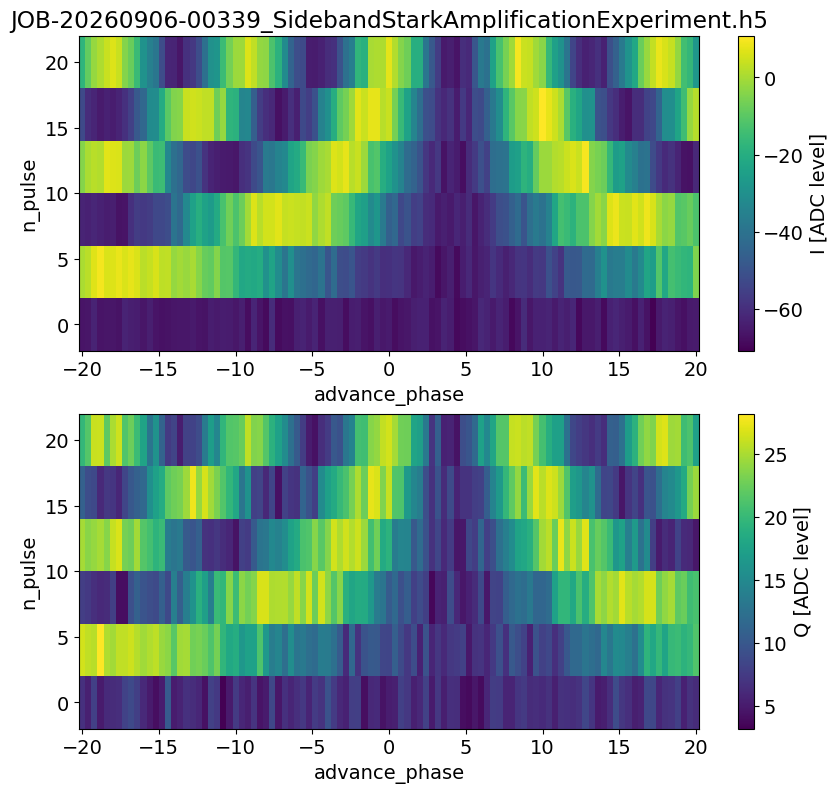

Starting experiment for storage modes: 2 from 5
{'expts': 1, 'reps': 100, 'rounds': 1, 'qubits': [0], 'f0g1_cavity': 1, 'init_stor': 0, 'ro_stor': 0, 'advance_phases': [-20.0, -19.6, -19.2, -18.8, -18.4, -18.0, -17.6, -17.2, -16.8, -16.4, -16.0, -15.6, -15.2, -14.8, -14.399999999999999, -14.0, -13.6, -13.2, -12.8, -12.399999999999999, -12.0, -11.6, -11.2, -10.799999999999999, -10.399999999999999, -10.0, -9.6, -9.2, -8.799999999999999, -8.399999999999999, -8.0, -7.6, -7.199999999999999, -6.799999999999999, -6.399999999999999, -6.0, -5.6, -5.199999999999999, -4.799999999999999, -4.399999999999999, -4.0, -3.599999999999998, -3.1999999999999993, -2.8000000000000007, -2.3999999999999986, -2.0, -1.5999999999999979, -1.1999999999999993, -0.7999999999999972, -0.3999999999999986, 0.0, 0.40000000000000213, 0.8000000000000007, 1.2000000000000028, 1.6000000000000014, 2.0, 2.400000000000002, 2.8000000000000007, 3.200000000000003, 3.6000000000000014, 4.0, 4.400000000000002, 4.800000000000001, 5.2000

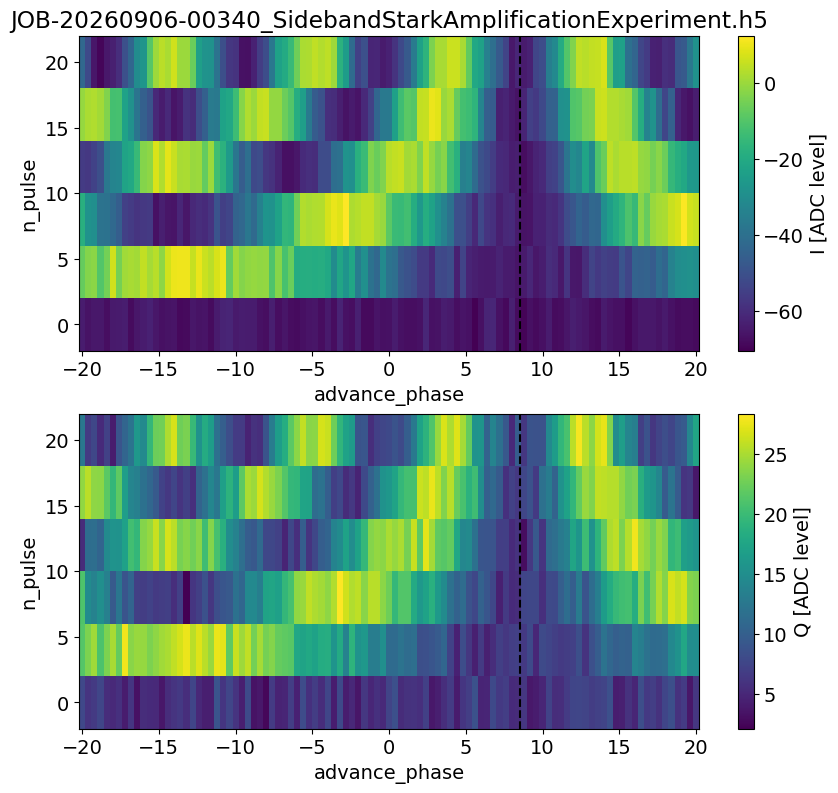

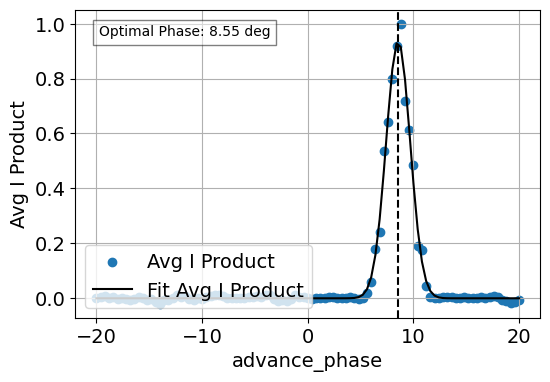

Opt phase on M1-S2 from M1-S5 : 8.55178462240621
[log_measurement] Appended section to G:\Shared drives\SLab\Multimode\Lab\jonginn\EncSpec\2026\09\2026-09-06.md


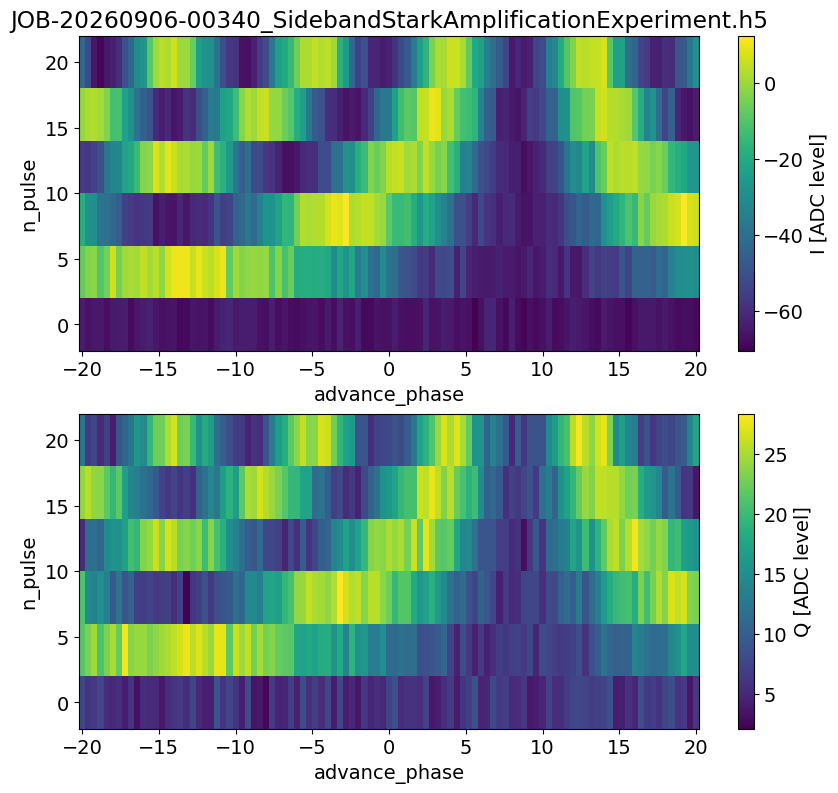

Starting experiment for storage modes: 2 from 6
{'expts': 1, 'reps': 100, 'rounds': 1, 'qubits': [0], 'f0g1_cavity': 1, 'init_stor': 0, 'ro_stor': 0, 'advance_phases': [-20.0, -19.6, -19.2, -18.8, -18.4, -18.0, -17.6, -17.2, -16.8, -16.4, -16.0, -15.6, -15.2, -14.8, -14.399999999999999, -14.0, -13.6, -13.2, -12.8, -12.399999999999999, -12.0, -11.6, -11.2, -10.799999999999999, -10.399999999999999, -10.0, -9.6, -9.2, -8.799999999999999, -8.399999999999999, -8.0, -7.6, -7.199999999999999, -6.799999999999999, -6.399999999999999, -6.0, -5.6, -5.199999999999999, -4.799999999999999, -4.399999999999999, -4.0, -3.599999999999998, -3.1999999999999993, -2.8000000000000007, -2.3999999999999986, -2.0, -1.5999999999999979, -1.1999999999999993, -0.7999999999999972, -0.3999999999999986, 0.0, 0.40000000000000213, 0.8000000000000007, 1.2000000000000028, 1.6000000000000014, 2.0, 2.400000000000002, 2.8000000000000007, 3.200000000000003, 3.6000000000000014, 4.0, 4.400000000000002, 4.800000000000001, 5.2000

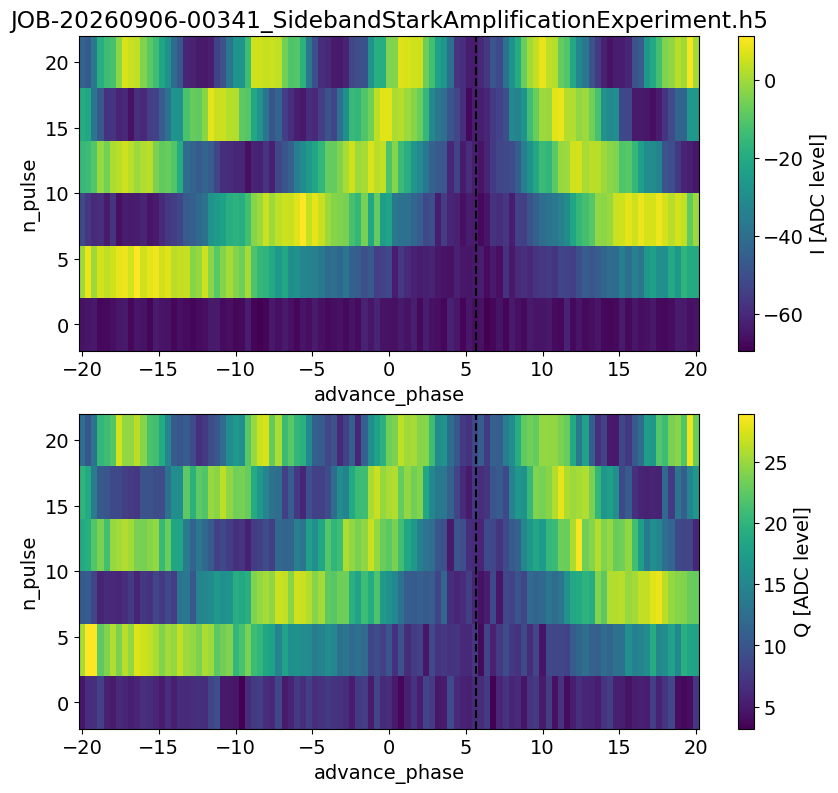

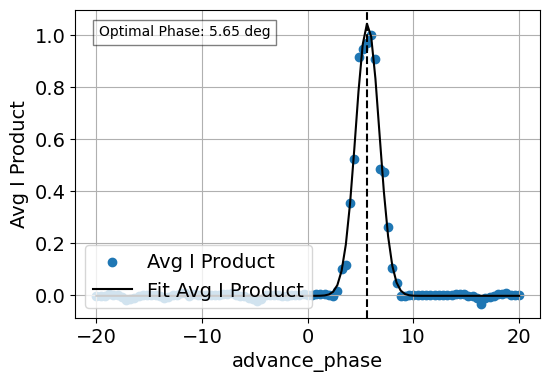

Opt phase on M1-S2 from M1-S6 : 5.6472986994418335
[log_measurement] Appended section to G:\Shared drives\SLab\Multimode\Lab\jonginn\EncSpec\2026\09\2026-09-06.md


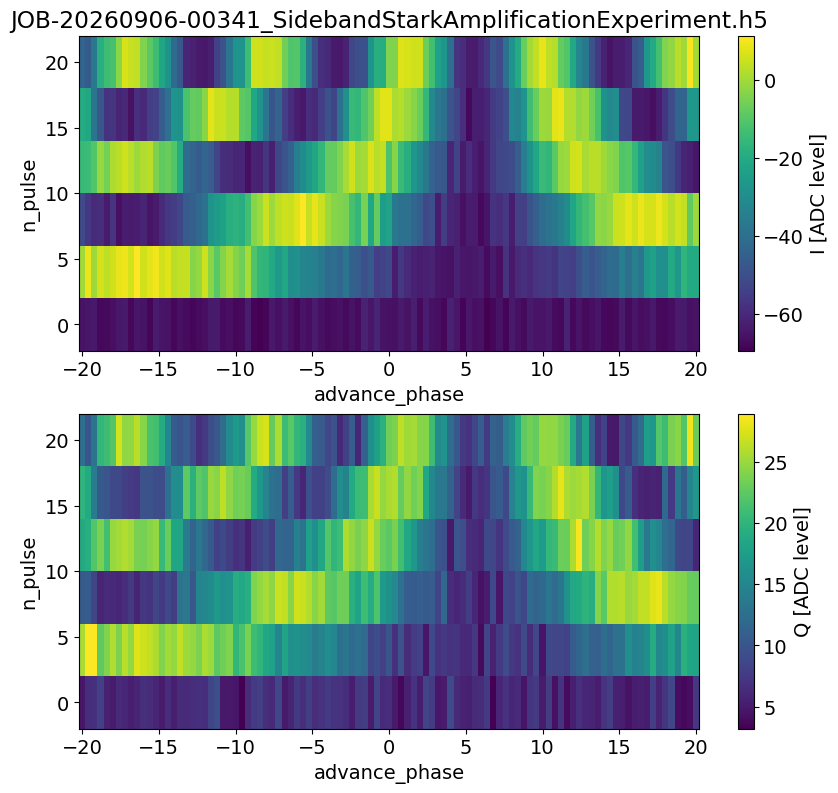

Starting experiment for storage modes: 3 from 2
{'expts': 1, 'reps': 100, 'rounds': 1, 'qubits': [0], 'f0g1_cavity': 1, 'init_stor': 0, 'ro_stor': 0, 'advance_phases': [-20.0, -19.6, -19.2, -18.8, -18.4, -18.0, -17.6, -17.2, -16.8, -16.4, -16.0, -15.6, -15.2, -14.8, -14.399999999999999, -14.0, -13.6, -13.2, -12.8, -12.399999999999999, -12.0, -11.6, -11.2, -10.799999999999999, -10.399999999999999, -10.0, -9.6, -9.2, -8.799999999999999, -8.399999999999999, -8.0, -7.6, -7.199999999999999, -6.799999999999999, -6.399999999999999, -6.0, -5.6, -5.199999999999999, -4.799999999999999, -4.399999999999999, -4.0, -3.599999999999998, -3.1999999999999993, -2.8000000000000007, -2.3999999999999986, -2.0, -1.5999999999999979, -1.1999999999999993, -0.7999999999999972, -0.3999999999999986, 0.0, 0.40000000000000213, 0.8000000000000007, 1.2000000000000028, 1.6000000000000014, 2.0, 2.400000000000002, 2.8000000000000007, 3.200000000000003, 3.6000000000000014, 4.0, 4.400000000000002, 4.800000000000001, 5.2000

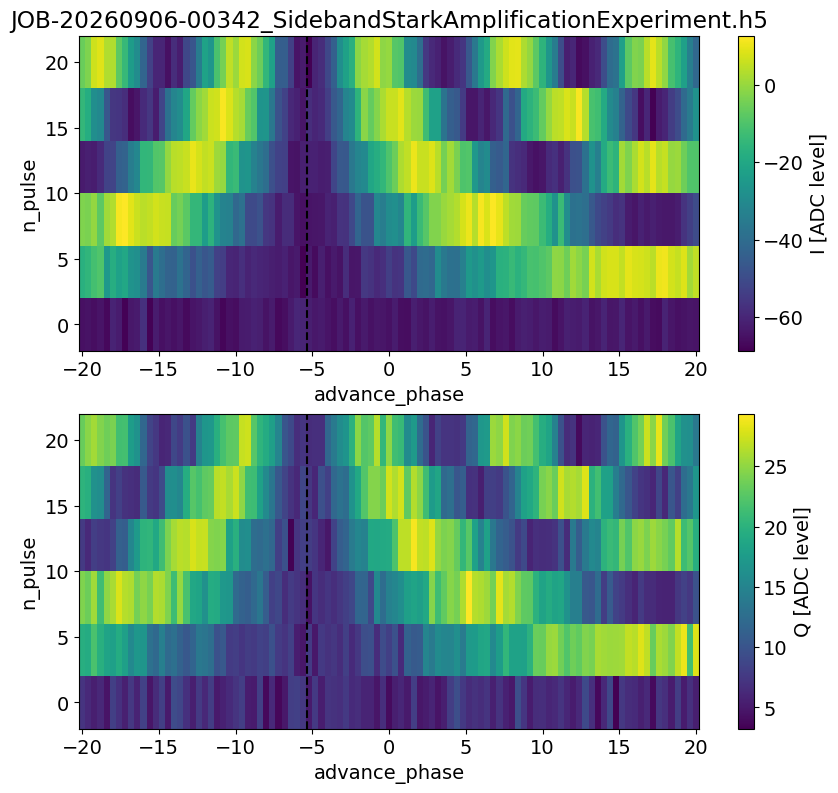

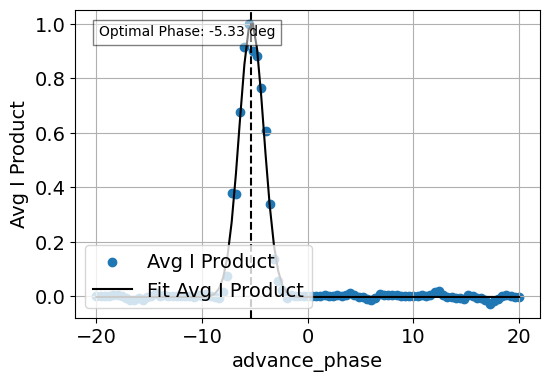

Opt phase on M1-S3 from M1-S2 : -5.325927306340681
[log_measurement] Appended section to G:\Shared drives\SLab\Multimode\Lab\jonginn\EncSpec\2026\09\2026-09-06.md


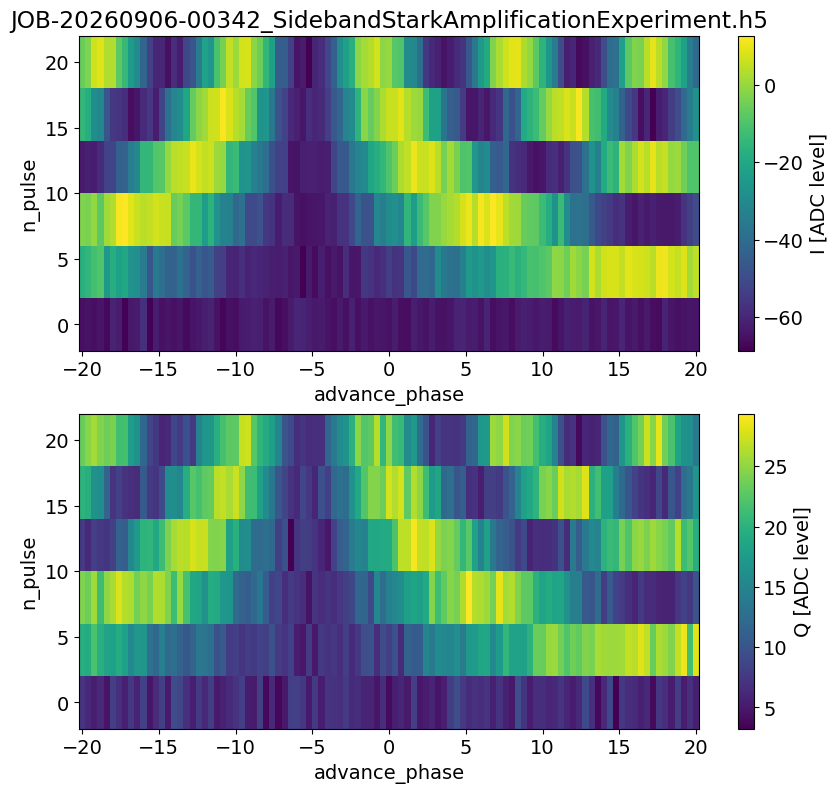

Starting experiment for storage modes: 4 from 2
{'expts': 1, 'reps': 100, 'rounds': 1, 'qubits': [0], 'f0g1_cavity': 1, 'init_stor': 0, 'ro_stor': 0, 'advance_phases': [-20.0, -19.6, -19.2, -18.8, -18.4, -18.0, -17.6, -17.2, -16.8, -16.4, -16.0, -15.6, -15.2, -14.8, -14.399999999999999, -14.0, -13.6, -13.2, -12.8, -12.399999999999999, -12.0, -11.6, -11.2, -10.799999999999999, -10.399999999999999, -10.0, -9.6, -9.2, -8.799999999999999, -8.399999999999999, -8.0, -7.6, -7.199999999999999, -6.799999999999999, -6.399999999999999, -6.0, -5.6, -5.199999999999999, -4.799999999999999, -4.399999999999999, -4.0, -3.599999999999998, -3.1999999999999993, -2.8000000000000007, -2.3999999999999986, -2.0, -1.5999999999999979, -1.1999999999999993, -0.7999999999999972, -0.3999999999999986, 0.0, 0.40000000000000213, 0.8000000000000007, 1.2000000000000028, 1.6000000000000014, 2.0, 2.400000000000002, 2.8000000000000007, 3.200000000000003, 3.6000000000000014, 4.0, 4.400000000000002, 4.800000000000001, 5.2000

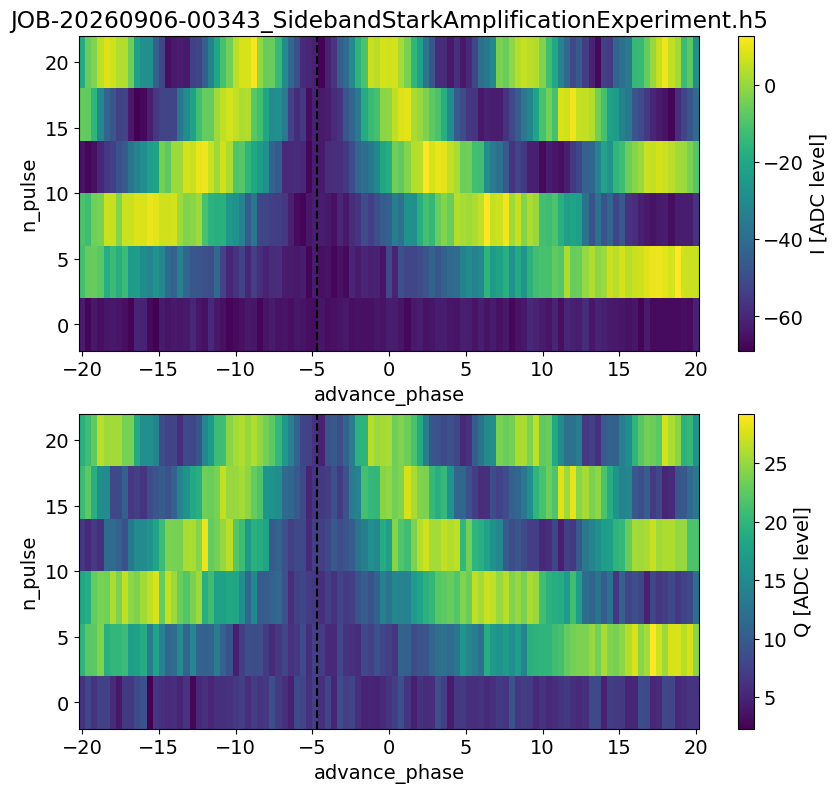

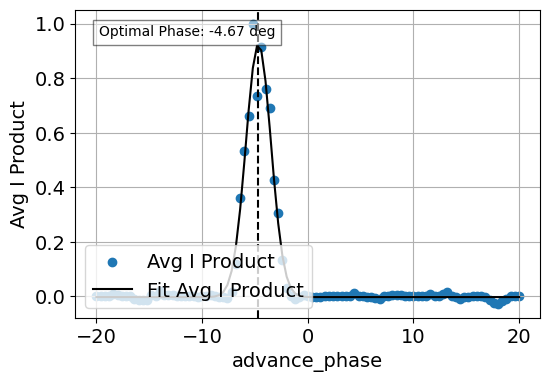

Opt phase on M1-S4 from M1-S2 : -4.668352810160684
[log_measurement] Appended section to G:\Shared drives\SLab\Multimode\Lab\jonginn\EncSpec\2026\09\2026-09-06.md


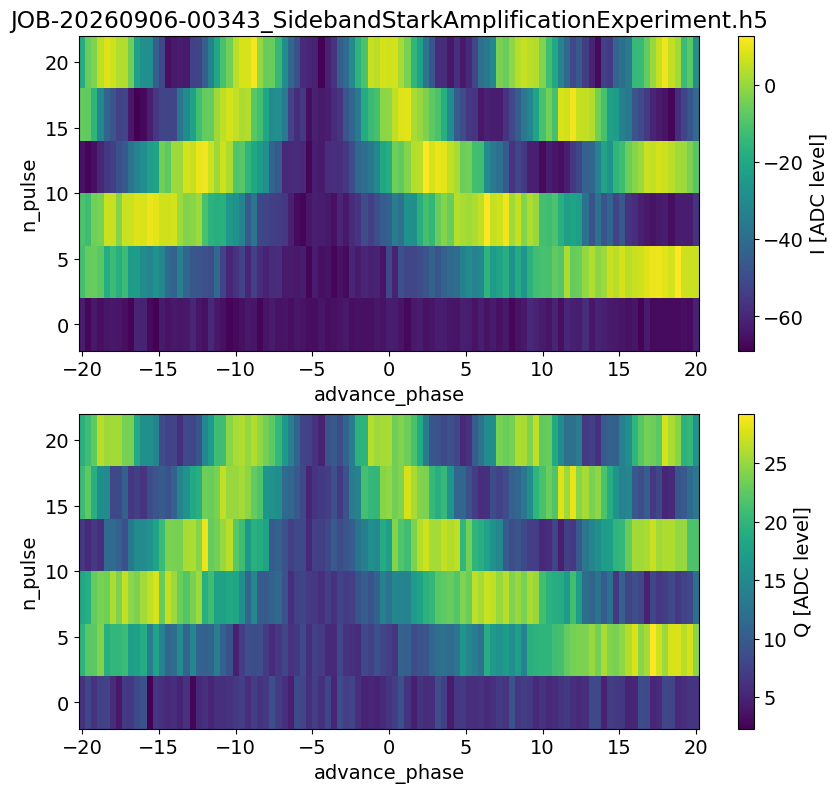

Starting experiment for storage modes: 5 from 2
{'expts': 1, 'reps': 100, 'rounds': 1, 'qubits': [0], 'f0g1_cavity': 1, 'init_stor': 0, 'ro_stor': 0, 'advance_phases': [-20.0, -19.6, -19.2, -18.8, -18.4, -18.0, -17.6, -17.2, -16.8, -16.4, -16.0, -15.6, -15.2, -14.8, -14.399999999999999, -14.0, -13.6, -13.2, -12.8, -12.399999999999999, -12.0, -11.6, -11.2, -10.799999999999999, -10.399999999999999, -10.0, -9.6, -9.2, -8.799999999999999, -8.399999999999999, -8.0, -7.6, -7.199999999999999, -6.799999999999999, -6.399999999999999, -6.0, -5.6, -5.199999999999999, -4.799999999999999, -4.399999999999999, -4.0, -3.599999999999998, -3.1999999999999993, -2.8000000000000007, -2.3999999999999986, -2.0, -1.5999999999999979, -1.1999999999999993, -0.7999999999999972, -0.3999999999999986, 0.0, 0.40000000000000213, 0.8000000000000007, 1.2000000000000028, 1.6000000000000014, 2.0, 2.400000000000002, 2.8000000000000007, 3.200000000000003, 3.6000000000000014, 4.0, 4.400000000000002, 4.800000000000001, 5.2000

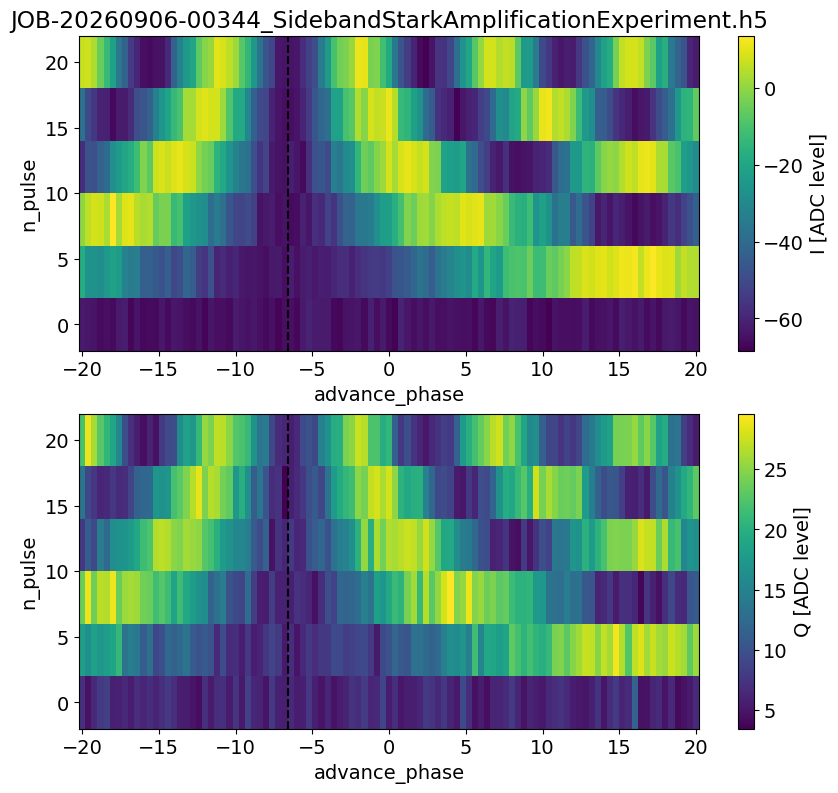

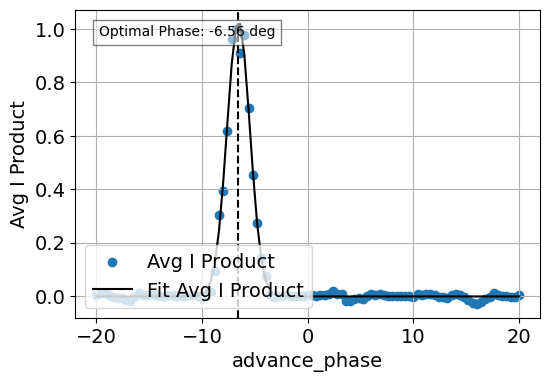

Opt phase on M1-S5 from M1-S2 : -6.561361801005514
[log_measurement] Appended section to G:\Shared drives\SLab\Multimode\Lab\jonginn\EncSpec\2026\09\2026-09-06.md


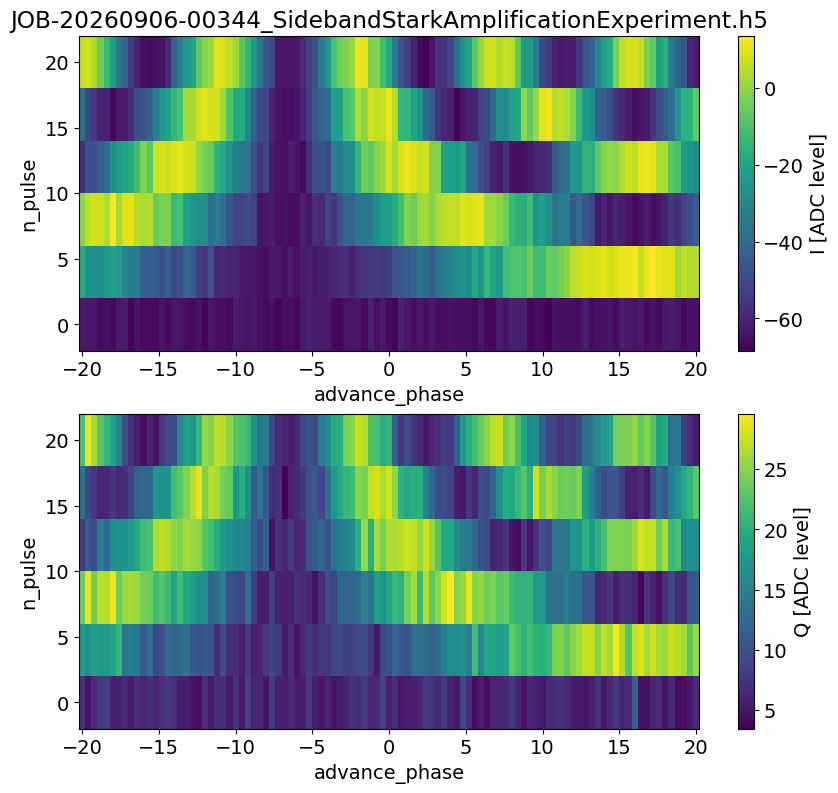

Starting experiment for storage modes: 6 from 2
{'expts': 1, 'reps': 100, 'rounds': 1, 'qubits': [0], 'f0g1_cavity': 1, 'init_stor': 0, 'ro_stor': 0, 'advance_phases': [-20.0, -19.6, -19.2, -18.8, -18.4, -18.0, -17.6, -17.2, -16.8, -16.4, -16.0, -15.6, -15.2, -14.8, -14.399999999999999, -14.0, -13.6, -13.2, -12.8, -12.399999999999999, -12.0, -11.6, -11.2, -10.799999999999999, -10.399999999999999, -10.0, -9.6, -9.2, -8.799999999999999, -8.399999999999999, -8.0, -7.6, -7.199999999999999, -6.799999999999999, -6.399999999999999, -6.0, -5.6, -5.199999999999999, -4.799999999999999, -4.399999999999999, -4.0, -3.599999999999998, -3.1999999999999993, -2.8000000000000007, -2.3999999999999986, -2.0, -1.5999999999999979, -1.1999999999999993, -0.7999999999999972, -0.3999999999999986, 0.0, 0.40000000000000213, 0.8000000000000007, 1.2000000000000028, 1.6000000000000014, 2.0, 2.400000000000002, 2.8000000000000007, 3.200000000000003, 3.6000000000000014, 4.0, 4.400000000000002, 4.800000000000001, 5.2000

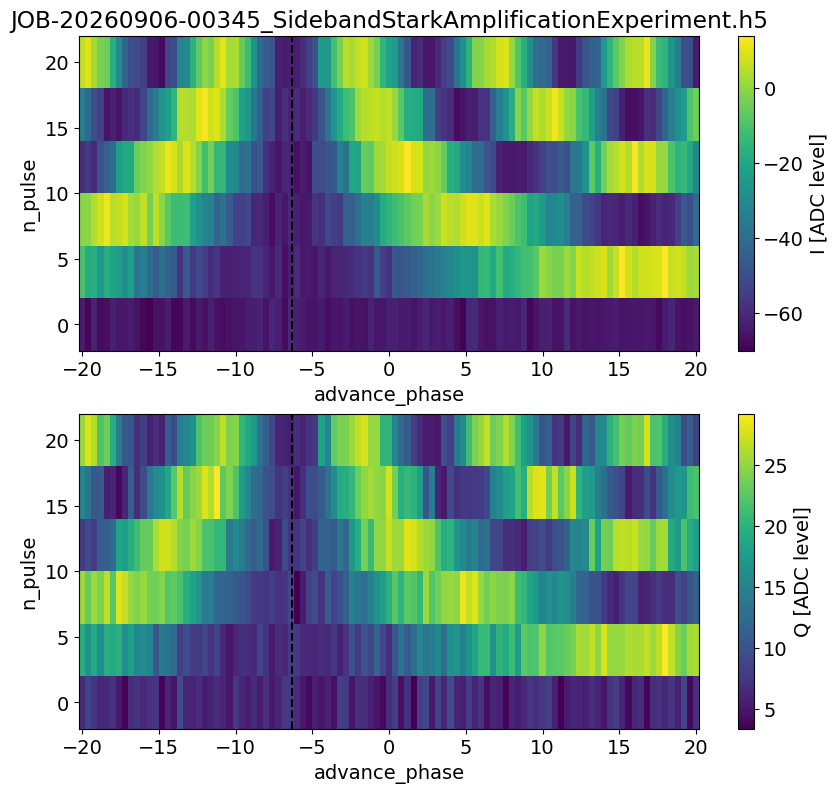

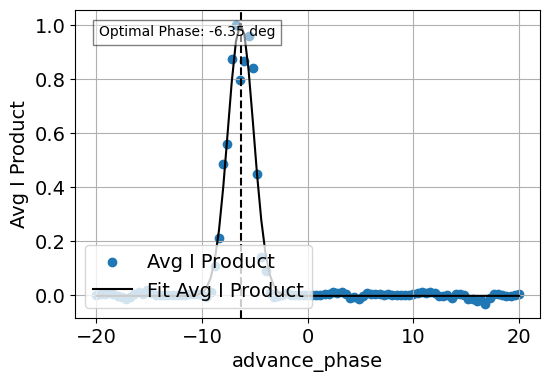

Opt phase on M1-S6 from M1-S2 : -6.348065758542024
[log_measurement] Appended section to G:\Shared drives\SLab\Multimode\Lab\jonginn\EncSpec\2026\09\2026-09-06.md


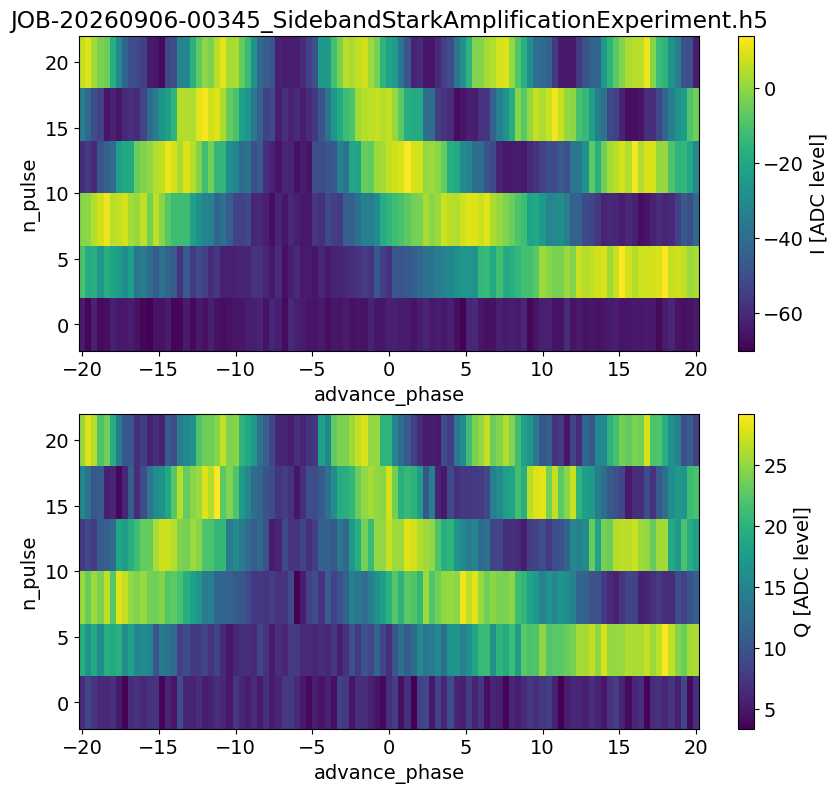

In [186]:
stor_modes_to_add = [2] #list(range(1,8))
pre_existing_store_modes = [3, 4, 5, 6]

total_stor_modes = list(set(pre_existing_store_modes + stor_modes_to_add))
for iA, init_storA in enumerate(total_stor_modes): #range(1,8):
    for iB, init_storB in enumerate(total_stor_modes): #range(1,8):
        if init_storA == init_storB:
            continue
        elif (init_storA in pre_existing_store_modes) and (init_storB in pre_existing_store_modes):
            continue
        
        print("Starting experiment for storage modes:", init_storA, "from", init_storB)

        qbe = sideband_stark_error_amp_runner.execute(
            stor_A=init_storA,
            stor_B=init_storB,
            
            # relax_delay=8000,
            relax_delay = 100,
            active_reset=True,
            man_reset=True, 
            storage_reset=[init_storA, init_storB], 
            reset_dump_mode = active_reset_default_dict["reset_dump_mode"],
            reps=100,
            include_10cycles_buffer = floquet_default_dict["include_10cycles_buffer"],
            include_10cycles_buffer_in_pi_half = floquet_default_dict["include_10cycles_buffer_in_pi_half"],
            
            scramble_sync_cycles = floquet_default_dict["scramble_sync_cycles"], 
            advance_phases=np.linspace(-20, 20, 101).tolist(),
            # n_pulses=np.arange(0, 24, 4).tolist(),
        )
        phase_expts[init_storA - 1][init_storB - 1] = qbe

In [ ]:
station.update_all_station_snapshots()

# Cooling

##  Spectroscopy

In [ ]:
cool_spec_defaults = AttrDict(dict(
    reps=100,              # repetitions
    rounds=1,             # rounds
    qubits=[0],           # qubits
    init_stor = 7,
    ro_stor = 7,
    init_fock=True,
    # cooling_freq=7150,      # Ramsey frequency
    cooling_gain=2000,
    cooling_length=1,
    swept_params=['cooling_freq'], #, 'cooling_gain'],
    cooling_freqs = np.linspace(7050, 7150, 1001).tolist(),
    active_reset=False,   # active reset
    man_reset=True,       # manipulate reset
    storage_reset=True,   # storage reset
    relax_delay=8000,

    normalize=False,
    preloaded_pulses=False,
    perform_wigner=False,
    prepulse=True,
    postpulse=True,
    pre_sweep_pulse=None, # pre sweep pulse
    post_sweep_pulse=None,# post sweep pulse
))

cool_spec_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.QsimBaseExperiment,
    ExptProgram=meas.qsim.cooling.CoolingSpectroscopyProgram,
    default_expt_cfg=cool_spec_defaults,
    # preprocessor=kerr_ramsey_preproc,
    # postprocessor=kerr_ramsey_postproc,
    job_client=client,
)

In [ ]:
cool_spec = cool_spec_runner.execute(
    # cooling_gains=[5000,10000,15000,20000,25000,30000],
    cooling_gain = 25000,
    cooling_lengths=np.linspace(0.1,10,51),
    # cooling_length = 10,
    cooling_freqs = np.linspace(7097,7100,101),
    swept_params = ['cooling_length', 'cooling_freq'],
    # swept_params = ['cooling_freq'],
    init_stor = 3,
    prepulse=False,
    ro_stor = 3,
    reps = 100,
)

In [ ]:
cool_specs = []
for init_stor in [0]:
    for ro_stor in [3]:
        cool_spec = cool_spec_runner.execute(
            cooling_gain=25000,
            # cooling_lengths=np.linspace(0.1,10,51),
            cooling_length = 2,
            # cooling_freq = 7098.3,
            cooling_freqs = np.linspace(7097,7100,101),
            # swept_params = ['cooling_length', 'cooling_freq'],
            swept_params = ['cooling_freq'],
            # swept_params = ['cooling_length'],
            prepulse=False,
            postpulse=True,
            init_stor = init_stor,
            ro_stor = ro_stor,
            reps = 100,
        )
        cool_specs.append(cool_spec)

In [ ]:
cool_specs = []
for cooling_gain in [25000]:
    cool_spec = cool_spec_runner.execute(
        cooling_gain=cooling_gain,
        cooling_lengths=np.linspace(0.1,10,51),
        # cooling_length = 10,
        cooling_freq = 7098.7,
        # cooling_freqs = np.linspace(7050,7150,201),
        # swept_params = ['cooling_length', 'cooling_freq'],
        # swept_params = ['cooling_freq'],
        swept_params = ['cooling_length'],
        prepulse=False,
        postpulse=True,
        init_stor = 3,
        ro_stor = 3,
        reps = 100,
    )
    cool_specs.append(cool_spec)

In [ ]:
cool_spec.display()

In [ ]:
css.append(cool_spec)

In [ ]:
for cs in cool_specs:
    plt.plot(cs.data['xpts'], cs.data['avgi'])

plt.legend(['M1', 'S1', 'S2', 'S3', 'S7'])

In [ ]:
css = [cool_spec]

In [ ]:
fig, axs = plt.subplots(nrows=5, figsize=(8,12))
colors = plt.get_cmap('coolwarm')([0,0.25,0.5,0.75,1])

for num, cs in enumerate(cool_specs):
    init_mode = ['M1', 'S1', 'S2', 'S3', 'S7'][num//5]
    ro_mode = ['M1', 'S1', 'S2', 'S3', 'S7'][num%5]
    axs[num//5].plot(cs.data['xpts'], cs.data['avgi'], alpha=0.8, color=colors[num%5], label=f'{ro_mode}')
    ax.set_title(f'init: {init_mode}')

for ax in axs:
    ax.set_ylabel('avgi')
    ax.legend(ncols=3, fontsize=10)

axs[4].set_xlabel('freq (MHz)')
fig.tight_layout()

In [ ]:
from experiments import QsimBaseExperiment

In [ ]:
cs = QsimBaseExperiment.from_h5file(station.data_path / 'JOB-20260427-00508_QsimBaseExperiment.h5')

In [ ]:
cs.display()

In [ ]:
np.array(cool_spec.data['idata']).shape

In [ ]:
plt.scatter(np.array(cool_spec.data['idata'])[30:40], 
            np.array(cool_spec.data['qdata'])[30:40], 
            alpha=0.4, marker='.')

In [ ]:
import pickle
with open(r'D:/experiments/260410_qsim/expt_objs/JOB-20260416-00260_expt.pkl', 'rb') as f:
    tp = pickle.load(f)

In [ ]:
tp.display()

In [ ]:
[cs.fname.split('\\')[-1] for cs in cool_specs]

In [ ]:
avgis = np.array([cs.data['avgi'] for cs in cool_specs])
xpts = cool_specs[0].data['xpts']
plt.pcolormesh(xpts, [1000,3000,10000,30000], avgis)
plt.xlabel('flux drive  freq (MHz)')
plt.ylabel('flux drive gain')
plt.colorbar(label='avgi')

In [ ]:
station.update_all_station_snapshots()

# Dark Mode Readout

In [65]:
dm_sideband_scramble_defaults = AttrDict(dict(
    expts=1,
    reps=100,
    rounds=1,
    qubits=[0],
    ro_stor=0, # storage mode number that gets read out in the end

    init_fock=True,

    normalize=False,
    post_select_pre_pulse=False,
    active_reset=False,
    man_reset=False, 
    storage_reset=False, 
    prepulse=True,
    postpulse=True,
)) # Shouldn't be modifying this on the fly!
dm_sideband_scramble_defaults.update(active_reset_default_dict)
dm_sideband_scramble_defaults.update(floquet_default_dict)
# You can use kwargs in the run function to override these values

def sideband_scramble_preproc(station, default_expt_cfg, **kwargs):
    assert 'swept_params' in kwargs
    assert len(kwargs['swept_params']) > 0

    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.update(kwargs)
    assert 'init_stor' in kwargs
    if not expt_cfg.init_fock:
        assert 'init_alpha' or 'init_man_fock_state' in kwargs
        
    # print(expt_cfg)
    return expt_cfg

def floquet_cycle_list_gen(start, 
                           stop, 
                           chunk,
                           step = 1):
    _to_return = []
    _q = (stop-start)//chunk
    _start_idx = start
    for _ in range(_q):
        _to_return.append(np.arange(_start_idx, 
                                    _start_idx+chunk,
                                    step))
        _start_idx += chunk
    if _start_idx < stop:
        _to_return.append(np.arange(_start_idx, 
                                    stop, 
                                    step))
    return _to_return


In [67]:
import textwrap


def floquet_cycle_list_gen(start, 
                           stop, 
                           chunk,
                           step = 1):
    _to_return = []
    _q = (stop-start)//chunk
    _start_idx = start
    for _ in range(_q):
        _to_return.append(np.arange(_start_idx, 
                                    _start_idx+chunk,
                                    step))
        _start_idx += chunk
    if _start_idx < stop:
        
        _to_return.append(np.arange(_start_idx, 
                                    stop, 
                                    step))
    return _to_return


def unique_expts(nested_expts):
    return list(dict.fromkeys(expt for sub in nested_expts for expt in sub))

def collect_multiparity(expts):
    by_stor = {}

    for expt in expts:
        ro_stor = expt.cfg.expt.ro_stor
        mp = expt.analyze_multiparity()

        if ro_stor not in by_stor:
            by_stor[ro_stor] = []

        by_stor[ro_stor].append(mp)

    out = {}
    for ro_stor, mp_list in by_stor.items():
        keys = mp_list[0].keys()
        out[ro_stor] = {
            key: np.concatenate([mp[key] for mp in mp_list])
            for key in keys
        }

    return out


def flatten_exp_lists(items, container_types=(list, tuple, set)):
    for x in items:
        if isinstance(x, container_types):
            yield from flatten_exp_lists(x, container_types)
        else:
            yield x
            

## Bare

  0%|          | 0/8 [00:00<?, ?it/s]

Job submitted: JOB-20260908-00113 (queue position: 1)

[3.1s] Job JOB-20260908-00113: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260908-00113_QsimBaseExperiment.h5
[WORKER]   Program: SidebandScrambleDarkProgramNewNew from experiments.qsim.floquet_dark_mode_readout
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
100%|██████████████████████████████████████████| 40/40 [00:18<00:00,  2.14it/s]
Saving C:\experiments\260818_qsim_spectroscopy\data\JOB-20260908-00113_QsimBaseExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260818_qsim_spectroscopy\expt_objs\JOB-20260908-00113_expt.pkl

[26.8s] Job JOB-20260908-00113: completed

Job completed! Data: C:\experiments\260818_qsim_spectroscopy\data\JOB-20260908-00113_QsimBaseExperiment.h5
[log_measurement] Appended section 

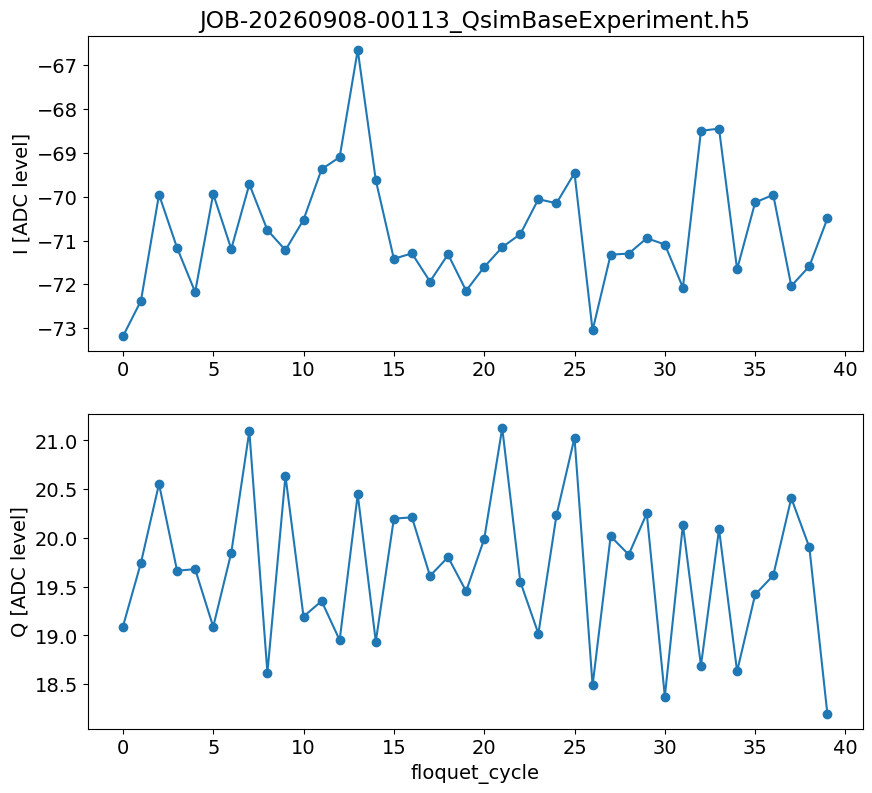

Job submitted: JOB-20260908-00114 (queue position: 1)

[3.2s] Job JOB-20260908-00114: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260908-00114_QsimBaseExperiment.h5
[WORKER]   Program: SidebandScrambleDarkProgramNewNew from experiments.qsim.floquet_dark_mode_readout
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 80%|█████████████████████████████████▌        | 32/40 [00:14<00:03,  2.17it/s]
[23.8s] Job JOB-20260908-00114: completed
100%|██████████████████████████████████████████| 40/40 [00:18<00:00,  2.14it/s]
Saving C:\experiments\260818_qsim_spectroscopy\data\JOB-20260908-00114_QsimBaseExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260818_qsim_spectroscopy\expt_objs\JOB-20260908-00114_expt.pkl

Job completed! Data: C:\experiments\260818_qsim_spectroscopy\da

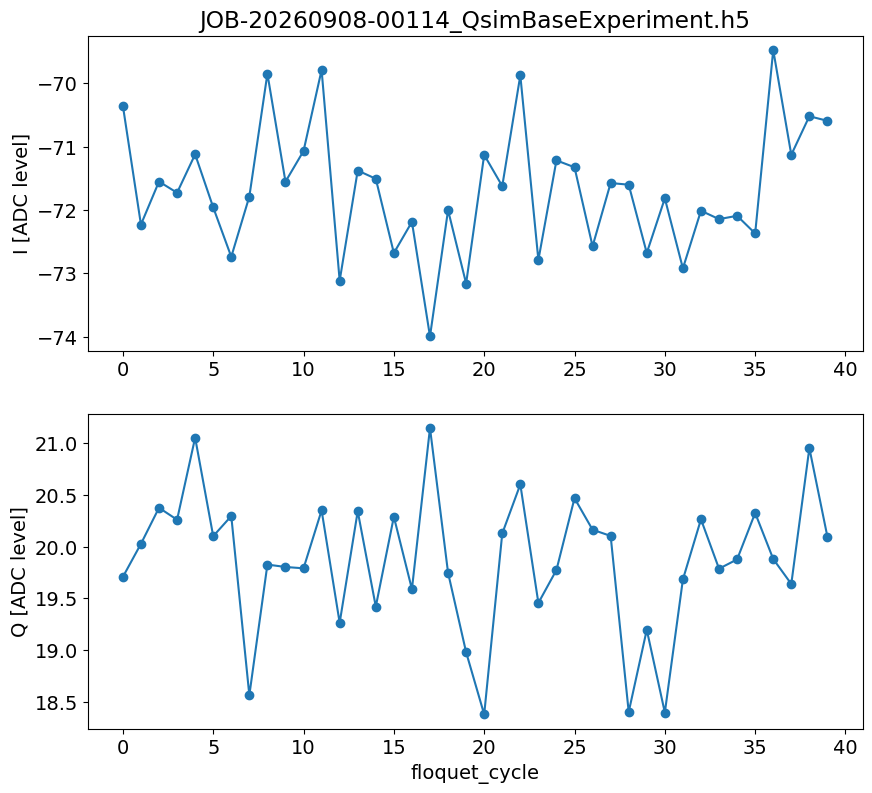

Job submitted: JOB-20260908-00115 (queue position: 1)

[3.2s] Job JOB-20260908-00115: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260908-00115_QsimBaseExperiment.h5
[WORKER]   Program: SidebandScrambleDarkProgramNewNew from experiments.qsim.floquet_dark_mode_readout
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 62%|██████████████████████████▎               | 25/40 [00:11<00:06,  2.18it/s]
[20.7s] Job JOB-20260908-00115: completed
100%|██████████████████████████████████████████| 40/40 [00:18<00:00,  2.15it/s]
Saving C:\experiments\260818_qsim_spectroscopy\data\JOB-20260908-00115_QsimBaseExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260818_qsim_spectroscopy\expt_objs\JOB-20260908-00115_expt.pkl

Job completed! Data: C:\experiments\260818_qsim_spectroscopy\da

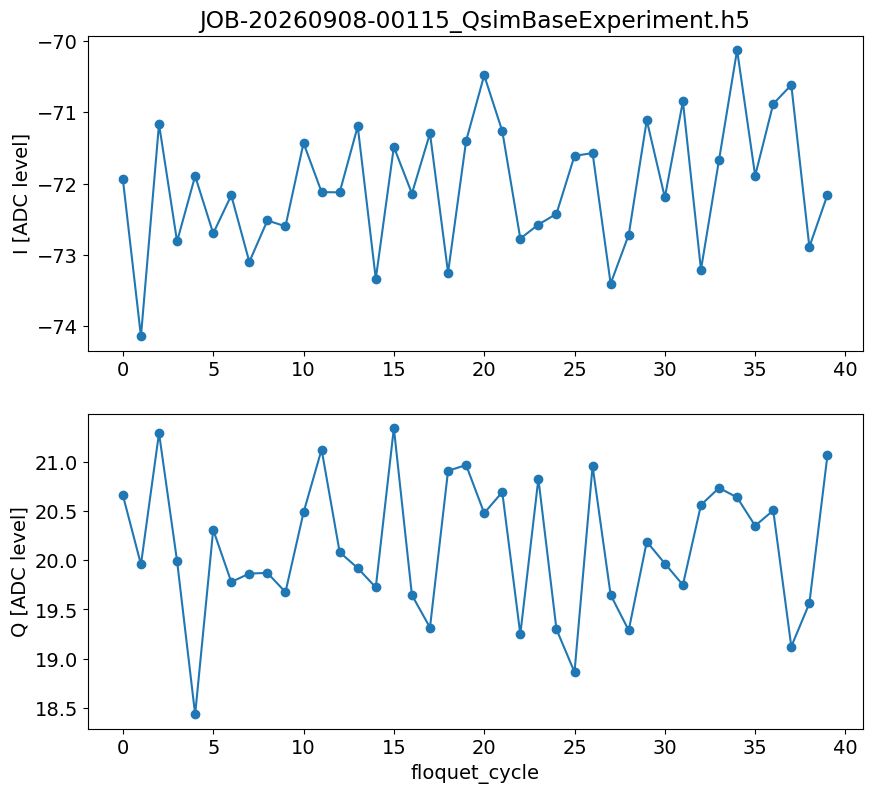

Job submitted: JOB-20260908-00116 (queue position: 1)

[4.9s] Job JOB-20260908-00116: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260908-00116_QsimBaseExperiment.h5
[WORKER]   Program: SidebandScrambleDarkProgramNewNew from experiments.qsim.floquet_dark_mode_readout
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 72%|██████████████████████████████▍           | 29/40 [00:13<00:04,  2.21it/s]
[20.7s] Job JOB-20260908-00116: completed
100%|██████████████████████████████████████████| 40/40 [00:18<00:00,  2.13it/s]
Saving C:\experiments\260818_qsim_spectroscopy\data\JOB-20260908-00116_QsimBaseExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260818_qsim_spectroscopy\expt_objs\JOB-20260908-00116_expt.pkl

Job completed! Data: C:\experiments\260818_qsim_spectroscopy\da

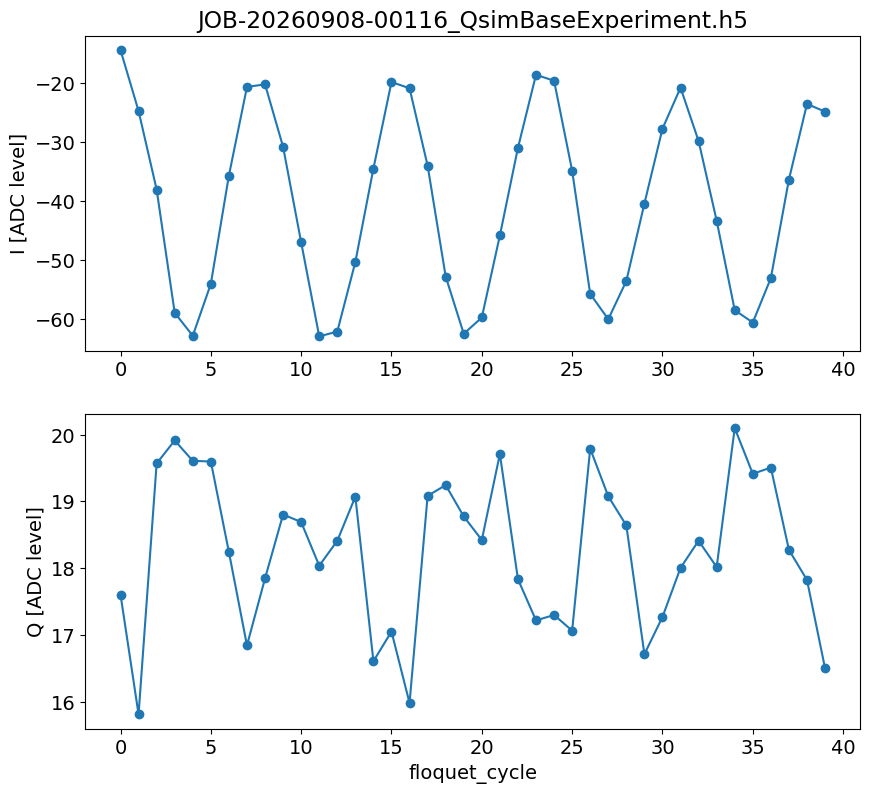

Job submitted: JOB-20260908-00117 (queue position: 1)

[3.2s] Job JOB-20260908-00117: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260908-00117_QsimBaseExperiment.h5
[WORKER]   Program: SidebandScrambleDarkProgramNewNew from experiments.qsim.floquet_dark_mode_readout
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 68%|████████████████████████████▎             | 27/40 [00:12<00:06,  2.14it/s]
[23.7s] Job JOB-20260908-00117: completed
100%|██████████████████████████████████████████| 40/40 [00:18<00:00,  2.15it/s]
Saving C:\experiments\260818_qsim_spectroscopy\data\JOB-20260908-00117_QsimBaseExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260818_qsim_spectroscopy\expt_objs\JOB-20260908-00117_expt.pkl

Job completed! Data: C:\experiments\260818_qsim_spectroscopy\da

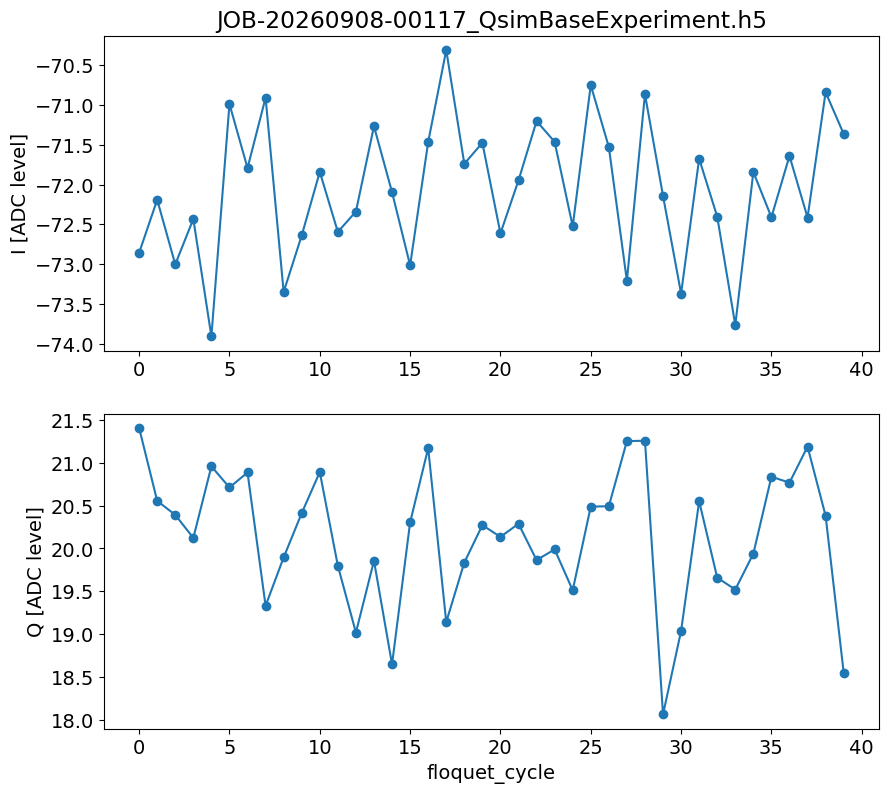

Job submitted: JOB-20260908-00118 (queue position: 1)

[4.8s] Job JOB-20260908-00118: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260908-00118_QsimBaseExperiment.h5
[WORKER]   Program: SidebandScrambleDarkProgramNewNew from experiments.qsim.floquet_dark_mode_readout
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
100%|██████████████████████████████████████████| 40/40 [00:18<00:00,  2.14it/s]
Saving C:\experiments\260818_qsim_spectroscopy\data\JOB-20260908-00118_QsimBaseExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260818_qsim_spectroscopy\expt_objs\JOB-20260908-00118_expt.pkl

[23.7s] Job JOB-20260908-00118: completed

Job completed! Data: C:\experiments\260818_qsim_spectroscopy\data\JOB-20260908-00118_QsimBaseExperiment.h5
[log_measurement] Appended section 

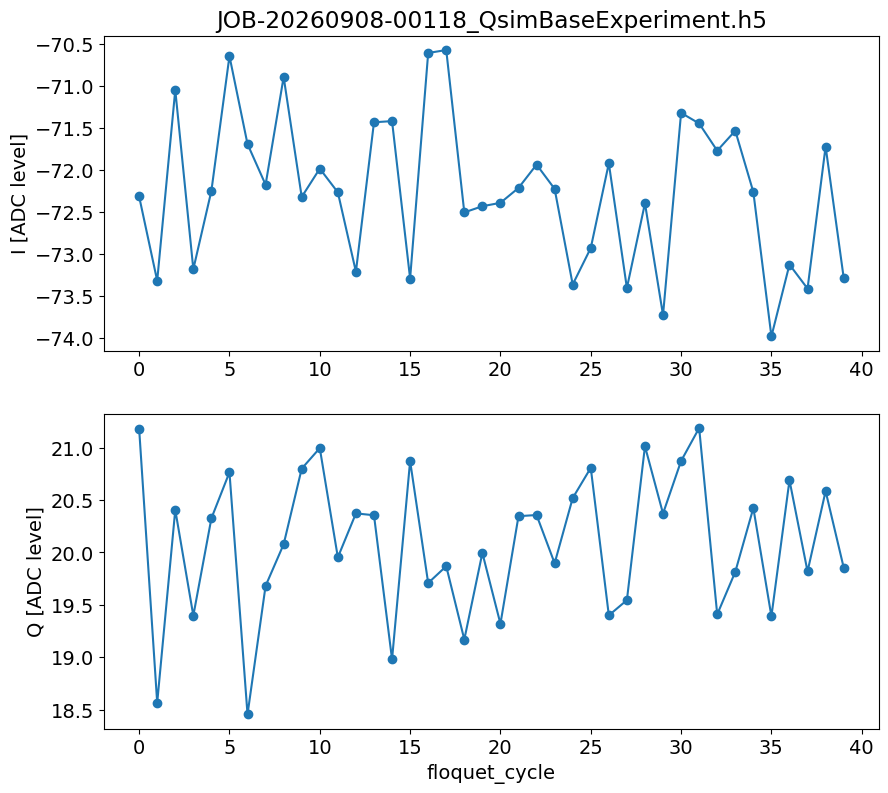

Job submitted: JOB-20260908-00119 (queue position: 1)

[0.0s] Job JOB-20260908-00119: pending

[4.8s] Job JOB-20260908-00119: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260908-00119_QsimBaseExperiment.h5
[WORKER]   Program: SidebandScrambleDarkProgramNewNew from experiments.qsim.floquet_dark_mode_readout
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 88%|████████████████████████████████████▊     | 35/40 [00:16<00:02,  2.18it/s]
[23.9s] Job JOB-20260908-00119: completed
100%|██████████████████████████████████████████| 40/40 [00:18<00:00,  2.11it/s]
Saving C:\experiments\260818_qsim_spectroscopy\data\JOB-20260908-00119_QsimBaseExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260818_qsim_spectroscopy\expt_objs\JOB-20260908-00119_expt.pkl

Job completed! Data: C:

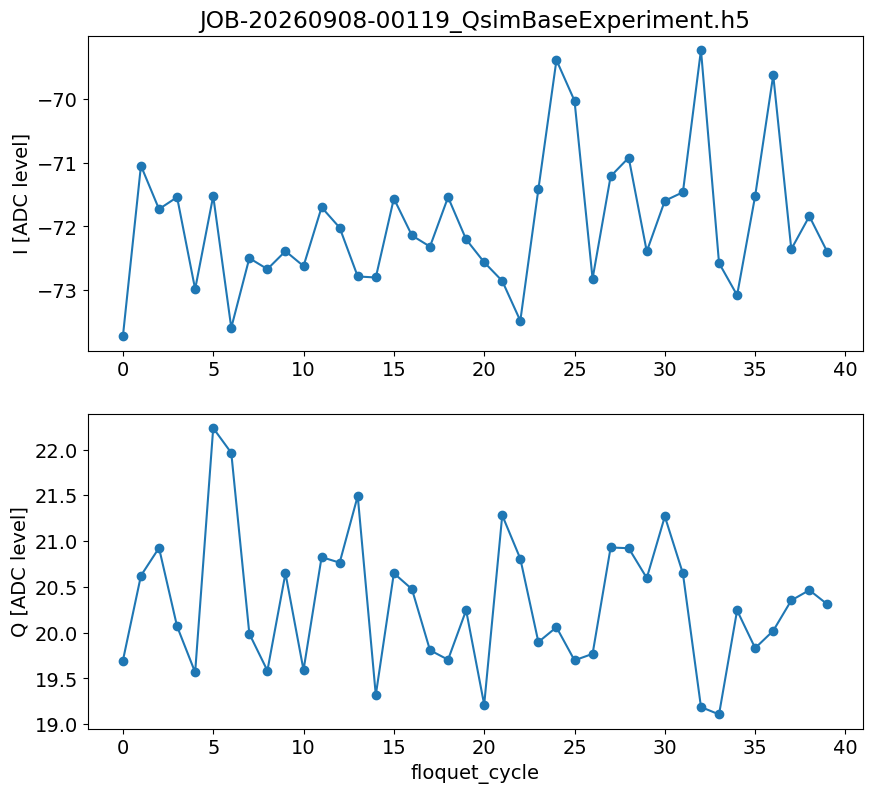

Job submitted: JOB-20260908-00120 (queue position: 1)

[3.3s] Job JOB-20260908-00120: running
[WORKER] Loading QsimBaseExperiment from experiments.qsim.qsim_base
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260908-00120_QsimBaseExperiment.h5
[WORKER]   Program: SidebandScrambleDarkProgramNewNew from experiments.qsim.floquet_dark_mode_readout
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
100%|██████████████████████████████████████████| 40/40 [00:18<00:00,  2.17it/s]
Saving C:\experiments\260818_qsim_spectroscopy\data\JOB-20260908-00120_QsimBaseExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260818_qsim_spectroscopy\expt_objs\JOB-20260908-00120_expt.pkl

[33.3s] Job JOB-20260908-00120: completed

Job completed! Data: C:\experiments\260818_qsim_spectroscopy\data\JOB-20260908-00120_QsimBaseExperiment.h5
[log_measurement] Appended section 

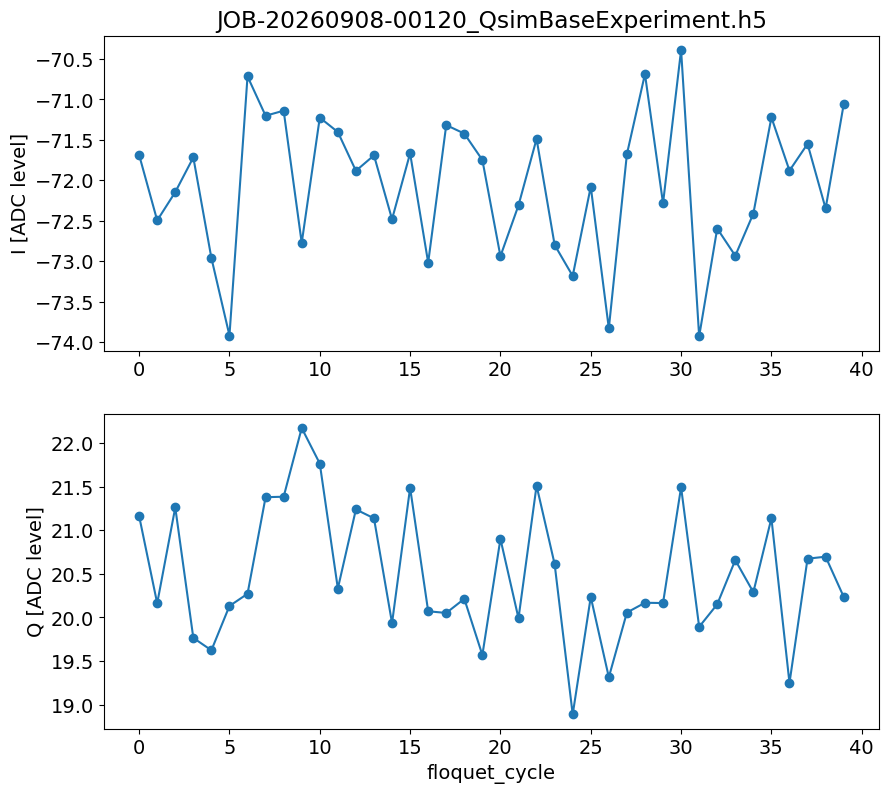

In [105]:
from tqdm.notebook import tqdm
import copy

dmscramble_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.QsimBaseExperiment,
    ExptProgram=meas.SidebandScrambleDarkProgramNewNew,
    default_expt_cfg=dm_sideband_scramble_defaults,
    preprocessor=sideband_scramble_preproc,
    postprocessor=None,
    job_client=client,
)


do_active_reset = True
relax_delay = 200
if not do_active_reset:
    relax_delay = 8000



floquet_cycles_list = floquet_cycle_list_gen(0, 40, 40, 1)

swap_stors = [3, 6]
# meas_stors = [0, 2, 6]
# meas_stors = [0]
# meas_stors = [0] + swap_stors
# meas_stors = [0] + [3]
meas_stors = [0, 1, 2, 3, 4, 5, 6, 7]
reset_stors = list(set(swap_stors + meas_stors))
reset_stors.pop(0)
# detunings = [0, 6] # None/False/unspecified all default to all zeros
detunings = [0] * len(swap_stors) # None/False/unspecified all default to all zeros
dark_swaps = [4, 5]
scramble_expts = []

rel_phase_list = [0]
# for phase in rel_phase_list:

for meas_stor in tqdm(meas_stors):
    scramble_sub_expts = []
    for floquet_cycles in floquet_cycles_list:
        scramble = dmscramble_runner.execute(
            reps=300,
            init_fock=True,
            init_stor= 3, #REVERT TO 0
            # init_stor= swap_stors[0],
            ro_stor = meas_stor,
            relax_delay=relax_delay,
            active_reset=do_active_reset,
            pre_relax_delay = 100,
            man_reset=True, 
            storage_reset = reset_stors, 
            reset_dump_mode = active_reset_default_dict["reset_dump_mode"],
            dump_reset_iter_num = active_reset_default_dict["dump_reset_iter_num"],
            swap_stors=swap_stors,
            update_phases=True,
            detunings=detunings,
            floquet_cycles=floquet_cycles,
            swept_params=['floquet_cycle'], 
            custom_prepulse = False,
            custom_postpulse = False,
            debug = False,
            swap_man_dark = False,
            dark_swap_order = dark_swaps,
            second_rel_phase = 180,
            map_to_qubit_ge = True, 
            prepulse = True, #for debugging. Should always be true
            postpulse = True, #for debugging. Should always be true
            
            palindrome_scramble = floquet_default_dict["palindrome_scramble"], #palindrome sequence
            # floquet_hardware_loop = True,
            scramble_sync_cycles = floquet_default_dict["scramble_sync_cycles"]
            )
        scramble_sub_expts.append(scramble)
    scramble_expts.append(scramble_sub_expts)
    # scramble.display()

In [108]:
           
fname_list = []
for exp in flatten_exp_lists(scramble_expts):
    
    fname_list.append(exp.fname)

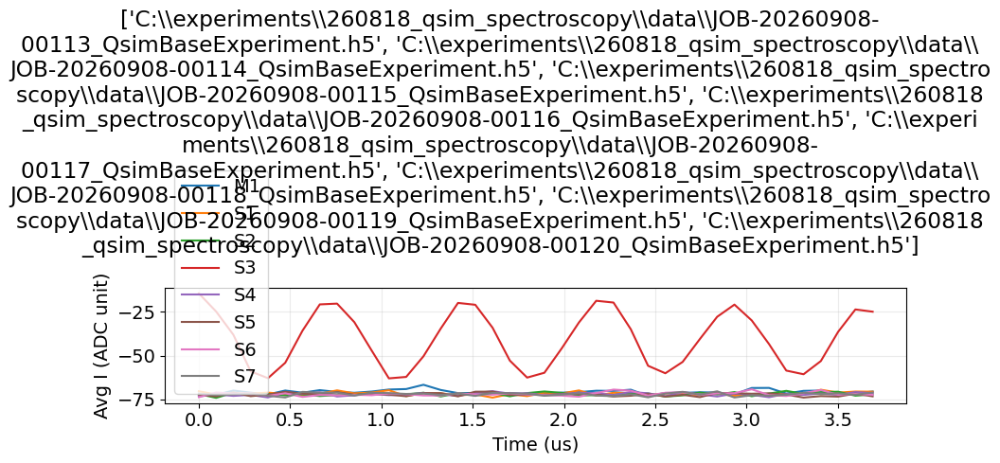

In [109]:
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
import textwrap

PLOT_TIME = True
PLOT_Q = False
SCATTER = False

def _flat_unique_expts(expts_nested):
    out = []
    for item in expts_nested:
        if isinstance(item, (list, tuple)):
            for expt in item:
                if expt not in out:
                    out.append(expt)
        else:
            if item not in out:
                out.append(item)
    return out

def stor_label_for_expt(ro_stor, expt):
    ro_stor = int(ro_stor)
    ecfg = expt.cfg.expt

    if not ecfg.get("swap_man_dark", False):
        return "M1" if ro_stor == 0 else f"S{ro_stor}"

    dark_order = list(ecfg.get("dark_swap_order", []))

    if ro_stor == 0:
        return "Dark Mode"
    if len(dark_order) > 1 and ro_stor == int(dark_order[1]):
        return "Bright Mode"
    if len(dark_order) > 0 and ro_stor == int(dark_order[0]):
        return "Central Mode"

    return f"S{ro_stor}"

def floquet_cycle_to_us(expt):
    total = 0.0
    sync_cycles = int(expt.cfg.expt.get("scramble_sync_cycles", 10))

    for stor in expt.cfg.expt.swap_stors:
        name = f"M1-S{stor}"
        if station.ds_floquet.get_waveform(name) == "gauss":
            total += float(
                station.ds_floquet.get_gauss_sigma(name)
                * station.ds_floquet.get_gauss_n_sigma(name)
            )
        else:
            total += float(station.ds_floquet.get_len(name))
            total += float(station.ds_floquet.get_ramp_sigma(name)) * 4

        total += station.soccfg.cycles2us(sync_cycles)

    return total

expts_flat = _flat_unique_expts(scramble_expts)
ref_expt = expts_flat[0]
cycle_us = floquet_cycle_to_us(ref_expt)

combined_data = defaultdict(lambda: {"xpts": [], "avgi": [], "avgq": []})

for expt in expts_flat:
    ro_stor = int(expt.cfg.expt.ro_stor)
    combined_data[ro_stor]["xpts"].extend(np.asarray(expt.data["xpts"]).reshape(-1))
    combined_data[ro_stor]["avgi"].extend(np.asarray(expt.data["avgi"]).reshape(-1))
    combined_data[ro_stor]["avgq"].extend(np.asarray(expt.data["avgq"]).reshape(-1))

if PLOT_Q:
    fig, ax = plt.subplots(2, 1, figsize=(9, 10), sharex=True)
else:
    fig, ax0 = plt.subplots(1, 1, figsize=(9, 5))
    ax = [ax0]

for ro_stor, data in combined_data.items():
    order = np.argsort(data["xpts"])

    x = np.asarray(data["xpts"])[order]
    if PLOT_TIME:
        x = x * cycle_us

    avgi = np.asarray(data["avgi"])[order]
    avgq = np.asarray(data["avgq"])[order]
    label = stor_label_for_expt(ro_stor, ref_expt)

    if SCATTER:
        ax[0].scatter(x, avgi, alpha=0.6, label=label)
        if PLOT_Q:
            ax[1].scatter(x, avgq, alpha=0.6, label=label)
    else:
        ax[0].plot(x, avgi, label=label)
        if PLOT_Q:
            ax[1].plot(x, avgq, label=label)

xlabel = "Time (us)" if PLOT_TIME else "Floquet Cycles"

ax[0].set_ylabel("Avg I (ADC unit)")
ax[0].set_xlabel(xlabel)
ax[0].legend()
ax[0].grid(alpha=0.25)

if PLOT_Q:
    ax[1].set_ylabel("Avg Q (ADC unit)")
    ax[1].set_xlabel(xlabel)
    ax[1].legend()
    ax[1].grid(alpha=0.25)

if "fname_list" in globals():
    fig.suptitle(textwrap.fill(str(fname_list), width=80))

fig.tight_layout()
plt.show()

In [177]:
station.ds_storage.df

,stor_name,freq (MHz),precision (MHz),pi (mus),h_pi (mus),gain (DAC units),last_update,bs_rate_coeffs_g,bs_rate_coeffs_e,freq_coeffs_g,freq_coeffs_e,gain_range_g,gain_range_e,joint_parity,dr_ac_stark_rate,dr_jp_phase
0,M1-S1,342.105410,NaN,0.557694,0.278847,5000,2026-09-06 21:21:22.369784,"[2.71800440497595e-10, 3.5345716702085755e-05,...","[2.617101263255993e-10, 3.5294007231684914e-05...","[-5.581106410081517e-38, 3.497594370968036e-33...","[-5.787229142339564e-38, 3.802111265047564e-33...","[2823.494166114352, 10936.689003179721]","[2834.8504180018463, 11002.012121829115]","[352.95224967922866, 3259, 3.513105914802541, ...",NaN,NaN
1,M1-S2,512.695252,NaN,0.615557,0.307779,7008,2026-09-06 21:23:35.491765,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,M1-S3,689.103320,NaN,0.883949,0.441975,4960,2026-09-06 21:25:46.028223,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,M1-S4,868.676827,NaN,1.053991,0.526996,9851,2026-09-06 21:27:35.190119,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,M1-S5,1044.993117,NaN,1.173960,0.586980,9990,2026-09-06 21:29:36.115753,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,M1-S6,1236.785773,NaN,1.167909,0.583954,10050,2026-09-06 21:31:25.228604,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,M1-S7,1414.679004,NaN,1.151378,0.575689,10320,2026-09-06 21:33:03.188702,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,M1-S8,-1.000000,-1.00,-1.000000,-1.000000,-1,51:31.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,M1-S9,-1.000000,-1.00,-1.000000,-1.000000,-1,51:31.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,M1-S10,-1.000000,-1.00,-1.000000,-1.000000,-1,51:31.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [199]:
station.update_all_station_snapshots()


[CONFIG] Reusing existing hardware_config version CFG-HW-20260906-00001
[CONFIG] Reusing existing multiphoton_config version CFG-MP-20260121-00001
[CONFIG] Reusing existing man1_storage_swap version CFG-M1-20260906-00019
[CONFIG] Reusing existing floquet_storage_swap version CFG-FL-20260906-00041
Config snapshots for current station:
  hardware_config: CFG-HW-20260906-00001
  multiphoton_config: CFG-MP-20260121-00001
  man1_storage_swap: CFG-M1-20260906-00019
  floquet_storage_swap: CFG-FL-20260906-00041


{'hardware_config': 'CFG-HW-20260906-00001',
 'multiphoton_config': 'CFG-MP-20260121-00001',
 'man1_storage_swap': 'CFG-M1-20260906-00019',
 'floquet_storage_swap': 'CFG-FL-20260906-00041'}

## Displace & Multiparity

### Under various displacement, & single shot comparison

In [ ]:
from tqdm.notebook import tqdm

dmscramble_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.qsim.floquet_dark_mode_readout.DarkBaseExperiment,
    ExptProgram=meas.SidebandScrambleDarkProgramNew,
    default_expt_cfg=dm_sideband_scramble_defaults,
    preprocessor=sideband_scramble_preproc,
    postprocessor=None,
    job_client=client,
)


meas_stors = [0]
# meas_stors = [0]
swap_stors = [2, 3]
detunings = [0, 0] # None/False/unspecified all default to all zeros
dark_swaps = [2, 3]
scramble_expts = []

rel_phase_list = [0]
# for phase in rel_phase_list:
displacement_list = np.linspace(0.1, np.sqrt(20), 101)

for meas_stor in tqdm(meas_stors):
    scramble_sub_expts = []
    for displacement in tqdm(displacement_list):
        scramble = dmscramble_runner.execute(
            reps=1000,
            init_fock=False,
            init_alpha = displacement,
            # init_man_fock_state = '0',
            init_stor=0,
            ro_stor = meas_stor,
            relax_delay=8000,
            active_reset=False,
            pre_relax_delay = 2500, 
            man_reset=True, 
            storage_reset = swap_stors, 
            reset_dump_mode = active_reset_default_dict["reset_dump_mode"],
            dump_reset_iter_num = active_reset_default_dict["dump_reset_iter_num"],
            swap_stors=swap_stors,
            update_phases=True,
            detunings=detunings,
            floquet_cycles=[0],
            swept_params=['floquet_cycle'],
            custom_prepulse = False,
            custom_postpulse = False,
            debug = False,
            swap_man_dark = False,
            dark_swap_order = dark_swaps,
            second_rel_phase = 180,
            map_to_qubit_ge = True, 
            
            multiparity_readout = True,
            cond_sec_phase= -90,
            
            prepulse = True, #for debugging. Should always be true
            postpulse = True, #for debugging. Should always be true
            )
        scramble_sub_expts.append(scramble)
    scramble_expts.append(scramble_sub_expts)
    # scramble.display()

In [ ]:
for i, disp in enumerate(displacement_list):
    expt_to_ana = scramble_expts[0][i]

    i_first, q_first    = expt_to_ana.data['idata'][0][0::2], expt_to_ana.data['qdata'][0][0::2]
    i_second, q_second  = expt_to_ana.data['idata'][0][1::2], expt_to_ana.data['qdata'][0][1::2]
    plt.scatter(i_first, q_first, label = f"First blob of $\\alpha$ = {disp}")
    plt.scatter(i_second, q_second, label = f"Second blob of $\\alpha$ = {disp}")
    
plt.xlabel("I (adc unit)")
plt.ylabel("Q (adc unit)")
# plt.legend()

In [ ]:
avg_i_first_list = []
avg_i_second_list = []

for i, disp in enumerate(displacement_list):
    expt_to_ana = scramble_expts[0][i]

    i_first, q_first    = expt_to_ana.data['idata'][0][0::2], expt_to_ana.data['qdata'][0][0::2]
    i_second, q_second  = expt_to_ana.data['idata'][0][1::2], expt_to_ana.data['qdata'][0][1::2]
    avg_i_first_list.append(np.average(i_first))
    avg_i_second_list.append(np.average(i_second))
    
    
    
plt.scatter(displacement_list**2, avg_i_first_list, label = f"First average I")
plt.scatter(displacement_list**2, avg_i_second_list, label = f"Second average I")
    
plt.xlabel("average_photon_number")
plt.ylabel("average I")
# plt.legend()

## Multi photon fock

In [ ]:
# ---- Confusion-matrix correction for multiparity (shared by this section) ----
# Applies a readout confusion-matrix inverse to the modulo-4 distributions from
# collect_multiparity()/analyze_multiparity() (which already return p_mod0..p_mod3
# per point). Same machinery as data_postprocess.ipynb, but operating on the
# already-computed `multiparity` dict instead of re-reading single shots.
#
# The active matrix is set by the calibration cell below (set_confusion_matrix(counts));
# `confusion_matrix_manual` is only a fallback used until that cell has been run.
import numpy as np

# Fallback confusion matrix (used only if the calibration cell has not been run).
# C[i, j] = P(measured n = j | prepared Fock |i>); rows = prepared, cols = measured.
confusion_matrix_manual = np.array([
    [0.8065,  0.07175, 0.06725, 0.0545 ],
    [0.07225, 0.7735,  0.04925, 0.105  ],
    [0.10225, 0.07575, 0.74325, 0.07875],
    [0.05075, 0.13825, 0.07075, 0.74025],
])

_mod_vals = np.array([0, 1, 2, 3])
_parity_first_signs  = 1 - 2 * (_mod_vals % 2)    # [+1, -1, +1, -1]
_parity_second_signs = 1 - 2 * (_mod_vals // 2)   # [+1, +1, -1, -1]


def set_confusion_matrix(C):
    """Store row-normalized confusion matrix and its inverse-transpose globally.
    p_meas = C.T @ p_true  ->  p_true = inv(C.T) @ p_meas."""
    global confusion_matrix, confusion_inv
    C = np.asarray(C, dtype=float)
    confusion_matrix = C / C.sum(axis=1, keepdims=True)
    confusion_inv = np.linalg.inv(confusion_matrix.T)
    return confusion_matrix


def build_confusion_matrix_from_calibration(cal_expts, e_is_high_I=True, point_idx=0):
    """counts[i, j] = # single shots measured at n=j when Fock |i> was prepared.

    `cal_expts` is the Fock |0>..|3> calibration set (single floquet point). Accepts
    either a nested [[e], [e], ...] list (as produced by the runner) or a flat list.
    The prepared state is read from each experiment's cfg.expt.init_man_fock_state,
    so the result does not depend on calibration ordering. Returns (counts, fnames).
    """
    counts = np.zeros((4, 4), dtype=float)
    fnames = []
    for item in cal_expts:
        expts = item if isinstance(item, (list, tuple, set)) else [item]
        for expt in expts:
            true_n = int(expt.cfg.expt.init_man_fock_state)
            if true_n not in (0, 1, 2, 3):
                continue
            fnames.append(expt.fname)
            rn = expt.cfg.read_num
            qTest = expt.cfg.expt.qubits[0]
            threshold = expt.cfg.device.readout.threshold[qTest]
            idata = np.asarray(expt.data["idata"][point_idx])
            i_first  = idata[rn-2::rn]
            i_second = idata[rn-1::rn]
            if e_is_high_I:
                b0 = (i_first  > threshold).astype(int)
                b1 = (i_second > threshold).astype(int)
            else:
                b0 = (i_first  < threshold).astype(int)
                b1 = (i_second < threshold).astype(int)
            n_mod4 = b0 + 2 * b1          # cond_sec_phase=-90: (g,g)->0,(e,g)->1,(g,e)->2,(e,e)->3
            for pred_n in range(4):
                counts[true_n, pred_n] += np.sum(n_mod4 == pred_n)
    return counts, fnames


def correct_distribution(p_meas, clip_renormalize=True):
    """Apply the confusion-matrix inverse to each row (a mod-4 distribution)."""
    p_corr = np.asarray(p_meas) @ confusion_inv.T
    if clip_renormalize:
        p_corr = np.clip(p_corr, 0.0, None)
        p_corr = p_corr / p_corr.sum(axis=1, keepdims=True)
    return p_corr


def correct_multiparity(multiparity, clip_renormalize=True):
    """Confusion-correct a collect_multiparity() dict.

    Rebuilds nmod4_mean / mean_parity_first / mean_parity_second from the
    corrected per-point p_mod0..3 distribution. Returns a dict with the SAME
    schema as `multiparity`, so it drops straight into the existing plot cells.
    """
    corrected = {}
    for ro_stor, data in multiparity.items():
        p_meas = np.stack([data['p_mod0'], data['p_mod1'],
                           data['p_mod2'], data['p_mod3']], axis=1)
        p_corr = correct_distribution(p_meas, clip_renormalize=clip_renormalize)
        corrected[ro_stor] = {
            'xpts': data['xpts'],
            'p_mod0': p_corr[:, 0], 'p_mod1': p_corr[:, 1],
            'p_mod2': p_corr[:, 2], 'p_mod3': p_corr[:, 3],
            'nmod4_mean':         p_corr @ _mod_vals,
            'mean_parity_first':  p_corr @ _parity_first_signs,
            'mean_parity_second': p_corr @ _parity_second_signs,
        }
    return corrected


def _corr_stor_label(ro_stor):
    return "M1" if ro_stor == 0 else f"S{ro_stor}"


def plot_parity_raw_vs_corrected(multiparity, corrected,
                                 floquet_cycle2us=1.0, title=""):
    """2-panel first/second parity expectation; dashed=raw, solid=corrected."""
    import matplotlib.pyplot as plt
    import textwrap
    fig, ax = plt.subplots(1, 2, figsize=(15, 5), sharex=True)
    for ro_stor in corrected:
        c = corrected[ro_stor]
        r = multiparity[ro_stor]
        si = np.argsort(c['xpts'])
        x = c['xpts'][si] * floquet_cycle2us
        lbl = _corr_stor_label(ro_stor)
        line, = ax[0].plot(x, c['mean_parity_first'][si], "-", label=lbl)
        col = line.get_color()
        ax[0].plot(x, r['mean_parity_first'][si], "--", alpha=0.4, color=col)
        ax[1].plot(x, c['mean_parity_second'][si], "-", color=col, label=lbl)
        ax[1].plot(x, r['mean_parity_second'][si], "--", alpha=0.4, color=col)
    ax[0].set_title("First parity expectation (dashed=raw, solid=corrected)")
    ax[1].set_title("Second parity-bit expectation (dashed=raw, solid=corrected)")
    for a in ax:
        a.axhline(0, color='k', linewidth=0.8, alpha=0.4)
        a.set_xlabel("time (us)")
        a.set_ylabel("parity value")
        a.set_ylim(-1.05, 1.05)
        a.legend()
    if title:
        fig.suptitle(textwrap.fill(str(title), 80), fontsize=8)
    plt.tight_layout()
    plt.show()


def plot_nmod4_raw_vs_corrected(multiparity, corrected,
                                floquet_cycle2us=1.0, title=""):
    """Single-panel <n mod 4>; dashed=raw, solid=corrected."""
    import matplotlib.pyplot as plt
    import textwrap
    fig, ax = plt.subplots(1, 1, figsize=(9, 9))
    for ro_stor in corrected:
        c = corrected[ro_stor]
        r = multiparity[ro_stor]
        si = np.argsort(c['xpts'])
        x = c['xpts'][si] * floquet_cycle2us
        line, = ax.plot(x, c['nmod4_mean'][si], "-", label=_corr_stor_label(ro_stor))
        ax.plot(x, r['nmod4_mean'][si], "--", alpha=0.4, color=line.get_color())
    ax.set_xlabel("time (us)")
    ax.set_ylabel(r"$\langle n\ mod\ 4\rangle$")
    ax.legend()
    if title:
        ax.set_title(textwrap.fill(str(title), 60), fontsize=8)
    plt.tight_layout()
    plt.show()


# Default to the fallback matrix so the helpers are usable before calibration;
# the calibration cell below overrides it via set_confusion_matrix(counts).
set_confusion_matrix(confusion_matrix_manual)


In [ ]:
from tqdm.notebook import tqdm

dmscramble_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.qsim.floquet_dark_mode_readout.DarkBaseExperiment,
    ExptProgram=meas.SidebandScrambleDarkProgramNew,
    default_expt_cfg=dm_sideband_scramble_defaults,
    preprocessor=sideband_scramble_preproc,
    postprocessor=None,
    job_client=client,
)


meas_stors = [0]
# meas_stors = [0]
swap_stors = [6, 7]
detunings = [0, 0] # None/False/unspecified all default to all zeros
dark_swaps = [6, 7]
scramble_expts = []
init_states = ['0', '1', '2', '3']

rel_phase_list = [0]
# for phase in rel_phase_list:

for init_state in tqdm(init_states):
    scramble_sub_expts = []
    for _ in [0]:
        scramble = dmscramble_runner.execute(
            reps=6000,
            init_fock=False,
            # init_alpha = displacement,
            init_man_fock_state = init_state,
            init_stor=0,
            ro_stor = 0,
            relax_delay=8000,
            active_reset=True,
            pre_relax_delay = 2500, 
            man_reset=False, 
            storage_reset = False, 
            reset_dump_mode = active_reset_default_dict["reset_dump_mode"],
            dump_reset_iter_num = active_reset_default_dict["dump_reset_iter_num"],
            swap_stors=swap_stors,
            update_phases=True,
            detunings=detunings,
            floquet_cycles=[0],
            swept_params=['floquet_cycle'],
            custom_prepulse = False,
            custom_postpulse = False,
            debug = True,
            swap_man_dark = False,
            dark_swap_order = dark_swaps,
            second_rel_phase = 180,
            map_to_qubit_ge = True, 
            
            multiparity_readout = True,
            cond_sec_phase= -90,

            fg_area_comp = "length",
            
            prepulse = True, #for debugging. Should always be true
            postpulse = True, #for debugging. Should always be true
            )
        scramble_sub_expts.append(scramble)
    scramble_expts.append(scramble_sub_expts)
    # scramble.display()


# Keep a dedicated handle to the Fock |0>..|3> calibration so the confusion-
# matrix estimate below survives even after `scramble_expts` is overwritten by
# the later measurement subsections.
fock_cal_expts = scramble_expts


In [ ]:

expt_to_ana = scramble_expts[0][0]
rn = expt_to_ana.cfg.read_num
fig, ax = plt.subplots(1, 2, figsize = (12, 5))
i_first, q_first    = expt_to_ana.data['idata'][0][rn-2::rn], expt_to_ana.data['qdata'][0][rn-2::rn]
i_second, q_second  = expt_to_ana.data['idata'][0][rn-1::rn], expt_to_ana.data['qdata'][0][rn-1::rn]
ax[0].scatter(i_first, q_first, label = f"First blob", alpha = 0.1)
ax[1].scatter(i_second, q_second, label = f"Second blob", alpha = 0.1)
ax[0].legend()
ax[1].legend()
ax[0].set_xlabel("I (adc unit)")
ax[0].set_ylabel("Q (adc unit)")
ax[1].set_xlabel("I (adc unit)")
ax[1].set_ylabel("Q (adc unit)")
fig.tight_layout()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Estimate the modulo-4 readout confusion matrix from the Fock |0>..|3>
# calibration (`fock_cal_expts`, captured by the calibration runner above) and
# make it the matrix used by every correction cell below.
counts, fname_list = build_confusion_matrix_from_calibration(fock_cal_expts)
probs = counts / counts.sum(axis=1, keepdims=True)

fig, ax = plt.subplots(figsize=(6, 5))
im = ax.imshow(probs, vmin=0, vmax=1)
ax.set_xticks(range(4)); ax.set_yticks(range(4))
ax.set_xticklabels(["0", "1", "2", "3"]); ax.set_yticklabels(["0", "1", "2", "3"])
ax.set_xlabel(r"Measured $n \;\mathrm{mod}\; 4$")
ax.set_ylabel("Prepared Fock state")
wrapped_title = textwrap.fill(str(fname_list), width=60)
ax.set_title(f"Modulo-4 readout confusion matrix {wrapped_title}")
for i in range(4):
    for j in range(4):
        ax.text(j, i, f"{probs[i, j]:.3f}\n({int(counts[i, j])})",
                ha="center", va="center")
cbar = fig.colorbar(im, ax=ax)
cbar.set_label(r"$P(\mathrm{measured}\mid\mathrm{prepared})$")
fig.tight_layout()
plt.show()

print("Counts")
print(counts.astype(int))
print("\nP(measured | prepared)")
print(np.round(probs, 5))
print("\nAssignment fidelities")
for n in range(4):
    print(f"|{n}>: {probs[n, n]:.4f}")
print(f"\nAverage assignment fidelity: {np.mean(np.diag(probs)):.4f}")

# Make this MEASURED matrix the source of truth for all correction cells below.
if np.all(counts.sum(axis=1) > 0):
    set_confusion_matrix(counts)
    print("\n-> Downstream cells now corrected with this measured confusion matrix.")
else:
    set_confusion_matrix(confusion_matrix_manual)
    print("\n-> Calibration incomplete; fell back to the manual confusion matrix.")


### Floquet with single parity readout (debugging)

In [ ]:
from tqdm.notebook import tqdm

dmscramble_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.qsim.floquet_dark_mode_readout.DarkBaseExperiment,
    ExptProgram=meas.SidebandScrambleDarkProgramNewNew,
    default_expt_cfg=dm_sideband_scramble_defaults,
    preprocessor=sideband_scramble_preproc,
    postprocessor=None,
    job_client=client,
)

floquet_cycles_list = floquet_cycle_list_gen(0, 200, 200, 2)

meas_stors = [0, 4, 5]
# meas_stors = [0]
swap_stors = [4, 5]
detunings = [0, 0] # None/False/unspecified all default to all zeros
dark_swaps = [4, 5]
scramble_expts = []

rel_phase_list = [0]
# for phase in rel_phase_list:

for meas_stor in tqdm(meas_stors):
    scramble_sub_expts = []
    for floquet_cycles in tqdm(floquet_cycles_list):
        scramble = dmscramble_runner.execute(
            reps=500,
            init_fock=False,
            # init_alpha = np.sqrt(3),
            init_man_fock_state = '1',
            init_stor= swap_stors[0],
            ro_stor = meas_stor,
            relax_delay=200,
            active_reset=True,
            pre_relax_delay = 100, 
            man_reset=True, 
            storage_reset = swap_stors, 
            reset_dump_mode = active_reset_default_dict["reset_dump_mode"],
            dump_reset_iter_num = active_reset_default_dict["dump_reset_iter_num"],
            swap_stors=swap_stors,
            update_phases=True,
            detunings=detunings,
            floquet_cycles=floquet_cycles,
            swept_params=['floquet_cycle'],
            custom_prepulse = False,
            custom_postpulse = False,
            debug = False,
            swap_man_dark = True,
            dark_swap_order = dark_swaps,
            second_rel_phase = 180,
            map_to_qubit_ge = True, 
            
            multiparity_readout = False,
            cond_sec_phase= -90,

            prepulse = True, #for debugging. Should always be true
            postpulse = True, #for debugging. Should always be true
            
            palindrome_scramble = floquet_default_dict["palindrome_scramble"]
            )
        scramble_sub_expts.append(scramble)
    scramble_expts.append(scramble_sub_expts)
    # scramble.display()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict

import os
import textwrap

fname_list = [
    os.path.basename(str(expt.fname))
    for expt in _flat_unique_expts(scramble_expts)
    if getattr(expt, "fname", None) is not None
]

def _flat_unique_expts(items):
    out, seen = [], set()
    def rec(x):
        if isinstance(x, (list, tuple, set)):
            for y in x:
                rec(y)
        else:
            if id(x) not in seen:
                seen.add(id(x))
                out.append(x)
    rec(items)
    return out

def stor_label(ro_stor, params=None):
    """Human-readable label for a readout storage index. `params` is a DarkParams;
    if omitted, falls back to the module-level DARK_PARAMS set by the most recent
    get_dark_params() call."""
    if params is None or not params.swap_man_dark:
        return "M1" if int(ro_stor) == 0 else f"S{int(ro_stor)}"
    if int(ro_stor) == 0:
        return "Dark Mode"
    elif int(ro_stor) == params.dark_swap_order[1]:
        return "Bright Mode"
    else:
        return "Central Mode"

def _get_readout_confusion_2x2(expt):
    rd = expt.cfg.device.readout
    key = (
        "confusion_matrix_with_active_reset"
        if expt.cfg.expt.get("active_reset", False)
        else "confusion_matrix_without_reset"
    )
    C = rd.get(key, None)

    if C is None:
        print(f"WARNING: {key} not found. Using identity correction.")
        return np.eye(2)

    C = np.asarray(C, dtype=float)

    # Lab native format: [Pgg, Pge, Peg, Pee]
    # rows = prepared g/e, cols = measured g/e
    if C.shape == (4,):
        Pgg, Pge, Peg, Pee = C
        C = np.array([[Pgg, Pge],
                      [Peg, Pee]], dtype=float)

    elif C.shape != (2, 2):
        raise ValueError(f"{key} must be flat [Pgg, Pge, Peg, Pee] or 2x2, got {C.shape}")

    return C / C.sum(axis=1, keepdims=True)

def _single_parity_point(expt, point_idx=0, e_is_high_I=None):
    rn = expt.cfg.read_num
    q = expt.cfg.expt.qubits[0]
    threshold = expt.cfg.device.readout.threshold[q]

    if e_is_high_I is None:
        e_is_high_I = expt.cfg.device.readout.Ie[q] > expt.cfg.device.readout.Ig[q]

    idata = np.asarray(expt.data["idata"][point_idx])
    i_final = idata[rn - 1::rn]

    bit1 = i_final > threshold if e_is_high_I else i_final < threshold
    p1 = np.mean(bit1)
    p0 = 1.0 - p1

    return {
        "p_mod0": p0,
        "p_mod1": p1,
        "nmod2_mean": p1,
        "mean_parity": 1.0 - 2.0 * p1,
    }

def _floquet_cycle_us_for_expt(expt):
    ecfg = expt.cfg.expt
    sync_us = float(expt.prog.cycles2us(int(ecfg.get("scramble_sync_cycles", 10)))) if hasattr(expt, "prog") else station.soccfg.cycles2us(10)

    total = 0.0
    for s in ecfg.swap_stors:
        name = f"M1-S{s}"
        if station.ds_floquet.get_waveform(name) in ("gauss", "gaussian", "arb"):
            total += float(station.ds_floquet.get_gauss_sigma(name)) * float(station.ds_floquet.get_gauss_n_sigma(name))
        else:
            total += float(station.ds_floquet.get_len(name))
            total += 4.0 * float(station.ds_floquet.get_ramp_sigma(name))
        total += sync_us
    return total

single_parity_raw = defaultdict(lambda: {
    "xpts": [], "p_mod0": [], "p_mod1": [], "nmod2_mean": [], "mean_parity": []
})

for expt in _flat_unique_expts(scramble_expts):
    ro_stor = expt.cfg.expt.ro_stor
    xpts = np.asarray(expt.data["xpts"]).reshape(-1)

    for j, x in enumerate(xpts):
        r = _single_parity_point(expt, point_idx=j)
        single_parity_raw[ro_stor]["xpts"].append(x)
        for k in ("p_mod0", "p_mod1", "nmod2_mean", "mean_parity"):
            single_parity_raw[ro_stor][k].append(r[k])

for ro_stor in single_parity_raw:
    for k in single_parity_raw[ro_stor]:
        single_parity_raw[ro_stor][k] = np.asarray(single_parity_raw[ro_stor][k])

C2 = _get_readout_confusion_2x2(_flat_unique_expts(scramble_expts)[0])
C2_inv = np.linalg.inv(C2.T)

single_parity_corr = {}
for ro_stor, d in single_parity_raw.items():
    p_meas = np.stack([d["p_mod0"], d["p_mod1"]], axis=1)
    p_corr = p_meas @ C2_inv.T
    p_corr = np.clip(p_corr, 0.0, None)
    p_corr = p_corr / p_corr.sum(axis=1, keepdims=True)

    single_parity_corr[ro_stor] = {
        "xpts": d["xpts"],
        "p_mod0": p_corr[:, 0],
        "p_mod1": p_corr[:, 1],
        "nmod2_mean": p_corr[:, 1],
        "mean_parity": p_corr @ np.array([1.0, -1.0]),
    }

floquet_cycle2us = _floquet_cycle_us_for_expt(_flat_unique_expts(scramble_expts)[0])

fig, ax = plt.subplots(1, 1, figsize=(9, 5))
for ro_stor in single_parity_corr:
    raw = single_parity_raw[ro_stor]
    cor = single_parity_corr[ro_stor]
    si = np.argsort(raw["xpts"])
    x = raw["xpts"][si] * floquet_cycle2us

    line, = ax.plot(x, cor["nmod2_mean"][si], "-", label=stor_label(ro_stor))
    ax.plot(x, raw["nmod2_mean"][si], "--", alpha=0.45, color=line.get_color())

ax.set_xlabel("time (us)")
ax.set_ylabel(r"$\langle n\ {\rm mod}\ 2\rangle = P({\rm odd})$")
ax.set_title("Single parity readout: raw (dashed) vs confusion-corrected (solid)")
# ax.set_ylim(-0.05, 1.05)
ax.legend()

wrapped_title = textwrap.fill(str(fname_list), width=60)
plt.suptitle(f"{wrapped_title}")
plt.tight_layout()
plt.show()

In [ ]:
SHOW_RAW = True
SHOW_CORRECTED = False
PLOT_TIME = False

def stor_label_for_expt(ro_stor, expt):
    ro_stor = int(ro_stor)
    ecfg = expt.cfg.expt

    if not ecfg.get("swap_man_dark", False):
        return "M1" if ro_stor == 0 else f"S{ro_stor}"

    dark_order = list(ecfg.get("dark_swap_order", []))

    if ro_stor == 0:
        return "Dark Mode"
    if len(dark_order) > 1 and ro_stor == int(dark_order[1]):
        return "Bright Mode"
    if len(dark_order) > 0 and ro_stor == int(dark_order[0]):
        return "Central Mode"
    return f"S{ro_stor}"

ref_expt = _flat_unique_expts(scramble_expts)[0]

fig, ax = plt.subplots(1, 1, figsize=(9, 5))

for ro_stor in single_parity_raw:
    raw = single_parity_raw[ro_stor]
    cor = single_parity_corr[ro_stor]
    si = np.argsort(raw["xpts"])
    x = raw["xpts"][si] 
    if PLOT_TIME:
        x *= floquet_cycle2us
    label = stor_label_for_expt(ro_stor, ref_expt)

    if SHOW_CORRECTED:
        suffix = " corrected" if SHOW_RAW else ""
        line, = ax.plot(x, cor["nmod2_mean"][si], "-", label=label + suffix)
        color = line.get_color()
    else:
        color = None

    if SHOW_RAW:
        suffix = " raw" if SHOW_CORRECTED else ""
        ls = "--" if SHOW_CORRECTED else "-"
        alpha = 0.45 if SHOW_CORRECTED else 1
        kwargs = dict(linestyle=ls, alpha=alpha, label=label + suffix)
        if color is not None:
            kwargs["color"] = color
        ax.plot(x, raw["nmod2_mean"][si], **kwargs)
if PLOT_TIME:
    ax.set_xlabel("time (us)")
else:
    ax.set_xlabel("Floquet cycles")
    
ax.set_ylabel(r"$\langle n\ {\rm mod}\ 2\rangle = P({\rm odd})$")
ax.set_title("Single parity readout")

# ax.set_ylim(-0.05, 1.05)
ax.legend(loc = "right")

wrapped_title = textwrap.fill(str(fname_list), width=60)
plt.suptitle(f"{wrapped_title}")
plt.tight_layout()
plt.show()

### Floquet with Initial Costate and Multiparity Readout

In [ ]:
from tqdm.notebook import tqdm

dmscramble_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.qsim.floquet_dark_mode_readout.DarkBaseExperiment,
    ExptProgram=meas.SidebandScrambleDarkProgramNewNew,
    default_expt_cfg=dm_sideband_scramble_defaults,
    preprocessor=sideband_scramble_preproc,
    postprocessor=None,
    job_client=client,
)

floquet_cycles_list = floquet_cycle_list_gen(0, 400, 400, 4)

meas_stors = [0, 4, 5]
# meas_stors = [0]
swap_stors = [4, 5]
detunings = [0, 0] # None/False/unspecified all default to all zeros
dark_swaps = [4, 5]
scramble_expts = []

rel_phase_list = [0]
# for phase in rel_phase_list:

for meas_stor in tqdm(meas_stors):
    scramble_sub_expts = []
    for floquet_cycles in tqdm(floquet_cycles_list):
        scramble = dmscramble_runner.execute(
            reps=500,
            init_fock=False,
            # init_alpha = np.sqrt(3),
            init_man_fock_state = '3',
            init_stor= swap_stors[0],
            ro_stor = meas_stor,
            relax_delay=200,
            active_reset=True,
            pre_relax_delay = 100, 
            man_reset=True, 
            storage_reset = swap_stors, 
            reset_dump_mode = active_reset_default_dict["reset_dump_mode"],
            dump_reset_iter_num = active_reset_default_dict["dump_reset_iter_num"],
            swap_stors=swap_stors,
            update_phases=True,
            detunings=detunings,
            floquet_cycles=floquet_cycles,
            swept_params=['floquet_cycle'],
            custom_prepulse = False,
            custom_postpulse = False,
            debug = False,
            swap_man_dark = True,
            dark_swap_order = dark_swaps,
            second_rel_phase = 180,
            map_to_qubit_ge = True, 
            
            multiparity_readout = True,
            cond_sec_phase= -90,

            prepulse = True, #for debugging. Should always be true
            postpulse = True, #for debugging. Should always be true
            
            palindrome_scramble = True
            )
        scramble_sub_expts.append(scramble)
    scramble_expts.append(scramble_sub_expts)
    # scramble.display()

In [ ]:
def unique_expts(nested_expts):
    return list(dict.fromkeys(expt for sub in nested_expts for expt in sub))

def collect_multiparity(expts):
    by_stor = {}

    for expt in expts:
        ro_stor = expt.cfg.expt.ro_stor
        mp = expt.analyze_multiparity()

        if ro_stor not in by_stor:
            by_stor[ro_stor] = []

        by_stor[ro_stor].append(mp)

    out = {}
    for ro_stor, mp_list in by_stor.items():
        keys = mp_list[0].keys()
        out[ro_stor] = {
            key: np.concatenate([mp[key] for mp in mp_list])
            for key in keys
        }

    return out

In [ ]:
floquet_cycle2us = 0
for i in swap_stors:
    if station.ds_floquet.get_waveform(f"M1-S{i}") == 'gauss':
        floquet_cycle2us += float(station.ds_floquet.get_gauss_sigma(f"M1-S{i}")
                                  * station.ds_floquet.get_gauss_n_sigma(f"M1-S{i}"))
        floquet_cycle2us += station.soccfg.cycles2us(10)
    else:
        floquet_cycle2us += float(station.ds_floquet.get_len(f"M1-S{i}"))
        floquet_cycle2us += float(station.ds_floquet.get_ramp_sigma(f"M1-S{i}")) * 4
        floquet_cycle2us += station.soccfg.cycles2us(10)

multiparity = collect_multiparity(unique_expts(scramble_expts))

In [ ]:
for ro_stor, data in multiparity.items():
    sort_idx = np.argsort(data['xpts'])
    x = data['xpts'][sort_idx] * floquet_cycle2us

    parity_first = data['mean_parity_first'][sort_idx]
    parity_second = data['mean_parity_second'][sort_idx]
    nmod4_mean = data['nmod4_mean'][sort_idx]

In [ ]:
import matplotlib.pyplot as plt

def stor_label(ro_stor):
    if ro_stor == 0:
        return "M1"
    return f"S{ro_stor}"


fig, ax = plt.subplots(1, 2, figsize=(15, 5), sharex=True)

only_line = True
plot_style = "-" if only_line else "o-"

for ro_stor, data in multiparity.items():
    sort_idx = np.argsort(data['xpts'])
    x = data['xpts'][sort_idx] * floquet_cycle2us

    p_first = data['mean_parity_first'][sort_idx]
    p_second = data['mean_parity_second'][sort_idx]

    label = stor_label(ro_stor)

    ax[0].plot(x, p_first, plot_style, label=label)
    ax[1].plot(x, p_second, plot_style, label=label)

ax[0].set_title("First parity expectation")
ax[1].set_title("Second parity-bit expectation")

for a in ax:
    a.axhline(0, color='k', linewidth=0.8, alpha=0.4)
    a.set_xlabel("time (us)")
    a.set_ylabel("parity value")
    a.set_ylim(-1.05, 1.05)
    a.legend()

plt.tight_layout()
plt.show()

In [ ]:
import textwrap

def flatten_exp_lists(items, container_types=(list, tuple, set)):
    for x in items:
        if isinstance(x, container_types):
            yield from flatten_exp_lists(x, container_types)
        else:
            yield x
            
            
fname_list = []
for exp in flatten_exp_lists(scramble_expts):
    fname_list.append(exp.fname)

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(9, 5))

only_line = True
plot_style = "-" if only_line else "o-"

for ro_stor, data in multiparity.items():
    sort_idx = np.argsort(data['xpts'])
    x = data['xpts'][sort_idx] * floquet_cycle2us

    nmod4_mean = data['nmod4_mean'][sort_idx]

    ax.plot(x, nmod4_mean, plot_style, label=stor_label(ro_stor))

ax.set_xlabel("time (us)")
ax.set_ylabel("$\\langle n\\ mod\\ 4\\rangle$")
ax.legend()
wrapped_title = textwrap.fill(str(fname_list), width=60)
plt.title(f"{wrapped_title}")s
plt.tight_layout()
plt.show()

In [ ]:
# --- Confusion-corrected multiparity (dashed = raw, solid = corrected) ---
multiparity_corr = correct_multiparity(multiparity)
plot_parity_raw_vs_corrected(
    multiparity, multiparity_corr,
    floquet_cycle2us=floquet_cycle2us, title=fname_list,
)
plot_nmod4_raw_vs_corrected(
    multiparity, multiparity_corr,
    floquet_cycle2us=floquet_cycle2us, title=fname_list,
)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict

def classify_two_parity_readouts(expt, point_idx=0, threshold=None, e_is_high_I=True):
    rn = expt.cfg.read_num
    qTest = expt.cfg.expt.qubits[0]

    if threshold is None:
        threshold = expt.cfg.device.readout.threshold[qTest]

    idata = np.asarray(expt.data['idata'][point_idx])
    qdata = np.asarray(expt.data['qdata'][point_idx])

    i_first  = idata[rn-2::rn]
    q_first  = qdata[rn-2::rn]
    i_second = idata[rn-1::rn]
    q_second = qdata[rn-1::rn]

    if e_is_high_I:
        first_e = i_first > threshold
        second_e = i_second > threshold
    else:
        first_e = i_first < threshold
        second_e = i_second < threshold

    b0 = first_e.astype(int)
    b1 = second_e.astype(int)

    # cond_sec_phase = -90 convention:
    # (g,g)->0, (e,g)->1, (g,e)->2, (e,e)->3
    n_mod4 = b0 + 2*b1

    out = {
        'i_first': i_first,
        'q_first': q_first,
        'i_second': i_second,
        'q_second': q_second,

        'first_e': first_e,
        'second_e': second_e,

        # parity expectation values:
        # +1 means bit=0, -1 means bit=1.
        # first parity = (-1)^n
        # second parity = +1 for n=0,1 mod 4 and -1 for n=2,3 mod 4.
        'parity_first': 1 - 2*b0,
        'parity_second': 1 - 2*b1,

        'n_mod4': n_mod4,

        'p_first_e': np.mean(first_e),
        'p_second_e': np.mean(second_e),

        'p_gg': np.mean((~first_e) & (~second_e)),
        'p_eg': np.mean(( first_e) & (~second_e)),
        'p_ge': np.mean((~first_e) & ( second_e)),
        'p_ee': np.mean(( first_e) & ( second_e)),
    }

    out['p_mod0'] = np.mean(n_mod4 == 0)
    out['p_mod1'] = np.mean(n_mod4 == 1)
    out['p_mod2'] = np.mean(n_mod4 == 2)
    out['p_mod3'] = np.mean(n_mod4 == 3)

    out['mean_parity_first'] = np.mean(out['parity_first'])
    out['mean_parity_second'] = np.mean(out['parity_second'])
    out['mean_n_mod4'] = np.mean(n_mod4)

    return out

In [ ]:
combined_bits = defaultdict(lambda: {
    'xpts': [],

    'mean_parity_first': [],
    'mean_parity_second': [],

    'p_first_e': [],
    'p_second_e': [],

    'p_mod0': [],
    'p_mod1': [],
    'p_mod2': [],
    'p_mod3': [],

    'p_gg': [],
    'p_eg': [],
    'p_ge': [],
    'p_ee': [],

    'mean_n_mod4': [],
})

floquet_cycle2us = 0
for i in swap_stors:
    if station.ds_floquet.get_waveform(f"M1-S{i}") == 'gauss':
        floquet_cycle2us += float(station.ds_floquet.get_gauss_sigma(f"M1-S{i}")
                                  * station.ds_floquet.get_gauss_n_sigma(f"M1-S{i}"))
        floquet_cycle2us += station.soccfg.cycles2us(10)
    else:
        floquet_cycle2us += float(station.ds_floquet.get_len(f"M1-S{i}"))
        floquet_cycle2us += float(station.ds_floquet.get_ramp_sigma(f"M1-S{i}")) * 4
        floquet_cycle2us += station.soccfg.cycles2us(10)

unique_expts = []
for sub_list in scramble_expts:
    for expt in sub_list:
        if expt not in unique_expts:
            unique_expts.append(expt)

for expt in unique_expts:
    state_idx = expt.cfg.expt.ro_stor
    xpts = np.asarray(expt.data['xpts']).reshape(-1)

    for j, x in enumerate(xpts):
        r = classify_two_parity_readouts(expt, point_idx=j)

        combined_bits[state_idx]['xpts'].append(x)
        combined_bits[state_idx]['mean_parity_first'].append(r['mean_parity_first'])
        combined_bits[state_idx]['mean_parity_second'].append(r['mean_parity_second'])

        combined_bits[state_idx]['p_first_e'].append(r['p_first_e'])
        combined_bits[state_idx]['p_second_e'].append(r['p_second_e'])

        combined_bits[state_idx]['p_mod0'].append(r['p_mod0'])
        combined_bits[state_idx]['p_mod1'].append(r['p_mod1'])
        combined_bits[state_idx]['p_mod2'].append(r['p_mod2'])
        combined_bits[state_idx]['p_mod3'].append(r['p_mod3'])

        combined_bits[state_idx]['p_gg'].append(r['p_gg'])
        combined_bits[state_idx]['p_eg'].append(r['p_eg'])
        combined_bits[state_idx]['p_ge'].append(r['p_ge'])
        combined_bits[state_idx]['p_ee'].append(r['p_ee'])

        combined_bits[state_idx]['mean_n_mod4'].append(r['mean_n_mod4'])

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5), sharex=True)
only_line = True
for state_idx, data in combined_bits.items():
    sort_indices = np.argsort(data['xpts'])
    x = np.array(data['xpts'])[sort_indices] * floquet_cycle2us

    p1 = np.array(data['mean_parity_first'])[sort_indices]
    p2 = np.array(data['mean_parity_second'])[sort_indices]

    display_idx = state_idx
    state_prefix = "S"
    if display_idx == 0:
        state_prefix = "M"
        display_idx = 1

    label = f"{state_prefix}{display_idx}"
    if not only_line:
        ax[0].plot(x, p1, "o-", label=label)
        ax[1].plot(x, p2, "o-", label=label)
    else:
        ax[0].plot(x, p1,  label=label)
        ax[1].plot(x, p2,  label=label)

ax[0].set_title("First parity expectation")
ax[1].set_title("Second parity-bit expectation")

for a in ax:
    a.axhline(0, color='k', linewidth=0.8, alpha=0.4)
    a.set_xlabel("time (us)")
    a.set_ylabel("parity value")
    a.set_ylim(-1.05, 1.05)
    a.legend()

plt.tight_layout()
plt.show()

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(9, 5))
max_list = []
only_line = True

for state_idx, data in combined_bits.items():
    sort_indices = np.argsort(data['xpts'])
    x = np.array(data['xpts'])[sort_indices] * floquet_cycle2us

    p0 = np.array(data['p_mod0'])[sort_indices]
    p1 = np.array(data['p_mod1'])[sort_indices]
    p2 = np.array(data['p_mod2'])[sort_indices]
    p3 = np.array(data['p_mod3'])[sort_indices]

    nmod4_mean = p1 + 2*p2 + 3*p3

    display_idx = state_idx
    state_prefix = "S"
    if display_idx == 0:
        state_prefix = "M"
        display_idx = 1

    label = f"{state_prefix}{display_idx}"
    if not only_line:
        ax.plot(x, nmod4_mean, "o-", label=label)
    else:
        ax.plot(x, nmod4_mean, label=label)
    max_list.append(nmod4_mean)
ax.set_xlabel("time (us)")
ax.set_ylabel("$\\langle n\\ mod 4\\rangle$")
# ax.set_ylim(np.max(max_list)*0.8, np.max(max_list)*1)
# ax.set_ylim(-0.05, np.max(max_list)*1.2)
ax.legend()
plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict

scatter = False

combined_data = defaultdict(lambda: {
    'xpts': [],
    'i_first': [],
    'q_first': [],
    'i_second': [],
    'q_second': [],
    'p_first_e': [],
    'p_second_e': [],
    'p_gg': [],
    'p_eg': [],
    'p_ge': [],
    'p_ee': [],
})

floquet_cycle2us = 0
for i in swap_stors:
    if station.ds_floquet.get_waveform(f"M1-S{i}") == 'gauss':
        floquet_cycle2us += float(station.ds_floquet.get_gauss_sigma(f"M1-S{i}")
                                  * station.ds_floquet.get_gauss_n_sigma(f"M1-S{i}"))
        floquet_cycle2us += station.soccfg.cycles2us(10)
    else:
        floquet_cycle2us += float(station.ds_floquet.get_len(f"M1-S{i}"))
        floquet_cycle2us += float(station.ds_floquet.get_ramp_sigma(f"M1-S{i}")) * 4
        floquet_cycle2us += station.soccfg.cycles2us(10)

unique_expts = []
for sub_list in scramble_expts:
    for expt in sub_list:
        if expt not in unique_expts:
            unique_expts.append(expt)

for expt in unique_expts:
    state_idx = expt.cfg.expt.ro_stor
    rn = expt.cfg.read_num
    qTest = expt.cfg.expt.qubits[0]
    th = expt.cfg.device.readout.threshold[qTest]

    xpts = np.array(expt.data['xpts']).reshape(-1)

    for j, x in enumerate(xpts):
        idata = np.asarray(expt.data['idata'][j])
        qdata = np.asarray(expt.data['qdata'][j])

        i_first  = idata[rn-2::rn]
        q_first  = qdata[rn-2::rn]
        i_second = idata[rn-1::rn]
        q_second = qdata[rn-1::rn]

        first_e = i_first > th
        second_e = i_second > th

        combined_data[state_idx]['xpts'].append(x)
        combined_data[state_idx]['i_first'].append(np.mean(i_first))
        combined_data[state_idx]['q_first'].append(np.mean(q_first))
        combined_data[state_idx]['i_second'].append(np.mean(i_second))
        combined_data[state_idx]['q_second'].append(np.mean(q_second))

        combined_data[state_idx]['p_first_e'].append(np.mean(first_e))
        combined_data[state_idx]['p_second_e'].append(np.mean(second_e))

        # cond_sec_phase = -90 convention:
        # |0> -> (g,g), |1> -> (e,g), |2> -> (g,e), |3> -> (e,e)
        combined_data[state_idx]['p_gg'].append(np.mean((~first_e) & (~second_e)))
        combined_data[state_idx]['p_eg'].append(np.mean(( first_e) & (~second_e)))
        combined_data[state_idx]['p_ge'].append(np.mean((~first_e) & ( second_e)))
        combined_data[state_idx]['p_ee'].append(np.mean(( first_e) & ( second_e)))

In [ ]:
fig, ax = plt.subplots(2, 2, figsize=(16, 8), sharex=True)

for state_idx, data in combined_data.items():
    sort_indices = np.argsort(data['xpts'])
    x_sorted = np.array(data['xpts'])[sort_indices] * floquet_cycle2us

    i_first = np.array(data['i_first'])[sort_indices]
    q_first = np.array(data['q_first'])[sort_indices]
    i_second = np.array(data['i_second'])[sort_indices]
    q_second = np.array(data['q_second'])[sort_indices]

    display_idx = state_idx
    state_prefix = "S"
    if display_idx == 0:
        state_prefix = "M"
        display_idx = 1

    label_str = f"State: {state_prefix}{display_idx}"

    if not scatter:
        ax[0, 0].plot(x_sorted, i_first, "o-", label=label_str)
        ax[0, 1].plot(x_sorted, q_first, "o-", label=label_str)
        ax[1, 0].plot(x_sorted, i_second, "o-", label=label_str)
        ax[1, 1].plot(x_sorted, q_second, "o-", label=label_str)
    else:
        ax[0, 0].scatter(x_sorted, i_first, alpha=0.5, label=label_str)
        ax[0, 1].scatter(x_sorted, q_first, alpha=0.5, label=label_str)
        ax[1, 0].scatter(x_sorted, i_second, alpha=0.5, label=label_str)
        ax[1, 1].scatter(x_sorted, q_second, alpha=0.5, label=label_str)

ax[0, 0].set_title("First parity readout: I")
ax[0, 1].set_title("First parity readout: Q")
ax[1, 0].set_title("Second parity readout: I")
ax[1, 1].set_title("Second parity readout: Q")

for a in ax.flat:
    a.set_xlabel("time (us)")
    a.legend()

ax[0, 0].set_ylabel("Avg I (ADC unit)")
ax[1, 0].set_ylabel("Avg I (ADC unit)")
ax[0, 1].set_ylabel("Avg Q (ADC unit)")
ax[1, 1].set_ylabel("Avg Q (ADC unit)")

plt.tight_layout()
plt.show()

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5), sharex=True)

for state_idx, data in combined_data.items():
    sort_indices = np.argsort(data['xpts'])
    x_sorted = np.array(data['xpts'])[sort_indices] * floquet_cycle2us

    p_first_e = np.array(data['p_first_e'])[sort_indices]
    p_second_e = np.array(data['p_second_e'])[sort_indices]

    display_idx = state_idx
    state_prefix = "S"
    if display_idx == 0:
        state_prefix = "M"
        display_idx = 1

    label_str = f"State: {state_prefix}{display_idx}"

    ax[0].plot(x_sorted, p_first_e, "o-", label=label_str)
    ax[1].plot(x_sorted, p_second_e, "o-", label=label_str)

ax[0].set_title("First parity: P(e)")
ax[1].set_title("Second parity: P(e)")

for a in ax:
    a.set_xlabel("time (us)")
    a.set_ylabel("probability")
    a.set_ylim(-0.05, 1.05)
    a.legend()

plt.tight_layout()
plt.show()

### Large Support DM

#### Bare

In [ ]:
from tqdm.notebook import tqdm

dmscramble_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.qsim.floquet_dark_mode_readout.DarkBaseExperiment,
    ExptProgram=meas.SidebandScrambleDarkProgramNew,
    default_expt_cfg=dm_sideband_scramble_defaults,
    preprocessor=sideband_scramble_preproc,
    postprocessor=None,
    job_client=client,
)

floquet_cycles_list = floquet_cycle_list_gen(0, 200, 200, 2)

meas_stors = [0, 6, 7]
# meas_stors = [0]
swap_stors = [6, 7]
detunings = [0, 0] # None/False/unspecified all default to all zeros
dark_swaps = [6, 7]
scramble_expts = []

rel_phase_list = [0]
# for phase in rel_phase_list:

for meas_stor in tqdm(meas_stors):
    scramble_sub_expts = []
    for floquet_cycles in tqdm(floquet_cycles_list):
        scramble = dmscramble_runner.execute(
            reps=300,
            init_fock=False,
            # init_alpha = np.sqrt(3),
            init_man_fock_state = '3',
            init_stor= 6,
            ro_stor = meas_stor,
            relax_delay=200,
            active_reset=True,
            pre_relax_delay = 100, 
            man_reset=True, 
            storage_reset = swap_stors, 
            reset_dump_mode = active_reset_default_dict["reset_dump_mode"],
            dump_reset_iter_num = active_reset_default_dict["dump_reset_iter_num"],
            swap_stors=swap_stors,
            update_phases=True,
            detunings=detunings,
            floquet_cycles=floquet_cycles,
            swept_params=['floquet_cycle'],
            custom_prepulse = False,
            custom_postpulse = False,
            debug = False,
            swap_man_dark = True,
            swap_man_large_dark = False,
            dark_swap_order = dark_swaps,
            second_rel_phase = 180,
            map_to_qubit_ge = True, 
            
            multiparity_readout = True,
            cond_sec_phase= -90,

            prepulse = True, #for debugging. Should always be true
            postpulse = True, #for debugging. Should always be true
            
            large_dark_direct_sequence = True
            )
        scramble_sub_expts.append(scramble)
    scramble_expts.append(scramble_sub_expts)
    # scramble.display()

In [ ]:
floquet_cycle2us = 0
for i in swap_stors:
    if station.ds_floquet.get_waveform(f"M1-S{i}") == 'gauss':
        floquet_cycle2us += float(station.ds_floquet.get_gauss_sigma(f"M1-S{i}")
                                  * station.ds_floquet.get_gauss_n_sigma(f"M1-S{i}"))
        floquet_cycle2us += station.soccfg.cycles2us(10)
    else:
        floquet_cycle2us += float(station.ds_floquet.get_len(f"M1-S{i}"))
        floquet_cycle2us += float(station.ds_floquet.get_ramp_sigma(f"M1-S{i}")) * 4
        floquet_cycle2us += station.soccfg.cycles2us(10)

def unique_expts(nested_expts):
    return list(dict.fromkeys(expt for sub in nested_expts for expt in sub))

multiparity = collect_multiparity(unique_expts(scramble_expts))

for ro_stor, data in multiparity.items():
    sort_idx = np.argsort(data['xpts'])
    x = data['xpts'][sort_idx] * floquet_cycle2us

    parity_first = data['mean_parity_first'][sort_idx]
    parity_second = data['mean_parity_second'][sort_idx]
    nmod4_mean = data['nmod4_mean'][sort_idx]

import matplotlib.pyplot as plt

def stor_label(ro_stor):
    if ro_stor == 0:
        return "M1"
    return f"S{ro_stor}"


fig, ax = plt.subplots(1, 2, figsize=(15, 5), sharex=True)

only_line = True
plot_style = "-" if only_line else "o-"

for ro_stor, data in multiparity.items():
    sort_idx = np.argsort(data['xpts'])
    x = data['xpts'][sort_idx] * floquet_cycle2us

    p_first = data['mean_parity_first'][sort_idx]
    p_second = data['mean_parity_second'][sort_idx]

    label = stor_label(ro_stor)

    ax[0].plot(x, p_first, plot_style, label=label)
    ax[1].plot(x, p_second, plot_style, label=label)

ax[0].set_title("First parity expectation")
ax[1].set_title("Second parity-bit expectation")

for a in ax:
    a.axhline(0, color='k', linewidth=0.8, alpha=0.4)
    a.set_xlabel("time (us)")
    a.set_ylabel("parity value")
    a.set_ylim(-1.05, 1.05)
    a.legend()

plt.tight_layout()
plt.show()

In [ ]:
fname_list = []
for exp in flatten_exp_lists(scramble_expts):
    fname_list.append(exp.fname)
fig, ax = plt.subplots(1, 1, figsize=(9, 5))

only_line = True
plot_style = "-" if only_line else "o-"

for ro_stor, data in multiparity.items():
    sort_idx = np.argsort(data['xpts'])
    x = data['xpts'][sort_idx] * floquet_cycle2us

    nmod4_mean = data['nmod4_mean'][sort_idx]

    ax.plot(x, nmod4_mean, plot_style, label=stor_label(ro_stor))

ax.set_xlabel("time (us)")
ax.set_ylabel("$\\langle n\\ mod\\ 4\\rangle$")
ax.legend()
wrapped_title = textwrap.fill(str(fname_list), width=60)
plt.title(f"{wrapped_title}")
plt.tight_layout()
plt.show()

In [ ]:
# --- Confusion-corrected multiparity (dashed = raw, solid = corrected) ---
multiparity_corr = correct_multiparity(multiparity)
plot_parity_raw_vs_corrected(
    multiparity, multiparity_corr,
    floquet_cycle2us=floquet_cycle2us, title=fname_list,
)
plot_nmod4_raw_vs_corrected(
    multiparity, multiparity_corr,
    floquet_cycle2us=floquet_cycle2us, title=fname_list,
)


#### DM readout

In [ ]:
from tqdm.notebook import tqdm

dmscramble_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.qsim.floquet_dark_mode_readout.DarkBaseExperiment,
    ExptProgram=meas.SidebandScrambleDarkProgramNew,
    default_expt_cfg=dm_sideband_scramble_defaults,
    preprocessor=sideband_scramble_preproc,
    postprocessor=None,
    job_client=client,
)

floquet_cycles_list = floquet_cycle_list_gen(0, 300, 300, 2)

meas_stors = [0, 4, 5, 6, 7]
# meas_stors = [0]
swap_stors = phase_modes.copy()
detunings = [0, 0, 0, 0] # None/False/unspecified all default to all zeros
dark_swaps = [4, 5, 6, 7]
scramble_expts = []

rel_phase_list = [0]
# for phase in rel_phase_list:

for meas_stor in tqdm(meas_stors):
    scramble_sub_expts = []
    for floquet_cycles in tqdm(floquet_cycles_list):
        scramble = dmscramble_runner.execute(
            reps=300,
            init_fock=False,
            # init_alpha = np.sqrt(3),
            init_man_fock_state = '3',
            init_stor= 4,
            ro_stor = meas_stor,
            relax_delay=200,
            active_reset=True,
            pre_relax_delay = 100, 
            man_reset=True, 
            storage_reset = swap_stors, 
            reset_dump_mode = active_reset_default_dict["reset_dump_mode"],
            dump_reset_iter_num = active_reset_default_dict["dump_reset_iter_num"],
            swap_stors=swap_stors,
            update_phases=True,
            detunings=detunings,
            floquet_cycles=floquet_cycles,
            swept_params=['floquet_cycle'],
            custom_prepulse = False,
            custom_postpulse = False,
            debug = False,
            swap_man_dark = True,
            swap_man_large_dark = True,
            dark_swap_order = dark_swaps,
            second_rel_phase = 180,
            map_to_qubit_ge = True, 
            
            multiparity_readout = True,
            cond_sec_phase= -90,

            prepulse = True, #for debugging. Should always be true
            postpulse = True, #for debugging. Should always be true
            
            
            large_dark_direct_sequence = True, 
            )
        scramble_sub_expts.append(scramble)
    scramble_expts.append(scramble_sub_expts)
    # scramble.display()

In [ ]:
floquet_cycle2us = 0
for i in swap_stors:
    if station.ds_floquet.get_waveform(f"M1-S{i}") == 'gauss':
        floquet_cycle2us += float(station.ds_floquet.get_gauss_sigma(f"M1-S{i}")
                                  * station.ds_floquet.get_gauss_n_sigma(f"M1-S{i}"))
        floquet_cycle2us += station.soccfg.cycles2us(10)
    else:
        floquet_cycle2us += float(station.ds_floquet.get_len(f"M1-S{i}"))
        floquet_cycle2us += float(station.ds_floquet.get_ramp_sigma(f"M1-S{i}")) * 4
        floquet_cycle2us += station.soccfg.cycles2us(10)

multiparity = collect_multiparity(unique_expts(scramble_expts))

for ro_stor, data in multiparity.items():
    sort_idx = np.argsort(data['xpts'])
    x = data['xpts'][sort_idx] * floquet_cycle2us

    parity_first = data['mean_parity_first'][sort_idx]
    parity_second = data['mean_parity_second'][sort_idx]
    nmod4_mean = data['nmod4_mean'][sort_idx]

import matplotlib.pyplot as plt

def stor_label(ro_stor):
    if ro_stor == 0:
        return "M1"
    return f"S{ro_stor}"


fig, ax = plt.subplots(1, 2, figsize=(15, 5), sharex=True)

only_line = True
plot_style = "-" if only_line else "o-"

for ro_stor, data in multiparity.items():
    sort_idx = np.argsort(data['xpts'])
    x = data['xpts'][sort_idx] * floquet_cycle2us

    p_first = data['mean_parity_first'][sort_idx]
    p_second = data['mean_parity_second'][sort_idx]

    label = stor_label(ro_stor)

    ax[0].plot(x, p_first, plot_style, label=label)
    ax[1].plot(x, p_second, plot_style, label=label)

ax[0].set_title("First parity expectation")
ax[1].set_title("Second parity-bit expectation")

for a in ax:
    a.axhline(0, color='k', linewidth=0.8, alpha=0.4)
    a.set_xlabel("time (us)")
    a.set_ylabel("parity value")
    a.set_ylim(-1.05, 1.05)
    a.legend()

plt.tight_layout()
plt.show()

In [ ]:
fname_list = []
for exp in flatten_exp_lists(scramble_expts):
    fname_list.append(exp.fname)
fig, ax = plt.subplots(1, 1, figsize=(9, 10))

only_line = True
plot_style = "-" if only_line else "o-"

for ro_stor, data in multiparity.items():
    sort_idx = np.argsort(data['xpts'])
    x = data['xpts'][sort_idx] * floquet_cycle2us

    nmod4_mean = data['nmod4_mean'][sort_idx]

    ax.plot(x, nmod4_mean, plot_style, label=stor_label(ro_stor))

ax.set_xlabel("time (us)")
ax.set_ylabel("$\\langle n\\ mod\\ 4\\rangle$")
ax.legend()
wrapped_title = textwrap.fill(str(fname_list), width=60)
plt.title(f"{wrapped_title}")
plt.tight_layout()
plt.show()

In [ ]:
# --- Confusion-corrected multiparity (dashed = raw, solid = corrected) ---
multiparity_corr = correct_multiparity(multiparity)
plot_parity_raw_vs_corrected(
    multiparity, multiparity_corr,
    floquet_cycle2us=floquet_cycle2us, title=fname_list,
)
plot_nmod4_raw_vs_corrected(
    multiparity, multiparity_corr,
    floquet_cycle2us=floquet_cycle2us, title=fname_list,
)


#### DM load and readout

In [ ]:
from tqdm.notebook import tqdm

dmscramble_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.qsim.floquet_dark_mode_readout.DarkBaseExperiment,
    ExptProgram=meas.qsim.floquet_dark_mode_readout.SidebandScrambleDarkProgramNewNew,
    default_expt_cfg=dm_sideband_scramble_defaults,
    preprocessor=sideband_scramble_preproc,
    postprocessor=None,
    job_client=client,
)

floquet_cycles_list = floquet_cycle_list_gen(0, 300, 200, 2)

meas_stors = [0, 4, 5, 6, 7]
# meas_stors = [0]
swap_stors = [4, 5, 6, 7]
detunings = [0, 0, 0, 0] # None/False/unspecified all default to all zeros
# detunings = [150e-3, 150e-3, 150e-3, 150e-3] # None/False/unspecified all default to all zeros
dark_swaps = [4, 5, 6, 7]
scramble_expts = []

rel_phase_list = [0]
# for phase in rel_phase_list:

for meas_stor in tqdm(meas_stors):
    scramble_sub_expts = []
    for floquet_cycles in tqdm(floquet_cycles_list):
        scramble = dmscramble_runner.execute(
            reps=300,
            init_fock=False,
            # init_alpha = np.sqrt(3),
            init_man_fock_state = '3',
            init_stor= 0,
            ro_stor = meas_stor,
            relax_delay=200,
            active_reset=True,
            pre_relax_delay = 100, 
            man_reset=True, 
            storage_reset = swap_stors, 
            reset_dump_mode = active_reset_default_dict["reset_dump_mode"],
            dump_reset_iter_num = active_reset_default_dict["dump_reset_iter_num"],
            swap_stors=swap_stors,
            update_phases=True,
            detunings=detunings,
            floquet_cycles=floquet_cycles,
            swept_params=['floquet_cycle'],
            custom_prepulse = False,
            custom_postpulse = False,
            debug = False,
            load_man_dark = True,
            swap_man_dark = True,
            swap_man_large_dark = True,
            dark_swap_order = dark_swaps,
            second_rel_phase = 180,
            map_to_qubit_ge = True, 
            
            multiparity_readout = True,
            cond_sec_phase= -90,

            prepulse = True, #for debugging. Should always be true
            postpulse = True, #for debugging. Should always be true
            
            large_dark_direct_sequence = True, 
            )
        scramble_sub_expts.append(scramble)
    scramble_expts.append(scramble_sub_expts)
    # scramble.display()

In [ ]:
floquet_cycle2us = 0
for i in swap_stors:
    if station.ds_floquet.get_waveform(f"M1-S{i}") == 'gauss':
        floquet_cycle2us += float(station.ds_floquet.get_gauss_sigma(f"M1-S{i}")
                                  * station.ds_floquet.get_gauss_n_sigma(f"M1-S{i}"))
        floquet_cycle2us += station.soccfg.cycles2us(10)
    else:
        floquet_cycle2us += float(station.ds_floquet.get_len(f"M1-S{i}"))
        floquet_cycle2us += float(station.ds_floquet.get_ramp_sigma(f"M1-S{i}")) * 4
        floquet_cycle2us += station.soccfg.cycles2us(10)

multiparity = collect_multiparity(unique_expts(scramble_expts))

for ro_stor, data in multiparity.items():
    sort_idx = np.argsort(data['xpts'])
    x = data['xpts'][sort_idx] * floquet_cycle2us

    parity_first = data['mean_parity_first'][sort_idx]
    parity_second = data['mean_parity_second'][sort_idx]
    nmod4_mean = data['nmod4_mean'][sort_idx]

import matplotlib.pyplot as plt

def stor_label(ro_stor):
    if ro_stor == 0:
        return "M1"
    return f"S{ro_stor}"


fig, ax = plt.subplots(1, 2, figsize=(15, 5), sharex=True)

only_line = True
plot_style = "-" if only_line else "o-"

for ro_stor, data in multiparity.items():
    sort_idx = np.argsort(data['xpts'])
    x = data['xpts'][sort_idx] * floquet_cycle2us

    p_first = data['mean_parity_first'][sort_idx]
    p_second = data['mean_parity_second'][sort_idx]

    label = stor_label(ro_stor)

    ax[0].plot(x, p_first, plot_style, label=label)
    ax[1].plot(x, p_second, plot_style, label=label)

ax[0].set_title("First parity expectation")
ax[1].set_title("Second parity-bit expectation")

for a in ax:
    a.axhline(0, color='k', linewidth=0.8, alpha=0.4)
    a.set_xlabel("time (us)")
    a.set_ylabel("parity value")
    a.set_ylim(-1.05, 1.05)
    a.legend()

plt.tight_layout()
plt.show()

In [ ]:
fname_list = []
for exp in flatten_exp_lists(scramble_expts):
    fname_list.append(exp.fname)
fig, ax = plt.subplots(1, 1, figsize=(9, 10))

only_line = True
plot_style = "-" if only_line else "o-"

for ro_stor, data in multiparity.items():
    sort_idx = np.argsort(data['xpts'])
    x = data['xpts'][sort_idx] * floquet_cycle2us

    nmod4_mean = data['nmod4_mean'][sort_idx]

    ax.plot(x, nmod4_mean, plot_style, label=stor_label(ro_stor))

ax.set_xlabel("time (us)")
ax.set_ylabel("$\\langle n\\ mod\\ 4\\rangle$")
ax.legend()
wrapped_title = textwrap.fill(str(fname_list), width=60)
plt.title(f"{wrapped_title}")
plt.tight_layout()
plt.show()

In [ ]:
# --- Confusion-corrected multiparity (dashed = raw, solid = corrected) ---
multiparity_corr = correct_multiparity(multiparity)
plot_parity_raw_vs_corrected(
    multiparity, multiparity_corr,
    floquet_cycle2us=floquet_cycle2us, title=fname_list,
)
plot_nmod4_raw_vs_corrected(
    multiparity, multiparity_corr,
    floquet_cycle2us=floquet_cycle2us, title=fname_list,
)


#### Large DM detuning dependent decay analysis

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
from tqdm.notebook import tqdm
import pandas as pd


def as_floquet_sweep_list(floquet_chunk):
    """
    floquet_cycle_list_gen(...) output can be scalar, list, or ndarray.
    DarkBaseExperiment expects cfg.expt.floquet_cycles for swept_params=['floquet_cycle'].
    Therefore always pass a 1D Python list.
    """
    arr = np.asarray(floquet_chunk)

    if arr.ndim == 0:
        return [int(arr.item())]

    return [int(x) for x in arr.reshape(-1)]


def flatten_floquet_chunks(floquet_cycles_list):
    vals = []
    for chunk in floquet_cycles_list:
        vals.extend(as_floquet_sweep_list(chunk))
    return vals


def stor_label(ro_stor):
    if ro_stor == 0:
        return "M1"
    return f"S{ro_stor}"

In [ ]:
def sample_storage_disorder(
    epsilon,
    swap_stors,
    rng,
    distribution="uniform",
    zero_mean_each_realization=False,
):
    """
    detunings[k] is applied to M1-S{swap_stors[k]}.

    epsilon has the same unit as cfg.expt.detunings, i.e. the unit expected by
        pulse_args["freq"] += self.freq2reg(detunings[k], ...)
    """
    n = len(swap_stors)
    epsilon = float(epsilon)

    if abs(epsilon) < 1e-15:
        draws = np.zeros(n, dtype=float)

    elif distribution == "uniform":
        # Notebook-style random disorder: [-epsilon, +epsilon]
        draws = rng.uniform(-1.0, 1.0, size=n)

    elif distribution == "normal":
        draws = rng.normal(0.0, 1.0, size=n)

    elif distribution == "binary":
        draws = rng.choice([-1.0, 1.0], size=n)

    elif distribution == "alt":
        # deterministic debug disorder
        draws = np.array([1.0 if k % 2 == 0 else -1.0 for k in range(n)])

    else:
        raise ValueError(f"Unknown disorder distribution: {distribution}")

    if zero_mean_each_realization and n > 0:
        draws = draws - np.mean(draws)

    detunings = epsilon * draws
    return detunings.astype(float), draws.astype(float)


def build_disorder_tasks(
    disorder_strengths,
    num_realizations,
    seed,
    zero_epsilon_realizations=1,
):
    """
    Build reproducible disorder task list.

    For epsilon=0, repeated realizations are physically identical except shot noise,
    so by default only one epsilon=0 realization is run.
    """
    disorder_strengths = [float(x) for x in disorder_strengths]

    n_total = 0
    for eps in disorder_strengths:
        n_total += zero_epsilon_realizations if abs(eps) < 1e-15 else num_realizations

    seed_sequence = np.random.SeedSequence(seed)
    child_seeds = seed_sequence.spawn(n_total)

    tasks = []
    task_index = 0

    for epsilon in disorder_strengths:
        n_rep = zero_epsilon_realizations if abs(epsilon) < 1e-15 else num_realizations

        for realization in range(n_rep):
            child_seed = int(
                child_seeds[task_index].generate_state(1, dtype=np.uint32)[0]
            )

            tasks.append({
                "epsilon": float(epsilon),
                "realization": int(realization),
                "seed": child_seed,
            })

            task_index += 1

    return tasks

In [ ]:
dmscramble_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.qsim.floquet_dark_mode_readout.DarkBaseExperiment,
    ExptProgram=meas.qsim.floquet_dark_mode_readout.SidebandScrambleDarkProgramNewNew,
    default_expt_cfg=dm_sideband_scramble_defaults,
    preprocessor=sideband_scramble_preproc,
    postprocessor=None,
    job_client=client,
)

floquet_cycles_list = floquet_cycle_list_gen(0, 300, 300, 2)

meas_stors = [0]
swap_stors = [4, 5, 6, 7]
dark_swaps = [4, 5, 6, 7]

disorder_strengths = np.array([0.0, 10e-3, 20e-3, 50e-3, 100e-3, 200e-3, 500e-3, 1]) * 30.9 * 1e-3
num_disorder_realizations = 8
disorder_rng_seed = 20260719
disorder_distribution = "uniform"
zero_mean_each_realization = False

floquet_cycle2us = 0
for i in swap_stors:
    if station.ds_floquet.get_waveform(f"M1-S{i}") == 'gauss':
        floquet_cycle2us += float(station.ds_floquet.get_gauss_sigma(f"M1-S{i}")
                                  * station.ds_floquet.get_gauss_n_sigma(f"M1-S{i}"))
        floquet_cycle2us += station.soccfg.cycles2us(10)
    else:
        floquet_cycle2us += float(station.ds_floquet.get_len(f"M1-S{i}"))
        floquet_cycle2us += float(station.ds_floquet.get_ramp_sigma(f"M1-S{i}")) * 4
        floquet_cycle2us += station.soccfg.cycles2us(10)

print("floquet_cycle2us =", floquet_cycle2us)

In [ ]:
base_execute_kwargs = dict(
    reps=100,

    init_fock=False,
    init_man_fock_state="3",
    init_stor=0,

    relax_delay=1000,
    active_reset=True,
    pre_relax_delay=100,
    man_reset=True,
    reset_dump_mode=active_reset_default_dict["reset_dump_mode"],
    dump_reset_iter_num=active_reset_default_dict["dump_reset_iter_num"],

    update_phases=True,

    custom_prepulse=False,
    custom_postpulse=False,
    debug=False,

    load_man_dark=True,
    swap_man_dark=True,
    swap_man_large_dark=True,

    second_rel_phase=180,
    map_to_qubit_ge=True,

    multiparity_readout=True,
    cond_sec_phase=-90,

    prepulse=True,
    postpulse=True,
    
    
    large_dark_direct_sequence = True, 
)

In [ ]:
def run_one_disorder_record(task):
    epsilon = float(task["epsilon"])
    realization = int(task["realization"])
    seed = int(task["seed"])

    rng = np.random.default_rng(seed)

    detunings_this, draws_this = sample_storage_disorder(
        epsilon=epsilon,
        swap_stors=swap_stors,
        rng=rng,
        distribution=disorder_distribution,
        zero_mean_each_realization=zero_mean_each_realization,
    )

    record = {
        "epsilon": epsilon,
        "realization": realization,
        "seed": seed,
        "swap_stors": list(swap_stors),
        "dark_swaps": list(dark_swaps),
        "draws": draws_this.copy(),
        "detunings": detunings_this.copy(),
        "expts": [],
        "fnames": [],
    }

    desc_prefix = (
        f"eps={epsilon:g}, r={realization}, "
        f"det={np.round(detunings_this, 6).tolist()}"
    )
    print(desc_prefix)

    for meas_stor in meas_stors:
        expts_for_this_ro = []

        for floquet_chunk in tqdm(
            floquet_cycles_list,
            desc=f"{desc_prefix}, ro={stor_label(meas_stor)}",
            leave=False,
        ):
            floquet_sweep_values = as_floquet_sweep_list(floquet_chunk)

            kwargs = dict(base_execute_kwargs)
            kwargs.update(
                ro_stor=meas_stor,

                storage_reset=list(swap_stors),
                swap_stors=list(swap_stors),
                dark_swap_order=list(dark_swaps),

                detunings=detunings_this.tolist(),

                # Important:
                # floquet_sweep_values is a list, not an int.
                floquet_cycles=floquet_sweep_values,
                swept_params=["floquet_cycle"],

                # Not used by the pulse program, but saved into exp.cfg.expt.
                disorder_epsilon=epsilon,
                disorder_realization=realization,
                disorder_seed=seed,
                disorder_distribution=disorder_distribution,
                disorder_draws=draws_this.tolist(),
                disorder_detunings=detunings_this.tolist(),
            )

            exp = dmscramble_runner.execute(**kwargs)

            expts_for_this_ro.append(exp)

            if hasattr(exp, "fname"):
                record["fnames"].append(exp.fname)

        record["expts"].append(expts_for_this_ro)

    return record

In [ ]:
disorder_tasks = build_disorder_tasks(
    disorder_strengths=disorder_strengths,
    num_realizations=num_disorder_realizations,
    seed=disorder_rng_seed,
    zero_epsilon_realizations=1,
)

disorder_records = []

for task in tqdm(disorder_tasks, desc="large-dark disorder sweep"):
    rec = run_one_disorder_record(task)
    disorder_records.append(rec)

len(disorder_records)

In [ ]:
def make_disorder_fname_table(disorder_records):
    rows = []

    for rec in disorder_records:
        rows.append({
            "epsilon": rec["epsilon"],
            "realization": rec["realization"],
            "seed": rec["seed"],
            "detunings": np.round(rec["detunings"], 6).tolist(),
            "num_files": len(rec["fnames"]),
            "fnames": rec["fnames"],
        })

    return pd.DataFrame(rows)
pd.set_option('display.max_colwidth', None)

fname_df = make_disorder_fname_table(disorder_records)
fname_df

In [ ]:
def _get_obs_array(data, obs_key):
    if obs_key in data:
        return np.asarray(data[obs_key])

    if obs_key == "nmod4_mean" and "mean_n_mod4" in data:
        return np.asarray(data["mean_n_mod4"])

    raise KeyError(
        f"Observable key {obs_key!r} not found. Available keys: {list(data.keys())}"
    )


def build_disorder_ensemble_summary(
    disorder_records,
    floquet_cycle2us,
    obs_keys=(
        "mean_parity_first",
        "mean_parity_second",
        "nmod4_mean",
        "p_mod0",
        "p_mod1",
        "p_mod2",
        "p_mod3",
    ),
    ddof=0,
):
    grouped = defaultdict(lambda: defaultdict(lambda: {
        "x": None,
        "records": [],
        "traces": defaultdict(list),
        "fnames": [],
    }))

    for rec in disorder_records:
        epsilon = float(rec["epsilon"])
        realization = int(rec["realization"])

        multiparity = collect_multiparity(unique_expts(rec["expts"]))

        for ro_stor, data in multiparity.items():
            ro_stor = int(ro_stor)

            xpts = np.asarray(data["xpts"], dtype=float)
            sort_idx = np.argsort(xpts)
            x = xpts[sort_idx] * float(floquet_cycle2us)

            bucket = grouped[epsilon][ro_stor]

            if bucket["x"] is None:
                bucket["x"] = x
            elif not np.allclose(bucket["x"], x, rtol=0, atol=1e-9):
                raise ValueError(
                    f"x grid mismatch: epsilon={epsilon}, "
                    f"ro_stor={ro_stor}, realization={realization}"
                )

            for obs_key in obs_keys:
                y = _get_obs_array(data, obs_key)[sort_idx]
                bucket["traces"][obs_key].append(np.asarray(y, dtype=float))

            bucket["records"].append({
                "realization": realization,
                "seed": int(rec["seed"]),
                "detunings": np.asarray(rec["detunings"], dtype=float),
                "draws": np.asarray(rec["draws"], dtype=float),
                "fnames": list(rec["fnames"]),
            })

            bucket["fnames"].extend(rec["fnames"])

    summary = {}

    for epsilon, ro_dict in grouped.items():
        summary[epsilon] = {}

        for ro_stor, bucket in ro_dict.items():
            summary[epsilon][ro_stor] = {
                "x": bucket["x"],
                "records": bucket["records"],
                "fnames": bucket["fnames"],
            }

            for obs_key, trace_list in bucket["traces"].items():
                traces = np.vstack(trace_list)

                std = traces.std(
                    axis=0,
                    ddof=ddof if traces.shape[0] > ddof else 0,
                )
                sem = std / np.sqrt(traces.shape[0])

                summary[epsilon][ro_stor][obs_key] = {
                    "traces": traces,
                    "mean": traces.mean(axis=0),
                    "std": std,
                    "sem": sem,
                    "n_realizations": traces.shape[0],
                }

    return summary


disorder_summary = build_disorder_ensemble_summary(
    disorder_records,
    floquet_cycle2us=floquet_cycle2us,
)

In [ ]:
def plot_ensemble_with_realizations(
    disorder_summary,
    *,
    obs_key="nmod4_mean",
    ro_stor=0,
    strengths=None,
    ylabel=None,
    title=None,
    show_realizations=True,
    show_sem=True,
    raw_alpha=0.18,
    raw_lw=0.8,
    mean_lw=2.0,
    ax=None,
):
    if strengths is None:
        strengths = sorted(disorder_summary.keys())
    else:
        strengths = [float(x) for x in strengths]

    if ax is None:
        fig, ax = plt.subplots(figsize=(10, 5.5), dpi=140)
    else:
        fig = ax.figure

    for epsilon in strengths:
        if epsilon not in disorder_summary:
            continue
        if ro_stor not in disorder_summary[epsilon]:
            continue
        if obs_key not in disorder_summary[epsilon][ro_stor]:
            continue

        entry = disorder_summary[epsilon][ro_stor]
        info = entry[obs_key]

        x = entry["x"]
        traces = info["traces"]
        y_mean = info["mean"]
        y_sem = info["sem"]
        n_realizations = info["n_realizations"]

        mean_line, = ax.plot(
            x,
            y_mean,
            lw=mean_lw,
            label=fr"$\epsilon={epsilon:g}$, R={n_realizations}",
            zorder=3,
        )
        color = mean_line.get_color()

        if show_realizations:
            for y in traces:
                ax.plot(
                    x,
                    y,
                    lw=raw_lw,
                    alpha=raw_alpha,
                    color=color,
                    zorder=1,
                )

        if show_sem and n_realizations > 1:
            ax.fill_between(
                x,
                y_mean - y_sem,
                y_mean + y_sem,
                alpha=0.13,
                color=color,
                linewidth=0,
                zorder=2,
            )

    ax.set_xlabel("time (us)")

    if ylabel is None:
        ylabel = obs_key
    ax.set_ylabel(ylabel)

    if title is None:
        title = f"{obs_key}: disorder ensemble mean, readout={stor_label(ro_stor)}"
    ax.set_title(title)

    ax.grid(alpha=0.25)
    ax.legend(frameon=False, fontsize=8, ncol=2)
    fig.tight_layout()

    return fig, ax

In [ ]:
fig, ax = plot_ensemble_with_realizations(
    disorder_summary,
    obs_key="nmod4_mean",
    ro_stor=0,
    strengths=disorder_strengths,
    ylabel=r"$\langle n_{\rm dark}\ {\rm mod}\ 4\rangle$",
    title="Central + four storage modes: disorder ensemble mean",
    show_realizations=True,
    show_sem=True,
)

plt.show()

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5), dpi=130, sharex=True)

plot_ensemble_with_realizations(
    disorder_summary,
    obs_key="mean_parity_first",
    ro_stor=0,
    strengths=disorder_strengths,
    ylabel=r"$\langle \Pi_1\rangle$",
    title="First parity-bit expectation",
    show_realizations=True,
    show_sem=True,
    ax=axs[0],
)

plot_ensemble_with_realizations(
    disorder_summary,
    obs_key="mean_parity_second",
    ro_stor=0,
    strengths=disorder_strengths,
    ylabel=r"$\langle \Pi_2\rangle$",
    title="Second parity-bit expectation",
    show_realizations=True,
    show_sem=True,
    ax=axs[1],
)

for ax in axs:
    ax.axhline(0, linewidth=0.8, alpha=0.4)
    ax.set_ylim(-1.05, 1.05)

plt.tight_layout()
plt.show()

In [ ]:
def print_fnames_for_epsilon(disorder_summary, epsilon, ro_stor=0):
    epsilon = float(epsilon)

    fnames = disorder_summary[epsilon][ro_stor]["fnames"]

    print(f"epsilon = {epsilon:g}, ro_stor = {stor_label(ro_stor)}")
    print(f"num files = {len(fnames)}")
    print()

    for k, fname in enumerate(fnames):
        print(f"{k:03d}: {fname}")


print_fnames_for_epsilon(disorder_summary, epsilon=0.05, ro_stor=0)

##### Confusion-corrected disorder ensemble

Same ensemble as above, with the readout modulo-4 confusion-matrix correction applied per realization / per time point (uses the matrix set by the `Multi photon fock` confusion-matrix cell), then re-averaged. Reuses `plot_ensemble_with_realizations`.

In [ ]:
# ---- Confusion-corrected disorder ensemble ------------------------------------
# Re-derive the ensemble summary with the readout confusion-matrix correction
# applied per realization / per time point, reusing the per-realization p_mod0..3
# traces already stored in `disorder_summary` (no experiment re-reads). Requires
# the confusion matrix to have been set (Multi photon fock -> confusion-matrix
# cell, which calls set_confusion_matrix()).
assert 'confusion_inv' in globals(), (
    "Confusion matrix not set -- run the 'Multi photon fock' confusion-matrix "
    "cell (set_confusion_matrix) before correcting the disorder ensemble."
)


def correct_disorder_summary(disorder_summary, clip_renormalize=True, ddof=0):
    """Confusion-correct a disorder ensemble summary.

    Inverts the confusion matrix on the per-realization modulo-4 distribution at
    every time point and recomputes nmod4_mean / mean_parity_first /
    mean_parity_second (and the p_mod* traces). Returns a summary with the SAME
    structure as the input, so plot_ensemble_with_realizations() works unchanged.
    """
    mod_vals = np.array([0, 1, 2, 3])
    parity_first_signs  = 1 - 2 * (mod_vals % 2)     # [+1, -1, +1, -1]
    parity_second_signs = 1 - 2 * (mod_vals // 2)    # [+1, +1, -1, -1]

    def _stat(traces):
        traces = np.asarray(traces, dtype=float)
        n = traces.shape[0]
        std = traces.std(axis=0, ddof=ddof if n > ddof else 0)
        return {"traces": traces, "mean": traces.mean(axis=0),
                "std": std, "sem": std / np.sqrt(n), "n_realizations": n}

    corrected = {}
    for epsilon, ro_dict in disorder_summary.items():
        corrected[epsilon] = {}
        for ro_stor, entry in ro_dict.items():
            # measured modulo-4 distribution: (n_real, n_points, 4)
            p_meas = np.stack(
                [entry["p_mod0"]["traces"], entry["p_mod1"]["traces"],
                 entry["p_mod2"]["traces"], entry["p_mod3"]["traces"]],
                axis=-1,
            )
            n_real, n_pts, _ = p_meas.shape
            p_corr = correct_distribution(
                p_meas.reshape(-1, 4), clip_renormalize=clip_renormalize
            ).reshape(n_real, n_pts, 4)

            corrected[epsilon][ro_stor] = {
                "x": entry["x"],
                "records": entry["records"],
                "fnames": entry["fnames"],
                "nmod4_mean":         _stat(p_corr @ mod_vals),
                "mean_parity_first":  _stat(p_corr @ parity_first_signs),
                "mean_parity_second": _stat(p_corr @ parity_second_signs),
                "p_mod0": _stat(p_corr[:, :, 0]),
                "p_mod1": _stat(p_corr[:, :, 1]),
                "p_mod2": _stat(p_corr[:, :, 2]),
                "p_mod3": _stat(p_corr[:, :, 3]),
            }
    return corrected


disorder_summary_corrected = correct_disorder_summary(disorder_summary)


In [ ]:
fig, ax = plot_ensemble_with_realizations(
    disorder_summary_corrected,
    obs_key="nmod4_mean",
    ro_stor=0,
    strengths=disorder_strengths,
    ylabel=r"$\langle n_{\rm dark}\ {\rm mod}\ 4\rangle$ (confusion-corrected)",
    title="Central + four storage modes: disorder ensemble mean (confusion-corrected)",
    show_realizations=True,
    show_sem=True,
)

plt.show()


In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5), dpi=130, sharex=True)

plot_ensemble_with_realizations(
    disorder_summary_corrected,
    obs_key="mean_parity_first",
    ro_stor=0,
    strengths=disorder_strengths,
    ylabel=r"$\langle \Pi_1\rangle$",
    title="First parity-bit expectation (confusion-corrected)",
    show_realizations=True,
    show_sem=True,
    ax=axs[0],
)

plot_ensemble_with_realizations(
    disorder_summary_corrected,
    obs_key="mean_parity_second",
    ro_stor=0,
    strengths=disorder_strengths,
    ylabel=r"$\langle \Pi_2\rangle$",
    title="Second parity-bit expectation (confusion-corrected)",
    show_realizations=True,
    show_sem=True,
    ax=axs[1],
)

for ax in axs:
    ax.axhline(0, linewidth=0.8, alpha=0.4)
    ax.set_ylim(-1.05, 1.05)

plt.tight_layout()
plt.show()


In [ ]:
# Raw vs confusion-corrected ensemble-mean <n mod 4> (dashed = raw, solid = corrected).
fig, ax = plt.subplots(figsize=(10, 5.5), dpi=140)
ro_stor = 0
for epsilon in sorted(disorder_summary.keys()):
    if ro_stor not in disorder_summary.get(epsilon, {}):
        continue
    if ro_stor not in disorder_summary_corrected.get(epsilon, {}):
        continue
    raw = disorder_summary[epsilon][ro_stor]
    cor = disorder_summary_corrected[epsilon][ro_stor]
    line, = ax.plot(cor["x"], cor["nmod4_mean"]["mean"], "-",
                    lw=2.0, label=fr"$\epsilon={epsilon:g}$")
    ax.plot(raw["x"], raw["nmod4_mean"]["mean"], "--",
            lw=1.5, alpha=0.4, color=line.get_color())

ax.set_xlabel("time (us)")
ax.set_ylabel(r"$\langle n_{\rm dark}\ {\rm mod}\ 4\rangle$")
ax.set_title(f"Disorder ensemble mean: raw (dashed) vs confusion-corrected (solid), "
             f"readout={stor_label(ro_stor)}")
ax.grid(alpha=0.25)
ax.legend(frameon=False, fontsize=8, ncol=2)
plt.tight_layout()
plt.show()


## Debyggubg

In [ ]:
from tqdm.notebook import tqdm

dmscramble_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.qsim.floquet_dark_mode_readout.DarkBaseExperiment,
    ExptProgram=meas.qsim.floquet_dark_mode_readout.SidebandScrambleDarkProgramDebug,
    default_expt_cfg=dm_sideband_scramble_defaults,
    preprocessor=sideband_scramble_preproc,
    postprocessor=None,
    job_client=client,
)

num_list = np.arange(1, 21, 1)

meas_stors = [0]
# meas_stors = [0]
swap_stors = [6, 7]
detunings = [0, 0] # None/False/unspecified all default to all zeros
dark_swaps = [6, 7]
scramble_expts = []

rel_phase_list = [0]
# for phase in rel_phase_list:

for meas_stor in tqdm(meas_stors):
    scramble = dmscramble_runner.execute(
        reps=1000,
        init_fock=True,
        # init_alpha = np.sqrt(3),
        init_man_fock_state = '1',
        init_stor= 0,
        ro_stor = meas_stor,
        relax_delay=8000,
        active_reset=False,
        pre_relax_delay = 300, 
        man_reset=True, 
        storage_reset = swap_stors, 
        reset_dump_mode = active_reset_default_dict["reset_dump_mode"],
        dump_reset_iter_num = active_reset_default_dict["dump_reset_iter_num"],
        swap_stors=swap_stors,
        update_phases=True,
        detunings=detunings,
        floquet_cycles=[0],
        number_of_load_unloads = num_list,
        swept_params = ['number_of_load_unload'],
        custom_prepulse = False,
        custom_postpulse = False,
        debug = True,
        swap_man_dark = True,
        swap_man_large_dark = False,
        dark_swap_order = dark_swaps,
        second_rel_phase = 180,
        map_to_qubit_ge = True, 
        
        multiparity_readout = False,
        cond_sec_phase= -90,

        prepulse = True, #for debugging. Should always be true
        postpulse = True, #for debugging. Should always be true
        )
    scramble_expts.append(scramble)
# scramble.display()

## Detuning - dependent decay - First Attempt ()

### beam splitting interaction calibration

In [ ]:
from tqdm.notebook import tqdm


dmscramble_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.QsimBaseExperiment,
    ExptProgram=meas.SidebandScrambleDarkProgram,
    default_expt_cfg=dm_sideband_scramble_defaults,
    preprocessor=sideband_scramble_preproc,
    postprocessor=None,
    job_client=client,
)

floquet_cycles_list = floquet_cycle_list_gen(0, 120, 120, 10)

meas_stors = [0, 3]
# meas_stors = [0]
swap_stors = [3]
detunings = [0] # None/False/unspecified all default to all zeros
dark_swaps = [4, 5, 6, 7]
scramble_expts = []

rel_phase_list = [0]
# for phase in rel_phase_list:

for meas_stor in tqdm(meas_stors):
    scramble_sub_expts = []
    for floquet_cycles in tqdm(floquet_cycles_list):
        scramble = dmscramble_runner.execute(
            reps=1000,
            init_fock=True,
            init_stor=[2,0],
            ro_stor = meas_stor,
            relax_delay=200,
            active_reset=True,
            pre_relax_delay = 200,
            man_reset=True, 
            storage_reset = swap_stors, 
            reset_dump_mode = active_reset_default_dict["reset_dump_mode"],
            dump_reset_iter_num = active_reset_default_dict["dump_reset_iter_num"],
            swap_stors=swap_stors,
            update_phases=True,
            detunings=detunings,
            floquet_cycles=floquet_cycles,
            swept_params=['floquet_cycle'],
            custom_prepulse = False,
            custom_postpulse = False,
            debug = True,
            swap_man_dark = False,
            dark_swap_order = dark_swaps,
            second_rel_phase = 180,
            map_to_qubit_ge = True,
            parity_readout = True,
            parity_fast = False,
            phase_second_pulse = 0,
            prepulse = True, #for debugging. Should always be true
            postpulse = True #for debugging. Should always be true
            )
        scramble_sub_expts.append(scramble)
    scramble_expts.append(scramble_sub_expts)
    # scramble.display()

In [ ]:
def floquet_cycle_to_time(swap_stors):
    length_per_cycle = 0
    for stor in swap_stors:
        length_per_cycle += station.ds_floquet.get_len(f"M1-S{stor}")
        length_per_cycle += station.soccfg.cycles2us(10)
    return length_per_cycle 

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict

fig, ax = plt.subplots(1, 2, figsize=(18, 5))
scatter = False
combined_data = defaultdict(lambda: {'xpts': [], 'avgi': [], 'avgq': []})

unique_expts = []
for sub_list in scramble_expts:
    for expt in sub_list:
        if expt not in unique_expts:
            unique_expts.append(expt)

for expt in unique_expts:
    state_idx = expt.cfg.expt.ro_stor
    
    combined_data[state_idx]['xpts'].extend(expt.data['xpts'])
    combined_data[state_idx]['avgi'].extend(expt.data['avgi'])
    combined_data[state_idx]['avgq'].extend(expt.data['avgq']) 

for state_idx, data in combined_data.items():
    sort_indices = np.argsort(data['xpts'])
    x_sorted = np.array(data['xpts'])[sort_indices] * floquet_cycle_to_time(swap_stors)
    i_sorted = np.array(data['avgi'])[sort_indices]
    q_sorted = np.array(data['avgq'])[sort_indices]

    display_idx = state_idx
    state_prefix = "S"
    if display_idx == 0:
        state_prefix = "M"
        display_idx = 1
        
    label_str = f"State: {state_prefix}{display_idx}"
    if not scatter:
        ax[0].plot(x_sorted, i_sorted, label=label_str)
        ax[1].plot(x_sorted, q_sorted, label=label_str)
    else:
        ax[0].scatter(x_sorted, i_sorted, alpha=0.5, label=label_str)
        ax[1].scatter(x_sorted, q_sorted, alpha=0.5, label=label_str)

ax[0].set_xlabel("Time (us)")
ax[1].set_xlabel("Time (us)")
ax[0].set_ylabel("Avg I (ADC unit)")
ax[1].set_ylabel("Avg Q (ADC unit)")
ax[0].legend()
ax[1].legend()

plt.show()

In [ ]:
from scipy.optimize import curve_fit

def cos_model(t, offset, amp, freq, phase):
    return offset + amp * np.cos(2 * np.pi * freq * t + phase)

def guess_freq_fft(t, y):
    t = np.asarray(t)
    y = np.asarray(y) - np.mean(y)

    tu = np.linspace(t.min(), t.max(), len(t))
    yu = np.interp(tu, t, y)

    dt = tu[1] - tu[0]
    freqs = np.fft.rfftfreq(len(tu), d=dt)
    spec = np.abs(np.fft.rfft(yu))
    spec[0] = 0

    return freqs[np.argmax(spec)]

In [ ]:
t_fit_data = x_sorted - x_sorted.min()
i_fit_data = i_sorted

freq_guess = guess_freq_fft(t_fit_data, i_fit_data)
offset_guess = np.mean(i_fit_data)
amp_guess = 0.5 * (np.max(i_fit_data) - np.min(i_fit_data))
phase_guess = 0.0

p0 = [offset_guess, amp_guess, freq_guess, phase_guess]

popt, pcov = curve_fit(
    cos_model,
    t_fit_data,
    i_fit_data,
    p0=p0,
    maxfev=20000
)

offset, amp, freq, phase = popt
freq_err = np.sqrt(np.diag(pcov))[2]

print(f"{label_str}: freq = {freq:.6f} MHz = {freq * 1e3:.3f} kHz")
print(f"{label_str}: freq err ~ {freq_err:.6f} MHz")

In [ ]:
t_dense = np.linspace(t_fit_data.min(), t_fit_data.max(), 1000)
i_dense = cos_model(t_dense, *popt)

plt.plot(x_sorted, i_sorted, ".", alpha=0.5, label=label_str)
plt.plot(t_dense + x_sorted.min(), i_dense, "-", label=f"{label_str} fit, f={freq*1e3:.2f} kHz")

### decay analysis

In [ ]:
from tqdm.notebook import tqdm
import numpy as np
from scipy.stats import qmc

sampler = qmc.Sobol(d=4, scramble=True)
m = 4
sobol_floats = sampler.random_base2(m=m)  
random_binarys = np.where(sobol_floats < 0.5, -1, 1) # have no idea what does this do, but confirmed that for m = 4 and d = 4, the result is all possible combinations.


dmscramble_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.QsimBaseExperiment,
    ExptProgram=meas.SidebandScrambleDarkProgram,
    default_expt_cfg=dm_sideband_scramble_defaults,
    preprocessor=sideband_scramble_preproc,
    postprocessor=None,
    job_client=client,
)


g = 11.09e-3 #should be measured above
detuning_list = g * np.logspace(-2, 1, 5)
np.insert(detuning_list, 0, 0)
# detuning_list = [0]

floquet_cycles_list = floquet_cycle_list_gen(0, 300, 100, 5)
meas_stors = [0]
# meas_stors = [0]
swap_stors = [2, 3, 5, 6]
# detunings = [0, 0, 0, 0] # None/False/unspecified all default to all zeros
dark_swaps = [3, 5]
scramble_expts = []

rel_phase_list = [0]
# for phase in rel_phase_list:

for detun in tqdm(detuning_list):
    scramble_sub_expts = []
    for random_binary in tqdm(random_binarys):
        scramble_subsub_expts = []
        detunings = (random_binary * detun).astype(float).tolist()
        for floquet_cycles in floquet_cycles_list:
            scramble = dmscramble_runner.execute(
                reps=100,
                # init_fock=True,
                init_alpha = 2,
                init_stor=3,
                ro_stor = meas_stors[0],
                relax_delay=200,
                active_reset=True,
                pre_relax_delay = 3000,
                man_reset=True, 
                storage_reset = swap_stors, 
                reset_dump_mode = 1,
                dump_reset_iter_num = active_reset_default_dict["dump_reset_iter_num"],
                swap_stors=swap_stors,
                update_phases=True,
                detunings=detunings,
                floquet_cycles=floquet_cycles,
                swept_params=['floquet_cycle'],
                custom_prepulse = False,
                custom_postpulse = False,
                debug = False,
                swap_man_dark = True,
                dark_swap_order = dark_swaps,
                second_rel_phase = 180,
                map_to_qubit_ge = True, 
                parity_readout = True,
                parity_fast = False,
                phase_second_pulse = 180,
                prepulse = True, #for debugging. Should always be true
                postpulse = True #for debugging. Should always be trues
                )
            scramble_subsub_expts.append(scramble)
        scramble_sub_expts.append(scramble_subsub_expts)
    scramble_expts.append(scramble_sub_expts)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict

fig, ax = plt.subplots(1, 2, figsize=(18, 5))
scatter = False
combined_data = defaultdict(lambda: {'xpts': [], 'avgi': [], 'avgq': []})

unique_expts = []
for subsub_list in scramble_expts:
    for expt in sub_list:
        if expt not in unique_expts:
            unique_expts.append(expt)

for expt in unique_expts:
    state_idx = expt.cfg.expt.ro_stor
    
    combined_data[state_idx]['xpts'].extend(expt.data['xpts'])
    combined_data[state_idx]['avgi'].extend(expt.data['avgi'])
    combined_data[state_idx]['avgq'].extend(expt.data['avgq']) 

for state_idx, data in combined_data.items():
    sort_indices = np.argsort(data['xpts'])
    x_sorted = np.array(data['xpts'])[sort_indices] * floquet_cycle_to_time(swap_stors)
    i_sorted = np.array(data['avgi'])[sort_indices]
    q_sorted = np.array(data['avgq'])[sort_indices]

    display_idx = state_idx
    state_prefix = "S"
    if display_idx == 0:
        state_prefix = "M"
        display_idx = 1
        
    label_str = f"State: {state_prefix}{display_idx}"
    if not scatter:
        ax[0].plot(x_sorted, i_sorted, label=label_str)
        ax[1].plot(x_sorted, q_sorted, label=label_str)
    else:
        ax[0].scatter(x_sorted, i_sorted, alpha=0.5, label=label_str)
        ax[1].scatter(x_sorted, q_sorted, alpha=0.5, label=label_str)

ax[0].set_xlabel("Time (us)")
ax[1].set_xlabel("Time (us)")
ax[0].set_ylabel("Avg I (ADC unit)")
ax[1].set_ylabel("Avg Q (ADC unit)")
ax[0].legend()
ax[1].legend()

plt.show()

## Single shot distribution inv

In [ ]:
# Execute
# =================================
ss_runner = CharacterizationRunner(
    station = station,
    ExptClass = meas.HistogramExperiment,
    default_expt_cfg = singleshot_defaults,
    postprocessor = singleshot_postproc,
    job_client=client,
)

ss = ss_runner.execute(
    check_f=False,
    active_reset=False, # on recalibration of readout, turn off active reset because it will be wrong for selecting when to apply the qubit pulse
    relax_delay=2000,
    # active_reset=True,
    # relax_delay=200,
    priority=1,
)
ss.display(station)

In [ ]:
from tqdm.notebook import tqdm


dmscramble_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.QsimBaseExperiment,
    ExptProgram=meas.SidebandScrambleDarkProgram,
    default_expt_cfg=dm_sideband_scramble_defaults,
    preprocessor=sideband_scramble_preproc,
    postprocessor=None,
    job_client=client,
)

floquet_cycles = [0]

meas_stors = [0]
# meas_stors = [0]
swap_stors = [2, 3]
detunings = [0, 0] # None/False/unspecified all default to all zeros

scramble_expts = []

rel_phase_list = [0]
# for phase in rel_phase_list:

for meas_stor in tqdm(meas_stors):
    scramble = dmscramble_runner.execute(
        reps=5000,
        init_fock=True,
        init_stor=0,
        ro_stor = meas_stor,
        relax_delay=200,
        active_reset=True,
        pre_relax_delay = 1000,
        man_reset=True, 
        storage_reset = [2, 3], 
        reset_dump_mode = 1,
        dump_reset_iter_num = active_reset_default_dict["dump_reset_iter_num"],
        swap_stors=swap_stors,
        update_phases=True,
        detunings=detunings,
        floquet_cycles=floquet_cycles,  
        swept_params=['floquet_cycle'],
        custom_prepulse = False,
        custom_postpulse = False,
        debug = False,
        swap_man_dark = True,
        dark_swap_order = [2, 3],
        second_rel_phase = 180,
        map_to_qubit_ge = True,
        prepulse = True, #for debugging. Should always be true
        postpulse = True #for debugging. Should always be true
        )
    scramble_expts.append(scramble)
    # scramble.display()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from experiments.MM_base import MMAveragerProgram

idx_to_plot = 0
subidx = 0

I_threshold = 0.0 

fig, axes = plt.subplots(1, 2, figsize=(12, 6))
ax, ax1 = axes

read_num = 1
if scramble_expts[idx_to_plot].cfg.expt.get('parity_check', False):
    read_num += 1
if scramble_expts[idx_to_plot].cfg.expt.get('active_reset', False):
    params = MMAveragerProgram.get_active_reset_params(scramble_expts[idx_to_plot].cfg)
    read_num += MMAveragerProgram.active_reset_read_num(**params)
_start_idx = read_num-1

idata_g = ss.data['Ig']
qdata_g = ss.data['Qg']
idata_scramble = scramble_expts[idx_to_plot].data['idata'][subidx][_start_idx::read_num]
qdata_scramble = scramble_expts[idx_to_plot].data['qdata'][subidx][_start_idx::read_num]

frac_g = np.mean(idata_g > I_threshold) * 100 
frac_scramble = np.mean(idata_scramble > I_threshold) * 100

ax.scatter(idata_g, qdata_g, alpha=0.1, label='single shot of g')
ax.scatter(idata_scramble, qdata_scramble, alpha=0.2, label='single shot after initialization')

ax1.hist(idata_scramble, bins=100)

ax.axvline(x=I_threshold, color='red', linestyle='--', alpha=0.7, label=f'Threshold ({I_threshold})')
ax1.axvline(x=I_threshold, color='red', linestyle='--', alpha=0.7)

ax.set_title(
    f"Average I: {np.round(np.average(idata_scramble), 2)} | Desired Avg I: {np.round(np.average(idata_g), 2)}\n"
    f"g > threshold: {frac_g:.1f}% | init > threshold: {frac_scramble:.1f}%"
)
ax1.set_title(f"Histogram (init > threshold: {frac_scramble:.1f}%)")

ax.legend()
plt.show()

## Prerelax/Relax delay vs average I

In [ ]:
dmscramble_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.QsimBaseExperiment,
    ExptProgram=meas.SidebandScrambleDarkProgram,
    default_expt_cfg=dm_sideband_scramble_defaults,
    preprocessor=sideband_scramble_preproc,
    postprocessor=None,
    job_client=client,
)

floquet_cycles = [0]

meas_stors = [0]
# meas_stors = [0]
swap_stors = [2, 3]
detunings = [0, 0] # None/False/unspecified all default to all zeros


rel_phase_list = [0]
total_exps = []
pre_relax_delay_list = np.arange(0, 5001, 500)
for pre_relax_delay in pre_relax_delay_list:
    scramble_expts = []
    for meas_stor in meas_stors:
        scramble = dmscramble_runner.execute(
            reps=5000,
            init_fock=True,
            init_stor=1,
            ro_stor = meas_stor,
            relax_delay=200,
            active_reset=True,
            pre_relax_delay = pre_relax_delay,
            man_reset=True, 
            storage_reset = [2, 3], 
            reset_dump_mode = 1,
            dump_reset_iter_num = active_reset_default_dict["dump_reset_iter_num"],
            swap_stors=swap_stors,
            update_phases=True,
            detunings=detunings,
            floquet_cycles=floquet_cycles,  
            swept_params=['floquet_cycle'],
            custom_prepulse = False,
            custom_postpulse = False,
            debug = False,
            swap_man_dark = True,
            dark_swap_order = [2, 3],
            second_rel_phase = 180,
            map_to_qubit_ge = True,
            prepulse = True, #for debugging. Should always be true
            postpulse = True #for debugging. Should always be true
            )
        scramble_expts.append(scramble)
    total_exps.append(scramble_expts)
    

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from experiments.MM_base import MMAveragerProgram

idx_to_plot = 0
subidx = 0
I_threshold = 0.0 

idata_g = ss.data['Ig']
qdata_g = ss.data['Qg']

avg = np.round(np.average(idata_g), 2)
avg_list_prerelax = []
frac_list_prerelax = []
frac_g = np.mean(idata_g > I_threshold) * 100 

for scramble_expts in total_exps:
    read_num = 1
    if scramble_expts[idx_to_plot].cfg.expt.get('parity_check', False):
        read_num += 1
    if scramble_expts[idx_to_plot].cfg.expt.get('active_reset', False):
        params = MMAveragerProgram.get_active_reset_params(scramble_expts[idx_to_plot].cfg)
        read_num += MMAveragerProgram.active_reset_read_num(**params)
    _start_idx = read_num-1

    idata_scramble = scramble_expts[idx_to_plot].data['idata'][subidx][_start_idx::read_num]
    qdata_scramble = scramble_expts[idx_to_plot].data['qdata'][subidx][_start_idx::read_num]

    frac_scramble = np.mean(idata_scramble > I_threshold) * 100
    each_avg = np.round(np.average(idata_scramble), 2)
    avg_list_prerelax.append(each_avg)
    frac_list_prerelax.append(frac_scramble)
fig, ax = plt.subplots()
ax.scatter(pre_relax_delay_list, avg_list_prerelax, label = "active reset ON")
# ax.scatter(relax_delay_list, avg_list, label = "active reset OFF")
# ax.axhline(y=avg, color='red', linestyle='--', alpha=0.7, label=f'Mean avg I of g from single shot')
ax.legend()
plt.show()

In [ ]:
dmscramble_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.QsimBaseExperiment,
    ExptProgram=meas.SidebandScrambleDarkProgram,
    default_expt_cfg=dm_sideband_scramble_defaults,
    preprocessor=sideband_scramble_preproc,
    postprocessor=None,
    job_client=client,
)

floquet_cycles = [0]

meas_stors = [0]
# meas_stors = [0]
swap_stors = [2, 3]
detunings = [0, 0] # None/False/unspecified all default to all zeros


rel_phase_list = [0]
total_exps = []
relax_delay_list = np.arange(2001, 8001, 1000)
for relax_delay in relax_delay_list:
    scramble_expts = []
    for meas_stor in meas_stors:
        scramble = dmscramble_runner.execute(
            reps=5000,
            init_fock=True,
            init_stor=0,
            ro_stor = meas_stor,
            relax_delay=relax_delay,
            active_reset=False,
            pre_relax_delay = 0,
            man_reset=True, 
            storage_reset = [2, 3], 
            reset_dump_mode = 1,
            dump_reset_iter_num = active_reset_default_dict["dump_reset_iter_num"],
            swap_stors=swap_stors,
            update_phases=True,
            detunings=detunings,
            floquet_cycles=floquet_cycles,  
            swept_params=['floquet_cycle'],
            custom_prepulse = False,
            custom_postpulse = False,
            debug = False,
            swap_man_dark = True,
            dark_swap_order = [2, 3],
            second_rel_phase = 180,
            map_to_qubit_ge = True,
            prepulse = True, #for debugging. Should always be true
            postpulse = True #for debugging. Should always be true
            )
        scramble_expts.append(scramble)
    total_exps.append(scramble_expts)
    

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from experiments.MM_base import MMAveragerProgram

idx_to_plot = 0
subidx = 0
I_threshold = 0.0 

idata_g = ss.data['Ig']
qdata_g = ss.data['Qg']

avg = np.round(np.average(idata_g), 2)
avg_list = []
frac_list = []
frac_g = np.mean(idata_g > I_threshold) * 100 

for scramble_expts in total_exps:
    read_num = 1
    if scramble_expts[idx_to_plot].cfg.expt.get('parity_check', False):
        read_num += 1
    if scramble_expts[idx_to_plot].cfg.expt.get('active_reset', False):
        params = MMAveragerProgram.get_active_reset_params(scramble_expts[idx_to_plot].cfg)
        read_num += MMAveragerProgram.active_reset_read_num(**params)
    _start_idx = read_num-1

    idata_scramble = scramble_expts[idx_to_plot].data['idata'][subidx][_start_idx::read_num]
    qdata_scramble = scramble_expts[idx_to_plot].data['qdata'][subidx][_start_idx::read_num]

    frac_scramble = np.mean(idata_scramble > I_threshold) * 100
    each_avg = np.round(np.average(idata_scramble), 2)
    avg_list.append(each_avg)
    frac_list.append(frac_scramble)
fig, ax = plt.subplots()
ax.scatter(relax_delay_list, avg_list)
# ax.axhline(y=avg, color='red', linestyle='--', alpha=0.7, label=f'Mean g from single shot')
ax.legend()
ax.set_xlabel("relax delay (us)")
ax.set_ylabel("Avg I [ADC unit]")
plt.show()

## Dark Mode T1

In [ ]:
dm_T1_defaults = AttrDict(dict(
    expts=1,
    reps=100,
    rounds=1,
    qubits=[0],
    ro_stor=0, # storage mode number that gets read out in the end
    init_fock=True,
    normalize=False,
    post_select_pre_pulse=False,
    active_reset=False,
    man_reset=False, 
    storage_reset=False, 
    prepulse=True,
    postpulse=True,
)) # Shouldn't be modifying this on the fly!
dm_T1_defaults.update(active_reset_default_dict)
# You can use kwargs in the run function to override these values

def dm_T1_preproc(station, default_expt_cfg, **kwargs):
    assert 'swept_params' in kwargs
    assert len(kwargs['swept_params']) > 0

    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.update(kwargs)
    assert 'init_stor' in kwargs
    if not expt_cfg.init_fock:
        assert 'init_alpha' in kwargs
        
    # print(expt_cfg)
    return expt_cfg

dmt1runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.qsim.floquet_dark_mode_readout.DarkT1Experiment,
    ExptProgram=meas.qsim.floquet_dark_mode_readout.DarkT1Program,
    default_expt_cfg=dm_T1_defaults,
    preprocessor=dm_T1_preproc,
    postprocessor=None,
    job_client=client,
)



In [ ]:
np.arange(0, 10, 1)

In [ ]:

# meas_stors = [0]
swap_stors = [1, 6]
detunings = [0, 0] # None/False/unspecified all default to all zeros

scramble_expts = []

rel_phase_list = [0]
# for phase in rel_phase_list:
wait_lengths = np.arange(0, 3000, 100)

dmt1expt = dmt1runner.execute(
    reps=500,
    init_fock=True,
    init_stor=0,
    ro_stor = 0,
    relax_delay=200,
    active_reset=True,
    pre_relax_delay = 200,
    man_reset=True, 
    storage_reset = swap_stors, 
    reset_dump_mode = active_reset_default_dict["reset_dump_mode"],
    swap_stors=swap_stors,
    update_phases=True,
    wait_lengths=wait_lengths,  
    swept_params=['wait_length'],
    custom_prepulse = False,
    custom_postpulse = False,
    debug = False,
    swap_man_dark = True,
    dark_swap_order = swap_stors,
    second_rel_phase = 0,
    map_to_qubit_ge = True,
    prepulse = True, #for debugging. Should always be true
    postpulse = True, #for debugging. Should always be true
    track_dark_wait_phase = True,
    dark_wait_phase_rate_MHz = -0.09581519209787519 - 0.005269872674496976, #-,

    # If the oscillation gets worse or shifts the wrong way, flip the sign.
    # dark_wait_phase_rate_MHz = -0.0175
    dark_wait_phase_offset_deg = 0.0
    )
dmt1expt.display()

In [ ]:
from lmfit import Model

def exp_decay(x, f, phi, A, T1, C):
    return A * np.exp(-x / T1) * np.sin(2*np.pi*f*x+phi) + C

fit = Model(exp_decay)

params = fit.make_params(f=0.015, phi=0, A=70, T1=100, C=-70)

result = fit.fit(dmt1expt.data['avgi'], params, x=dmt1expt.data['xpts'])

plt.plot(dmt1expt.data['xpts'], dmt1expt.data['avgi'], 'bo', label='Experimental Data', markersize=4)
plt.plot(dmt1expt.data['xpts'], result.best_fit, 'r-', label='Best Fit')       # 최적화된 결과 그래프
plt.legend()
plt.show()

result.values['f']


## Rel Ramsey

In [ ]:
from tqdm.notebook import tqdm

dmscramble_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.qsim.floquet_dark_mode_readout.DarkBaseExperiment,
    ExptProgram=meas.SidebandScrambleDarkProgramNew,
    default_expt_cfg=dm_sideband_scramble_defaults,
    preprocessor=sideband_scramble_preproc,
    postprocessor=None,
    job_client=client,
)

floquet_cycles_list = floquet_cycle_list_gen(0, 150, 150, 2)

meas_stors = [0]
# meas_stors = [0]
swap_stors = [2, 3]
detunings = [0, 0] # None/False/unspecified all default to all zeros
dark_swaps = [2, 3]
scramble_expts = []

rel_phase_list = [0]
# for phase in rel_phase_list:

for meas_stor in tqdm(meas_stors):
    scramble_sub_expts = []
    for floquet_cycles in tqdm(floquet_cycles_list):
        scramble = dmscramble_runner.execute(
            reps=100,
            init_fock=False,
            # init_alpha = np.sqrt(3),
            init_man_fock_state = '3',
            init_stor= 2,
            ro_stor = meas_stor,
            relax_delay=200,
            active_reset=True,
            pre_relax_delay = 100, 
            man_reset=True, 
            storage_reset = swap_stors, 
            reset_dump_mode = active_reset_default_dict["reset_dump_mode"],
            dump_reset_iter_num = active_reset_default_dict["dump_reset_iter_num"],
            swap_stors=swap_stors,
            update_phases=False,
            detunings=detunings,
            floquet_cycles=floquet_cycles,
            swept_params=['floquet_cycle'],
            custom_prepulse = False,
            custom_postpulse = False,
            debug = True,
            swap_man_dark = True,
            dark_swap_order = dark_swaps,
            second_rel_phase = 180,
            dark_virtual_ramsey = True,
            dark_virtual_ramsey_phase_per_cycle_deg = 20,
            
            map_to_qubit_ge = True, 
            
            multiparity_readout = True,
            cond_sec_phase= -90,

            fg_area_comp = "length",
            
            prepulse = True, #for debugging. Should always be true
            postpulse = True, #for debugging. Should always be true
            )
        scramble_sub_expts.append(scramble)
    scramble_expts.append(scramble_sub_expts)
    # scramble.display()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict

def classify_two_parity_readouts(expt, point_idx=0, threshold=None, e_is_high_I=True):
    rn = expt.cfg.read_num
    qTest = expt.cfg.expt.qubits[0]

    if threshold is None:
        threshold = expt.cfg.device.readout.threshold[qTest]

    idata = np.asarray(expt.data['idata'][point_idx])
    qdata = np.asarray(expt.data['qdata'][point_idx])

    i_first  = idata[rn-2::rn]
    q_first  = qdata[rn-2::rn]
    i_second = idata[rn-1::rn]
    q_second = qdata[rn-1::rn]

    if e_is_high_I:
        first_e = i_first > threshold
        second_e = i_second > threshold
    else:
        first_e = i_first < threshold
        second_e = i_second < threshold

    b0 = first_e.astype(int)
    b1 = second_e.astype(int)

    # cond_sec_phase = -90 convention:
    # (g,g)->0, (e,g)->1, (g,e)->2, (e,e)->3
    n_mod4 = b0 + 2*b1

    out = {
        'i_first': i_first,
        'q_first': q_first,
        'i_second': i_second,
        'q_second': q_second,

        'first_e': first_e,
        'second_e': second_e,

        # parity expectation values:
        # +1 means bit=0, -1 means bit=1.
        # first parity = (-1)^n
        # second parity = +1 for n=0,1 mod 4 and -1 for n=2,3 mod 4.
        'parity_first': 1 - 2*b0,
        'parity_second': 1 - 2*b1,

        'n_mod4': n_mod4,

        'p_first_e': np.mean(first_e),
        'p_second_e': np.mean(second_e),

        'p_gg': np.mean((~first_e) & (~second_e)),
        'p_eg': np.mean(( first_e) & (~second_e)),
        'p_ge': np.mean((~first_e) & ( second_e)),
        'p_ee': np.mean(( first_e) & ( second_e)),
    }

    out['p_mod0'] = np.mean(n_mod4 == 0)
    out['p_mod1'] = np.mean(n_mod4 == 1)
    out['p_mod2'] = np.mean(n_mod4 == 2)
    out['p_mod3'] = np.mean(n_mod4 == 3)

    out['mean_parity_first'] = np.mean(out['parity_first'])
    out['mean_parity_second'] = np.mean(out['parity_second'])
    out['mean_n_mod4'] = np.mean(n_mod4)

    return out

In [ ]:
combined_bits = defaultdict(lambda: {
    'xpts': [],

    'mean_parity_first': [],
    'mean_parity_second': [],

    'p_first_e': [],
    'p_second_e': [],

    'p_mod0': [],
    'p_mod1': [],
    'p_mod2': [],
    'p_mod3': [],

    'p_gg': [],
    'p_eg': [],
    'p_ge': [],
    'p_ee': [],

    'mean_n_mod4': [],
})

floquet_cycle2us = 0
for i in swap_stors:
    if station.ds_floquet.get_waveform(f"M1-S{i}") == 'gauss':
        floquet_cycle2us += float(station.ds_floquet.get_gauss_sigma(f"M1-S{i}")
                                  * station.ds_floquet.get_gauss_n_sigma(f"M1-S{i}"))
        floquet_cycle2us += station.soccfg.cycles2us(10)
    else:
        floquet_cycle2us += float(station.ds_floquet.get_len(f"M1-S{i}"))
        floquet_cycle2us += float(station.ds_floquet.get_ramp_sigma(f"M1-S{i}")) * 4
        floquet_cycle2us += station.soccfg.cycles2us(10)

unique_expts = []
for sub_list in scramble_expts:
    for expt in sub_list:
        if expt not in unique_expts:
            unique_expts.append(expt)

for expt in unique_expts:
    state_idx = expt.cfg.expt.ro_stor
    xpts = np.asarray(expt.data['xpts']).reshape(-1)

    for j, x in enumerate(xpts):
        r = classify_two_parity_readouts(expt, point_idx=j)

        combined_bits[state_idx]['xpts'].append(x)
        combined_bits[state_idx]['mean_parity_first'].append(r['mean_parity_first'])
        combined_bits[state_idx]['mean_parity_second'].append(r['mean_parity_second'])

        combined_bits[state_idx]['p_first_e'].append(r['p_first_e'])
        combined_bits[state_idx]['p_second_e'].append(r['p_second_e'])

        combined_bits[state_idx]['p_mod0'].append(r['p_mod0'])
        combined_bits[state_idx]['p_mod1'].append(r['p_mod1'])
        combined_bits[state_idx]['p_mod2'].append(r['p_mod2'])
        combined_bits[state_idx]['p_mod3'].append(r['p_mod3'])

        combined_bits[state_idx]['p_gg'].append(r['p_gg'])
        combined_bits[state_idx]['p_eg'].append(r['p_eg'])
        combined_bits[state_idx]['p_ge'].append(r['p_ge'])
        combined_bits[state_idx]['p_ee'].append(r['p_ee'])

        combined_bits[state_idx]['mean_n_mod4'].append(r['mean_n_mod4'])

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5), sharex=True)
only_line = True
for state_idx, data in combined_bits.items():
    sort_indices = np.argsort(data['xpts'])
    x = np.array(data['xpts'])[sort_indices] * floquet_cycle2us

    p1 = np.array(data['mean_parity_first'])[sort_indices]
    p2 = np.array(data['mean_parity_second'])[sort_indices]

    display_idx = state_idx
    state_prefix = "S"
    if display_idx == 0:
        state_prefix = "M"
        display_idx = 1

    label = f"{state_prefix}{display_idx}"
    if not only_line:
        ax[0].plot(x, p1, "o-", label=label)
        ax[1].plot(x, p2, "o-", label=label)
    else:
        ax[0].plot(x, p1,  label=label)
        ax[1].plot(x, p2,  label=label)

ax[0].set_title("First parity expectation")
ax[1].set_title("Second parity-bit expectation")

for a in ax:
    a.axhline(0, color='k', linewidth=0.8, alpha=0.4)
    a.set_xlabel("time (us)")
    a.set_ylabel("parity value")
    a.set_ylim(-1.05, 1.05)
    a.legend()

plt.tight_layout()
plt.show()

In [ ]:

fig, ax = plt.subplots(1, 1, figsize=(9, 5))
max_list = []
only_line = True

for state_idx, data in combined_bits.items():
    sort_indices = np.argsort(data['xpts'])
    x = np.array(data['xpts'])[sort_indices] * floquet_cycle2us

    p0 = np.array(data['p_mod0'])[sort_indices]
    p1 = np.array(data['p_mod1'])[sort_indices]
    p2 = np.array(data['p_mod2'])[sort_indices]
    p3 = np.array(data['p_mod3'])[sort_indices]

    nmod4_mean = p1 + 2*p2 + 3*p3

    display_idx = state_idx
    state_prefix = "S"
    if display_idx == 0:
        state_prefix = "M"
        display_idx = 1

    label = f"{state_prefix}{display_idx}"
    if not only_line:
        ax.plot(x, nmod4_mean, "o-", label=label)
    else:
        ax.plot(x, nmod4_mean, label=label)
    max_list.append(nmod4_mean)
ax.set_xlabel("time (us)")
ax.set_ylabel("$\\langle n\\ mod 4\\rangle$")
# ax.set_ylim(np.max(max_list)*0.8, np.max(max_list)*1)
# ax.set_ylim(-0.05, np.max(max_list)*1.2)
ax.legend()
plt.tight_layout()
plt.show()
plt.suptitle()

In [ ]:
station.ds_floquet.df

## Rel Phase

In [ ]:
from tqdm.notebook import tqdm

dmscramble_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.qsim.floquet_dark_mode_readout.DarkBaseExperiment,
    ExptProgram=meas.SidebandScrambleDarkProgramNew,
    default_expt_cfg=dm_sideband_scramble_defaults,
    preprocessor=sideband_scramble_preproc,
    postprocessor=None,
    job_client=client,
)

floquet_cycles_list = floquet_cycle_list_gen(0, 150, 150, 2)

meas_stors = [0]
# meas_stors = [0]
swap_stors = [2, 3]
detunings = [0, 0] # None/False/unspecified all default to all zeros
dark_swaps = [2, 3]
scramble_expts = []

rel_phase_list = np.linspace(170, 190, 20)
for phase in tqdm(rel_phase_list):
    scramble_sub_expts = []
    for floquet_cycles in tqdm(floquet_cycles_list):
        scramble = dmscramble_runner.execute(
            reps=100,
            init_fock=False,
            # init_alpha = np.sqrt(3),
            init_man_fock_state = '3',
            init_stor= 2,
            ro_stor = 0,
            relax_delay=200,
            active_reset=True,
            pre_relax_delay = 100, 
            man_reset=True, 
            storage_reset = swap_stors, 
            reset_dump_mode = active_reset_default_dict["reset_dump_mode"],
            dump_reset_iter_num = active_reset_default_dict["dump_reset_iter_num"],
            swap_stors=swap_stors,
            update_phases=False,
            detunings=detunings,
            floquet_cycles=floquet_cycles,
            swept_params=['floquet_cycle'],
            custom_prepulse = False,
            custom_postpulse = False,
            debug = True,
            swap_man_dark = True,
            dark_swap_order = dark_swaps,
            second_rel_phase = 180,
            dark_virtual_ramsey = True,
            dark_virtual_ramsey_phase_per_cycle_deg = 20,
            
            map_to_qubit_ge = True, 
            
            multiparity_readout = True,
            cond_sec_phase= -90,

            fg_area_comp = "length",
            
            prepulse = True, #for debugging. Should always be true
            postpulse = True, #for debugging. Should always be true
            )
        scramble_sub_expts.append(scramble)
    scramble_expts.append(scramble_sub_expts)
    # scramble.display()

In [ ]:
from tqdm.notebook import tqdm

dmscramble_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.qsim.floquet_dark_mode_readout.DarkBaseExperiment,
    ExptProgram=meas.SidebandScrambleDarkProgramNew,
    default_expt_cfg=dm_sideband_scramble_defaults,
    preprocessor=sideband_scramble_preproc,
    postprocessor=None,
    job_client=client,
)

floquet_cycles_list = floquet_cycle_list_gen(0, 150, 150, 2)

meas_stors = [0]
# meas_stors = [0]
swap_stors = [2, 3]
detunings = [0, 0] # None/False/unspecified all default to all zeros
dark_swaps = [2, 3]

rel_phase_list = np.linspace(160, 190, 10)
test_expts = []
for floquet_cycles in tqdm(floquet_cycles_list):
    scramble = dmscramble_runner.execute(
        reps=100,
        init_fock=False,
        # init_alpha = np.sqrt(3),
        init_man_fock_state = '3',
        init_stor= 2,
        ro_stor = 0,
        relax_delay=200,
        active_reset=True,
        pre_relax_delay = 100, 
        man_reset=True, 
        storage_reset = swap_stors, 
        reset_dump_mode = active_reset_default_dict["reset_dump_mode"],
        dump_reset_iter_num = active_reset_default_dict["dump_reset_iter_num"],
        swap_stors=swap_stors,
        update_phases=False,
        detunings=detunings,
        floquet_cycles=floquet_cycles,
        swept_params=['floquet_cycle', 'second_rel_phase'],
        custom_prepulse = False,
        custom_postpulse = False,
        debug = True,
        swap_man_dark = True,
        dark_swap_order = dark_swaps,
        second_rel_phases = rel_phase_list,
        dark_virtual_ramsey = False,
        dark_virtual_ramsey_phase_per_cycle_deg = 20,
        
        map_to_qubit_ge = True, 
        
        multiparity_readout = True,
        cond_sec_phase= -90,

        fg_area_comp = "length",
        
        prepulse = True, #for debugging. Should always be true
        postpulse = True, #for debugging. Should always be true
        )
    test_expts.append(scramble)

In [ ]:
test_expts[0].data['avgi']

In [ ]:
from tqdm.notebook import tqdm

dmscramble_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.qsim.floquet_dark_mode_readout.DarkBaseExperiment,
    ExptProgram=meas.SidebandScrambleDarkProgramNew,
    default_expt_cfg=dm_sideband_scramble_defaults,
    preprocessor=sideband_scramble_preproc,
    postprocessor=None,
    job_client=client,
)

floquet_cycles_list = floquet_cycle_list_gen(0, 150, 150, 2)

meas_stors = [0]
# meas_stors = [0]
swap_stors = [2, 3]
detunings = [0, 0] # None/False/unspecified all default to all zeros
dark_swaps = [2, 3]

rel_phase_list = np.linspace(0, 2, 10)
test_expts = []
for floquet_cycles in tqdm(floquet_cycles_list):
    scramble = dmscramble_runner.execute(
        reps=100,
        init_fock=False,
        # init_alpha = np.sqrt(3),
        init_man_fock_state = '1',
        init_stor= 2,
        ro_stor = 0,
        relax_delay=200,
        active_reset=True,
        pre_relax_delay = 100, 
        man_reset=True, 
        storage_reset = swap_stors, 
        reset_dump_mode = active_reset_default_dict["reset_dump_mode"],
        dump_reset_iter_num = active_reset_default_dict["dump_reset_iter_num"],
        swap_stors=swap_stors,
        update_phases=False,
        detunings=detunings,
        floquet_cycles=floquet_cycles,
        swept_params=['floquet_cycle', 'dark_virtual_ramsey_phase_per_cycle_deg'],
        custom_prepulse = False,
        custom_postpulse = False,
        debug = True,
        swap_man_dark = True,
        dark_swap_order = dark_swaps,
        second_rel_phase = 180,
        dark_virtual_ramsey = True,
        dark_virtual_ramsey_phase_per_cycle_degs = rel_phase_list,
        
        map_to_qubit_ge = True, 
        
        multiparity_readout = True,
        cond_sec_phase= -90,
        
        prepulse = True, #for debugging. Should always be true
        postpulse = True, #for debugging. Should always be true
        )
    test_expts.append(scramble)

# Test lines

In [ ]:
station.soccfg.reg2freq(station.soccfg.freq2reg(7600, gen_ch=4), gen_ch=4)

In [ ]:
6881.28-718.72

In [ ]:
station.soccfg.freq2reg(1210.24, gen_ch=4)

In [ ]:
station.soccfg.reg2freq(station.soccfg.freq2reg(7600, gen_ch=1), gen_ch=1)

In [ ]:
station.soccfg.reg2freq(station.soccfg.freq2reg(7000, gen_ch=1), gen_ch=1)+6389.76

In [ ]:
station.hardware_cfg.hw.soc.dacs.flux_high.ch

In [ ]:
station.hardware

In [ ]:
from qick import AveragerProgram

In [ ]:
class LoopbackProgram(AveragerProgram):
    def initialize(self):
        cfg=self.cfg 
        res_ch = cfg["res_ch"]

        # set the nyquist zone
        self.declare_gen(ch=cfg["res_ch"], nqz=cfg["nyquist_zone"])
        
        # configure the readout lengths and downconversion frequencies (ensuring it is an available DAC frequency)
        for ch in cfg["ro_chs"]:
            self.declare_readout(ch=ch, length=self.cfg["readout_length"],
                                 freq=self.cfg["pulse_freq"], gen_ch=cfg["res_ch"])

        # convert frequency to DAC frequency (ensuring it is an available ADC frequency)
        freq = self.freq2reg(cfg["pulse_freq"],gen_ch=res_ch) #, ro_ch=cfg["ro_chs"][0])
        phase = self.deg2reg(cfg["res_phase"], gen_ch=res_ch)
        gain = cfg["pulse_gain"]
        
        # self.default_pulse_registers(ch=res_ch, freq=freq, phase=phase, gain=gain)

        # self.set_pulse_registers(ch=res_ch, style=style, length=cfg["length"],freq=freq, phase=phase, gain=gain)
        self.synci(200)  # give processor some time to configure pulses
    
    def body(self):
        # fire the pulse
        # trigger all declared ADCs
        # pulse PMOD0_0 for a scope trigger
        # pause the tProc until readout is done
        # increment the time counter to give some time before the next measurement
        # (the syncdelay also lets the tProc get back ahead of the clock)
        cfg=self.cfg 
        res_ch = cfg["res_ch"]
        freq = self.freq2reg(cfg["pulse_freq"],gen_ch=res_ch)#, ro_ch=cfg["ro_chs"][0])
        phase = self.deg2reg(cfg["res_phase"], gen_ch=res_ch)
        gain = cfg["pulse_gain"]
        self.setup_and_pulse(ch = self.cfg["res_ch"],
                             style="const", 
                             length=cfg["length"],
                             freq=freq, 
                             phase=phase, 
                             gain=gain)
                             #,mode = "periodic")
        self.sync_all(10)
        self.measure(pulse_ch=self.cfg["res_ch"], 
                     adcs=self.ro_chs,
                     pins=[0], 
                     adc_trig_offset=self.cfg["adc_trig_offset"],
                     wait=True,
                     syncdelay=self.us2cycles(self.cfg["relax_delay"]))


class StoppingProgram(LoopbackProgram):
    def body(self):
        self.set_pulse_registers(ch=self.cfg["res_ch"], style="const", length=16, mode = "oneshot")
        self.pulse(ch = self.cfg["res_ch"])

In [ ]:
config={"res_ch":1, # --Fixed
        "ro_chs":[0], # --Fixed
        "reps":100, # --Fixed
        "relax_delay": 0,# --us
        "res_phase":0, # --degrees
        "pulse_style": "const", # --Fixed
        
        "length":1000, # [Clock ticks]
        "readout_length":10, # [Clock ticks]

        "pulse_gain":0, # [DAC units]
        "pulse_freq": 2250, # [MHz]
        "nyquist_zone": 1,
        
        "adc_trig_offset": 100, # [Clock ticks]
        "soft_avgs":50
       }

###################
# Try it yourself !
###################
prog =LoopbackProgram(station.soccfg, config)
iq_list = prog.acquire(station.im["Qick101"],
                       progress=True,
                       threshold=None,
                       load_pulses=True)
# prog.run_rounds(im["Qick101"], 
#                         progress=True)
# iq_list = prog.acquire_decimated(soc, progress=True)

In [ ]:
station.ds_floquet.update_gain('M1-S1', 30000)

In [ ]:
station.ds_floquet.df

In [ ]:
stor_modes_to = [1] #list(range(1,8))
stor_modes_from = [6]
for iA, init_storA in enumerate(stor_modes_to): #range(1,8):
    for iB, init_storB in enumerate(stor_modes_from): #range(1,8):
        if init_storA == init_storB:
            continue
        print("Starting experiment for storage modes:", init_storA, "from", init_storB)

        qbe = sideband_stark_error_amp_runner.execute(
            stor_A=init_storA,
            stor_B=init_storB,
            relax_delay=0,
            reps=5000,
            include_10cycles_buffer = floquet_default_dict["include_10cycles_buffer"],
            advance_phases=np.linspace(-40, 40, 51).tolist(),
            n_pulses=[30],
            coupler_current = 0.0
        )
        phase_expts[init_storA - 1][init_storB - 1] = qbe

In [ ]:
dmscramble_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.QsimBaseExperiment,
    ExptProgram=meas.SidebandScrambleDarkProgram,
    default_expt_cfg=dm_sideband_scramble_defaults,
    preprocessor=sideband_scramble_preproc,
    postprocessor=None,
    job_client=client,
)

floquet_cycles = np.arange(0, 1001, step=100)

meas_stors = [0]
# meas_stors = [0]
swap_stors = [2]
detunings = [0, 0] # None/False/unspecified all default to all zeros

scramble_expts = []

rel_phase_list = [0]
# for phase in rel_phase_list:

for meas_stor in meas_stors:
    scramble = dmscramble_runner.execute(
        reps=1000,
        init_fock=True,
        init_stor=0,
        ro_stor = meas_stor,
        relax_delay=0,
        active_reset=False,
        pre_relax_delay = 500,
        man_reset=True, 
        storage_reset = [2, 3], 
        reset_dump_mode = 1,
        dump_reset_iter_num = active_reset_default_dict["dump_reset_iter_num"],
        swap_stors=swap_stors,
        update_phases=True,
        detunings=detunings,
        floquet_cycles=floquet_cycles,  
        swept_params=['floquet_cycle'],
        custom_prepulse = False,
        custom_postpulse = False,
        debug = False,
        swap_man_dark = True,
        dark_swap_order = [2, 3],
        second_rel_phase = 180,
        map_to_qubit_ge = True,
        prepulse = False, #for debugging. Should always be true
        postpulse = False
        coupler_current = 0#or debugging. Should always be true
        )
    scramble_expts.append(scramble)
    # scramble.display()

# Sideband Chevron (TBD)

In [ ]:
# Storage Spectroscopy - New Pattern with CharacterizationRunner
from experiments.MM_dual_rail_base import MM_dual_rail_base

def get_storage_mode_parameters(ds_storage, config_thisrun, man_mode_no, stor_mode_no, man_photon_no = 1):
    """Get pulse parameters for a given storage mode."""
    stor_name = 'M' + str(man_mode_no) + '-S' + str(stor_mode_no)
    freq = ds_storage.get_freq(stor_name)
    gain = ds_storage.get_gain(stor_name)
    pi_len = ds_storage.get_pi(stor_name)
    h_pi_len = ds_storage.get_h_pi(stor_name)
    # flux_low_ch = config_thisrun.hw.soc.dacs.flux_low.ch
    # flux_high_ch = config_thisrun.hw.soc.dacs.flux_high.ch
    # ch = flux_low_ch if freq < 1000 else flux_high_ch
    ch = 'low' if freq < 1800 else 'high'

    mm_base_dummy = MM_dual_rail_base(config_thisrun, soccfg=station.soccfg)
    if man_photon_no == 1:
        prep_man_pi = mm_base_dummy.prep_man_photon(man_mode_no)
    else:
        prep_man_pi = []
        for i in range(int(man_photon_no)):
            prep_man_pi += [['multiphoton', f'g{i}-e{i}', 'pi', 0]]
            prep_man_pi += [['multiphoton', f'e{i}-f{i}', 'pi', 0]]
            prep_man_pi += [['multiphoton', f'f{i}-g{i + 1}', 'pi', 0]]
    prepulse = mm_base_dummy.get_prepulse_creator(prep_man_pi).pulse.tolist()
    postpulse = mm_base_dummy.get_prepulse_creator(prep_man_pi[-1:-3:-1]).pulse.tolist()

    return freq, gain, pi_len, h_pi_len, ch, prepulse, postpulse

In [ ]:
from datetime import datetime

# Configuration defaults for sideband sweep
sideband_chevron_defaults = AttrDict(dict(
    start=0.007, # start time in us
    pi_len_sweep=2.0, # total sweep length in us
    expts=25, # num steps of time
    reps=50,
    rounds=1,
    qubit=0,
    qubits=[0],
    man_mode_no=1,
    prepulse=True,
    postpulse=True,
    active_reset=False,
    man_reset=True,
    storage_reset=True,
    update_post_pulse_phase=[False, 0],
    relax_delay=2500,
))

def sideband_chevron_preproc(station, default_expt_cfg, **kwargs):
    assert 'stor_mode_no' in kwargs
    
    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.update(kwargs)
    
    # Get storage mode parameters
    freq, gain, pi_len, h_pi_len, ch, prepulse, postpulse = get_storage_mode_parameters(
        station.ds_storage, station.hardware_cfg, expt_cfg.man_mode_no, expt_cfg.stor_mode_no, expt_cfg.get("man_photon_no", 1)
    )
    print(expt_cfg.get("man_photon_no", 1))
    print(expt_cfg.get("debug", False))
    if expt_cfg.get("debug", False):
        print(prepulse)
    stor_name = f'M{expt_cfg.man_mode_no}-S{expt_cfg.stor_mode_no}'
    
    pi_len_sweep = expt_cfg.pi_len_sweep
    expt_cfg.step = pi_len_sweep / (expt_cfg.expts - 1)
    if 'gain' in expt_cfg and expt_cfg.gain is not None:
        gain = expt_cfg.gain  # Override gain if provided
    
    expt_cfg.flux_drive = [ch, freq, gain, 0]
    expt_cfg.pre_sweep_pulse = prepulse
    expt_cfg.post_sweep_pulse = postpulse
    
    print(f'Sideband chevron for {stor_name}: freq={freq:.3f} MHz, gain={gain}')
    
    return expt_cfg

def sideband_chevron_postproc(station, mother_expt):
    expt_cfg = mother_expt.cfg.expt
    print('mom', expt_cfg)
    stor_name = f'M{expt_cfg.man_mode_no}-S{expt_cfg.stor_mode_no}'

    from fitting.fit_display_classes import ChevronFitting

    chevron_analysis = ChevronFitting(
        frequencies=mother_expt.data['freq_sweep'],
        time=mother_expt.data['xpts'][0],
        response_matrix=mother_expt.data['avgi'],
        config=station.hardware_cfg,
        station=station,
    )

    chevron_analysis.analyze()
    
    best_freq = chevron_analysis.results.get('best_frequency_contrast')
        
    if best_freq and not expt_cfg.get("skip_update", False):
        print(f"Best frequency found: {best_freq:.4f} MHz")
        station.ds_storage.update_freq(stor_name, best_freq)
        print(f"Updated {stor_name} frequency to {best_freq:.4f} MHz")
        pi_len = abs(np.pi / chevron_analysis.results['best_fit_params_period']['omega'])
        station.ds_storage.update_pi(stor_name, pi_len)
        print('Updated the pi length to:', pi_len)
        station.ds_storage.update_h_pi(stor_name, pi_len / 2)
        print('Updated the h_pi length to:', pi_len / 2)
        station.ds_storage.update_gain(stor_name, expt_cfg.flux_drive[2])
        print('Updated gain to:', expt_cfg.flux_drive[2])
    mother_expt.analysis = chevron_analysis
    # station.snapshot_man1_storage_swap(update_main=False)

sideband_chevron_runner = SweepRunner(
    station=station,
    ExptClass=meas.single_qubit.sideband_general.SidebandGeneralExperiment,
    default_expt_cfg=sideband_chevron_defaults,
    sweep_param='freq',
    preprocessor=sideband_chevron_preproc,
    postprocessor=sideband_chevron_postproc,
    job_client=client
)

In [ ]:
station.ds_storage.get_freq('M1-S2') - freq_span/2,

In [ ]:
for stor_i in [2]: #range(1,8):
    stor_name = f'M1-S{stor_i}'

    freq_span = 0.03  # MHz
    freq_step = 0.003
    pi_len_sweep = 100
    # gain = station.ds_storage.get_gain(stor_name)
    gain = 995
    
    print(f'Running sideband chevron for {stor_name}')
    chevron_analysis = sideband_chevron_runner.execute(
        reps=50,
        stor_mode_no=stor_i,
        sweep_start= 518.6 - freq_span/2,#station.ds_storage.get_freq(stor_name) - freq_span/2,
        sweep_stop= 518.6 + freq_span/2,#station.ds_storage.get_freq(stor_name) + freq_span/2,
        sweep_npts=int(freq_span//freq_step + 1),
        pi_len_sweep=pi_len_sweep,
        expts=50, # num steps of time
        gain=gain,
        skip_update = True,
        man_photon_no = 1,
        batch = True,
        debug = True,
        
    )
    chevron_analysis.analysis.display_results(title = f"{chevron_analysis.fname}")

In [ ]:
station.update_all_station_snapshots()

In [ ]:
import inspect
print(inspect.getsource(sideband_chevron_runner.preprocessor))


# N-photon Hamiltonian spectroscopy

The diagonal and off-diagonal measurements use one analysis path. Set the decoder occupation equal to the prepared occupation for a diagonal return, or set it to a different state for an off-diagonal return.


In [47]:
def floquet_cycle_list_gen(start, 
                           stop, 
                           chunk,
                           step = 1):
    _to_return = []
    _q = (stop-start)//chunk
    _start_idx = start
    for _ in range(_q):
        _to_return.append(np.arange(_start_idx, 
                                    _start_idx+chunk,
                                    step))
        _start_idx += chunk
    if _start_idx < stop:
        _to_return.append(np.arange(_start_idx, 
                                    stop, 
                                    step))
    return _to_return

## 1. Phase calibration

The first option reads the calibration already stored by the job HDF5 files. The second option runs a fresh calibration through the same job/HDF5 path; no separate calibration save format is used.


In [48]:
import importlib
from copy import deepcopy
from itertools import combinations_with_replacement, product

import matplotlib.pyplot as plt
import numpy as np

from experiments.qsim import floquet_dark_mode_readout

importlib.reload(floquet_dark_mode_readout)

EncSpec = floquet_dark_mode_readout.EncodingHamiltonianSpectroscopyExperiment
BatchRunner = floquet_dark_mode_readout.BatchRunner

encspec_modes = [2, 3, 4, 5]
encspec_mode_labels = ["M1"] + [f"S{stor}" for stor in encspec_modes]
encspec_sync_cycles = floquet_default_dict["scramble_sync_cycles"]

encspec_defaults = AttrDict(dict(
    expts=1,
    reps=1000,
    rounds=1,
    qubits=[0],
    normalize=False,
    active_reset=True,
    man_reset=True,
    storage_reset=encspec_modes,
    pre_relax_delay=100,
    relax_delay=200,
    reset_dump_mode=active_reset_default_dict["reset_dump_mode"],
    dump_reset_iter_num=active_reset_default_dict["dump_reset_iter_num"],
    use_qubit_man_reset=False,
    prepulse=False,
    postpulse=False,
    init_fock=False,
    perform_wigner=False,
    parity_readout=False,
    multiparity_readout=False,
    load_man_dark=False,
    swap_man_dark=False,
    swap_man_large_dark=False,
    update_phases=True,
    floquet_cycle=0,
    palindrome_scramble=floquet_default_dict["palindrome_scramble"],
    scramble_sync_cycles=encspec_sync_cycles,
    floquet_waveform=floquet_default_dict["floquet_waveform"],
    floquet_hardware_loop=floquet_default_dict["floquet_hardware_loop"],
    swap_stors=encspec_modes,
    detunings=[0.] * len(encspec_modes),
    spectroscopy_prep_phases=[0., 180.],
    
    
    avoid_yoko = measurement_config_default_dict['avoid_yoko'],
    use_multiphoton_swap = measurement_config_default_dict['use_multiphoton_swap']
))

encspec_calibration_job_ids = {
    # 2: [f"JOB-20260824-{job:05d}" for job in range(64, 94)],
    # 3: [f"JOB-20260826-{job:05d}" for job in range(349, 419)],
}
encspec_calibration_files = {
    N: [
        station.data_path / f"{job_id}_{EncSpec.__name__}.h5"
        for job_id in job_ids
    ]
    for N, job_ids in encspec_calibration_job_ids.items()
}
encspec_calibrations = {}


### Load the calibration already stored in job HDF5

Change only `encspec_N` to select the fixed-photon-number sector.


In [82]:
encspec_N = 3
calibration_expt = EncSpec.from_job_files(
    encspec_calibration_files[encspec_N],
    station=station,
)
calibration_expt.batch_job_ids = encspec_calibration_job_ids[encspec_N]
calibration_expt.analyze(stage="calibration")
encspec_calibrations[encspec_N] = calibration_expt
calibration_expt.display()
plt.show()


KeyError: 3

### Run a new calibration

Run this cell instead of the HDF5-load cell when a new calibration is required. The resulting jobs are already saved as the usual job HDF5 files.


batch 1: 10 jobs
Job submitted: JOB-20260907-00199 (queue position: 1)
Job submitted: JOB-20260907-00200 (queue position: 2)
Job submitted: JOB-20260907-00201 (queue position: 3)
Job submitted: JOB-20260907-00202 (queue position: 4)
Job submitted: JOB-20260907-00203 (queue position: 5)
Job submitted: JOB-20260907-00204 (queue position: 6)
Job submitted: JOB-20260907-00205 (queue position: 7)
Job submitted: JOB-20260907-00206 (queue position: 8)
Job submitted: JOB-20260907-00207 (queue position: 9)
Job submitted: JOB-20260907-00208 (queue position: 10)
[WORKER] Loading EncodingHamiltonianSpectroscopyExperiment from experiments.qsim.floquet_dark_mode_readout
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260907-00199_EncodingHamiltonianSpectroscopyExperiment.h5
[WORKER]   Program: EntireFloquetCyclePhaseCalibrationProgram from experiments.qsim.floquet_dark_mode_readout
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA accordi

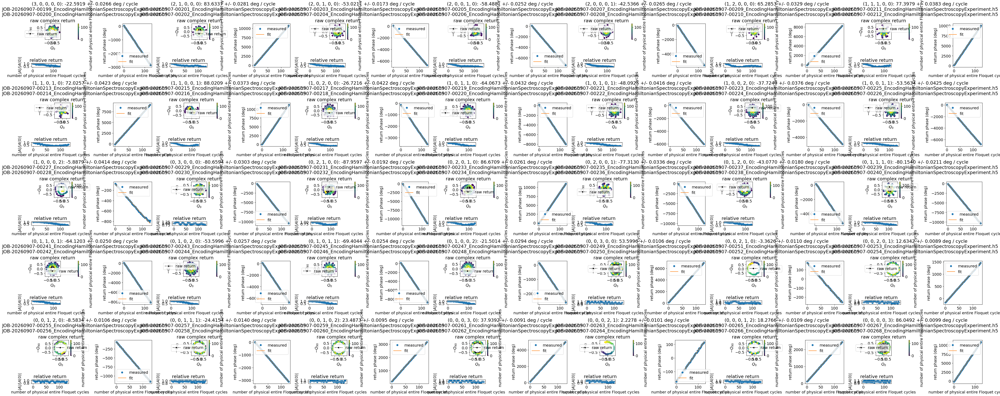

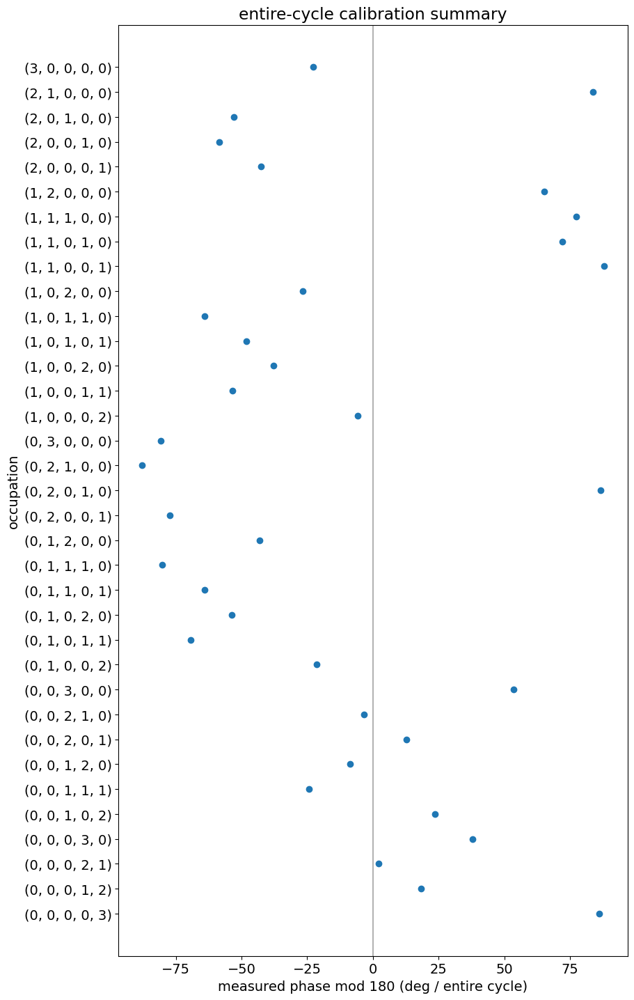

['JOB-20260907-00199',
 'JOB-20260907-00200',
 'JOB-20260907-00201',
 'JOB-20260907-00202',
 'JOB-20260907-00203',
 'JOB-20260907-00204',
 'JOB-20260907-00205',
 'JOB-20260907-00206',
 'JOB-20260907-00207',
 'JOB-20260907-00208',
 'JOB-20260907-00209',
 'JOB-20260907-00210',
 'JOB-20260907-00211',
 'JOB-20260907-00212',
 'JOB-20260907-00213',
 'JOB-20260907-00214',
 'JOB-20260907-00215',
 'JOB-20260907-00216',
 'JOB-20260907-00217',
 'JOB-20260907-00218',
 'JOB-20260907-00219',
 'JOB-20260907-00220',
 'JOB-20260907-00221',
 'JOB-20260907-00222',
 'JOB-20260907-00223',
 'JOB-20260907-00224',
 'JOB-20260907-00225',
 'JOB-20260907-00226',
 'JOB-20260907-00227',
 'JOB-20260907-00228',
 'JOB-20260907-00229',
 'JOB-20260907-00230',
 'JOB-20260907-00231',
 'JOB-20260907-00232',
 'JOB-20260907-00233',
 'JOB-20260907-00234',
 'JOB-20260907-00235',
 'JOB-20260907-00236',
 'JOB-20260907-00237',
 'JOB-20260907-00238',
 'JOB-20260907-00239',
 'JOB-20260907-00240',
 'JOB-20260907-00241',
 'JOB-20260

In [49]:
encspec_N = 3
encspec_calibration_occupations = [
    list(occupation)
    for occupation in product(range(encspec_N + 1), repeat=len(encspec_mode_labels))
    if sum(occupation) == encspec_N
]
encspec_calibration_occupations.sort(reverse=True)
encspec_cycle_pairs = np.arange(0, 65, dtype=int)  # physical cycles: 0, 2, ..., 128

calibration_batch = EncSpec.calibration_batch(
    encspec_defaults, encspec_modes, encspec_calibration_occupations,
    encspec_cycle_pairs, sync_cycles=encspec_sync_cycles, repeats=1, reps=1000,
)
calibration_runner = BatchRunner(
    station=station,
    ExptClass=EncSpec,
    ExptProgram=floquet_dark_mode_readout.EntireFloquetCyclePhaseCalibrationProgram,
    default_expt_cfg=calibration_batch.default_expt_cfg,
    job_client=client,
    show=False,
)
calibration_expt = calibration_runner.execute(
    calibration_batch.configs, batch_size=10, log=True, show=False,
)
calibration_expt.analyze(stage="calibration")
encspec_calibrations[encspec_N] = calibration_expt
calibration_expt.display()
plt.show()
calibration_expt.batch_job_ids

### Replace selected calibration occupations

Edit `recalibration_occupations` and run the first cell to acquire and inspect only those rows. If the fits are acceptable, run the following cell to replace those rows in the active in-memory calibration. The previous H5 files remain unchanged.

In [223]:
encspec_calibration_occupations = [
    list(occupation)
    for occupation in product(
        range(encspec_N + 1),
        repeat=len(encspec_mode_labels),
    )
    if sum(occupation) == encspec_N
]

# recalibration_occupations = [
#     [0, 0, 3, 0, 0],
#     [0, 0, 2, 1, 0],
# ]

recalibration_occupations = [entry for entry in encspec_calibration_occupations if entry[1] > 0]
recalibration_reps = 1000
recalibration_batch_size = 2
recalibration_repeats = 1
recalibration_N = int(encspec_N)

if recalibration_N not in encspec_calibrations:
    raise RuntimeError(
        f"load or acquire the N={recalibration_N} calibration first"
    )
base_calibration_expt = encspec_calibrations[recalibration_N]
base_occupation_keys = {
    tuple(occupation)
    for occupation in base_calibration_expt.data.occupations
}
recalibration_keys = [
    tuple(occupation) for occupation in recalibration_occupations
]
if len(set(recalibration_keys)) != len(recalibration_keys):
    raise ValueError("recalibration occupations must be unique")
for occupation in recalibration_occupations:
    if len(occupation) != len(encspec_mode_labels):
        raise ValueError(f"wrong mode count: {occupation}")
    if sum(occupation) != recalibration_N:
        raise ValueError(f"wrong photon number: {occupation}")
    if tuple(occupation) not in base_occupation_keys:
        raise ValueError(
            f"occupation is absent from the active calibration: {occupation}"
        )

reference_cfg = base_calibration_expt.batch_expts[0].cfg.expt
recalibration_cycle_pairs = np.asarray(
    reference_cfg.n_cycle_pairs, dtype=int
)
recalibration_unwrap_mode = str(
    reference_cfg.get("phase_unwrap_mode", "pair")
)
recalibration_sync_cycles = int(
    reference_cfg.get("scramble_sync_cycles", encspec_sync_cycles)
)

recalibration_batch = EncSpec.calibration_batch(
    encspec_defaults,
    encspec_modes,
    recalibration_occupations,
    recalibration_cycle_pairs,
    sync_cycles=recalibration_sync_cycles,
    repeats=recalibration_repeats,
    reps=recalibration_reps,
    unwrap_mode=recalibration_unwrap_mode,
)
recalibration_runner = BatchRunner(
    station=station,
    ExptClass=EncSpec,
    ExptProgram=(
        floquet_dark_mode_readout
        .EntireFloquetCyclePhaseCalibrationProgram
    ),
    default_expt_cfg=recalibration_batch.default_expt_cfg,
    job_client=client,
    show=False,
)
replacement_calibration_expt = recalibration_runner.execute(
    recalibration_batch.configs,
    batch_size=recalibration_batch_size,
    log=True,
    show=False,
)
replacement_calibration_expt.analyze(
    stage="calibration",
    occupations=recalibration_occupations,
    cycle_pairs=recalibration_cycle_pairs,
    repeats=recalibration_repeats,
)
replacement_calibration_expt.display()
plt.show()
print("replacement jobs:", replacement_calibration_expt.batch_job_ids)

RuntimeError: load or acquire the N=3 calibration first

In [ ]:
# Accept the inspected jobs and replace only these calibration rows.
old_calibration_expt = encspec_calibrations[recalibration_N]
old_occupation_order = [
    tuple(occupation)
    for occupation in old_calibration_expt.data.occupations
]
recalibration_key_set = set(recalibration_keys)

if list(old_calibration_expt.data.mode_labels) != list(
        replacement_calibration_expt.data.mode_labels):
    raise ValueError("replacement calibration uses a different mode order")
old_hardware = old_calibration_expt.data.hardware
new_hardware = replacement_calibration_expt.data.hardware
if (
    not np.isclose(
        old_hardware.floquet_cycle_us,
        new_hardware.floquet_cycle_us,
    )
    or not np.allclose(
        old_hardware.couplings_MHz,
        new_hardware.couplings_MHz,
    )
    or not np.isclose(
        old_hardware.physical_kerr_MHz,
        new_hardware.physical_kerr_MHz,
    )
):
    raise ValueError(
        "Floquet hardware changed; do not mix partial calibration jobs"
    )

old_job_ids = list(old_calibration_expt.batch_job_ids)
old_expts = list(old_calibration_expt.batch_expts)
new_job_ids = list(replacement_calibration_expt.batch_job_ids)
new_expts = list(replacement_calibration_expt.batch_expts)
if len(old_job_ids) != len(old_expts):
    raise RuntimeError("old calibration jobs and IDs are not aligned")
if len(new_job_ids) != len(new_expts):
    raise RuntimeError("replacement calibration jobs and IDs are not aligned")

old_phase_by_occupation = {
    tuple(occupation): float(phase)
    for occupation, phase in zip(
        old_calibration_expt.data.occupations,
        old_calibration_expt.data.phase_mod180,
    )
}
merged_expts = []
merged_job_ids = []
for expt, job_id in zip(old_expts, old_job_ids):
    occupation_key = tuple(expt.cfg.expt.spectroscopy_occupations)
    if occupation_key in recalibration_key_set:
        continue
    merged_expts.append(expt)
    merged_job_ids.append(job_id)
for expt, job_id in zip(new_expts, new_job_ids):
    merged_expts.append(expt)
    merged_job_ids.append(job_id)

updated_calibration_expt = EncSpec.from_job_files(
    merged_expts,
    station=station,
)
updated_calibration_expt.batch_job_ids = merged_job_ids
updated_calibration_expt.analyze(
    stage="calibration",
    occupations=old_occupation_order,
    cycle_pairs=recalibration_cycle_pairs,
)
new_phase_by_occupation = {
    tuple(occupation): float(phase)
    for occupation, phase in zip(
        updated_calibration_expt.data.occupations,
        updated_calibration_expt.data.phase_mod180,
    )
}
for occupation_key in old_occupation_order:
    if occupation_key in recalibration_key_set:
        continue
    if not np.isclose(
        old_phase_by_occupation[occupation_key],
        new_phase_by_occupation[occupation_key],
    ):
        raise RuntimeError(
            f"non-target calibration changed: {occupation_key}"
        )

encspec_calibrations[recalibration_N] = updated_calibration_expt
calibration_expt = updated_calibration_expt
encspec_calibration_job_ids[recalibration_N] = merged_job_ids
encspec_calibration_files[recalibration_N] = [
    station.data_path / f"{job_id}_{EncSpec.__name__}.h5"
    for job_id in merged_job_ids
]

for occupation_key in recalibration_keys:
    print(
        occupation_key,
        f"{old_phase_by_occupation[occupation_key]:+.6f}",
        "->",
        f"{new_phase_by_occupation[occupation_key]:+.6f}",
        "deg / cycle",
    )
print("active calibration rows:", len(old_occupation_order))
print("replacement jobs:", new_job_ids)

## 2. Zero-cycle encoder/decoder orthogonality

Rows are decoder occupations and columns are encoder occupations. This coherent cross-return check uses no Floquet phase calibration and does not submit jobs until the following cell is run.


In [50]:
orthogonality_N = int(encspec_N)
orthogonality_reps = 1000
orthogonality_occupations = [
    list(occupation)
    for occupation in product(
        range(orthogonality_N + 1),
        repeat=len(encspec_mode_labels),
    )
    if sum(occupation) == orthogonality_N
]

# orthogonality_occupations = [
#     [3, 0, 0, 0, 0],
#     [0, 3, 0, 0, 0],
#     [0, 0, 0, 0, 3],
#     [1, 2, 0, 0, 0],
#     [2, 1, 0, 0, 0],
#     [2, 0, 0, 0, 1],
#     [1, 1, 0, 0, 1]
#     # [0, 0, 0, 3, 0],
#     # [1, 0, 0, 2, 0],
#     # [2, 0, 0, 1, 0],
# ]


orthogonality_occupations.sort(reverse=True)

orthogonality_batch = EncSpec.orthogonality_batch(
    encspec_defaults,
    encspec_modes,
    orthogonality_occupations,
    sync_cycles=encspec_sync_cycles,
    reps=orthogonality_reps,
)

print("mode order:", encspec_mode_labels)
print("occupation count:", len(orthogonality_occupations))
print(
    f"{len(orthogonality_batch.configs)} jobs, "
    f"{orthogonality_batch.points_per_job} points/job, "
    f"{orthogonality_batch.total_points} total Ramsey points"
)
print("setup validated; run the next cell to submit jobs")


mode order: ['M1', 'S2', 'S3', 'S4', 'S5']
occupation count: 35
35 jobs, 140 points/job, 4900 total Ramsey points
setup validated; run the next cell to submit jobs


In [51]:
orthogonality_runner = BatchRunner(
    station=station,
    ExptClass=EncSpec,
    ExptProgram=(
        floquet_dark_mode_readout
        .EncodingOrthogonalityProgram
    ),
    default_expt_cfg=orthogonality_batch.default_expt_cfg,
    job_client=client,
    show=False,
)
orthogonality_expt = orthogonality_runner.execute(
    orthogonality_batch.configs,
    batch_size=1,
    log=True,
    show=False
)


batch 1: 1 jobs
Job submitted: JOB-20260907-00269 (queue position: 1)
[WORKER] Loading EncodingHamiltonianSpectroscopyExperiment from experiments.qsim.floquet_dark_mode_readout
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260907-00269_EncodingHamiltonianSpectroscopyExperiment.h5
[WORKER]   Program: EncodingOrthogonalityProgram from experiments.qsim.floquet_dark_mode_readout
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
100%|██████████████████████████████████████████| 70/70 [02:29<00:00,  2.13s/it]
Saving C:\experiments\260818_qsim_spectroscopy\data\JOB-20260907-00269_EncodingHamiltonianSpectroscopyExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260818_qsim_spectroscopy\expt_objs\JOB-20260907-00269_expt.pkl
[log_measurement] Appended section to G:\Shared drives\SLab\Multimode\Lab\jonginn\EncSpec\2026\09\2026-09-07.md
batch 2: 1 jobs
Jo

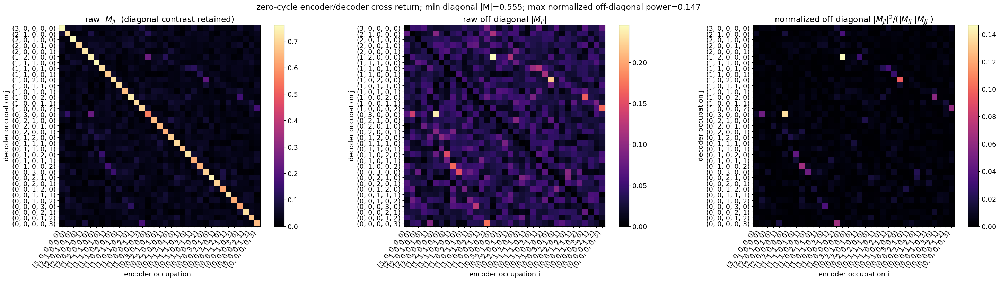

job ids: ['JOB-20260907-00269', 'JOB-20260907-00270', 'JOB-20260907-00271', 'JOB-20260907-00272', 'JOB-20260907-00273', 'JOB-20260907-00274', 'JOB-20260907-00275', 'JOB-20260907-00276', 'JOB-20260907-00277', 'JOB-20260907-00278', 'JOB-20260907-00279', 'JOB-20260907-00280', 'JOB-20260907-00281', 'JOB-20260907-00282', 'JOB-20260907-00283', 'JOB-20260907-00284', 'JOB-20260907-00285', 'JOB-20260907-00286', 'JOB-20260907-00287', 'JOB-20260907-00288', 'JOB-20260907-00289', 'JOB-20260907-00290', 'JOB-20260907-00291', 'JOB-20260907-00292', 'JOB-20260907-00293', 'JOB-20260907-00294', 'JOB-20260907-00295', 'JOB-20260907-00296', 'JOB-20260907-00297', 'JOB-20260907-00298', 'JOB-20260907-00299', 'JOB-20260907-00300', 'JOB-20260907-00301', 'JOB-20260907-00302', 'JOB-20260907-00303']
mode order: ['M1', 'S2', 'S3', 'S4', 'S5']
matrix orientation: rows=decoder, columns=encoder
raw diagonal |M_ii|: [0.76049314 0.70730306 0.75587421 0.69797454 0.72470368 0.74003305
 0.75011751 0.71068259 0.6791748  0.713

In [52]:
orthogonality_data = orthogonality_expt.analyze(
    stage="orthogonality",
    occupations=orthogonality_occupations,
)
orthogonality_expt.display_orthogonality(figsize=(30, 8))
plt.show()

orthogonality_offdiagonal = (
    orthogonality_data.offdiagonal_normalized_power.copy()
)
np.fill_diagonal(orthogonality_offdiagonal, np.nan)
print("job ids:", orthogonality_expt.batch_job_ids)
print("mode order:", orthogonality_data.mode_labels)
print("matrix orientation:", orthogonality_data.matrix_orientation)
print("raw diagonal |M_ii|:", orthogonality_data.diagonal_amplitude)
print(
    "normalized leakage proxy by encoder column:",
    orthogonality_data.column_leakage,
)
print(
    "max normalized off-diagonal power:",
    np.nanmax(orthogonality_offdiagonal),
)


In [209]:
station.ds_storage.df


,stor_name,freq (MHz),precision (MHz),pi (mus),h_pi (mus),gain (DAC units),last_update,bs_rate_coeffs_g,bs_rate_coeffs_e,freq_coeffs_g,freq_coeffs_e,gain_range_g,gain_range_e,joint_parity,dr_ac_stark_rate,dr_jp_phase
0,M1-S1,342.105410,NaN,0.557694,0.278847,5000,2026-09-06 21:21:22.369784,"[2.71800440497595e-10, 3.5345716702085755e-05,...","[2.617101263255993e-10, 3.5294007231684914e-05...","[-5.581106410081517e-38, 3.497594370968036e-33...","[-5.787229142339564e-38, 3.802111265047564e-33...","[2823.494166114352, 10936.689003179721]","[2834.8504180018463, 11002.012121829115]","[352.95224967922866, 3259, 3.513105914802541, ...",NaN,NaN
1,M1-S2,512.695252,NaN,0.615557,0.307779,7008,2026-09-06 21:23:35.491765,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,M1-S3,689.103320,NaN,0.883949,0.441975,4960,2026-09-06 21:25:46.028223,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,M1-S4,868.676827,NaN,1.053991,0.526996,9851,2026-09-06 21:27:35.190119,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,M1-S5,1044.993117,NaN,1.173960,0.586980,9990,2026-09-06 21:29:36.115753,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,M1-S6,1236.785773,NaN,1.167909,0.583954,10050,2026-09-06 21:31:25.228604,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,M1-S7,1414.679004,NaN,1.151378,0.575689,10320,2026-09-06 21:33:03.188702,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,M1-S8,-1.000000,-1.00,-1.000000,-1.000000,-1,51:31.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,M1-S9,-1.000000,-1.00,-1.000000,-1.000000,-1,51:31.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,M1-S10,-1.000000,-1.00,-1.000000,-1.000000,-1,51:31.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [208]:
station.update_all_station_snapshots()

[CONFIG] Reusing existing hardware_config version CFG-HW-20260906-00001
[CONFIG] Reusing existing multiphoton_config version CFG-MP-20260121-00001
[CONFIG] Reusing existing man1_storage_swap version CFG-M1-20260906-00019
[CONFIG] Reusing existing floquet_storage_swap version CFG-FL-20260906-00041
Config snapshots for current station:
  hardware_config: CFG-HW-20260906-00001
  multiphoton_config: CFG-MP-20260121-00001
  man1_storage_swap: CFG-M1-20260906-00019
  floquet_storage_swap: CFG-FL-20260906-00041


{'hardware_config': 'CFG-HW-20260906-00001',
 'multiphoton_config': 'CFG-MP-20260121-00001',
 'man1_storage_swap': 'CFG-M1-20260906-00019',
 'floquet_storage_swap': 'CFG-FL-20260906-00041'}

## 3. Diagonal and off-diagonal spectroscopy

Leave `batch_encspec_N = None` and edit `occupation` plus `decoder_occupation` to measure one matrix element. Set `batch_encspec_N = N` to ignore those two states, acquire every diagonal occupation in the fixed-N sector, and plot the complete-basis DOS.

In [11]:
# Set one value only: None for one matrix element, or N for all diagonal rows.
batch_encspec_N = None # int or None;
if batch_encspec_N is None:
    occupation = [
        [3, 0, 0, 0, 0],
        [0, 0, 1, 1, 1],
        [0, 1, 1, 1, 0],
        [2, 0, 0, 0, 1],
        [2, 1, 0, 0, 0],
    ]
    decoder_occupation = [
        [3, 0, 0, 0, 0],
        [0, 0, 1, 1, 1],
        [0, 1, 1, 1, 0],
        [2, 0, 0, 0, 1],
        [2, 1, 0, 0, 0],
    ]  
else:
    occupation = None
    decoder_occupation = None

encspec_cycle_chunks = floquet_cycle_list_gen(0, 400, 400, 2)
encspec_reps = 500 #1200
encspec_batch_size = 1 if batch_encspec_N is None else 10
encspec_batch_size = 2


if batch_encspec_N is None:
    if occupation is None or decoder_occupation is None:
        raise ValueError(
            "single-pair mode requires occupation and decoder_occupation"
        )
    spectroscopy_N = sum(occupation[0])
    for occupation_indv, decoder_occupation_indv in zip(occupation, decoder_occupation):
        if len(occupation_indv) != len(encspec_mode_labels):
            raise ValueError("occupation has the wrong mode count")
        if len(decoder_occupation_indv) != len(encspec_mode_labels):
            raise ValueError("decoder_occupation has the wrong mode count")
        if sum(occupation_indv) != spectroscopy_N:
            raise ValueError("encoder and decoder photon numbers differ")
        if sum(decoder_occupation_indv) != spectroscopy_N:
            raise ValueError("encoder and decoder photon numbers differ")
        # spectroscopy_occupations = [list(occupation)]
    # spectroscopy_final_occupations = [list(decoder_occupation)]
    spectroscopy_occupations = [
        list(state) for state in occupation
    ]
    spectroscopy_final_occupations = [
        list(state) for state in decoder_occupation
    ]
    
    spectroscopy_display_occupation = list(occupation[0])
else:
    spectroscopy_N = int(batch_encspec_N)
    if spectroscopy_N < 0:
        raise ValueError("batch_encspec_N must be non-negative")
    spectroscopy_occupations = [
        list(state)
        for state in product(
            range(spectroscopy_N + 1),
            repeat=len(encspec_mode_labels),
        )
        if sum(state) == spectroscopy_N
    ]
    spectroscopy_occupations.sort(reverse=True)
    spectroscopy_final_occupations = [
        list(state) for state in spectroscopy_occupations
    ]
    spectroscopy_display_occupation = None

N = spectroscopy_N
if N not in encspec_calibrations:
    calibration_expt = EncSpec.from_job_files(
        encspec_calibration_files[N],
        station=station,
    )
    calibration_expt.batch_job_ids = encspec_calibration_job_ids[N]
    calibration_expt.analyze(stage="calibration")
    encspec_calibrations[N] = calibration_expt

calibration_expt = encspec_calibrations[N]
cycle_branches = {
    tuple(state): 0 for state in spectroscopy_final_occupations
}
correction = EncSpec.phase_correction_from_calibration(
    calibration_expt,
    cycle_branches=cycle_branches,
)
missing_calibrations = [
    tuple(state)
    for state in spectroscopy_final_occupations
    if tuple(state) not in correction.phase_by_occupation
]
if missing_calibrations:
    raise ValueError(f"missing calibration rows: {missing_calibrations}")

spectroscopy_batch = EncSpec.spectroscopy_batch(
    encspec_defaults,
    encspec_modes,
    spectroscopy_occupations,
    encspec_cycle_chunks,
    correction.phase_by_occupation,
    detunings=[0.] * len(encspec_modes),
    sync_cycles=encspec_sync_cycles,
    reps=encspec_reps,
    final_occupations=spectroscopy_final_occupations
)
spectroscopy_runner = BatchRunner(
    station=station,
    ExptClass=EncSpec,
    ExptProgram=spectroscopy_batch.program,
    default_expt_cfg=spectroscopy_batch.default_expt_cfg,
    job_client=client,
    show=False,
)

print("N:", spectroscopy_N)
print("occupations:", len(spectroscopy_occupations))
print("jobs:", len(spectroscopy_batch.configs))
spectroscopy_expt = spectroscopy_runner.execute(
    spectroscopy_batch.configs,
    batch_size=encspec_batch_size,
    log=True,
    show=False,
)
spectroscopy_data = spectroscopy_expt.analyze(
    stage="spectrum",
    occupations=spectroscopy_occupations,
    cycle_branches=cycle_branches,
)
if batch_encspec_N is None:
    spectroscopy_expt.display(
        occupation=spectroscopy_display_occupation,
    )
else:
    if not spectroscopy_data.spectrum.complete_basis:
        raise RuntimeError(
            "the acquired rows are not the complete fixed-N diagonal basis"
        )
    spectroscopy_expt.display(level_statistics=False)
plt.show()

KeyError: 3

['JOB-20260906-00075', 'JOB-20260906-00076', 'JOB-20260906-00077', 'JOB-20260906-00078', 'JOB-20260906-00079', 'JOB-20260906-00080']


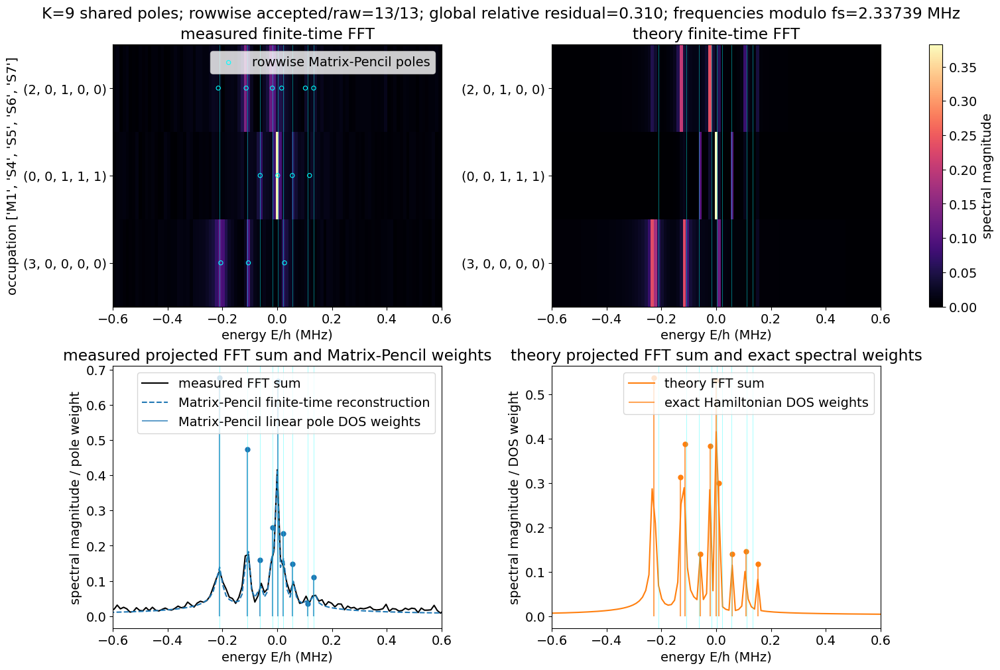

In [96]:

spectroscopy_data = spectroscopy_expt.analyze(
    stage="spectrum",
    occupations=spectroscopy_occupations,
    cycle_branches=cycle_branches,
    spectrum_method = 'mpm'
)

spectroscopy_expt.display(method = 'mpm')
print(spectroscopy_expt.batch_job_ids)

{(3, 0, 0, 0, 0): <Figure size 1800x480 with 3 Axes>,
 (0, 0, 1, 1, 1): <Figure size 1800x480 with 3 Axes>,
 (2, 0, 1, 0, 0): <Figure size 1800x480 with 3 Axes>}

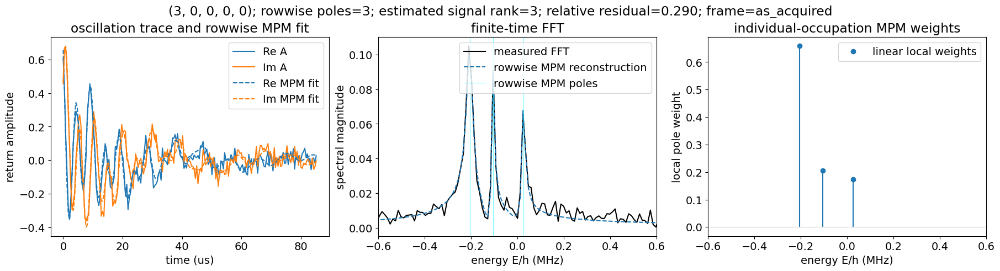

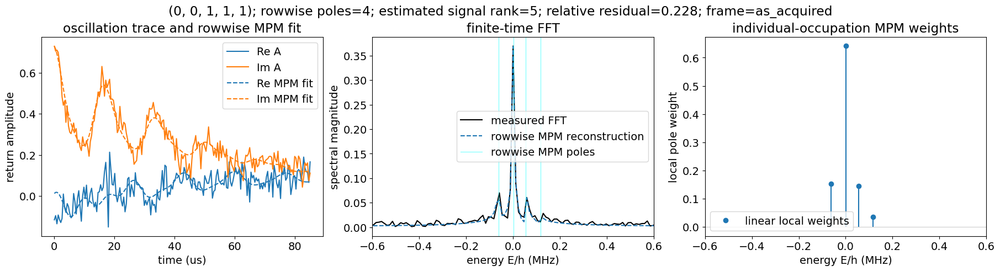

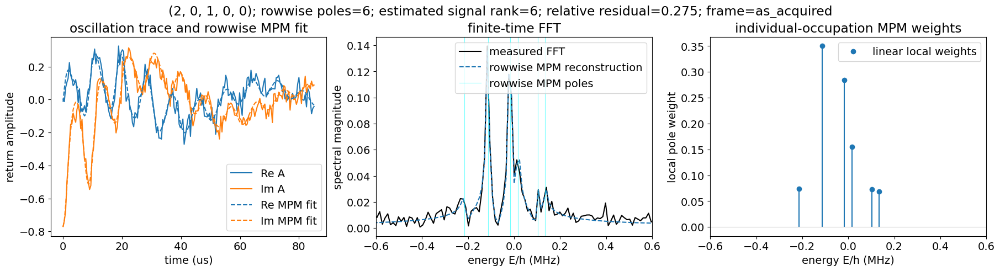

In [97]:
spectroscopy_expt.display_occupations(occupations = occupation)

### 3-1. Fit M1 self-Kerr from experiment--theory peak overlap

This reuses `spectroscopy_expt` and submits no jobs. It scans the signed M1 self-Kerr and scores only traces whose encoder occupation has at least two M1 photons. Rows are averaged within each M1-photon-number group and the groups are weighted equally, so a single trace such as `(3, 0, 0, 0, 0)` is not overwhelmed by the larger `n_M1 = 2` group.

fit occupations: [(3, 0, 0, 0, 0), (2, 0, 1, 0, 0)]
best signed M1 self-Kerr = -52.305 kHz


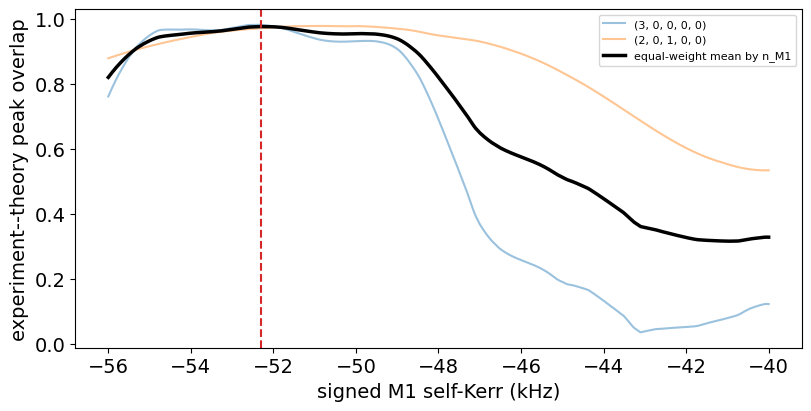

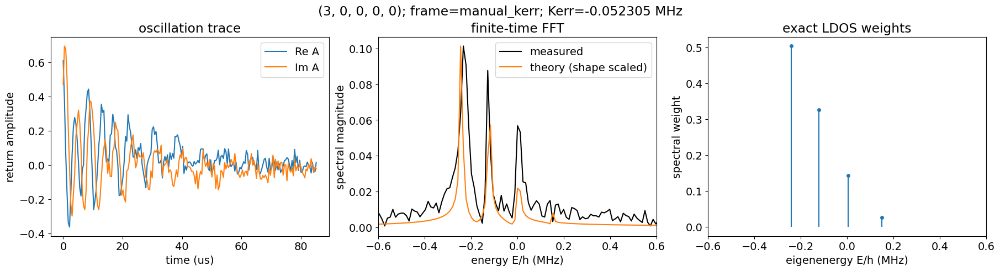

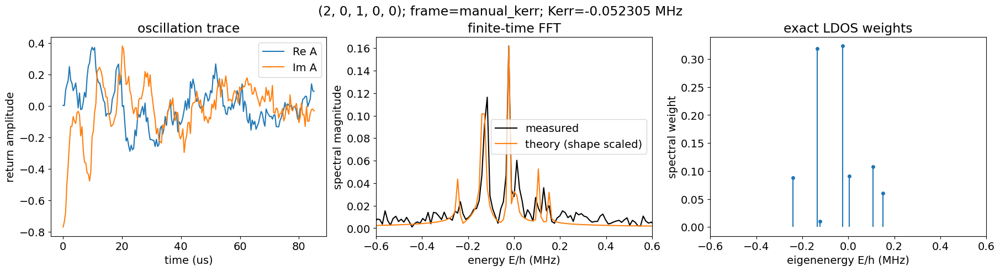

In [98]:
# Analysis only: this cell does not submit new jobs.
kerr_grid_kHz = np.arange(-56.0, -40.0 + 1e-9, 0.005)
kerr_fit_energy_limit_MHz = 0.08
kerr_fit_min_man_photons = 2
kerr_fit_baseline_quantile = 0.20


def normalize_peak_rows(values):
    values = np.asarray(values, dtype=float)
    values = np.clip(
        values - np.quantile(
            values,
            kerr_fit_baseline_quantile,
            axis=1,
            keepdims=True,
        ),
        0.0,
        None,
    )
    return values / np.maximum(
        np.linalg.norm(values, axis=1, keepdims=True),
        1e-15,
    )


kerr_fit_occupations_array = np.asarray(
    spectroscopy_data.reconstruction.occupations,
    dtype=int,
)
kerr_fit_rows = np.flatnonzero(
    kerr_fit_occupations_array[:, 0] >= kerr_fit_min_man_photons
)
kerr_fit_occupations = [
    tuple(spectroscopy_data.reconstruction.occupations[row])
    for row in kerr_fit_rows
]

if len(kerr_fit_rows) == 0:
    print(
        f"self-Kerr fit skipped: no trace has "
        f"n_M1 >= {kerr_fit_min_man_photons}"
    )
else:
    kerr_fit_scores = []
    kerr_fit_trace_scores = []
    kerr_fit_n_M1 = kerr_fit_occupations_array[kerr_fit_rows, 0]

    for kerr_kHz in kerr_grid_kHz:
        candidate_data = spectroscopy_expt.analyze(
            stage="spectrum",
            calibration=calibration_expt,
            occupations=spectroscopy_occupations,
            cycle_branches=cycle_branches,
            phase_frame="manual_kerr",
            manual_kerr_MHz=kerr_kHz * 1e-3,
            spectrum_method="fft",
        )
        use_energy = (
            np.abs(candidate_data.spectrum.energy_MHz)
            < kerr_fit_energy_limit_MHz
        )
        measured_peaks = normalize_peak_rows(
            candidate_data.spectrum.measured_local[kerr_fit_rows][
                :, use_energy
            ]
        )
        theory_peaks = normalize_peak_rows(
            candidate_data.spectrum.theory_local[kerr_fit_rows][
                :, use_energy
            ]
        )
        trace_scores = np.sum(measured_peaks * theory_peaks, axis=1)
        photon_group_scores = [
            np.mean(trace_scores[kerr_fit_n_M1 == n_M1])
            for n_M1 in np.unique(kerr_fit_n_M1)
        ]
        kerr_fit_trace_scores.append(trace_scores)
        kerr_fit_scores.append(np.mean(photon_group_scores))

    kerr_fit_scores = np.asarray(kerr_fit_scores)
    kerr_fit_trace_scores = np.asarray(kerr_fit_trace_scores)
    best_kerr_index = int(np.argmax(kerr_fit_scores))
    best_self_kerr_kHz = float(kerr_grid_kHz[best_kerr_index])

    # analyze() mutates spectroscopy_expt.data, so restore the best grid point.
    spectroscopy_data = spectroscopy_expt.analyze(
        stage="spectrum",
        calibration=calibration_expt,
        occupations=spectroscopy_occupations,
        cycle_branches=cycle_branches,
        phase_frame="manual_kerr",
        manual_kerr_MHz=best_self_kerr_kHz * 1e-3,
        spectrum_method="fft",
    )

    print("fit occupations:", kerr_fit_occupations)
    print(f"best signed M1 self-Kerr = {best_self_kerr_kHz:.3f} kHz")
    if best_kerr_index in (0, len(kerr_grid_kHz) - 1):
        print("best point is on the grid boundary; expand kerr_grid_kHz")

    plt.figure(figsize=(8, 4), constrained_layout=True)
    for column, fit_occupation in enumerate(kerr_fit_occupations):
        plt.plot(
            kerr_grid_kHz,
            kerr_fit_trace_scores[:, column],
            alpha=0.45,
            label=str(fit_occupation),
        )
    plt.plot(
        kerr_grid_kHz,
        kerr_fit_scores,
        color="black",
        linewidth=2.5,
        label="equal-weight mean by n_M1",
    )
    plt.axvline(best_self_kerr_kHz, color="tab:red", linestyle="--")
    plt.xlabel("signed M1 self-Kerr (kHz)")
    plt.ylabel("experiment--theory peak overlap")
    plt.legend(fontsize=8)
    plt.show()

    for kerr_fit_row in kerr_fit_rows:
        spectroscopy_expt.display_occupations(
            occupations=int(kerr_fit_row),
        )
    plt.show()

## 4. Matrix Pencil analysis

This reuses the jobs already held by `spectroscopy_expt`; it submits nothing. FFT/theory and MPM are produced by the same analysis call and can be displayed independently.


In [ ]:
spectroscopy_expt.analyze(
    stage="spectrum",
    occupations=spectroscopy_occupations,
    cycle_branches=cycle_branches,
    spectrum_method="mpm",
)
if spectroscopy_display_occupation is None:
    spectroscopy_expt.display(
        spectrum_method="fft",
        level_statistics=False,
    )
    spectroscopy_expt.display(spectrum_method="mpm")
else:
    spectroscopy_expt.display(
        occupation=spectroscopy_display_occupation,
        spectrum_method="fft",
    )
    spectroscopy_expt.display(
        occupation=spectroscopy_display_occupation,
        spectrum_method="mpm",
    )
plt.show()

## 5. Reanalyze saved spectroscopy HDF5

This cell loads the four known-good interleaved off-diagonal jobs without acquiring new data. Replace the job list to analyze another saved spectroscopy batch.


In [ ]:
spectroscopy_job_ids = [
    f"JOB-20260823-{job:05d}" for job in range(5, 9)
]
spectroscopy_files = [
    station.data_path / f"{job_id}_{EncSpec.__name__}.h5"
    for job_id in spectroscopy_job_ids
]
saved_spectroscopy_expt = EncSpec.from_job_files(
    spectroscopy_files,
    station=station,
)
saved_spectroscopy_expt.batch_job_ids = spectroscopy_job_ids
saved_spectroscopy_expt.analyze(
    stage="spectrum",
    cycle_branches={(0, 0, 2, 0, 0): 0},
)
saved_spectroscopy_expt.display(
    occupation=[0, 0, 1, 1, 0],
)
plt.show()


## 6. Propagator

The setup uses the same occupation-keyed calibration. The next cell performs execute, analyze, and a direct matrix display.


In [ ]:
propagator_occupations = [
    [0, 0, 0, 0, 3],
    [1, 0, 0, 0, 2],
    [0, 1, 1, 1, 0],
]
propagator_cycles = [0, 4, 8]
N = sum(propagator_occupations[0])

if N not in encspec_calibrations:
    calibration_expt = EncSpec.from_job_files(
        encspec_calibration_files[N],
        station=station,
    )
    calibration_expt.batch_job_ids = encspec_calibration_job_ids[N]
    calibration_expt.analyze(stage="calibration")
    encspec_calibrations[N] = calibration_expt

calibration_expt = encspec_calibrations[N]
propagator_correction = EncSpec.phase_correction_from_calibration(
    calibration_expt,
    cycle_branches={tuple(occupation): 0 for occupation in propagator_occupations},
)
propagator_batch = EncSpec.propagator_batch(
    encspec_defaults,
    encspec_modes,
    propagator_occupations,
    propagator_cycles,
    phase_by_occupation=propagator_correction.phase_by_occupation,
    sync_cycles=encspec_sync_cycles,
    reps=1000,
)
propagator_runner = BatchRunner(
    station=station,
    ExptClass=EncSpec,
    ExptProgram=floquet_dark_mode_readout.EncodingPropagatorProgram,
    default_expt_cfg=propagator_batch.default_expt_cfg,
    job_client=client,
    show=False,
)


In [ ]:
propagator_expt = propagator_runner.execute(
    propagator_batch.configs,
    batch_size=1,
    log=True,
    show=False,
)
propagator_data = propagator_expt.analyze(
    stage="propagator",
    occupations=propagator_occupations,
)

fig, axes = plt.subplots(
    1,
    len(propagator_data.cycles),
    figsize=(5 * len(propagator_data.cycles), 4),
    constrained_layout=True,
)
for axis, cycle, matrix in zip(
    np.atleast_1d(axes),
    propagator_data.cycles,
    propagator_data.matrices,
):
    image = axis.imshow(np.abs(matrix), origin="upper", cmap="magma")
    axis.set_title(f"cycle {cycle}: |U|")
    axis.set_xlabel("encoder")
    axis.set_ylabel("decoder")
    fig.colorbar(image, ax=axis)
plt.show()


## 7. Disorder-resolved spectroscopy

For N=3 on S4--S7, all four leaf onsite energies are distinct. Encoder and decoder states with two or more photons in M1 are excluded. Ten diagonal/off-diagonal pairs are selected by calibration contrast and their complementary exact-eigenstate overlap.


In [ ]:
disorder_N = 3
disorder_strength_kHz = 50.
disorder_seed = 20260902
disorder_pair_count = 10
disorder_reps = 300
disorder_batch_size = 1

if disorder_N not in encspec_calibrations:
    calibration_expt = EncSpec.from_job_files(
        encspec_calibration_files[disorder_N],
        station=station,
    )
    calibration_expt.batch_job_ids = encspec_calibration_job_ids[disorder_N]
    calibration_expt.analyze(stage="calibration")
    encspec_calibrations[disorder_N] = calibration_expt

disorder_calibration = encspec_calibrations[disorder_N]
disorder_hardware = EncSpec.hardware_parameters(
    station,
    encspec_modes,
    encspec_sync_cycles,
)
rng = np.random.default_rng(disorder_seed)
disorder_onsite_kHz = rng.normal(size=len(encspec_modes))
disorder_onsite_kHz -= disorder_onsite_kHz.mean()
disorder_onsite_kHz *= (
    disorder_strength_kHz
    / np.sqrt(np.mean(disorder_onsite_kHz ** 2))
)
disorder_detunings_MHz = -1e-3 * disorder_onsite_kHz

probe_occupation = [disorder_N] + [0] * len(encspec_modes)
probe = AttrDict(dict(
    occupations=[probe_occupation],
    final_occupations=[probe_occupation.copy()],
    cycles=np.array([0, 1]),
    A=np.ones((1, 2), dtype=complex),
))
disorder_theory = EncSpec.analyze_spectrum(
    probe,
    disorder_N,
    disorder_detunings_MHz,
    disorder_hardware.couplings_MHz,
    disorder_hardware.floquet_cycle_us,
    disorder_hardware.physical_kerr_MHz,
)

disorder_basis = [tuple(occupation) for occupation in disorder_theory.fock_basis]
disorder_access = {
    tuple(result.occupation): abs(result.complex_return[0])
    for result in disorder_calibration.data.results
}
allowed_rows = [
    row
    for row, occupation in enumerate(disorder_basis)
    if occupation[0] < 2 and occupation in disorder_access
]
candidate_rows = list(combinations_with_replacement(allowed_rows, 2))
basis_weights = np.asarray(disorder_theory.basis_eigenstate_weights)
candidate_visibility = np.asarray([
    np.sqrt(
        disorder_access[disorder_basis[decoder]]
        * disorder_access[disorder_basis[encoder]]
    )
    * np.sqrt(basis_weights[decoder] * basis_weights[encoder])
    for decoder, encoder in candidate_rows
])

selected_rows = []
level_coverage = np.zeros(len(disorder_theory.energies_MHz))
for _ in range(disorder_pair_count):
    scores = np.sum(np.log(
        1e-12 + level_coverage[None, :] + candidate_visibility
    ), axis=1)
    scores[selected_rows] = -np.inf
    selected = int(np.argmax(scores))
    selected_rows.append(selected)
    level_coverage += candidate_visibility[selected]

disorder_pairs = [
    (
        disorder_basis[candidate_rows[row][0]],
        disorder_basis[candidate_rows[row][1]],
    )
    for row in selected_rows
]
minimum_gap_MHz = np.min(np.diff(disorder_theory.energies_MHz))
maximum_energy_MHz = max(
    abs(float(energy)) for energy in disorder_theory.energies_MHz
)
disorder_cycle_step = min(
    4,
    max(1, int(0.45 / (
        maximum_energy_MHz * disorder_hardware.floquet_cycle_us
    ))),
)
disorder_sample_count = max(
    200,
    int(np.ceil(
        1.5 / (
            minimum_gap_MHz
            * disorder_cycle_step
            * disorder_hardware.floquet_cycle_us
        )
    )) + 1,
)
disorder_cycles = disorder_cycle_step * np.arange(
    disorder_sample_count,
    dtype=int,
)
disorder_cycle_chunks = [
    disorder_cycles[start:start + 50]
    for start in range(0, len(disorder_cycles), 50)
]
disorder_fft_resolution_kHz = 1e3 / (
    len(disorder_cycles)
    * disorder_cycle_step
    * disorder_hardware.floquet_cycle_us
)

print("leaf onsite disorder (kHz):", dict(zip(
    [f"S{stor}" for stor in encspec_modes],
    np.round(disorder_onsite_kHz, 3),
)))
for decoder, encoder in disorder_pairs:
    print(f"<{decoder}|U(t)|{encoder}>")
print(
    "minimum exact gap / FFT resolution (kHz):",
    1e3 * minimum_gap_MHz,
    disorder_fft_resolution_kHz,
)
print(
    f"{len(disorder_cycles)} cycle points, step {disorder_cycle_step}, "
    f"{len(disorder_cycle_chunks)} chunks per pair"
)

plt.figure(figsize=(11, 3.5), constrained_layout=True)
plt.vlines(
    1e3 * disorder_theory.energies_MHz,
    0.,
    level_coverage,
)
plt.xlabel("exact eigenenergy E/h (kHz)")
plt.ylabel("selected-pair cumulative visibility")
plt.show()


In [ ]:
disorder_decoders = [list(decoder) for decoder, encoder in disorder_pairs]
disorder_encoders = [list(encoder) for decoder, encoder in disorder_pairs]
disorder_cycle_branches = {
    tuple(decoder): 0 for decoder in disorder_decoders
}
disorder_correction = EncSpec.phase_correction_from_calibration(
    disorder_calibration,
    cycle_branches=disorder_cycle_branches,
)
disorder_batch = EncSpec.spectroscopy_batch(
    encspec_defaults,
    encspec_modes,
    disorder_encoders,
    disorder_cycle_chunks,
    disorder_correction.phase_by_occupation,
    detunings=disorder_detunings_MHz,
    sync_cycles=encspec_sync_cycles,
    reps=disorder_reps,
    final_occupations=disorder_decoders,
)
print(f"{len(disorder_batch.configs)} jobs")
disorder_runner = BatchRunner(
    station=station,
    ExptClass=EncSpec,
    ExptProgram=disorder_batch.program,
    default_expt_cfg=disorder_batch.default_expt_cfg,
    job_client=client,
    show=False,
)

disorder_expt = disorder_runner.execute(
    disorder_batch.configs,
    batch_size=disorder_batch_size,
    log=True,
    show=False,
)
disorder_expt.analyze(
    stage="spectrum",
    cycle_branches=disorder_cycle_branches,
    spectrum_method="mpm",
    mpm_requested_max_modes=len(disorder_theory.energies_MHz),
    mpm_match_decay=False,
)
disorder_expt.display(spectrum_method="fft")
disorder_expt.display(spectrum_method="mpm")
plt.show()


### 7-1. Diagonal disorder spectroscopy

This restores the historical diagonal campaign without changing the off-diagonal code above. For each realization it selects ten diagonal occupations whose exact LDOS collectively covers the fixed-$N$ spectrum, runs the 0/90-degree spectroscopy batch, analyzes 35 Matrix-Pencil poles, and plots the pooled adjacent-gap-ratio statistics. Rerunning the cell in the same kernel reuses completed realizations from the in-memory campaign cache instead of submitting them again.

#### 7-1a. Settings and theory-selection helper — no jobs


In [ ]:
# Historical diagonal-disorder campaign: acquisition, MPM, and level statistics.
from copy import deepcopy
from scipy.optimize import (
    Bounds, LinearConstraint, linear_sum_assignment, milp,
)

diag_disorder_N = 3
diag_disorder_realization_count = 20
diag_disorder_strength_kHz = 50.0
diag_disorder_master_seed = 20260816
diag_disorder_selected_states = 10
diag_disorder_max_cycle = 200
diag_disorder_min_time_points = 100
diag_disorder_nyquist_margin = 1.35
diag_disorder_reps = 1200
diag_disorder_batch_size = 2
diag_disorder_edge_fraction = 0.10
diag_disorder_gap_ratio_bins = 15
diag_disorder_match_tolerance_bins = 1.5
diag_disorder_require_complete_match = False

# None uses best_self_kerr_kHz from section 3-1 when available, then falls
# back to the signed Kerr saved with the phase-calibration jobs.
diag_disorder_self_kerr_kHz = None

# Add only occupations whose calibration phase needs a nonzero 180-deg branch.
diag_disorder_branch_overrides = {}


def _diag_disorder_select_rows(weights, number_to_select):
    """Historical max-min LDOS coverage selection for diagonal traces."""
    weights = np.asarray(weights, dtype=float)
    row_count, level_count = weights.shape
    number_to_select = min(int(number_to_select), row_count)

    def solve(weight_floor, objective=None):
        visible = (weights.T >= weight_floor).astype(float)
        if np.any(visible.sum(axis=1) == 0):
            return None
        constraint_matrix = np.vstack([
            np.ones((1, row_count)),
            visible,
        ])
        result = milp(
            c=(
                np.zeros(row_count)
                if objective is None else objective
            ),
            integrality=np.ones(row_count, dtype=int),
            bounds=Bounds(np.zeros(row_count), np.ones(row_count)),
            constraints=LinearConstraint(
                constraint_matrix,
                np.r_[float(number_to_select), np.ones(level_count)],
                np.r_[
                    float(number_to_select),
                    np.full(level_count, np.inf),
                ],
            ),
            options={"disp": False},
        )
        if not result.success or result.x is None:
            return None
        rows = np.flatnonzero(result.x > 0.5)
        return rows if len(rows) == number_to_select else None

    floors = np.unique(np.r_[0.0, weights.ravel()])
    lower = 0
    upper = len(floors) - 1
    best_floor = 0.0
    selected_rows = None
    while lower <= upper:
        middle = (lower + upper) // 2
        trial_rows = solve(float(floors[middle]))
        if trial_rows is None:
            upper = middle - 1
        else:
            best_floor = float(floors[middle])
            selected_rows = trial_rows
            lower = middle + 1

    scale = max(best_floor, 1e-12)
    utility = np.sum(np.minimum(weights / scale, 1.0), axis=1)
    balanced_rows = solve(best_floor, objective=-utility)
    if balanced_rows is not None:
        selected_rows = balanced_rows
    selected_rows = np.asarray(sorted(selected_rows), dtype=int)
    coverage = weights[selected_rows].max(axis=0)
    return selected_rows, best_floor, coverage




#### 7-1b. Build the theory-selected plan and check time — no jobs


In [ ]:
if diag_disorder_N not in encspec_calibrations:
    diag_disorder_calibration = EncSpec.from_job_files(
        encspec_calibration_files[diag_disorder_N],
        station=station,
    )
    diag_disorder_calibration.batch_job_ids = (
        encspec_calibration_job_ids[diag_disorder_N]
    )
    diag_disorder_calibration.analyze(stage="calibration")
    encspec_calibrations[diag_disorder_N] = diag_disorder_calibration

diag_disorder_calibration = encspec_calibrations[diag_disorder_N]
diag_disorder_calibration_data = diag_disorder_calibration.data
diag_disorder_hardware = diag_disorder_calibration_data.hardware

if diag_disorder_self_kerr_kHz is None:
    if "best_self_kerr_kHz" in globals():
        diag_disorder_self_kerr_kHz = float(best_self_kerr_kHz)
        diag_disorder_kerr_source = "section 3-1 fit"
    else:
        diag_disorder_self_kerr_kHz = 1e3 * float(
            diag_disorder_hardware.physical_kerr_MHz
        )
        diag_disorder_kerr_source = "phase-calibration jobs"
else:
    diag_disorder_self_kerr_kHz = float(diag_disorder_self_kerr_kHz)
    diag_disorder_kerr_source = "manual value in this cell"

diag_disorder_self_kerr_MHz = 1e-3 * diag_disorder_self_kerr_kHz
diag_disorder_mode_count = len(encspec_modes) + 1
diag_disorder_plans = []

for diag_realization in range(diag_disorder_realization_count):
    diag_seed = diag_disorder_master_seed + diag_realization
    diag_rng = np.random.default_rng(diag_seed)
    diag_direction = diag_rng.normal(size=len(encspec_modes))
    diag_direction -= np.mean(diag_direction)
    diag_direction /= np.linalg.norm(diag_direction)

    # The analyzer Hamiltonian uses onsite=-detunings.
    diag_target_onsite_MHz = (
        1e-3 * diag_disorder_strength_kHz * diag_direction
    )
    diag_pulse_detunings_MHz = -diag_target_onsite_MHz
    diag_probe_occupation = [
        diag_disorder_N,
        *([0] * (diag_disorder_mode_count - 1)),
    ]
    diag_probe = AttrDict(dict(
        occupations=[diag_probe_occupation],
        final_occupations=[diag_probe_occupation],
        cycles=np.array([0, 1]),
        A=np.ones((1, 2), dtype=complex),
    ))
    diag_theory = EncSpec.analyze_spectrum(
        diag_probe,
        diag_disorder_N,
        diag_pulse_detunings_MHz,
        diag_disorder_hardware.couplings_MHz,
        diag_disorder_hardware.floquet_cycle_us,
        diag_disorder_self_kerr_MHz,
    )
    diag_rows, diag_floor, diag_coverage = (
        _diag_disorder_select_rows(
            diag_theory.basis_eigenstate_weights,
            diag_disorder_selected_states,
        )
    )
    diag_occupations = [
        list(diag_theory.fock_basis[row]) for row in diag_rows
    ]
    diag_disorder_plans.append(dict(
        realization=diag_realization,
        seed=diag_seed,
        direction=diag_direction,
        target_onsite_MHz=diag_target_onsite_MHz,
        pulse_detunings_MHz=diag_pulse_detunings_MHz,
        theory=diag_theory,
        occupations=diag_occupations,
        selection_floor=float(diag_floor),
        coverage=diag_coverage,
    ))

diag_disorder_dimension = len(
    diag_disorder_plans[0]["theory"].energies_MHz
)
diag_disorder_max_abs_energy_MHz = max(
    np.max(np.abs(plan["theory"].energies_MHz))
    for plan in diag_disorder_plans
)
diag_disorder_step_nyquist = int(np.floor(
    1.0 / (
        2.0
        * diag_disorder_nyquist_margin
        * diag_disorder_max_abs_energy_MHz
        * diag_disorder_hardware.floquet_cycle_us
    )
))
diag_disorder_step_points = max(
    1,
    (diag_disorder_max_cycle - 1)
    // (diag_disorder_min_time_points - 1),
)
diag_disorder_cycle_step = max(
    1,
    min(diag_disorder_step_nyquist, diag_disorder_step_points),
)
if diag_disorder_cycle_step > 1 and diag_disorder_cycle_step % 2:
    diag_disorder_cycle_step -= 1

diag_disorder_cycles = np.arange(
    0,
    diag_disorder_max_cycle,
    diag_disorder_cycle_step,
    dtype=int,
)
diag_disorder_cycle_chunks = [diag_disorder_cycles]
diag_disorder_dt_us = (
    diag_disorder_cycle_step
    * diag_disorder_hardware.floquet_cycle_us
)
diag_disorder_nyquist_MHz = 1.0 / (2.0 * diag_disorder_dt_us)
diag_disorder_fft_resolution_MHz = 1.0 / (
    len(diag_disorder_cycles) * diag_disorder_dt_us
)
if diag_disorder_nyquist_MHz < (
    diag_disorder_nyquist_margin
    * diag_disorder_max_abs_energy_MHz
):
    raise RuntimeError(
        "diagonal-disorder cycle step violates the requested "
        "Nyquist margin"
    )

diag_calibration_occupations = [
    tuple(occupation)
    for occupation in diag_disorder_calibration_data.occupations
]
diag_calibration_branches = np.asarray([
    int(diag_disorder_branch_overrides.get(occupation, 0))
    for occupation in diag_calibration_occupations
])
diag_disorder_correction = EncSpec.build_phase_correction(
    diag_disorder_calibration_data.occupations,
    diag_disorder_calibration_data.phase_mod180,
    diag_calibration_branches,
    diag_disorder_self_kerr_MHz,
    diag_disorder_hardware.floquet_cycle_us,
)

diag_disorder_total_jobs = (
    diag_disorder_realization_count
    * 2
    * diag_disorder_selected_states
    * len(diag_disorder_cycle_chunks)
)
diag_disorder_estimated_hours = (
    diag_disorder_total_jobs
    * len(diag_disorder_cycles)
    * 3.76
    * (diag_disorder_reps / 1200.0)
    / 3600.0
)

print(
    f"diagonal disorder: N={diag_disorder_N}, "
    f"realizations={diag_disorder_realization_count}, "
    f"jobs={diag_disorder_total_jobs}"
)
print(
    f"cycles=0:{diag_disorder_max_cycle}:{diag_disorder_cycle_step}, "
    f"points={len(diag_disorder_cycles)}, "
    f"Nyquist={1e3 * diag_disorder_nyquist_MHz:.3f} kHz, "
    f"FFT resolution={1e3 * diag_disorder_fft_resolution_MHz:.3f} kHz"
)
print(
    f"signed M1 self-Kerr={diag_disorder_self_kerr_kHz:.3f} kHz "
    f"({diag_disorder_kerr_source})"
)
print(f"estimated single-worker time={diag_disorder_estimated_hours:.1f} h")
for plan in diag_disorder_plans:
    print(
        f"r={plan['realization']} seed={plan['seed']} | "
        f"leaf onsite={np.round(1e3 * plan['target_onsite_MHz'], 3)} kHz"
    )
    print("  diagonal occupations:", [
        tuple(occupation) for occupation in plan["occupations"]
    ])

# Cache one campaign per parameter/calibration signature in this kernel.
diag_disorder_campaigns = globals().get("diag_disorder_campaigns", {})
diag_disorder_campaign_key = (
    int(diag_disorder_N),
    int(diag_disorder_realization_count),
    float(diag_disorder_strength_kHz),
    int(diag_disorder_master_seed),
    int(diag_disorder_selected_states),
    int(diag_disorder_max_cycle),
    int(diag_disorder_cycle_step),
    int(diag_disorder_reps),
    float(diag_disorder_self_kerr_kHz),
    tuple(sorted(
        (tuple(map(int, occupation)), int(branch))
        for occupation, branch
        in diag_disorder_branch_overrides.items()
    )),
    tuple(
        tuple(map(int, occupation))
        for plan in diag_disorder_plans
        for occupation in plan["occupations"]
    ),
    tuple(map(int, encspec_modes)),
    tuple(map(str, getattr(
        diag_disorder_calibration, "batch_job_ids", []
    ))),
)
diag_disorder_records = diag_disorder_campaigns.setdefault(
    diag_disorder_campaign_key,
    {},
)



#### 7-1c. Run the batch — submits jobs


In [ ]:
# Acquire every realization first. Each aggregate contains only one disorder H.
for plan in diag_disorder_plans:
    diag_realization = plan["realization"]
    if diag_realization in diag_disorder_records:
        print(f"skip r={diag_realization}: already completed in this kernel")
        continue

    diag_defaults = deepcopy(encspec_defaults)
    diag_defaults.update(dict(
        diagonal_disorder_realization=diag_realization,
        diagonal_disorder_seed=plan["seed"],
        diagonal_disorder_strength_kHz=diag_disorder_strength_kHz,
        diagonal_disorder_direction=plan["direction"].tolist(),
        diagonal_disorder_target_onsite_MHz=(
            plan["target_onsite_MHz"].tolist()
        ),
        diagonal_disorder_selected_occupations=plan["occupations"],
        diagonal_disorder_self_kerr_kHz=diag_disorder_self_kerr_kHz,
    ))
    diag_branches = {
        tuple(occupation): int(
            diag_disorder_branch_overrides.get(tuple(occupation), 0)
        )
        for occupation in plan["occupations"]
    }
    diag_batch = EncSpec.spectroscopy_batch(
        diag_defaults,
        encspec_modes,
        plan["occupations"],
        diag_disorder_cycle_chunks,
        diag_disorder_correction.phase_by_occupation,
        detunings=plan["pulse_detunings_MHz"].tolist(),
        sync_cycles=encspec_sync_cycles,
        reps=diag_disorder_reps,
        final_occupations=plan["occupations"],
    )
    diag_runner = BatchRunner(
        station=station,
        ExptClass=EncSpec,
        ExptProgram=diag_batch.program,
        default_expt_cfg=diag_batch.default_expt_cfg,
        job_client=client,
        show=False,
    )
    try:
        diag_expt = diag_runner.execute(
            diag_batch.configs,
            batch_size=diag_disorder_batch_size,
            log=True,
            show=False,
        )
    except BaseException:
        print(
            f"r={diag_realization} submitted before interruption:",
            list(map(str, getattr(diag_runner, "last_job_ids", []))),
        )
        raise

    diag_disorder_records[diag_realization] = dict(
        plan=plan,
        expt=diag_expt,
        job_ids=list(map(str, diag_expt.batch_job_ids)),
        cycle_branches=diag_branches,
        data=None,
    )
    print(
        f"finished acquisition r={diag_realization}:",
        diag_disorder_records[diag_realization]["job_ids"],
    )



In [ ]:
idx_to_plot = 0
diag_disorder_records[idx_to_plot]['expt'].display()
diag_disorder_records[idx_to_plot]['expt'].display_occupations(occupations = [[0, 1, 0, 0, 2], 
                                                                              [1, 2, 0, 0, 0],
                                                                              [1, 0, 1, 0, 1]])

In [ ]:
for each in diag_disorder_records.keys():
    print(diag_disorder_records[each]["job_ids"])

#### 7-1d. Matrix-Pencil analysis and theory matching — no jobs


In [ ]:
# Analyze only after all hardware acquisition is complete.
for diag_realization, record in sorted(diag_disorder_records.items()):
    try:
        diag_data = record["expt"].analyze(
            stage="spectrum",
            calibration=diag_disorder_calibration,
            occupations=record["plan"]["occupations"],
            cycle_branches=record["cycle_branches"],
            phase_frame="manual_kerr",
            manual_kerr_MHz=diag_disorder_self_kerr_MHz,
            spectrum_method="mpm",
            fft_window="raw",
            zero_padding=1,
            mpm_requested_max_modes=diag_disorder_dimension,
            mpm_match_decay=False,
            mpm_track_frequency_tolerance_bins=1.0,
            mpm_merge_frequency_tolerance_bins=0.10,#0.20
            mpm_dedup_frequency_tolerance_bins=0.10, #0.20
            mpm_minimum_supporting_rows=1,
            # mpm_rank_sweep_extra=2,
        )
    except Exception as diag_analysis_error:
        record["analysis_error"] = diag_analysis_error
        print(f"r={diag_realization} analysis failed: {diag_analysis_error}")
        continue

    record["data"] = diag_data
    record.pop("analysis_error", None)

    # Historical diagnostic: match principal-interval MPM poles to theory.
    diag_sampling_frequency_MHz = float(
        diag_data.matrix_pencil.sampling.sampling_frequency_MHz
    )
    diag_principal_nyquist_MHz = 0.5 * diag_sampling_frequency_MHz
    diag_poles_MHz = np.asarray(
        diag_data.matrix_pencil.selected_frequencies_MHz,
        dtype=float,
    )
    diag_poles_MHz = (
        (diag_poles_MHz + diag_principal_nyquist_MHz)
        % diag_sampling_frequency_MHz
        - diag_principal_nyquist_MHz
    )
    diag_theory_levels_MHz = np.asarray(
        record["plan"]["theory"].energies_MHz,
        dtype=float,
    )
    if np.any(
        np.abs(diag_theory_levels_MHz)
        > diag_principal_nyquist_MHz
    ):
        raise RuntimeError(
            f"r={diag_realization}: theory levels lie outside Nyquist"
        )
    diag_match_tolerance_MHz = (
        diag_disorder_match_tolerance_bins
        * float(diag_data.spectrum.fft_resolution_MHz)
    )
    diag_abs_match_error_MHz = np.abs(
        diag_poles_MHz[:, None] - diag_theory_levels_MHz[None, :]
    )
    diag_inside_tolerance = (
        diag_abs_match_error_MHz <= diag_match_tolerance_MHz
    )
    diag_match_penalty = (
        (diag_disorder_dimension + 1)
        * (float(np.max(diag_abs_match_error_MHz)) + 1.0)
    )
    diag_match_rows, diag_match_columns = linear_sum_assignment(
        np.where(
            diag_inside_tolerance,
            diag_abs_match_error_MHz,
            diag_match_penalty,
        )
    )
    diag_valid_matches = diag_inside_tolerance[
        diag_match_rows, diag_match_columns
    ]
    diag_matched_pole_rows = diag_match_rows[diag_valid_matches]
    diag_matched_theory_rows = diag_match_columns[diag_valid_matches]
    diag_missing_theory_rows = np.setdiff1d(
        np.arange(diag_disorder_dimension),
        diag_matched_theory_rows,
    )
    diag_spurious_pole_rows = np.setdiff1d(
        np.arange(len(diag_poles_MHz)),
        diag_matched_pole_rows,
    )
    diag_complete_match = bool(
        len(diag_poles_MHz) == diag_disorder_dimension
        and len(diag_matched_pole_rows) == diag_disorder_dimension
    )
    diag_match_mae_MHz = (
        float(np.mean(diag_abs_match_error_MHz[
            diag_matched_pole_rows, diag_matched_theory_rows
        ]))
        if len(diag_matched_pole_rows) else np.nan
    )
    record["mpm_poles_MHz"] = diag_poles_MHz
    record["theory_match"] = dict(
        complete=diag_complete_match,
        tolerance_MHz=diag_match_tolerance_MHz,
        matched_count=len(diag_matched_pole_rows),
        missing_theory_MHz=(
            diag_theory_levels_MHz[diag_missing_theory_rows]
        ),
        spurious_poles_MHz=diag_poles_MHz[diag_spurious_pole_rows],
        mae_MHz=diag_match_mae_MHz,
    )
    print(
        f"r={diag_realization}: poles={len(diag_poles_MHz)}, "
        f"matched={len(diag_matched_pole_rows)}/"
        f"{diag_disorder_dimension}, "
        f"missing={len(diag_missing_theory_rows)}, "
        f"spurious={len(diag_spurious_pole_rows)}, "
        f"MAE={1e3 * diag_match_mae_MHz:.3f} kHz"
    )
    if len(diag_missing_theory_rows):
        print(
            "  missing theory (kHz):",
            np.round(
                1e3
                * diag_theory_levels_MHz[diag_missing_theory_rows],
                3,
            ),
        )
    if len(diag_spurious_pole_rows):
        print(
            "  unmatched poles (kHz):",
            np.round(
                1e3 * diag_poles_MHz[diag_spurious_pole_rows],
                3,
            ),
        )
    if (
        diag_disorder_require_complete_match
        and not diag_complete_match
    ):
        raise RuntimeError(
            f"r={diag_realization}: incomplete theory-pole match"
        )
    record["expt"].display(data=diag_data, spectrum_method="fft")
    record["expt"].display(data=diag_data, spectrum_method="mpm")
    plt.show()



#### 7-1e. Plot pooled level statistics — no jobs


In [ ]:
# Historical MPM level statistics: require all D poles, trim 10% at each edge.
diag_missing_analyses = [
    realization
    for realization in range(diag_disorder_realization_count)
    if (
        realization not in diag_disorder_records
        or diag_disorder_records[realization].get("data") is None
    )
]
if diag_missing_analyses:
    raise RuntimeError(
        "cannot pool level statistics; missing successful analyses for "
        f"realizations {diag_missing_analyses}"
    )

diag_disorder_ratio_by_realization = {}
diag_disorder_trim_count = int(np.ceil(
    diag_disorder_edge_fraction * diag_disorder_dimension
))

for diag_realization, record in sorted(diag_disorder_records.items()):
    diag_data = record["data"]
    diag_levels_MHz = np.sort(np.asarray(
        record["mpm_poles_MHz"],
        dtype=float,
    ))
    if len(diag_levels_MHz) != diag_disorder_dimension:
        raise RuntimeError(
            f"r={diag_realization}: expected "
            f"{diag_disorder_dimension} MPM poles, "
            f"got {len(diag_levels_MHz)}"
        )
    if (
        diag_disorder_require_complete_match
        and not record["theory_match"]["complete"]
    ):
        raise RuntimeError(
            f"r={diag_realization}: incomplete theory-pole match"
        )

    diag_bulk_levels_MHz = diag_levels_MHz[
        diag_disorder_trim_count:-diag_disorder_trim_count
    ]
    diag_gaps_MHz = np.diff(diag_bulk_levels_MHz)
    diag_gap_floor_MHz = 100 * np.finfo(float).eps
    if np.any(diag_gaps_MHz <= diag_gap_floor_MHz):
        raise RuntimeError(
            f"r={diag_realization}: duplicate/unresolved MPM poles "
            "prevent level-statistics pooling"
        )
    diag_ratios = np.minimum(
        diag_gaps_MHz[:-1], diag_gaps_MHz[1:]
    ) / np.maximum(
        diag_gaps_MHz[:-1], diag_gaps_MHz[1:]
    )
    diag_disorder_ratio_by_realization[diag_realization] = diag_ratios
    record["bulk_levels_MHz"] = diag_bulk_levels_MHz
    record["gap_ratios"] = diag_ratios
    print(
        f"r={diag_realization}: ratios={len(diag_ratios)}, "
        f"mean r={np.mean(diag_ratios):.4f}"
    )

if diag_disorder_ratio_by_realization:
    diag_pooled_ratios = np.concatenate(
        list(diag_disorder_ratio_by_realization.values())
    )
    diag_realization_labels = list(
        diag_disorder_ratio_by_realization
    )
    diag_realization_means = np.asarray([
        np.mean(diag_disorder_ratio_by_realization[label])
        for label in diag_realization_labels
    ])
    diag_disorder_mean = float(np.mean(diag_realization_means))
    diag_disorder_sem = (
        float(
            np.std(diag_realization_means, ddof=1)
            / np.sqrt(len(diag_realization_means))
        )
        if len(diag_realization_means) > 1 else 0.0
    )
    diag_poisson_mean = 2 * np.log(2) - 1
    diag_goe_mean = 4 - 2 * np.sqrt(3)
    diag_closer_to = (
        "GOE"
        if abs(diag_disorder_mean - diag_goe_mean)
        < abs(diag_disorder_mean - diag_poisson_mean)
        else "Poisson"
    )

    diag_ratio_axis = np.linspace(0.0, 1.0, 1000)
    diag_poisson_pdf = 2 / (1 + diag_ratio_axis) ** 2
    diag_goe_pdf = (
        (27 / 4)
        * (diag_ratio_axis + diag_ratio_axis ** 2)
        / (1 + diag_ratio_axis + diag_ratio_axis ** 2) ** 2.5
    )
    diag_gap_ratio_edges = np.linspace(
        0.0,
        1.0,
        diag_disorder_gap_ratio_bins + 1,
    )

    fig, axes = plt.subplots(
        1,
        2,
        figsize=(12.5, 4.5),
        constrained_layout=True,
    )
    axes[0].hist(
        diag_pooled_ratios,
        bins=diag_gap_ratio_edges,
        density=True,
        alpha=0.35,
        color="black",
        edgecolor="black",
        label=(
            f"measured: n={len(diag_pooled_ratios)}, "
            f"mean={np.mean(diag_pooled_ratios):.3f}"
        ),
    )
    axes[0].plot(
        diag_ratio_axis,
        diag_poisson_pdf,
        color="tab:blue",
        linewidth=2,
        label="Poisson",
    )
    axes[0].plot(
        diag_ratio_axis,
        diag_goe_pdf,
        color="tab:orange",
        linewidth=2,
        label="GOE (Wigner surmise)",
    )
    axes[0].set(
        xlim=(0, 1),
        xlabel=r"adjacent-gap ratio $\tilde r$",
        ylabel="probability density",
        title="pooled diagonal-disorder gap ratios",
    )
    axes[0].legend()

    diag_x = np.arange(len(diag_realization_labels))
    axes[1].scatter(
        diag_x,
        diag_realization_means,
        s=65,
        color="black",
        zorder=3,
    )
    axes[1].axhline(
        diag_poisson_mean,
        color="tab:blue",
        linestyle="--",
        label=f"Poisson mean={diag_poisson_mean:.3f}",
    )
    axes[1].axhline(
        diag_goe_mean,
        color="tab:orange",
        linestyle="--",
        label=f"GOE mean={diag_goe_mean:.3f}",
    )
    axes[1].errorbar(
        len(diag_x),
        diag_disorder_mean,
        yerr=diag_disorder_sem,
        fmt="D",
        capsize=4,
        color="tab:red",
        label=(
            f"disorder mean={diag_disorder_mean:.3f} "
            f"+/- {diag_disorder_sem:.3f}"
        ),
    )
    axes[1].set_xticks(
        np.append(diag_x, len(diag_x)),
        [f"r={label}" for label in diag_realization_labels] + ["mean"],
    )
    axes[1].set(
        ylim=(0, 1),
        ylabel=r"mean adjacent-gap ratio $\langle\tilde r\rangle$",
        title=f"realization means; closer to {diag_closer_to}",
    )
    axes[1].legend()
    plt.show()

    diag_disorder_level_statistics = dict(
        ratios_by_realization=diag_disorder_ratio_by_realization,
        pooled_ratios=diag_pooled_ratios,
        realization_means=diag_realization_means,
        disorder_mean=diag_disorder_mean,
        disorder_sem=diag_disorder_sem,
        closer_to=diag_closer_to,
        trim_count=diag_disorder_trim_count,
    )
else:
    diag_disorder_level_statistics = None
    print("No realization produced all required MPM poles for level statistics.")

In [ ]:
station.ds_storage.df

### 7-2. Occupation-constrained disorder spectroscopy

This section is independent of Sections 7 and 7-1. It builds the fixed-N theory for the current `encspec_modes`, removes states that violate the occupation cap or the explicit forbidden-state list, and chooses diagonal/off-diagonal channels whose weakest eigenlevel visibility is as large as possible. The Hilbert-space dimension is inferred from the leaf count; it is 35 only for N=3 with four leaves.

#### 7-2a. Settings and channel-selection helper — no jobs

Set `d72_max_occupation = 1` for hard-core states, or 2 to allow (2,1,...) states while excluding pure three-photon occupations. Every entry of `d72_forbidden_states` is removed from both encoder and decoder candidates.

In [59]:
from copy import deepcopy
from itertools import combinations_with_replacement
from math import comb

import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import (
    Bounds,
    LinearConstraint,
    linear_sum_assignment,
    milp,
)

from experiments.qsim import floquet_dark_mode_readout as d72_module

D72EncSpec = d72_module.EncodingHamiltonianSpectroscopyExperiment
D72BatchRunner = d72_module.BatchRunner

# Physics and disorder ensemble.
d72_N = 3
d72_realization_count = 3
d72_disorder_strength_kHz = 50.0
d72_master_seed = 20260907

# State/channel constraints.
# None removes the cap; 1 keeps only hard-core states; 2 excludes |3> states.
d72_max_occupation = 3
d72_forbidden_states = [
    # [1, 0, 1, 0, 1],
]
d72_channel_count = 15
d72_required_support = 1
d72_allow_diagonal = True
d72_allow_offdiagonal = True

# This is a diagnostic/submit guard after calibration access is normalized.
d72_min_acceptable_visibility = 1e-4

# Coherence-limited sampling and acquisition.
d72_max_time_us = 100.0 #80.0
d72_min_time_points = 50
d72_nyquist_margin = 1.35
d72_step_autocalculate = False
d72_cycle_step = 2  # used when d72_step_autocalculate is False
d72_cycle_chunk_points = 200
d72_reps = 1000
d72_batch_size = 2

# None uses the signed Kerr in the current hardware configuration.
d72_self_kerr_kHz = None
d72_branch_overrides = {}

# None uses the active common calibration, then the common file map.
# Alternatively paste an explicit list of phase-calibration job IDs here.
d72_calibration_job_ids = None

# Diagnostics and Matrix-Pencil settings.
d72_theory_plot_realizations = 1
d72_match_tolerance_bins = 1.5

# Rowwise MPM proposes poles; a time-domain drop-one fit keeps only poles
# with conditional residual evidence before shared-pole merging. The 0.01
# threshold is Bonferroni-adjusted over the discovered candidates, but the
# same trace is used for discovery and testing, so this is a practical screen.
d72_mpm_minimum_consecutive_ranks = 3
d72_mpm_rank_sweep_extra = (
    d72_mpm_minimum_consecutive_ranks - 1
)
d72_mpm_candidate_familywise_alpha = 0.01
d72_mpm_minimum_supporting_rows = 1

# Cross-row merge tolerance is max(0.1 kHz, 3 sigma) for the difference
# of the calibration slope errors. Rows sharing one decoder occupation share
# the same common-mode error, so it is not counted twice. The 0.1-kHz scale
# is also used only for within-row deduplication, not rank-history tracking.
d72_mpm_merge_frequency_tolerance = "calibration"
d72_mpm_calibration_sigma_multiplier = 3.0
d72_mpm_frequency_tolerance_floor_kHz = 0.1
d72_mpm_dedup_frequency_tolerance_kHz = 0.1


def _d72_select_channels(
    visibility,
    channel_count,
    required_support=1,
    numerical_floor=1e-12,
):
    """Maximize the weakest eigenlevel visibility at fixed channel count."""
    visibility = np.asarray(visibility, dtype=float)
    if visibility.ndim != 2 or not np.all(np.isfinite(visibility)):
        raise ValueError("visibility must be one finite channel-by-level matrix")
    candidate_count, level_count = visibility.shape
    if candidate_count == 0 or level_count == 0:
        raise ValueError("the constrained channel set is empty")

    selected_count = min(int(channel_count), candidate_count)
    required_support = int(required_support)
    if selected_count < 1:
        raise ValueError("d72_channel_count must be positive")
    if required_support < 1 or required_support > selected_count:
        raise ValueError(
            "d72_required_support must be between 1 and the selected count"
        )

    def solve(visibility_floor, objective=None):
        visible = (visibility >= visibility_floor).T.astype(float)
        if np.any(visible.sum(axis=1) < required_support):
            return None
        constraint_matrix = np.vstack([
            np.ones((1, candidate_count)),
            visible,
        ])
        result = milp(
            c=(
                np.zeros(candidate_count)
                if objective is None else objective
            ),
            integrality=np.ones(candidate_count, dtype=int),
            bounds=Bounds(
                np.zeros(candidate_count),
                np.ones(candidate_count),
            ),
            constraints=LinearConstraint(
                constraint_matrix,
                np.r_[
                    float(selected_count),
                    np.full(level_count, float(required_support)),
                ],
                np.r_[
                    float(selected_count),
                    np.full(level_count, np.inf),
                ],
            ),
            options={"disp": False},
        )
        if not result.success or result.x is None:
            return None
        rows = np.flatnonzero(result.x > 0.5)
        return rows if len(rows) == selected_count else None

    positive_floors = np.unique(
        visibility[visibility > numerical_floor]
    )
    if len(positive_floors) == 0:
        raise RuntimeError("all allowed channel visibilities are zero")

    lower = 0
    upper = len(positive_floors) - 1
    selected_rows = None
    best_floor = None
    while lower <= upper:
        middle = (lower + upper) // 2
        trial_floor = float(positive_floors[middle])
        trial_rows = solve(trial_floor)
        if trial_rows is None:
            upper = middle - 1
        else:
            selected_rows = trial_rows
            best_floor = trial_floor
            lower = middle + 1

    if selected_rows is None:
        strongest = visibility.max(axis=0)
        dark_levels = np.flatnonzero(strongest <= numerical_floor)
        raise RuntimeError(
            "allowed channels cannot positively cover every level "
            f"within the channel budget; dark levels={dark_levels.tolist()}"
        )

    utility = np.sum(
        np.minimum(visibility / best_floor, 1.0),
        axis=1,
    )
    deterministic_objective = (
        -utility
        + 1e-10
        * np.arange(candidate_count)
        / max(candidate_count, 1)
    )
    balanced_rows = solve(best_floor, deterministic_objective)
    if balanced_rows is not None:
        selected_rows = balanced_rows
    selected_rows = np.sort(selected_rows)

    coverage = visibility[selected_rows].max(axis=0)
    support = np.sum(
        visibility[selected_rows] >= best_floor,
        axis=0,
    )
    return AttrDict(dict(
        rows=selected_rows,
        visibility_floor=float(best_floor),
        coverage=coverage,
        support=support,
        selected_count=selected_count,
    ))


def _d72_disorder_direction(rng, leaf_count):
    """Return a zero-mean, unit-RMS direction when that is possible."""
    if leaf_count < 1:
        raise ValueError("at least one leaf mode is required")
    if leaf_count == 1:
        return np.asarray([rng.choice([-1.0, 1.0])])

    direction = rng.normal(size=leaf_count)
    direction -= np.mean(direction)
    rms = np.sqrt(np.mean(direction ** 2))
    if not np.isfinite(rms) or rms <= 1e-12:
        raise RuntimeError("failed to draw a nonzero disorder direction")
    return direction / rms


#### 7-2b. Build constrained theory plans and select channels — no jobs

The calibration access factor is used only as a SPAM visibility proxy. For an allowed decoder/encoder pair, the selector scores eigenlevel `alpha` by `sqrt(access_d access_e) |Q[d,alpha] Q[e,alpha]|` and maximizes the weakest covered level.

In [60]:
d72_modes = [int(mode) for mode in encspec_modes]
d72_mode_labels = ["M1"] + [f"S{mode}" for mode in d72_modes]
d72_mode_count = len(d72_mode_labels)
if len(d72_modes) == 0 or len(set(d72_modes)) != len(d72_modes):
    raise ValueError("encspec_modes must contain distinct leaf modes")

# Load one phase calibration without using any Section 7/7-1 object.
if d72_calibration_job_ids is not None:
    d72_calibration_job_ids = [
        str(job_id) for job_id in d72_calibration_job_ids
    ]
    d72_calibration_files = [
        station.data_path
        / f"{job_id}_{D72EncSpec.__name__}.h5"
        for job_id in d72_calibration_job_ids
    ]
    d72_calibration = D72EncSpec.from_job_files(
        d72_calibration_files,
        station=station,
    )
    d72_calibration.batch_job_ids = list(d72_calibration_job_ids)
else:
    d72_common_calibrations = globals().get(
        "encspec_calibrations",
        {},
    )
    if d72_N in d72_common_calibrations:
        d72_calibration = d72_common_calibrations[d72_N]
    else:
        d72_common_files = globals().get(
            "encspec_calibration_files",
            {},
        )
        d72_common_job_ids = globals().get(
            "encspec_calibration_job_ids",
            {},
        )
        if d72_N not in d72_common_files:
            raise RuntimeError(
                "provide d72_calibration_job_ids or load the common "
                f"N={d72_N} phase calibration first"
            )
        d72_calibration = D72EncSpec.from_job_files(
            d72_common_files[d72_N],
            station=station,
        )
        d72_calibration.batch_job_ids = list(
            d72_common_job_ids.get(d72_N, [])
        )

if "phase_mod180" not in d72_calibration.data:
    d72_calibration.analyze(stage="calibration")
d72_calibration_data = d72_calibration.data

if list(d72_calibration_data.mode_labels) != d72_mode_labels:
    raise ValueError(
        "the active calibration mode order does not match encspec_modes: "
        f"{list(d72_calibration_data.mode_labels)} != {d72_mode_labels}"
    )

# Compare live and calibration timing with the same DAC and tProc clock rules,
# then reuse the timing and couplings saved by the calibration.
d72_saved_hardware = d72_calibration_data.hardware
d72_calibration_ecfg = d72_calibration.batch_expts[0].cfg.expt
d72_calibration_sync_cycles = int(
    d72_calibration_ecfg.get(
        "scramble_sync_cycles", encspec_sync_cycles
    )
)
d72_calibration_gauss_sigma = d72_calibration_ecfg.get(
    "floquet_gauss_sigma", None
)
d72_calibration_waveform = d72_calibration_ecfg.get(
    "floquet_waveform", None
)
d72_live_hardware = D72EncSpec.hardware_parameters(
    station,
    d72_modes,
    d72_calibration_sync_cycles,
    d72_calibration_gauss_sigma,
    d72_calibration_waveform,
)
d72_same_coupling_shape = (
    np.shape(d72_saved_hardware.couplings_MHz)
    == np.shape(d72_live_hardware.couplings_MHz)
)
d72_stale_hardware = (
    not np.isclose(
        d72_live_hardware.floquet_cycle_us,
        d72_saved_hardware.floquet_cycle_us,
        rtol=0.0,
        atol=5e-3,
    )
    or not d72_same_coupling_shape
    or (
        d72_same_coupling_shape
        and not np.allclose(
            d72_live_hardware.couplings_MHz,
            d72_saved_hardware.couplings_MHz,
            rtol=0.02,
            atol=0.0,
        )
    )
)
if d72_stale_hardware:
    raise RuntimeError(
        "live station Floquet timing/couplings do not match "
        "the phase calibration: "
        f"live T={d72_live_hardware.floquet_cycle_us:.9f} us, "
        f"cal T={d72_saved_hardware.floquet_cycle_us:.9f} us, "
        f"live J={np.asarray(d72_live_hardware.couplings_MHz)} MHz, "
        f"cal J={np.asarray(d72_saved_hardware.couplings_MHz)} MHz"
    )

d72_hardware = deepcopy(d72_saved_hardware)
# Kerr alone is intentionally taken from the current hardware config.
d72_hardware.physical_kerr_MHz = float(
    d72_live_hardware.physical_kerr_MHz
)
d72_requested_self_kerr_kHz = d72_self_kerr_kHz
if d72_requested_self_kerr_kHz is None:
    d72_resolved_self_kerr_MHz = float(
        d72_hardware.physical_kerr_MHz
    )
    d72_resolved_self_kerr_kHz = (
        1e3 * d72_resolved_self_kerr_MHz
    )
else:
    d72_resolved_self_kerr_kHz = float(
        d72_requested_self_kerr_kHz
    )
    d72_resolved_self_kerr_MHz = (
        1e-3 * d72_resolved_self_kerr_kHz
    )

d72_calibration_occupations = [
    tuple(map(int, occupation))
    for occupation in d72_calibration_data.occupations
]
d72_branch_overrides = {
    tuple(map(int, occupation)): int(branch)
    for occupation, branch in d72_branch_overrides.items()
}
d72_calibration_branches = np.asarray([
    d72_branch_overrides.get(occupation, 0)
    for occupation in d72_calibration_occupations
])
d72_correction = D72EncSpec.build_phase_correction(
    d72_calibration_data.occupations,
    d72_calibration_data.phase_mod180,
    d72_calibration_branches,
    d72_resolved_self_kerr_MHz,
    d72_hardware.floquet_cycle_us,
)

d72_access_by_occupation = {
    tuple(map(int, result.occupation)): abs(
        complex(result.complex_return[0])
    )
    for result in d72_calibration_data.results
}
d72_forbidden_states = {
    tuple(map(int, occupation))
    for occupation in d72_forbidden_states
}
for d72_state in d72_forbidden_states:
    if len(d72_state) != d72_mode_count:
        raise ValueError(
            f"forbidden state has the wrong mode count: {d72_state}"
        )
    if sum(d72_state) != d72_N:
        raise ValueError(
            f"forbidden state has the wrong photon number: {d72_state}"
        )

if d72_max_occupation is not None:
    d72_max_occupation = int(d72_max_occupation)
    if d72_max_occupation < 0:
        raise ValueError("d72_max_occupation must be nonnegative or None")
if not d72_allow_diagonal and not d72_allow_offdiagonal:
    raise ValueError("enable diagonal or off-diagonal channels")

d72_plans = []
d72_expected_dimension = comb(
    d72_N + len(d72_modes),
    d72_N,
)

for d72_realization in range(d72_realization_count):
    d72_seed = d72_master_seed + d72_realization
    d72_rng = np.random.default_rng(d72_seed)
    d72_direction = _d72_disorder_direction(
        d72_rng,
        len(d72_modes),
    )
    d72_target_onsite_MHz = (
        1e-3
        * d72_disorder_strength_kHz
        * d72_direction
    )
    # The pulse detuning has the opposite sign from the analyzer onsite.
    d72_pulse_detunings_MHz = -d72_target_onsite_MHz

    d72_probe_occupation = (
        [d72_N] + [0] * len(d72_modes)
    )
    d72_probe = AttrDict(dict(
        occupations=[d72_probe_occupation],
        final_occupations=[d72_probe_occupation.copy()],
        cycles=np.asarray([0, 1], dtype=int),
        A=np.ones((1, 2), dtype=complex),
    ))
    d72_theory = D72EncSpec.analyze_spectrum(
        d72_probe,
        d72_N,
        d72_pulse_detunings_MHz,
        d72_hardware.couplings_MHz,
        d72_hardware.floquet_cycle_us,
        d72_resolved_self_kerr_MHz,
    )
    if len(d72_theory.energies_MHz) != d72_expected_dimension:
        raise RuntimeError("unexpected fixed-N Hilbert-space dimension")

    d72_basis = [
        tuple(map(int, occupation))
        for occupation in d72_theory.fock_basis
    ]
    d72_basis_weights = np.asarray(
        d72_theory.basis_eigenstate_weights,
        dtype=float,
    )
    d72_allowed_rows = np.asarray([
        row
        for row, occupation in enumerate(d72_basis)
        if (
            occupation in d72_access_by_occupation
            and occupation not in d72_forbidden_states
            and (
                d72_max_occupation is None
                or max(occupation) <= d72_max_occupation
            )
        )
    ], dtype=int)
    if len(d72_allowed_rows) == 0:
        raise RuntimeError(
            f"r={d72_realization}: no calibrated occupation survives "
            "the state constraints"
        )

    d72_allowed_access = np.asarray([
        d72_access_by_occupation[d72_basis[row]]
        for row in d72_allowed_rows
    ], dtype=float)
    d72_access_scale = float(np.max(d72_allowed_access))
    if not np.isfinite(d72_access_scale) or d72_access_scale <= 0.0:
        raise RuntimeError(
            f"r={d72_realization}: allowed calibration access is zero"
        )
    d72_normalized_access = {
        int(row): float(access / d72_access_scale)
        for row, access in zip(
            d72_allowed_rows,
            d72_allowed_access,
        )
    }

    d72_candidate_pairs = []
    for local_decoder, decoder_row in enumerate(d72_allowed_rows):
        for encoder_row in d72_allowed_rows[local_decoder:]:
            is_diagonal = int(decoder_row) == int(encoder_row)
            if is_diagonal and not d72_allow_diagonal:
                continue
            if not is_diagonal and not d72_allow_offdiagonal:
                continue
            d72_candidate_pairs.append((
                int(decoder_row),
                int(encoder_row),
            ))
    if not d72_candidate_pairs:
        raise RuntimeError(
            f"r={d72_realization}: no channel survives the pair constraints"
        )

    # Geometric-mean endpoint access is a SPAM proxy, not a fitted
    # off-diagonal calibration.
    d72_candidate_visibility = np.asarray([
        np.sqrt(
            d72_normalized_access[decoder_row]
            * d72_normalized_access[encoder_row]
        )
        * np.sqrt(
            d72_basis_weights[decoder_row]
            * d72_basis_weights[encoder_row]
        )
        for decoder_row, encoder_row in d72_candidate_pairs
    ])
    d72_selection = _d72_select_channels(
        d72_candidate_visibility,
        d72_channel_count,
        required_support=d72_required_support,
    )
    d72_selected_row_pairs = [
        d72_candidate_pairs[row]
        for row in d72_selection.rows
    ]
    d72_selected_pairs = [
        (
            d72_basis[decoder_row],
            d72_basis[encoder_row],
        )
        for decoder_row, encoder_row in d72_selected_row_pairs
    ]
    d72_weakest_level = int(
        np.argmin(d72_selection.coverage)
    )

    d72_plan = AttrDict(dict(
        realization=d72_realization,
        seed=d72_seed,
        direction=d72_direction,
        target_onsite_MHz=d72_target_onsite_MHz,
        pulse_detunings_MHz=d72_pulse_detunings_MHz,
        theory=d72_theory,
        basis=d72_basis,
        allowed_rows=d72_allowed_rows,
        candidate_pairs=d72_candidate_pairs,
        candidate_visibility=d72_candidate_visibility,
        selected_pairs=d72_selected_pairs,
        selected_row_pairs=d72_selected_row_pairs,
        selection=d72_selection,
        weakest_level=d72_weakest_level,
        visibility_ok=(
            d72_selection.visibility_floor
            >= d72_min_acceptable_visibility
        ),
    ))
    d72_plans.append(d72_plan)

    print(
        f"r={d72_realization}: D={d72_expected_dimension}, "
        f"allowed states={len(d72_allowed_rows)}, "
        f"candidate channels={len(d72_candidate_pairs)}, "
        f"selected={len(d72_selected_pairs)}"
    )
    print(
        "  leaf onsite (kHz):",
        np.round(1e3 * d72_target_onsite_MHz, 3),
    )
    print(
        "  max-min visibility:",
        f"{d72_selection.visibility_floor:.6g}",
        "| weakest level:",
        d72_weakest_level,
    )
    if not d72_plan.visibility_ok:
        print(
            "  WARNING: visibility is below "
            f"d72_min_acceptable_visibility="
            f"{d72_min_acceptable_visibility:.3g}"
        )
    for pair_index, (decoder, encoder) in enumerate(
        d72_selected_pairs
    ):
        print(
            f"  c={pair_index}: "
            f"<{decoder}|U(qT_F)|{encoder}>"
        )


r=0: D=35, allowed states=35, candidate channels=630, selected=15
  leaf onsite (kHz): [ 68.47    5.983 -72.613  -1.84 ]
  max-min visibility: 0.0955956 | weakest level: 14
  c=0: <(0, 0, 0, 1, 2)|U(qT_F)|(0, 0, 0, 1, 2)>
  c=1: <(0, 0, 1, 2, 0)|U(qT_F)|(1, 0, 1, 1, 0)>
  c=2: <(0, 0, 3, 0, 0)|U(qT_F)|(0, 0, 3, 0, 0)>
  c=3: <(0, 1, 0, 2, 0)|U(qT_F)|(2, 0, 0, 1, 0)>
  c=4: <(0, 1, 1, 1, 0)|U(qT_F)|(1, 1, 0, 1, 0)>
  c=5: <(0, 1, 2, 0, 0)|U(qT_F)|(0, 1, 2, 0, 0)>
  c=6: <(1, 0, 0, 1, 1)|U(qT_F)|(1, 0, 0, 1, 1)>
  c=7: <(1, 0, 1, 1, 0)|U(qT_F)|(1, 0, 1, 1, 0)>
  c=8: <(1, 0, 2, 0, 0)|U(qT_F)|(1, 0, 2, 0, 0)>
  c=9: <(1, 1, 1, 0, 0)|U(qT_F)|(1, 1, 1, 0, 0)>
  c=10: <(1, 2, 0, 0, 0)|U(qT_F)|(1, 2, 0, 0, 0)>
  c=11: <(2, 0, 0, 0, 1)|U(qT_F)|(2, 0, 0, 0, 1)>
  c=12: <(2, 0, 1, 0, 0)|U(qT_F)|(2, 0, 1, 0, 0)>
  c=13: <(2, 1, 0, 0, 0)|U(qT_F)|(2, 1, 0, 0, 0)>
  c=14: <(3, 0, 0, 0, 0)|U(qT_F)|(3, 0, 0, 0, 0)>
r=1: D=35, allowed states=35, candidate channels=630, selected=15
  leaf onsite (kHz): 

#### 7-2c. Choose the coherence-limited cycle grid, preview jobs, and plot theory — no jobs

The cycle step is clipped by the worst-case exact bandwidth over all requested realizations. The plot shows the selected-channel coverage of every exact level and the effective-H expectation `|<decoder|exp(-i H q T_F)|encoder>|` sampled at integer Floquet cycles. Positive coverage is necessary but does not guarantee that levels closer than the coherence-limited resolution will be separated experimentally.

7-2: leaves=4, total modes=5, N=3, levels=35
realizations=3, selected channels/realization=[15, 15, 15]
cycles=0:466:2, points=234, chunks=2, max time=99.684 us
Nyquist=1168.696 kHz, FFT resolution=9.989 kHz, minimum exact gap=0.451 kHz
exact queue jobs=90, raw phase/preparation sweep settings=42120
signed M1 self-Kerr=-52.305 kHz


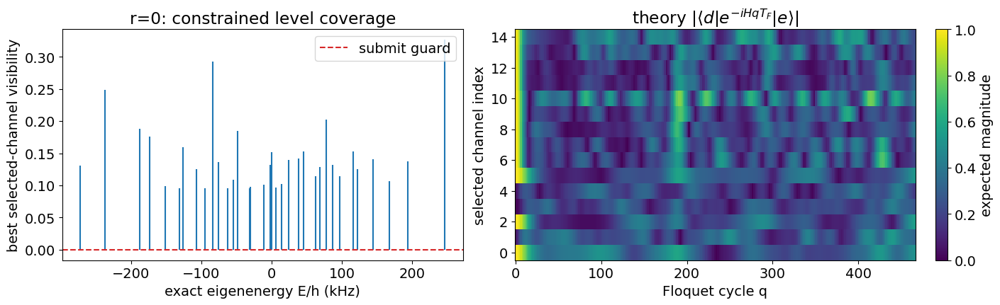

In [61]:
d72_max_abs_energy_MHz = max(
    float(np.max(np.abs(plan.theory.energies_MHz)))
    for plan in d72_plans
)
d72_min_exact_gap_MHz = min(
    float(np.min(np.diff(plan.theory.energies_MHz)))
    for plan in d72_plans
    if len(plan.theory.energies_MHz) > 1
)
d72_max_cycle = int(np.floor(
    d72_max_time_us / d72_hardware.floquet_cycle_us
))
if d72_max_cycle < 1:
    raise ValueError("d72_max_time_us is shorter than one Floquet cycle")

if d72_max_abs_energy_MHz > 0.0:
    d72_step_nyquist = int(np.floor(
        1.0
        / (
            2.0
            * d72_nyquist_margin
            * d72_max_abs_energy_MHz
            * d72_hardware.floquet_cycle_us
        )
    ))
else:
    d72_step_nyquist = d72_max_cycle
if d72_step_nyquist < 1:
    raise RuntimeError(
        "one-cycle sampling already violates the requested Nyquist margin"
    )

d72_step_points = max(
    1,
    d72_max_cycle
    // max(int(d72_min_time_points) - 1, 1),
)
if d72_step_autocalculate:
    d72_cycle_step = max(
        1,
        min(d72_step_nyquist, d72_step_points),
    )
else:
    d72_cycle_step = int(d72_cycle_step)
    if d72_cycle_step < 1:
        raise ValueError("d72_cycle_step must be positive")
    if d72_cycle_step > d72_step_nyquist:
        raise RuntimeError(
            "d72_cycle_step violates the requested Nyquist margin"
        )
d72_cycles = np.arange(
    0,
    d72_max_cycle + 1,
    d72_cycle_step,
    dtype=int,
)
if len(d72_cycles) < 2:
    raise RuntimeError("the coherence-limited cycle grid is too short")
d72_cycle_chunks = [
    d72_cycles[start:start + int(d72_cycle_chunk_points)]
    for start in range(
        0,
        len(d72_cycles),
        int(d72_cycle_chunk_points),
    )
]
d72_dt_us = (
    d72_cycle_step
    * d72_hardware.floquet_cycle_us
)
d72_nyquist_MHz = 1.0 / (2.0 * d72_dt_us)
d72_fft_resolution_MHz = 1.0 / (
    len(d72_cycles) * d72_dt_us
)

d72_total_jobs = 0
d72_total_sweep_settings = 0
for plan in d72_plans:
    plan.decoders = [
        list(decoder)
        for decoder, encoder in plan.selected_pairs
    ]
    plan.encoders = [
        list(encoder)
        for decoder, encoder in plan.selected_pairs
    ]
    plan.cycle_branches = {
        tuple(decoder): int(
            d72_branch_overrides.get(tuple(decoder), 0)
        )
        for decoder in plan.decoders
    }

    plan.defaults = deepcopy(encspec_defaults)
    if d72_calibration_gauss_sigma is not None:
        plan.defaults.floquet_gauss_sigma = (
            d72_calibration_gauss_sigma
        )
    if d72_calibration_waveform is not None:
        plan.defaults.floquet_waveform = (
            d72_calibration_waveform
        )
    plan.defaults.update(dict(
        d72_realization=plan.realization,
        d72_seed=plan.seed,
        d72_disorder_strength_kHz=d72_disorder_strength_kHz,
        d72_target_onsite_MHz=(
            plan.target_onsite_MHz.tolist()
        ),
        d72_max_occupation=d72_max_occupation,
        d72_forbidden_states=[
            list(state) for state in sorted(d72_forbidden_states)
        ],
        d72_selected_pairs=[
            [list(decoder), list(encoder)]
            for decoder, encoder in plan.selected_pairs
        ],
        d72_visibility_floor=(
            plan.selection.visibility_floor
        ),
        d72_self_kerr_kHz=(
            d72_resolved_self_kerr_kHz
        ),
    ))
    plan.batch = D72EncSpec.spectroscopy_batch(
        plan.defaults,
        d72_modes,
        plan.encoders,
        d72_cycle_chunks,
        d72_correction.phase_by_occupation,
        detunings=plan.pulse_detunings_MHz.tolist(),
        sync_cycles=d72_calibration_sync_cycles,
        reps=d72_reps,
        final_occupations=plan.decoders,
    )
    plan.job_count = len(plan.batch.configs)
    d72_total_jobs += plan.job_count
    plan.sweep_setting_count = 0
    for config in plan.batch.configs:
        if "offdiag_cycles" in config:
            plan.sweep_setting_count += (
                4 * len(config["offdiag_cycles"])
            )
        else:
            plan.sweep_setting_count += (
                2 * len(config["floquet_cycles"])
            )
    d72_total_sweep_settings += plan.sweep_setting_count

    d72_theory_reconstruction = AttrDict(dict(
        occupations=[
            list(encoder)
            for decoder, encoder in plan.selected_pairs
        ],
        final_occupations=[
            list(decoder)
            for decoder, encoder in plan.selected_pairs
        ],
        cycles=d72_cycles.copy(),
        A=np.zeros(
            (
                len(plan.selected_pairs),
                len(d72_cycles),
            ),
            dtype=complex,
        ),
    ))
    plan.selected_theory = D72EncSpec.analyze_spectrum(
        d72_theory_reconstruction,
        d72_N,
        plan.pulse_detunings_MHz,
        d72_hardware.couplings_MHz,
        d72_hardware.floquet_cycle_us,
        d72_resolved_self_kerr_MHz,
    )

print(
    f"7-2: leaves={len(d72_modes)}, total modes={d72_mode_count}, "
    f"N={d72_N}, levels={d72_expected_dimension}"
)
print(
    f"realizations={len(d72_plans)}, "
    f"selected channels/realization="
    f"{[len(plan.selected_pairs) for plan in d72_plans]}"
)
print(
    f"cycles={d72_cycles[0]}:{d72_cycles[-1]}:"
    f"{d72_cycle_step}, points={len(d72_cycles)}, "
    f"chunks={len(d72_cycle_chunks)}, "
    f"max time={d72_cycles[-1] * d72_hardware.floquet_cycle_us:.3f} us"
)
print(
    f"Nyquist={1e3 * d72_nyquist_MHz:.3f} kHz, "
    f"FFT resolution={1e3 * d72_fft_resolution_MHz:.3f} kHz, "
    f"minimum exact gap={1e3 * d72_min_exact_gap_MHz:.3f} kHz"
)
print(
    f"exact queue jobs={d72_total_jobs}, "
    f"raw phase/preparation sweep settings={d72_total_sweep_settings}"
)
print(
    f"signed M1 self-Kerr="
    f"{d72_resolved_self_kerr_kHz:.3f} kHz"
)

for plan in d72_plans[:int(d72_theory_plot_realizations)]:
    fig, axes = plt.subplots(
        1,
        2,
        figsize=(14, 4.2),
        constrained_layout=True,
    )
    energies_kHz = 1e3 * np.asarray(
        plan.theory.energies_MHz,
    )
    axes[0].vlines(
        energies_kHz,
        0.0,
        plan.selection.coverage,
        color="tab:blue",
    )
    axes[0].axhline(
        d72_min_acceptable_visibility,
        color="tab:red",
        linestyle="--",
        label="submit guard",
    )
    axes[0].set(
        xlabel="exact eigenenergy E/h (kHz)",
        ylabel="best selected-channel visibility",
        title=(
            f"r={plan.realization}: constrained level coverage"
        ),
    )
    axes[0].legend()

    expectation = np.abs(
        plan.selected_theory.theory_A
    )
    image = axes[1].imshow(
        expectation,
        origin="lower",
        aspect="auto",
        interpolation="nearest",
        extent=[
            d72_cycles[0] - 0.5 * d72_cycle_step,
            d72_cycles[-1] + 0.5 * d72_cycle_step,
            -0.5,
            len(plan.selected_pairs) - 0.5,
        ],
    )
    axes[1].set(
        xlabel="Floquet cycle q",
        ylabel="selected channel index",
        title=r"theory $|\langle d|e^{-iHqT_F}|e\rangle|$",
    )
    fig.colorbar(
        image,
        ax=axes[1],
        label="expected magnitude",
    )
    plt.show()

d72_calibration_ids = tuple(map(
    str,
    getattr(d72_calibration, "batch_job_ids", []),
))
d72_campaign_key = (
    int(d72_N),
    int(d72_realization_count),
    float(d72_disorder_strength_kHz),
    int(d72_master_seed),
    None if d72_max_occupation is None
    else int(d72_max_occupation),
    tuple(sorted(d72_forbidden_states)),
    int(d72_channel_count),
    int(d72_required_support),
    bool(d72_allow_diagonal),
    bool(d72_allow_offdiagonal),
    float(d72_min_acceptable_visibility),
    float(d72_resolved_self_kerr_kHz),
    float(d72_hardware.floquet_cycle_us),
    tuple(map(float, d72_hardware.couplings_MHz)),
    int(d72_calibration_sync_cycles),
    tuple(sorted(
        (occupation, int(branch))
        for occupation, branch
        in d72_branch_overrides.items()
    )),
    str(getattr(station, "hardware_config_file", "")),
    repr(D72BatchRunner._plain(dict(encspec_defaults))),
    int(d72_reps),
    tuple(map(int, d72_cycles)),
    tuple(map(int, d72_modes)),
    tuple(
        (
            int(plan.realization),
            tuple(plan.selected_pairs),
        )
        for plan in d72_plans
    ),
    d72_calibration_ids,
)
d72_campaigns = globals().get("d72_campaigns", {})
d72_records = d72_campaigns.setdefault(
    d72_campaign_key,
    {},
)


#### 7-2d. Run the constrained disorder batches — submits jobs

This cell refuses to submit if the theory-selected weakest visibility is below the configured guard. Lower the guard explicitly only after inspecting the coverage plot. Completed realizations are reused from the independent in-memory `d72_campaigns` cache.

batch 1: 2 jobs


Job submitted: JOB-20260907-00406 (queue position: 1)
Job submitted: JOB-20260907-00407 (queue position: 1)
[WORKER] Loading EncodingHamiltonianSpectroscopyExperiment from experiments.qsim.floquet_dark_mode_readout
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260907-00406_EncodingHamiltonianSpectroscopyExperiment.h5
[WORKER]   Program: EncodingPropagatorProgram from experiments.qsim.floquet_dark_mode_readout
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
100%|████████████████████████████████████████| 400/400 [14:53<00:00,  2.23s/it]
Saving C:\experiments\260818_qsim_spectroscopy\data\JOB-20260907-00406_EncodingHamiltonianSpectroscopyExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260818_qsim_spectroscopy\expt_objs\JOB-20260907-00406_expt.pkl
[runner] experiment.display() failed: Incompatible X, Y inputs to pcolormesh; see help(pcolorme

C:\python\multimode_expts\experiments\qsim\qsim_base.py:499: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(2, 1, figsize=(10, 9))


[WORKER] Loading EncodingHamiltonianSpectroscopyExperiment from experiments.qsim.floquet_dark_mode_readout
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260908-00012_EncodingHamiltonianSpectroscopyExperiment.h5
[WORKER]   Program: EncodingPropagatorProgram from experiments.qsim.floquet_dark_mode_readout
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
100%|██████████████████████████████████████████| 68/68 [02:38<00:00,  2.33s/it]
Saving C:\experiments\260818_qsim_spectroscopy\data\JOB-20260908-00012_EncodingHamiltonianSpectroscopyExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260818_qsim_spectroscopy\expt_objs\JOB-20260908-00012_expt.pkl
[runner] experiment.display() failed: Incompatible X, Y inputs to pcolormesh; see help(pcolormesh)
[log_measurement] Appended section to G:\Shared drives\SLab\Multimode\Lab\jonginn\EncSpec\2026\09\2026-0

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



100%|████████████████████████████████████████| 400/400 [14:50<00:00,  2.23s/it]
Saving C:\experiments\260818_qsim_spectroscopy\data\JOB-20260908-00071_EncodingHamiltonianSpectroscopyExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260818_qsim_spectroscopy\expt_objs\JOB-20260908-00071_expt.pkl
[runner] experiment.display() failed: Incompatible X, Y inputs to pcolormesh; see help(pcolormesh)
[log_measurement] Appended section to G:\Shared drives\SLab\Multimode\Lab\jonginn\EncSpec\2026\09\2026-09-08.md
[WORKER] Loading EncodingHamiltonianSpectroscopyExperiment from experiments.qsim.floquet_dark_mode_readout
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260908-00072_EncodingHamiltonianSpectroscopyExperiment.h5
[WORKER]   Program: EncodingPropagatorProgram from experiments.qsim.floquet_dark_mode_readout
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler 

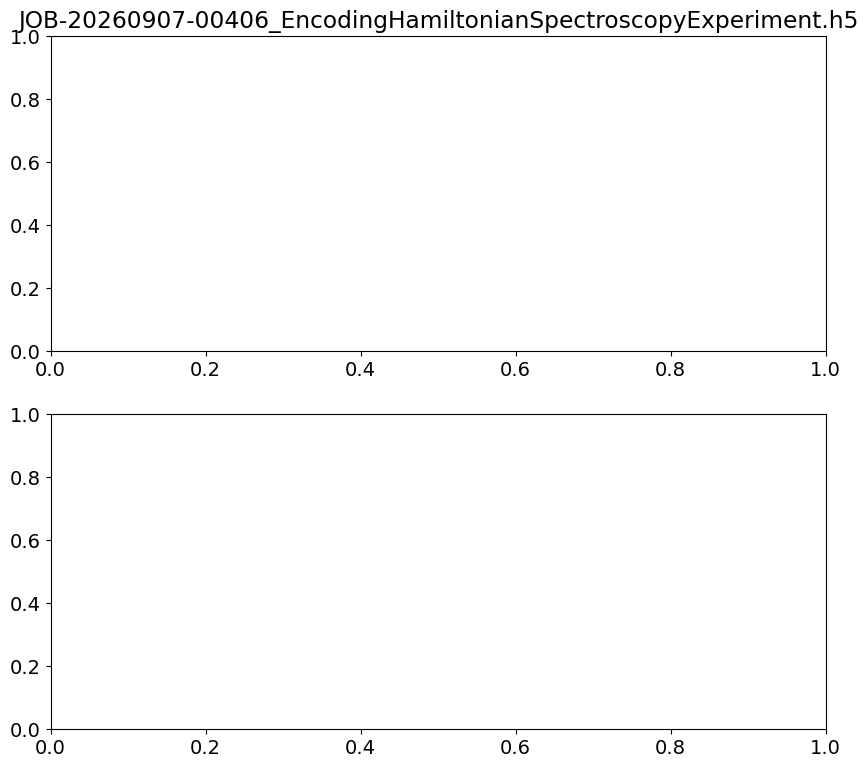

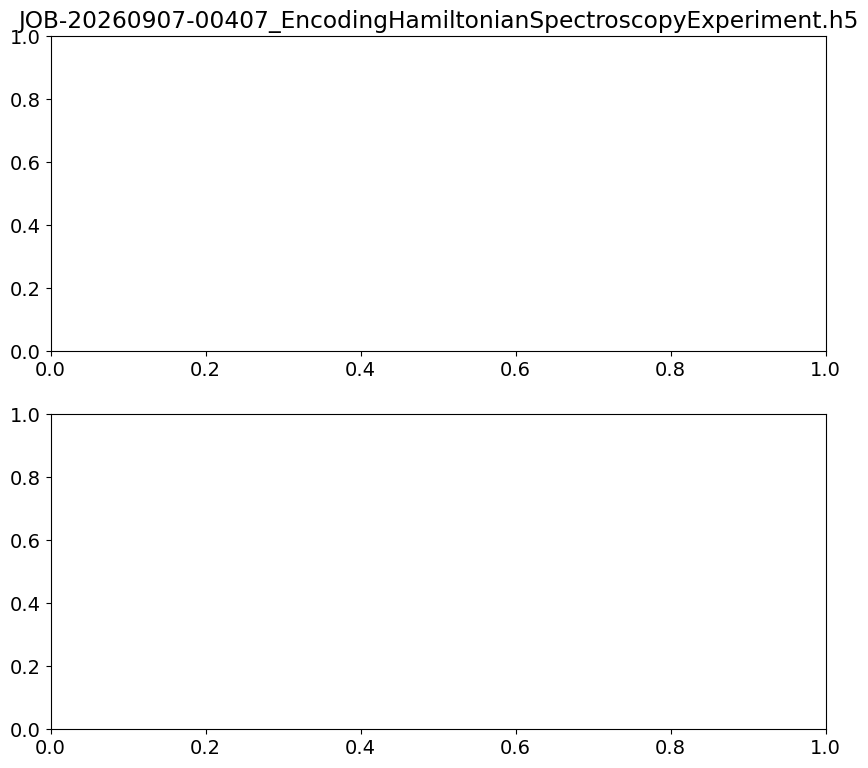

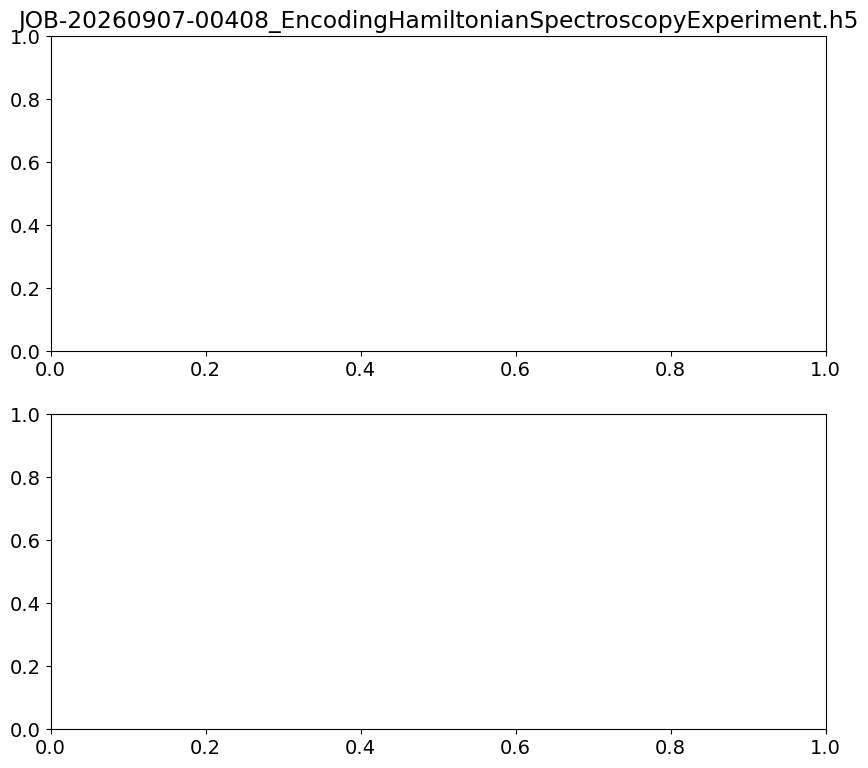

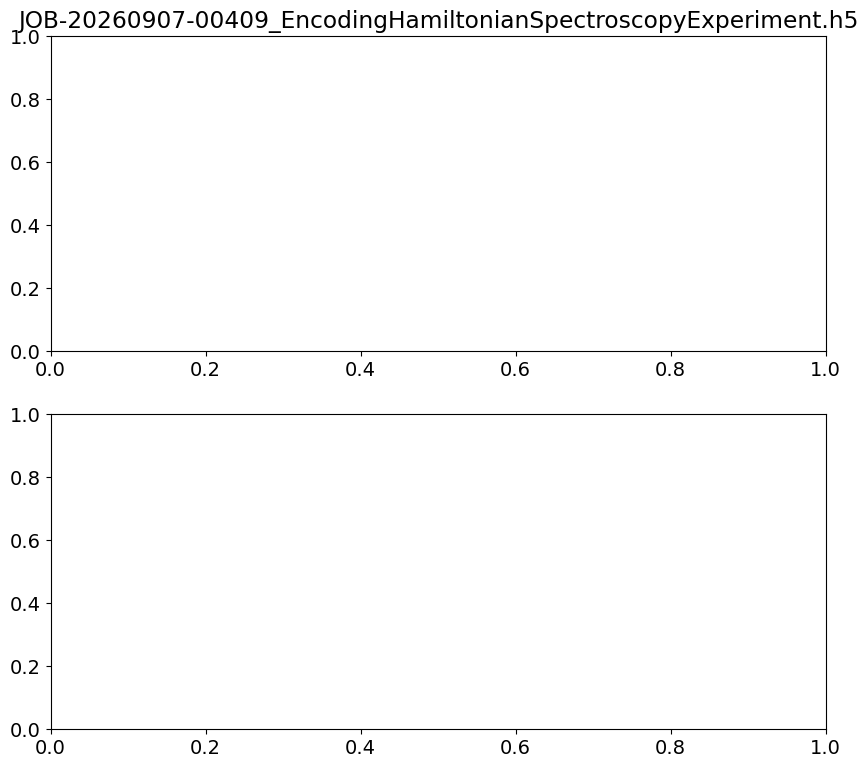

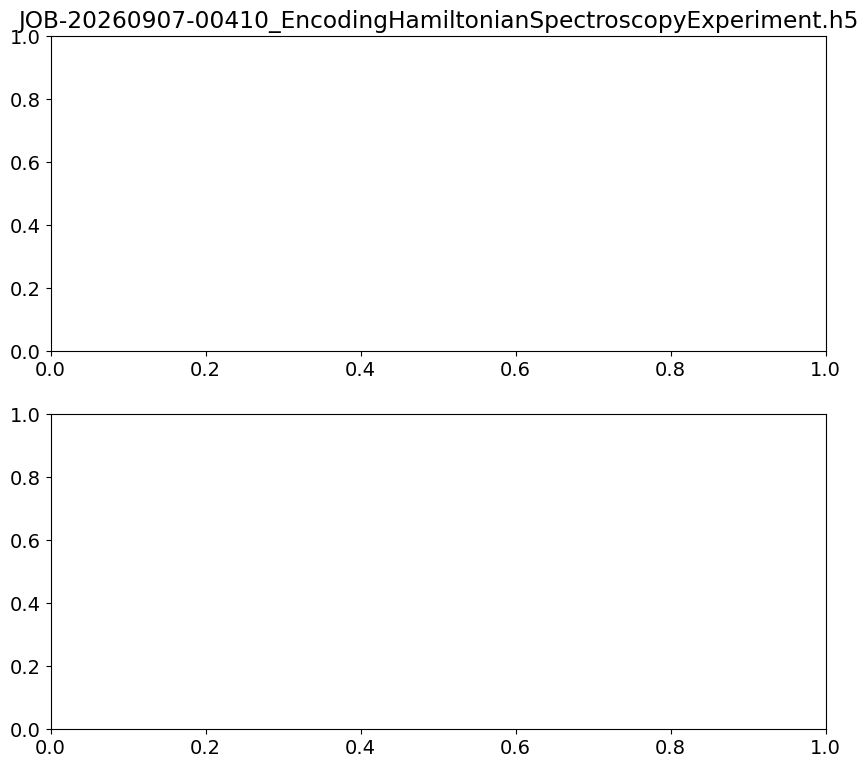

...

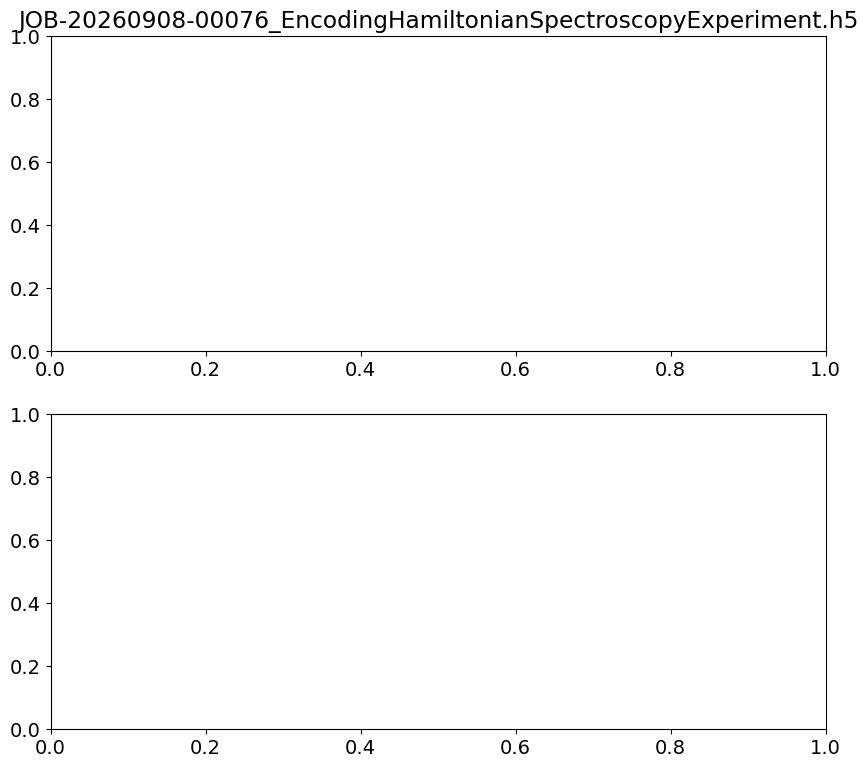

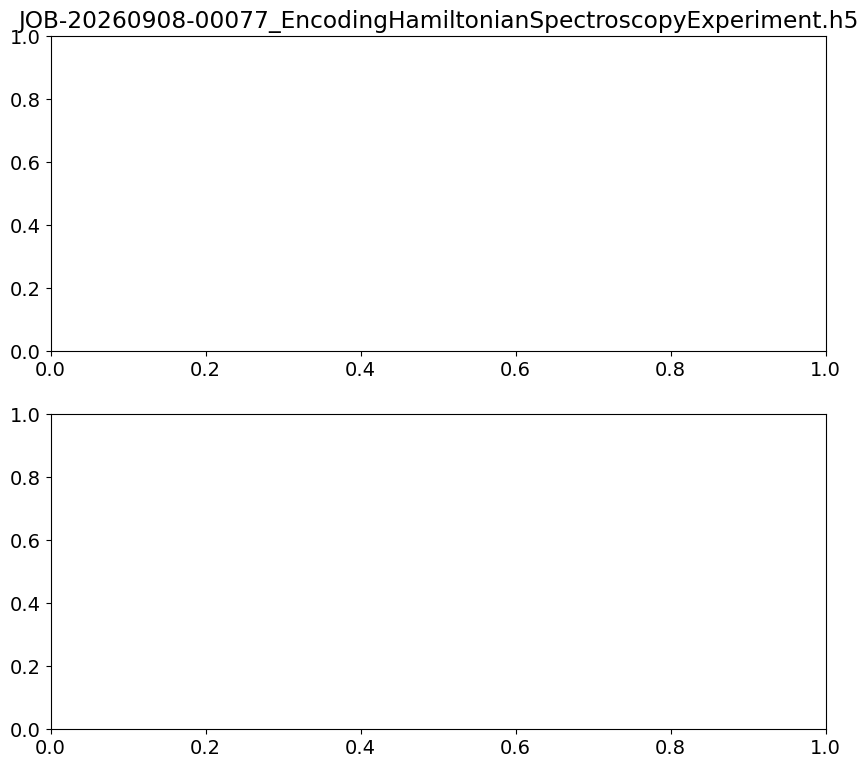

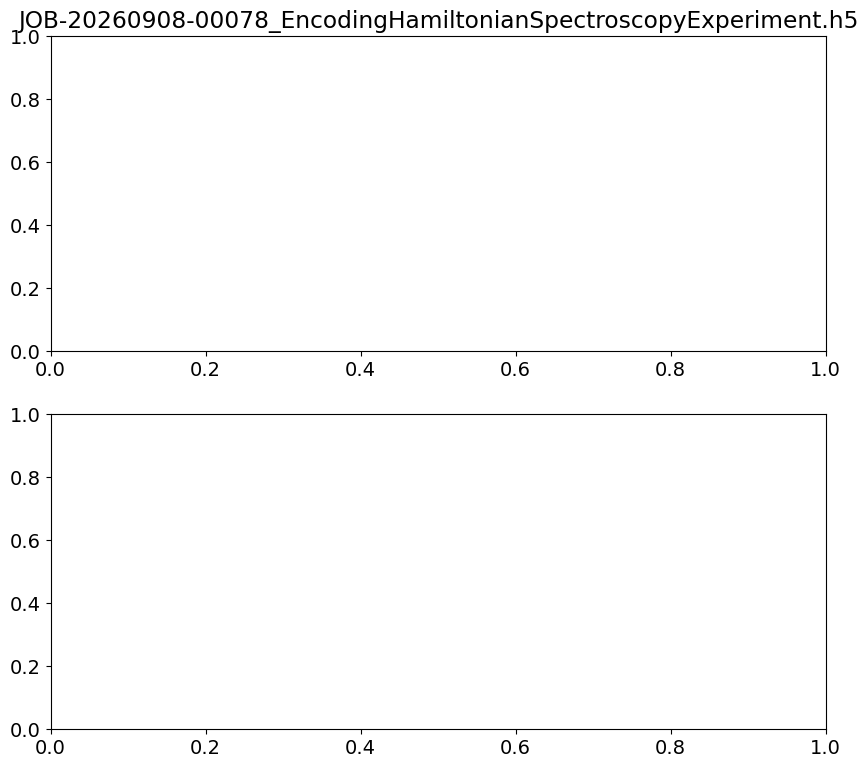

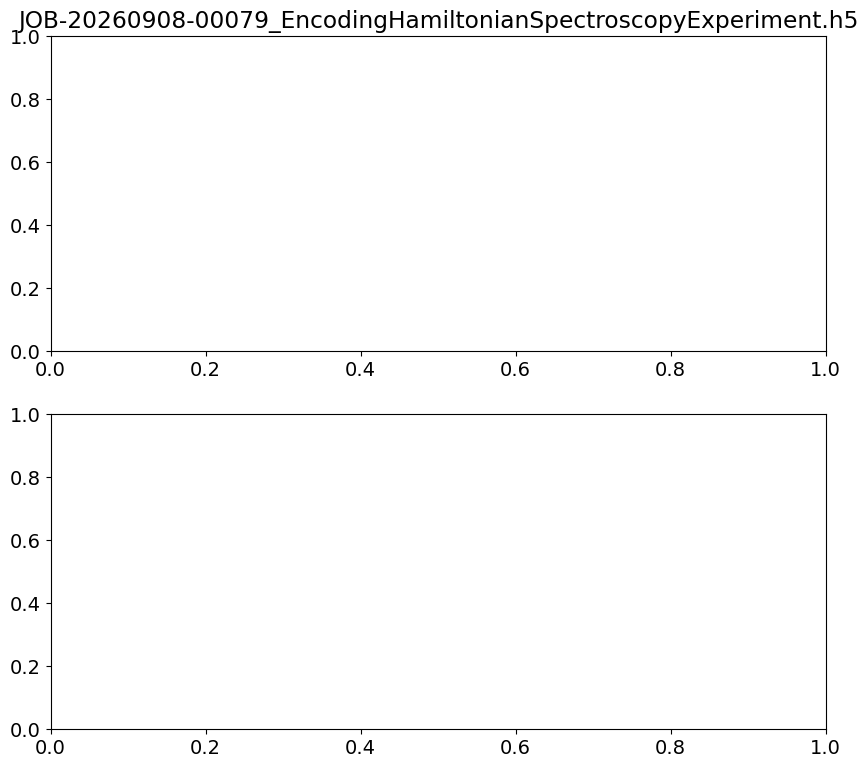

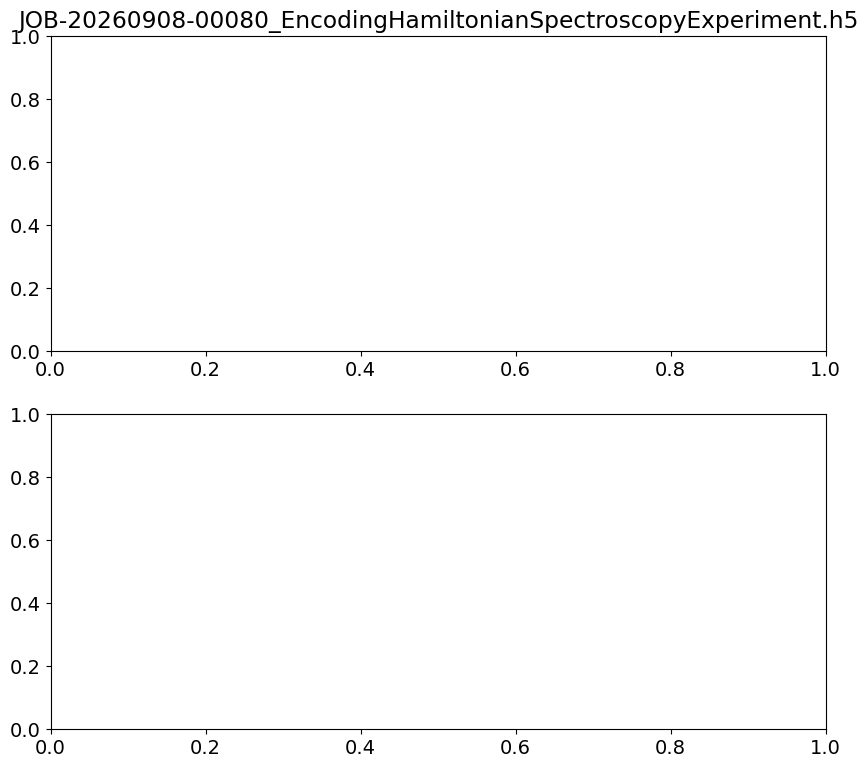

In [62]:
d72_low_visibility = [
    (
        plan.realization,
        plan.selection.visibility_floor,
    )
    for plan in d72_plans
    if not plan.visibility_ok
]
if d72_low_visibility:
    raise RuntimeError(
        "7-2 submission blocked by weak theory coverage: "
        f"{d72_low_visibility}; adjust the state constraints, "
        "channel count, or d72_min_acceptable_visibility"
    )

for plan in d72_plans:
    if plan.realization in d72_records:
        print(
            f"skip r={plan.realization}: already completed "
            "in this 7-2 campaign"
        )
        continue

    d72_runner = D72BatchRunner(
        station=station,
        ExptClass=D72EncSpec,
        ExptProgram=plan.batch.program,
        default_expt_cfg=plan.batch.default_expt_cfg,
        job_client=client,
        show=False,
    )
    try:
        d72_expt = d72_runner.execute(
            plan.batch.configs,
            batch_size=d72_batch_size,
            log=True,
            show=False,
        )
    except BaseException:
        print(
            f"r={plan.realization} submitted before interruption:",
            list(map(
                str,
                getattr(d72_runner, "last_job_ids", []),
            )),
        )
        raise

    d72_records[plan.realization] = AttrDict(dict(
        plan=plan,
        expt=d72_expt,
        job_ids=list(map(str, d72_expt.batch_job_ids)),
        cycle_branches=plan.cycle_branches,
        data=None,
    ))
    print(
        f"finished 7-2 acquisition r={plan.realization}:",
        d72_records[plan.realization].job_ids,
    )


#### 7-2e. Matrix-Pencil candidates, time-domain evidence fitting, and theory matching — no jobs

Each row first proposes stable Matrix-Pencil poles only through the estimated signal rank plus two ranks. A joint complex-exponential fit to that row then rejects candidates that do not significantly reduce the time-domain residual, using a conditional Bonferroni-adjusted screen across the discovered row candidates. Only the accepted candidates are merged across rows using the phase-calibration slope standard errors. The exact Hamiltonian is used afterward for diagnostics and matching, never for pole selection.


r=0: poles=35, matched=29/35, missing=6, spurious=6, MAE=6.282 kHz
  missing theory (kHz): [-212.11  -177.611  -75.539  -70.446   16.614   70.337]
  unmatched poles (kHz): [115.703 117.859 131.096 160.94  197.561 217.123]


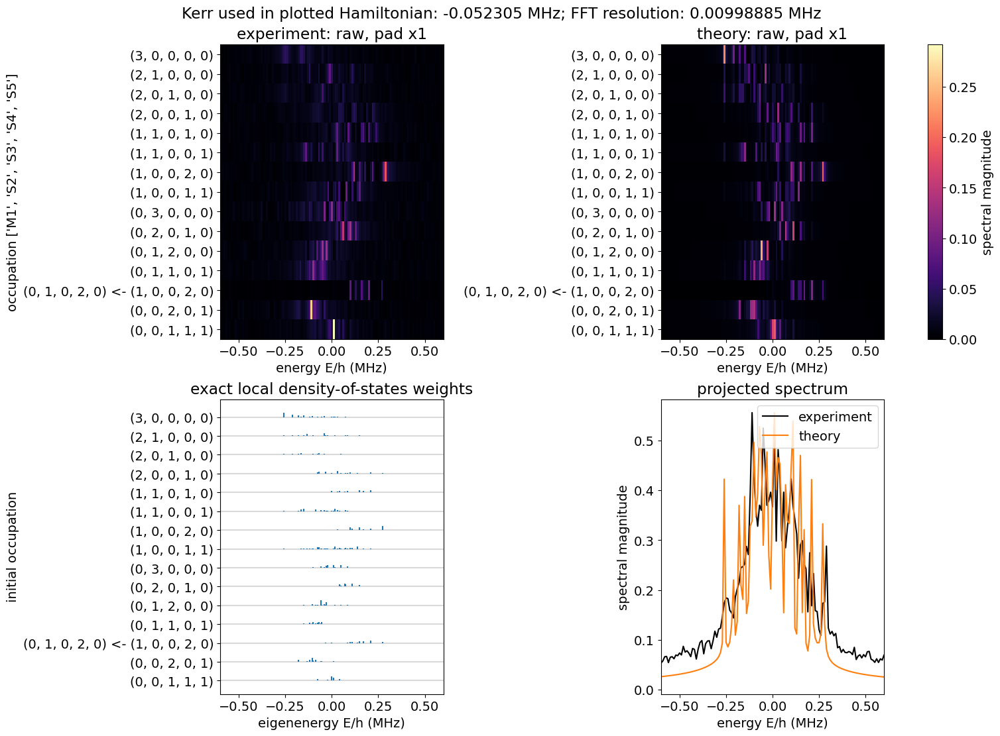

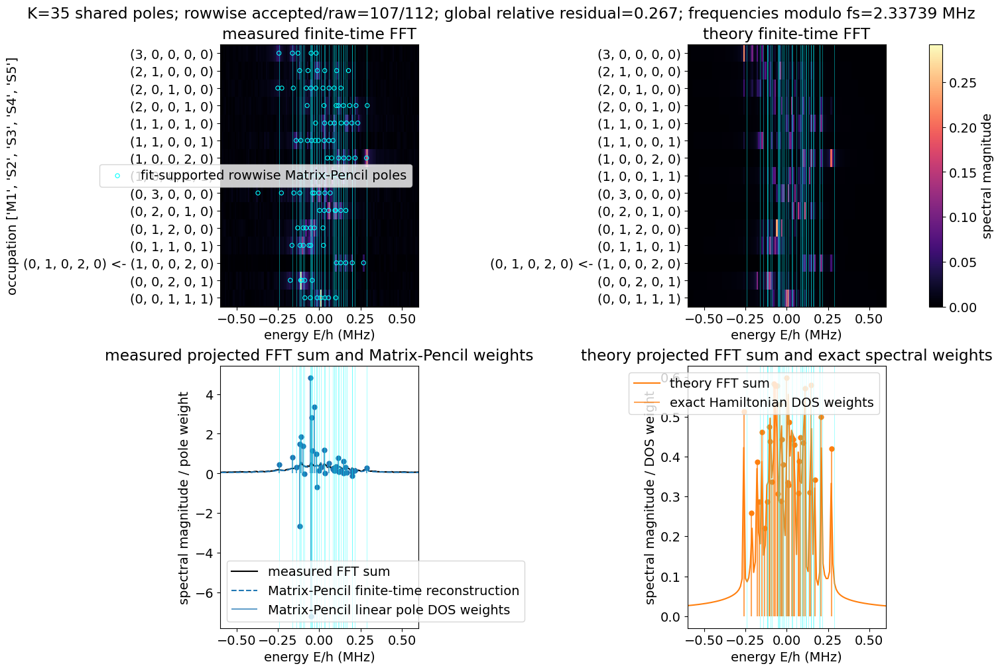

r=1: poles=35, matched=26/35, missing=9, spurious=9, MAE=4.098 kHz
  missing theory (kHz): [-270.015 -191.645 -147.049 -135.322 -122.986 -105.242  -98.297  -53.458
  233.39 ]
  unmatched poles (kHz): [  6.607  10.452  26.783  28.756  45.079  54.886 104.925 140.778 259.613]


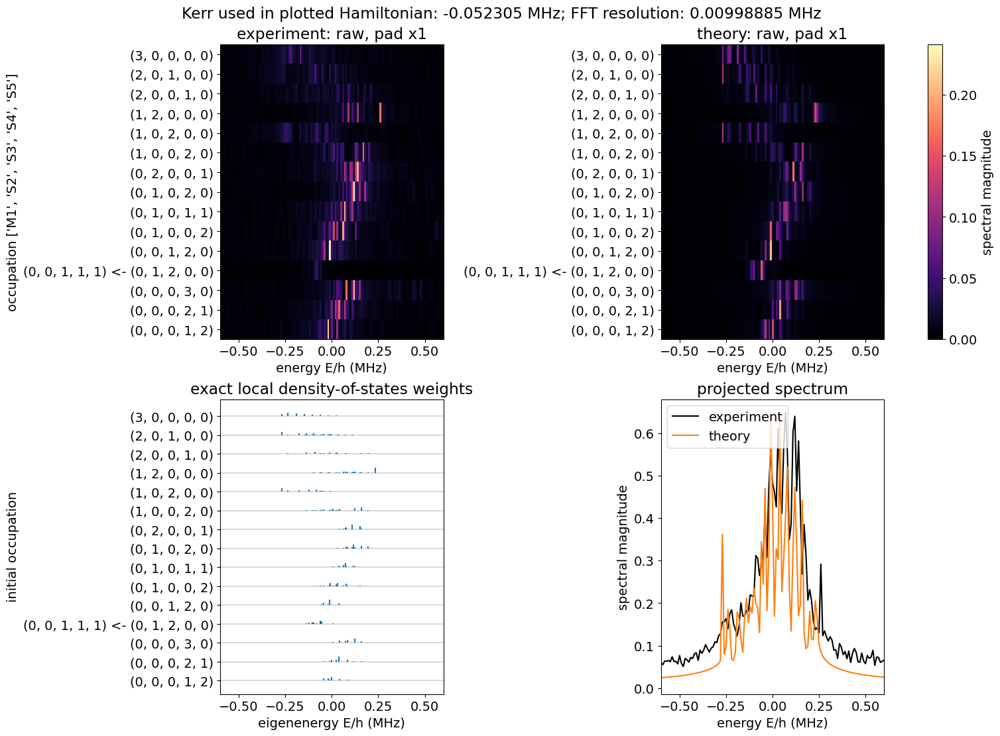

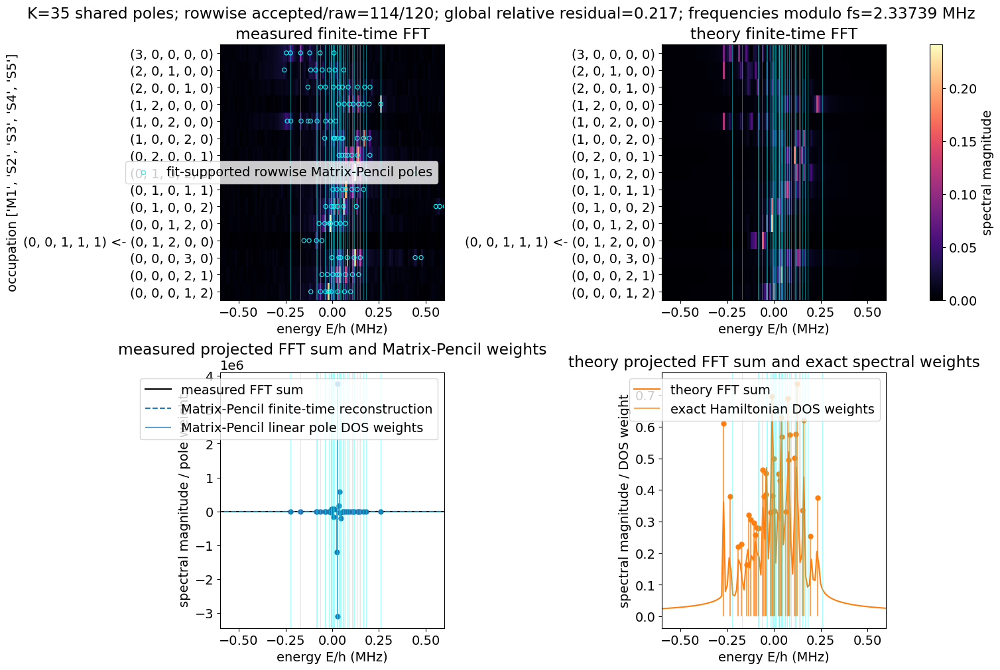

r=2: poles=35, matched=28/35, missing=7, spurious=7, MAE=4.285 kHz
  missing theory (kHz): [-2.71981e+02 -1.87071e+02 -5.43740e+01 -3.12690e+01 -1.50000e-02
  1.67408e+02  2.46702e+02]
  unmatched poles (kHz): [ 36.242  43.435 100.551 110.89  137.001 150.865 274.463]


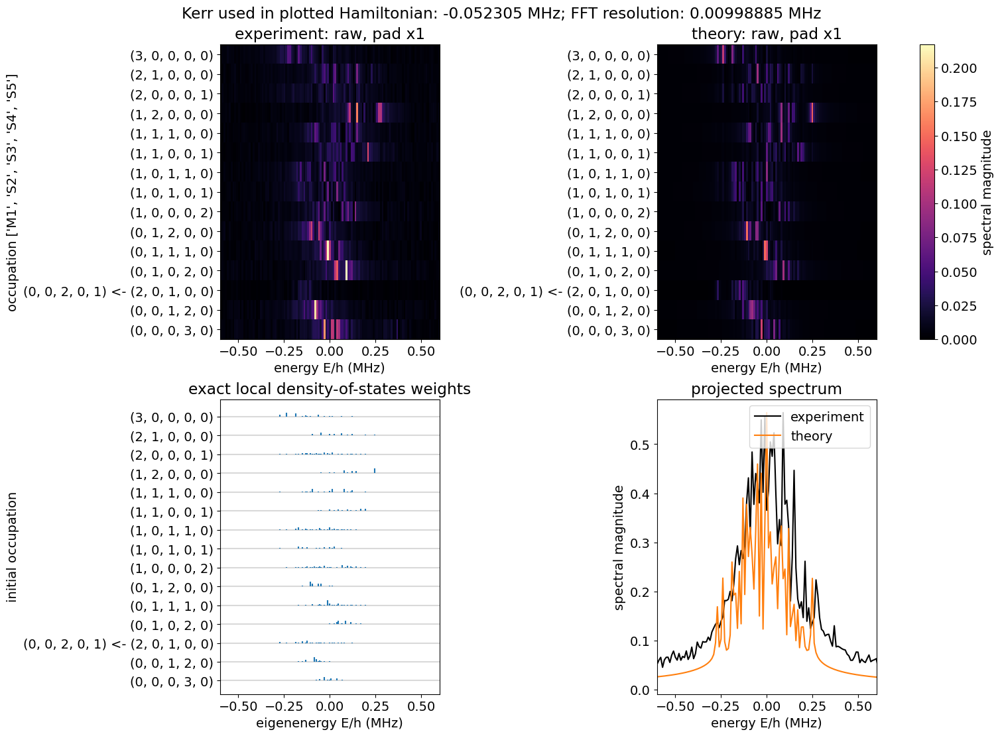

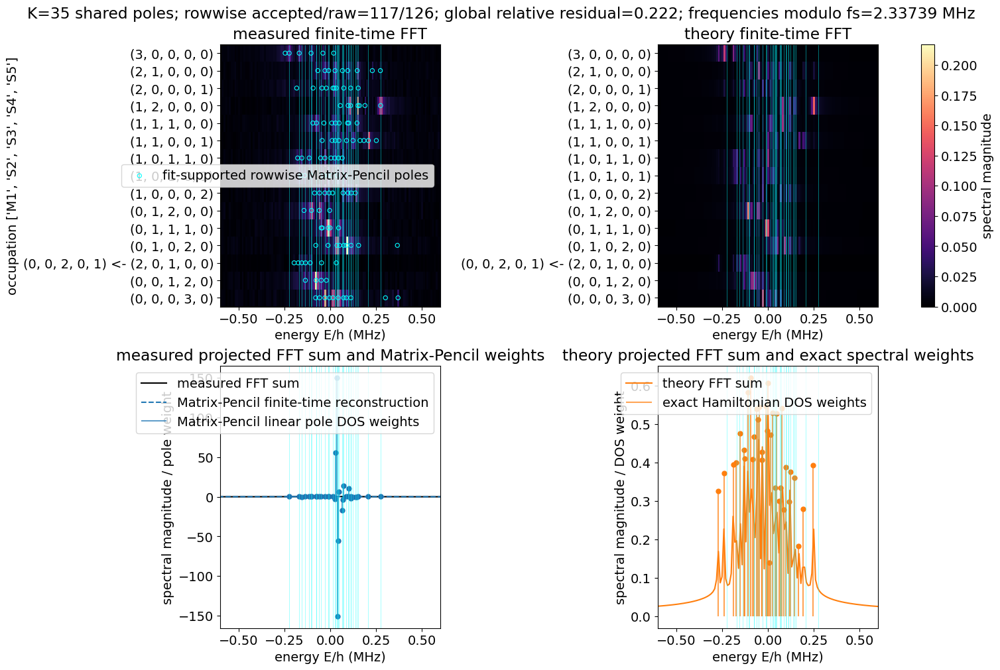

7-2 complete theory matches: 0/6 []


In [57]:
for d72_realization, record in sorted(d72_records.items()):
    plan = record.plan
    try:
        d72_data = record.expt.analyze(
            stage="spectrum",
            calibration=d72_calibration,
            cycle_branches=record.cycle_branches,
            phase_frame="manual_kerr",
            manual_kerr_MHz=d72_resolved_self_kerr_MHz,
            spectrum_method="mpm",
            fft_window="raw",
            zero_padding=1,
            mpm_requested_max_modes=d72_expected_dimension,
            mpm_match_decay=False,
            mpm_minimum_consecutive_ranks=(
                d72_mpm_minimum_consecutive_ranks
            ),
            mpm_rank_sweep_extra=d72_mpm_rank_sweep_extra,
            mpm_candidate_familywise_alpha=(
                d72_mpm_candidate_familywise_alpha
            ),
            mpm_minimum_supporting_rows=(
                d72_mpm_minimum_supporting_rows
            ),
            mpm_merge_frequency_tolerance_bins=(
                d72_mpm_merge_frequency_tolerance
            ),
            mpm_calibration_sigma_multiplier=(
                d72_mpm_calibration_sigma_multiplier
            ),
            mpm_merge_frequency_tolerance_floor_kHz=(
                d72_mpm_frequency_tolerance_floor_kHz
            ),
            mpm_dedup_frequency_tolerance_MHz=(
                1e-3 * d72_mpm_dedup_frequency_tolerance_kHz
            ),
        )
    except Exception as d72_analysis_error:
        record.analysis_error = d72_analysis_error
        print(
            f"r={d72_realization} analysis failed: "
            f"{d72_analysis_error}"
        )
        continue

    record.data = d72_data
    if "analysis_error" in record:
        record.pop("analysis_error")

    d72_sampling_frequency_MHz = float(
        d72_data.matrix_pencil.sampling.sampling_frequency_MHz
    )
    d72_principal_nyquist_MHz = (
        0.5 * d72_sampling_frequency_MHz
    )
    d72_poles_MHz = np.asarray(
        d72_data.matrix_pencil.selected_frequencies_MHz,
        dtype=float,
    )
    d72_poles_MHz = (
        (
            d72_poles_MHz
            + d72_principal_nyquist_MHz
        )
        % d72_sampling_frequency_MHz
        - d72_principal_nyquist_MHz
    )
    d72_theory_levels_MHz = np.asarray(
        plan.theory.energies_MHz,
        dtype=float,
    )

    d72_error_MHz = np.abs(
        d72_poles_MHz[:, None]
        - d72_theory_levels_MHz[None, :]
    )
    d72_tolerance_MHz = (
        d72_match_tolerance_bins
        * float(d72_data.spectrum.fft_resolution_MHz)
    )
    d72_inside_tolerance = (
        d72_error_MHz <= d72_tolerance_MHz
    )
    if len(d72_poles_MHz):
        d72_penalty = (
            (d72_expected_dimension + 1)
            * (float(np.max(d72_error_MHz)) + 1.0)
        )
        d72_match_rows, d72_match_columns = (
            linear_sum_assignment(
                np.where(
                    d72_inside_tolerance,
                    d72_error_MHz,
                    d72_penalty,
                )
            )
        )
        d72_valid = d72_inside_tolerance[
            d72_match_rows,
            d72_match_columns,
        ]
        d72_matched_pole_rows = d72_match_rows[d72_valid]
        d72_matched_theory_rows = (
            d72_match_columns[d72_valid]
        )
    else:
        d72_matched_pole_rows = np.asarray([], dtype=int)
        d72_matched_theory_rows = np.asarray([], dtype=int)

    d72_missing_theory_rows = np.setdiff1d(
        np.arange(d72_expected_dimension),
        d72_matched_theory_rows,
    )
    d72_spurious_pole_rows = np.setdiff1d(
        np.arange(len(d72_poles_MHz)),
        d72_matched_pole_rows,
    )
    d72_complete = bool(
        len(d72_poles_MHz) == d72_expected_dimension
        and len(d72_matched_theory_rows)
        == d72_expected_dimension
    )
    d72_match_mae_MHz = (
        float(np.mean(d72_error_MHz[
            d72_matched_pole_rows,
            d72_matched_theory_rows,
        ]))
        if len(d72_matched_pole_rows)
        else np.nan
    )

    record.mpm_poles_MHz = d72_poles_MHz
    record.theory_match = AttrDict(dict(
        complete=d72_complete,
        tolerance_MHz=d72_tolerance_MHz,
        matched_count=len(d72_matched_theory_rows),
        missing_theory_MHz=(
            d72_theory_levels_MHz[d72_missing_theory_rows]
        ),
        spurious_poles_MHz=(
            d72_poles_MHz[d72_spurious_pole_rows]
        ),
        mae_MHz=d72_match_mae_MHz,
    ))

    print(
        f"r={d72_realization}: poles={len(d72_poles_MHz)}, "
        f"matched={len(d72_matched_theory_rows)}/"
        f"{d72_expected_dimension}, "
        f"missing={len(d72_missing_theory_rows)}, "
        f"spurious={len(d72_spurious_pole_rows)}, "
        f"MAE={1e3 * d72_match_mae_MHz:.3f} kHz"
    )
    if len(d72_missing_theory_rows):
        print(
            "  missing theory (kHz):",
            np.round(
                1e3
                * d72_theory_levels_MHz[
                    d72_missing_theory_rows
                ],
                3,
            ),
        )
    if len(d72_spurious_pole_rows):
        print(
            "  unmatched poles (kHz):",
            np.round(
                1e3
                * d72_poles_MHz[d72_spurious_pole_rows],
                3,
            ),
        )

    record.expt.display(
        data=d72_data,
        spectrum_method="fft",
    )
    record.expt.display(
        data=d72_data,
        spectrum_method="mpm",
    )
    plt.show()

d72_completed_matches = [
    realization
    for realization, record in sorted(d72_records.items())
    if (
        record.get("theory_match") is not None
        and record.theory_match.complete
    )
]
print(
    "7-2 complete theory matches:",
    f"{len(d72_completed_matches)}/{len(d72_plans)}",
    d72_completed_matches,
)


In [ ]:
record.keys()

dict_keys(['plan', 'expt', 'job_ids', 'cycle_branches', 'data', 'mpm_poles_MHz', 'theory_match'])

In [ ]:
for d72_realization, record in sorted(d72_records.items()):
    print(record.job_ids)
    

['JOB-20260906-00151', 'JOB-20260906-00152', 'JOB-20260906-00153', 'JOB-20260906-00154', 'JOB-20260906-00155', 'JOB-20260906-00156', 'JOB-20260906-00157', 'JOB-20260906-00158', 'JOB-20260906-00159', 'JOB-20260906-00160', 'JOB-20260906-00161', 'JOB-20260906-00162', 'JOB-20260906-00163', 'JOB-20260906-00164', 'JOB-20260906-00165', 'JOB-20260906-00166', 'JOB-20260906-00167', 'JOB-20260906-00168', 'JOB-20260906-00169', 'JOB-20260906-00170', 'JOB-20260906-00171', 'JOB-20260906-00172', 'JOB-20260906-00173', 'JOB-20260906-00174', 'JOB-20260906-00175', 'JOB-20260906-00176', 'JOB-20260906-00177', 'JOB-20260906-00178', 'JOB-20260906-00179', 'JOB-20260906-00180']
['JOB-20260906-00181', 'JOB-20260906-00182', 'JOB-20260906-00183', 'JOB-20260906-00184', 'JOB-20260906-00185', 'JOB-20260906-00186', 'JOB-20260906-00187', 'JOB-20260906-00188', 'JOB-20260906-00189', 'JOB-20260906-00190', 'JOB-20260906-00191', 'JOB-20260906-00192', 'JOB-20260906-00193', 'JOB-20260906-00194', 'JOB-20260906-00195', 'JOB-202

## 8. Hamiltonian tomography

This $N=1$ pilot measures $q=[0,s,2s]$. Besides the ordinary generalized eigenproblem, it fits one shared $s$-cycle transfer matrix $F$ to both $M_s\approx F M_0$ and $M_{2s}\approx F M_s$. Comparing the fit for raw and phase-corrected matrices tests whether the fixed-depth phase correction preserves a time-homogeneous matrix model. The reported $E/h=-\arg(\lambda)/(2\pi sT)$ is in the principal Floquet zone and is defined modulo $1/(sT)$. Run 8-1 through 8-4 in order: an older experiment acquired without all three cycles cannot be passed to 8-3.

### 8-1. Build the $q=[0,s,2s]$ plan and check acquisition size — no jobs

In [ ]:
import importlib

importlib.reload(floquet_dark_mode_readout)
EncSpec = floquet_dark_mode_readout.EncodingHamiltonianSpectroscopyExperiment
BatchRunner = floquet_dark_mode_readout.BatchRunner

hamtom_N = 1
hamtom_step = 10
hamtom_depth = 2 * hamtom_step
hamtom_cycles = [0, hamtom_step, hamtom_depth]
hamtom_reps = 1000
hamtom_batch_size = 5

if hamtom_N not in encspec_calibrations:
    raise RuntimeError(
        "Run or load the N=1 calibration in Section 1 first."
    )

hamtom_calibration = encspec_calibrations[hamtom_N]
hamtom_cycle_us = float(
    hamtom_calibration.data.hardware.floquet_cycle_us
)
hamtom_occupations = [
    list(occupation)
    for occupation in product(
        range(hamtom_N + 1),
        repeat=len(encspec_mode_labels),
    )
    if sum(occupation) == hamtom_N
]
hamtom_occupations.sort(reverse=True)
hamtom_correction = EncSpec.phase_correction_from_calibration(
    hamtom_calibration,
    cycle_branches={
        tuple(occupation): 0 for occupation in hamtom_occupations
    },
)
hamtom_batch = EncSpec.propagator_batch(
    encspec_defaults,
    encspec_modes,
    hamtom_occupations,
    hamtom_cycles,
    phase_by_occupation=hamtom_correction.phase_by_occupation,
    sync_cycles=encspec_sync_cycles,
    reps=hamtom_reps,
)
hamtom_runner = BatchRunner(
    station=station,
    ExptClass=EncSpec,
    ExptProgram=(
        floquet_dark_mode_readout.EncodingPropagatorProgram
    ),
    default_expt_cfg=hamtom_batch.default_expt_cfg,
    job_client=client,
    show=False,
)

# Rough scale from the 3.76 s/point estimate used in Section 7-1.
hamtom_serial_minutes = (
    hamtom_batch.total_points * 3.76
    * hamtom_reps / 1200.0 / 60.0
)
hamtom_parallel_jobs = min(
    hamtom_batch_size, len(hamtom_batch.configs)
)
print("basis order:", [
    tuple(occupation) for occupation in hamtom_occupations
])
print(
    f"Floquet cycle={hamtom_cycle_us:.6f} us; "
    f"q={hamtom_cycles}; step time="
    f"{hamtom_step * hamtom_cycle_us:.6f} us; max time="
    f"{hamtom_depth * hamtom_cycle_us:.6f} us"
)
print(
    f"jobs={len(hamtom_batch.configs)}, "
    f"points/job={hamtom_batch.points_per_job}, "
    f"total points={hamtom_batch.total_points}, "
    f"program repetitions={hamtom_batch.total_points * hamtom_reps:,}"
)
print(
    f"rough time={hamtom_serial_minutes:.1f} min serialized, "
    f"or {hamtom_serial_minutes / hamtom_parallel_jobs:.1f} min "
    f"with {hamtom_parallel_jobs} concurrent workers, plus overhead"
)

### 8-2. Run the complete $5\times5$ propagator batch — submits five jobs

In [ ]:
hamtom_expt = hamtom_runner.execute(
    hamtom_batch.configs,
    batch_size=hamtom_batch_size,
    log=True,
    show=False,
)
print("tomography jobs:", hamtom_expt.batch_job_ids)

### 8-3. Analyze three depths and fit one shared transfer matrix — no jobs

In [ ]:
hamtom_data = hamtom_expt.analyze(
    stage="propagator",
    occupations=hamtom_occupations,
    calibration=hamtom_calibration,
    finite_difference_cycles=hamtom_cycles,
    eigenphase_cycle=hamtom_step,
)
hamtom_eigenphase = hamtom_data.eigenphase
hamtom_couplings_MHz = np.asarray(
    hamtom_data.hardware.couplings_MHz, dtype=float
)
hamtom_bright_energy_MHz = np.linalg.norm(hamtom_couplings_MHz)
hamtom_theory_frequencies_MHz = np.asarray([
    -hamtom_bright_energy_MHz, 0.0, 0.0, 0.0,
    hamtom_bright_energy_MHz,
])

def hamtom_fit_shared_step(matrices):
    matrices = np.asarray(matrices, dtype=complex)
    cycle_index = {
        int(cycle): index
        for index, cycle in enumerate(hamtom_data.cycles)
    }
    M0 = matrices[cycle_index[0]]
    M1 = matrices[cycle_index[hamtom_step]]
    M2 = matrices[cycle_index[hamtom_depth]]

    # Fit F M0 ~= M1 and F M1 ~= M2 simultaneously.
    design = np.hstack((M0, M1))
    target = np.hstack((M1, M2))
    transfer = np.linalg.lstsq(
        design.T, target.T, rcond=None
    )[0].T
    recurrence_residual = (
        np.linalg.norm(target - transfer @ design)
        / np.linalg.norm(target)
    )
    predicted_M2 = M1 @ np.linalg.solve(M0, M1)
    semigroup_residual = (
        np.linalg.norm(M2 - predicted_M2)
        / np.linalg.norm(M2)
    )

    poles = np.linalg.eigvals(transfer)
    frequencies_MHz = -np.angle(poles) / (
        2 * np.pi * hamtom_step * hamtom_cycle_us
    )
    order = np.argsort(frequencies_MHz)
    return {
        "transfer": transfer,
        "poles": poles[order],
        "pole_radii": np.abs(poles[order]),
        "frequencies_MHz": frequencies_MHz[order],
        "recurrence_residual": float(recurrence_residual),
        "semigroup_residual": float(semigroup_residual),
    }

hamtom_raw_fit = hamtom_fit_shared_step(hamtom_data.raw_matrices)
hamtom_corrected_fit = hamtom_fit_shared_step(hamtom_data.matrices)

print("finite difference used:", hamtom_data.finite_difference is not None)
print(f"cond(M0)={hamtom_data.zero_cycle_condition_number:.3g}")
print(
    "endpoint-normalized M0 identity residual="
    f"{hamtom_data.endpoint_normalized_zero_cycle_identity_residual:.3g}"
)
print(
    "calibration diagonal mismatch="
    f"{hamtom_data.calibration_diagonal_relative_mismatch:.3g}"
)
print(
    f"q={hamtom_step} two-depth GEVP E/h (kHz):",
    np.round(1e3 * hamtom_eigenphase.eigenfrequencies_MHz, 3),
)
print("three-depth shared-step fits (lower residual is better):")
for label, fit in (
    ("raw", hamtom_raw_fit),
    ("phase corrected", hamtom_corrected_fit),
):
    print(
        f"  {label}: recurrence={fit['recurrence_residual']:.3g}, "
        f"semigroup={fit['semigroup_residual']:.3g}"
    )
    print(s
        "    E/h (kHz):",
        np.round(1e3 * fit["frequencies_MHz"], 3),
    )
    print("    |lambda|:", np.round(fit["pole_radii"], 5))
print(
    "zero-detuning theory E/h (kHz):",
    np.round(1e3 * hamtom_theory_frequencies_MHz, 3),
)
print(
    f"step-fit alias period="
    f"{1e3 / (hamtom_step * hamtom_cycle_us):.3f} kHz; "
    f"principal zone=+/-"
    f"{0.5e3 * hamtom_eigenphase.alias_period_MHz:.3f} kHz"
)

### 8-4. Three-depth diagnostics — no jobs

In [ ]:
hamtom_cycle_index = {
    int(cycle): index
    for index, cycle in enumerate(hamtom_data.cycles)
}
hamtom_M0 = hamtom_data.matrices[hamtom_cycle_index[0]]
hamtom_Mstep = hamtom_data.matrices[
    hamtom_cycle_index[hamtom_step]
]
hamtom_Mdepth = hamtom_data.matrices[
    hamtom_cycle_index[hamtom_depth]
]
hamtom_raw_values = hamtom_raw_fit["poles"]
hamtom_corrected_values = hamtom_corrected_fit["poles"]

fig, axes = plt.subplots(
    1, 5, figsize=(22, 4.2), constrained_layout=True, squeeze=False
)
axes = axes[0]
for axis, matrix, title in (
    (axes[0], hamtom_M0, r"$|M_0|$"),
    (axes[1], hamtom_Mstep, rf"$|M_{{{hamtom_step}}}|$"),
    (axes[2], hamtom_Mdepth, rf"$|M_{{{hamtom_depth}}}|$"),
):
    image = axis.imshow(
        np.abs(matrix), origin="upper", cmap="magma", vmin=0
    )
    axis.set_title(title)
    axis.set_xticks(
        np.arange(len(hamtom_data.mode_labels)),
        hamtom_data.mode_labels,
        rotation=45,
    )
    axis.set_yticks(
        np.arange(len(hamtom_data.mode_labels)),
        hamtom_data.mode_labels,
    )
    axis.set_xlabel("encoder")
    axis.set_ylabel("decoder")
    fig.colorbar(image, ax=axis)

hamtom_angle = np.linspace(0, 2 * np.pi, 500)
axes[3].plot(
    np.cos(hamtom_angle), np.sin(hamtom_angle),
    color="black", linestyle=":", linewidth=1,
)
axes[3].scatter(
    hamtom_raw_values.real, hamtom_raw_values.imag,
    s=55, marker="x", label="raw",
)
axes[3].scatter(
    hamtom_corrected_values.real, hamtom_corrected_values.imag,
    s=55, facecolors="none", edgecolors="C1",
    label="phase corrected",
)
axes[3].axhline(0, color="0.8", linewidth=0.8)
axes[3].axvline(0, color="0.8", linewidth=0.8)
axes[3].set_aspect("equal")
axes[3].set(
    xlabel=r"$\mathrm{Re}\,\lambda$",
    ylabel=r"$\mathrm{Im}\,\lambda$",
    title="shared-step eigenvalues",
)
axes[3].legend(fontsize=8)

axes[4].scatter(
    np.zeros(len(hamtom_raw_fit["frequencies_MHz"])),
    1e3 * hamtom_raw_fit["frequencies_MHz"],
    s=55, marker="x", label="raw fit",
)
axes[4].scatter(
    np.ones(len(hamtom_corrected_fit["frequencies_MHz"])),
    1e3 * hamtom_corrected_fit["frequencies_MHz"],
    s=55, facecolors="none", edgecolors="C1",
    label="phase-corrected fit",
)
axes[4].scatter(
    2 * np.ones(len(hamtom_theory_frequencies_MHz)),
    1e3 * hamtom_theory_frequencies_MHz,
    marker="x", s=65, color="black", label="theory",
)
axes[4].set_xticks(
    [0, 1, 2], ["raw", "corrected", "theory"]
)
axes[4].set(
    xlim=(-0.5, 2.5),
    ylabel=r"$E/h$ (kHz)",
    title="three-depth least-squares spectrum",
)
plt.show()

## 9. Disorder-averaged spectral form factor

This measures the exact fixed-$N$ trace, so every one of the 35 diagonal occupations is required for $N=3$ on five modes. The disorder distribution and cycle grid match Section 7-2, but this section does not depend on any Section 7 object.

### 9-1. Settings and workload preview — no jobs

`sff_total_reps_per_realization = 4` means two shots in each of the independent A/B replicas. Thus the requested ensemble-repetition count is $2000\times4=8000$. The hardware workload is larger because each repetition is made for every occupation, positive circuit depth, and four phase settings.

In [ ]:
SFFExperiment = floquet_dark_mode_readout.DisorderSFFExperiment

sff_N = 3
sff_realization_count = 2000
sff_total_reps_per_realization = 4
sff_disorder_strength_kHz = 50.0
sff_master_seed = 20260901

# Copy the coherence-limited grid used in Section 7-2 without depending on it.
sff_max_time_us = 80.0
sff_cycle_step = 2

# The q=0 encoder/decoder visibility is measured once and reused for all realizations.
sff_visibility_reps = 1000
sff_realizations_per_job = 5
sff_batch_size = 14
sff_bootstrap_samples = 300
sff_branch_overrides = {}

if sff_total_reps_per_realization < 2 or sff_total_reps_per_realization % 2:
    raise ValueError("sff_total_reps_per_realization must be a positive even integer")
sff_shots_per_replica = sff_total_reps_per_realization // 2

# Use the common full-basis phase calibration from Section 1.
if sff_N not in encspec_calibrations:
    if sff_N not in encspec_calibration_files:
        raise RuntimeError(
            f"Run or load the full N={sff_N} phase calibration in Section 1 first."
        )
    sff_calibration = EncSpec.from_job_files(
        encspec_calibration_files[sff_N],
        station=station,
    )
    sff_calibration.batch_job_ids = encspec_calibration_job_ids[sff_N]
    sff_calibration.analyze(stage="calibration")
    encspec_calibrations[sff_N] = sff_calibration

sff_calibration = encspec_calibrations[sff_N]
if "phase_mod180" not in sff_calibration.data:
    sff_calibration.analyze(stage="calibration")
sff_calibration_data = sff_calibration.data

if list(sff_calibration_data.mode_labels) != encspec_mode_labels:
    raise ValueError(
        "The N=3 calibration mode order does not match encspec_modes: "
        f"{list(sff_calibration_data.mode_labels)} != {encspec_mode_labels}"
    )

# Reuse the Floquet waveform and timing convention of the phase calibration.
sff_calibration_ecfg = sff_calibration.batch_expts[0].cfg.expt
sff_sync_cycles = int(
    sff_calibration_ecfg.get("scramble_sync_cycles", encspec_sync_cycles)
)
sff_gauss_sigma = sff_calibration_ecfg.get("floquet_gauss_sigma", None)
sff_waveform = sff_calibration_ecfg.get("floquet_waveform", None)
sff_live_hardware = EncSpec.hardware_parameters(
    station,
    encspec_modes,
    sff_sync_cycles,
    sff_gauss_sigma,
    sff_waveform,
)
sff_hardware = deepcopy(sff_calibration_data.hardware)

# Kerr is an analysis-frame parameter, so use its current hardware-config value.
sff_hardware.physical_kerr_MHz = float(sff_live_hardware.physical_kerr_MHz)

sff_defaults = deepcopy(encspec_defaults)
if sff_gauss_sigma is not None:
    sff_defaults.floquet_gauss_sigma = sff_gauss_sigma
if sff_waveform is not None:
    sff_defaults.floquet_waveform = sff_waveform

sff_occupations = [
    list(state)
    for state in product(
        range(sff_N + 1),
        repeat=len(encspec_mode_labels),
    )
    if sum(state) == sff_N
]
sff_occupations.sort(reverse=True)
sff_dimension = len(sff_occupations)

sff_calibration_occupations = [
    tuple(map(int, occupation))
    for occupation in sff_calibration_data.occupations
]
sff_calibration_branches = np.asarray([
    int(sff_branch_overrides.get(occupation, 0))
    for occupation in sff_calibration_occupations
])
sff_correction = EncSpec.build_phase_correction(
    sff_calibration_data.occupations,
    sff_calibration_data.phase_mod180,
    sff_calibration_branches,
    sff_hardware.physical_kerr_MHz,
    sff_hardware.floquet_cycle_us,
)
sff_missing_calibrations = [
    tuple(occupation)
    for occupation in sff_occupations
    if tuple(occupation) not in sff_correction.phase_by_occupation
]
if sff_missing_calibrations:
    raise ValueError(f"Missing N=3 calibration rows: {sff_missing_calibrations}")

sff_max_cycle = int(np.floor(
    sff_max_time_us / sff_hardware.floquet_cycle_us
))
sff_cycles = np.arange(
    0,
    sff_max_cycle + 1,
    sff_cycle_step,
    dtype=int,
)

sff_realization_ids = np.arange(sff_realization_count, dtype=np.int64)
sff_realization_seeds = sff_master_seed + sff_realization_ids
sff_disorder_directions = np.empty(
    (sff_realization_count, len(encspec_modes)),
    dtype=float,
)
for sff_row, sff_seed in enumerate(sff_realization_seeds):
    sff_rng = np.random.default_rng(int(sff_seed))
    sff_direction = sff_rng.normal(size=len(encspec_modes))
    sff_direction -= np.mean(sff_direction)
    sff_direction /= np.sqrt(np.mean(sff_direction ** 2))
    sff_disorder_directions[sff_row] = sff_direction

sff_target_onsite_MHz = (
    1e-3 * sff_disorder_strength_kHz * sff_disorder_directions
)
# The pulse detuning has the opposite sign from the analyzer onsite energy.
sff_pulse_detunings_MHz = -sff_target_onsite_MHz

sff_plan = SFFExperiment.batch(
    default_expt_cfg=sff_defaults,
    swap_stors=encspec_modes,
    occupations=sff_occupations,
    cycles=sff_cycles,
    phase_by_occupation=sff_correction.phase_by_occupation,
    realization_detunings_MHz=sff_pulse_detunings_MHz,
    realization_seeds=sff_realization_seeds,
    realization_ids=sff_realization_ids,
    sync_cycles=sff_sync_cycles,
    shots_per_replica=sff_shots_per_replica,
    visibility_reps=sff_visibility_reps,
    realizations_per_job=sff_realizations_per_job,
    include_visibility=True,
)

# Section 7-1 measured about 3.76 s per two-phase, 1200-rep cycle point.
sff_seconds_per_elementary_shot = 3.76 / (2 * 1200)
sff_estimated_acquisition_hours = (
    sff_plan.total_elementary_shots
    * sff_seconds_per_elementary_shot
    / 3600
)
sff_disorder_program_loads = sff_realization_count * sff_dimension
sff_visibility_program_loads = 4 * sff_dimension

print(
    f"N={sff_N}, D={sff_dimension}, realizations={sff_realization_count}, "
    f"total reps/realization={sff_total_reps_per_realization} "
    f"({sff_shots_per_replica}+{sff_shots_per_replica} A/B)"
)
print(
    f"requested ensemble reps={sff_realization_count * sff_total_reps_per_realization:,}"
)
print(
    f"cycles={sff_cycles[0]}:{sff_cycles[-1]}:{sff_cycle_step}, "
    f"positive depths={len(sff_plan.positive_cycles)}, "
    f"max time={sff_cycles[-1] * sff_hardware.floquet_cycle_us:.3f} us"
)
print(
    f"queue jobs=1 visibility + {len(sff_plan.configs) - 1} disorder; "
    f"disorder program loads={sff_disorder_program_loads:,}"
)
print(
    f"expanded science shots={sff_plan.disorder_elementary_shots:,}; "
    f"visibility shots={sff_plan.visibility_elementary_shots:,}"
)
print(
    f"rough acquisition-only lower bound={sff_estimated_acquisition_hours:.1f} h"
)
print(
    "The estimate excludes 70,000 program compile/load operations, queue delay, "
    "and other overhead; batch_size does not parallelize one physical station."
)
print(
    "calibration/live cycle estimates (us):",
    f"{sff_hardware.floquet_cycle_us:.9f}",
    f"{sff_live_hardware.floquet_cycle_us:.9f}",
)
print(
    "calibration/live couplings (MHz):",
    np.asarray(sff_hardware.couplings_MHz),
    np.asarray(sff_live_hardware.couplings_MHz),
)
print(
    f"current hardware-config M1 Kerr={1e3 * sff_hardware.physical_kerr_MHz:.3f} kHz"
)

### 9-2. Measure depth-zero visibility — submits one job

Run this before the full ensemble. It plots all 35 encoder/decoder return amplitudes; a very small value will amplify noise when the trace is normalized.

In [ ]:
sff_visibility_runner = BatchRunner(
    station=station,
    ExptClass=SFFExperiment,
    ExptProgram=sff_plan.program,
    default_expt_cfg=sff_plan.default_expt_cfg,
    job_client=client,
    show=False,
)
sff_visibility_batch = sff_visibility_runner.execute(
    sff_plan.configs[:1],
    batch_size=1,
    log=True,
    show=False,
)
sff_visibility_expt = sff_visibility_batch.batch_expts[0]
sff_visibility = (
    np.asarray(sff_visibility_expt.data.visibility_real, dtype=float)
    + 1j * np.asarray(sff_visibility_expt.data.visibility_imag, dtype=float)
)
sff_visibility_magnitude = np.abs(sff_visibility)

plt.figure(figsize=(12, 4.2))
plt.plot(
    np.arange(sff_dimension),
    sff_visibility_magnitude,
    "o-",
)
plt.axhline(0.0, color="0.7", linewidth=0.8)
plt.xlabel("occupation index in sff_occupations")
plt.ylabel(r"$|V_j(0)|$")
plt.title("depth-zero encoder/decoder visibility")
plt.grid(alpha=0.25)
plt.show()

print("visibility job:", sff_visibility_batch.batch_job_ids)
print("five weakest occupations:")
for sff_index in np.argsort(sff_visibility_magnitude)[:5]:
    print(
        tuple(sff_occupations[sff_index]),
        f"|V(0)|={sff_visibility_magnitude[sff_index]:.6g}",
    )

### 9-3. Run the 2000-realization ensemble — submits jobs

This submits only the positive-depth disorder jobs; the visibility job above is not repeated. With the current settings it submits 400 queue jobs, each containing five realizations.

In [ ]:
sff_disorder_runner = BatchRunner(
    station=station,
    ExptClass=SFFExperiment,
    ExptProgram=sff_plan.program,
    default_expt_cfg=sff_plan.default_expt_cfg,
    job_client=client,
    show=False,
)
try:
    sff_disorder_batch = sff_disorder_runner.execute(
        sff_plan.configs[1:],
        batch_size=sff_batch_size,
        log=True,
        show=False,
    )
except BaseException:
    print(
        "jobs submitted before the stop/failure:",
        sff_disorder_runner.last_job_ids,
    )
    raise

print("completed disorder jobs:", len(sff_disorder_batch.batch_job_ids))
print("first job:", sff_disorder_batch.batch_job_ids[0])
print("last job:", sff_disorder_batch.batch_job_ids[-1])

### 9-4. Analyze and plot the measured SFF — no jobs

The full SFF uses the cross product of the two independent replicas, avoiding the ordinary $|z|^2$ shot-noise bias. The disconnected part uses different disorder realizations; connected is full minus disconnected.

In [ ]:
sff_data = SFFExperiment.analyze_ensemble(
    sff_disorder_batch,
    visibility=sff_visibility_expt,
    bootstrap_samples=sff_bootstrap_samples,
    bootstrap_seed=sff_master_seed,
)

sff_time_us = np.asarray(sff_data.time_us, dtype=float)
sff_full = np.asarray(sff_data.sff_full, dtype=float)
sff_disconnected = np.asarray(sff_data.sff_disconnected, dtype=float)
sff_connected = np.asarray(sff_data.sff_connected, dtype=float)
sff_standard_error = np.asarray(
    sff_data.sff_full_standard_error,
    dtype=float,
)

fig, axes = plt.subplots(
    1,
    2,
    figsize=(14, 4.8),
    constrained_layout=True,
)
axes[0].plot(sff_time_us, sff_full, label="full SFF")
axes[0].fill_between(
    sff_time_us,
    sff_full - sff_standard_error,
    sff_full + sff_standard_error,
    alpha=0.22,
    label="full ± 1 SE",
)
axes[0].plot(
    sff_time_us,
    sff_disconnected,
    label="disconnected",
)
axes[0].plot(
    sff_time_us,
    np.asarray(sff_data.sff_naive),
    linestyle=":",
    color="0.45",
    label="naive $|z|^2$",
)
axes[0].axhline(
    1.0 / sff_dimension,
    color="black",
    linestyle="--",
    linewidth=1,
    label=r"$1/D$",
)
axes[0].set(
    xlabel="time (us)",
    ylabel=r"$K(t)$",
    title="disorder-averaged SFF",
)
axes[0].legend(fontsize=8)

axes[1].plot(
    sff_time_us,
    sff_connected,
    color="tab:purple",
    label="connected SFF",
)
if len(sff_data.bootstrap_connected_95_low):
    axes[1].fill_between(
        sff_time_us,
        sff_data.bootstrap_connected_95_low,
        sff_data.bootstrap_connected_95_high,
        color="tab:purple",
        alpha=0.2,
        label="bootstrap 95% interval",
    )
axes[1].axhline(0.0, color="black", linewidth=0.8)
axes[1].set(
    xlabel="time (us)",
    ylabel=r"$K_c(t)$",
    title="connected SFF",
)
axes[1].legend(fontsize=8)
fig.suptitle(
    f"N={sff_N}, D={sff_dimension}, "
    f"R={int(sff_data.realization_count[0])}, "
    f"reps={sff_total_reps_per_realization}"
)
plt.show()

### 9-5. Compare with the effective-Hamiltonian ensemble — no jobs

This diagonalizes the same 35-dimensional effective Hamiltonian for all 2000 saved disorder vectors and evaluates it at the measured Floquet-cycle times.

In [ ]:
sff_probe_occupation = [sff_N] + [0] * len(encspec_modes)
sff_probe = AttrDict(dict(
    occupations=[sff_probe_occupation],
    final_occupations=[sff_probe_occupation.copy()],
    cycles=np.asarray([0, 1], dtype=int),
    A=np.ones((1, 2), dtype=complex),
))
sff_theory_traces = np.empty(
    (sff_realization_count, len(sff_time_us)),
    dtype=complex,
)

for sff_row, sff_detunings_MHz in enumerate(sff_pulse_detunings_MHz):
    sff_theory = EncSpec.analyze_spectrum(
        sff_probe,
        sff_N,
        sff_detunings_MHz,
        sff_hardware.couplings_MHz,
        sff_hardware.floquet_cycle_us,
        sff_hardware.physical_kerr_MHz,
    )
    sff_energies_MHz = np.asarray(sff_theory.energies_MHz, dtype=float)
    sff_theory_traces[sff_row] = np.mean(
        np.exp(
            -2j
            * np.pi
            * sff_energies_MHz[:, None]
            * sff_time_us[None, :]
        ),
        axis=0,
    )
    if (sff_row + 1) % 250 == 0:
        print(f"diagonalized {sff_row + 1}/{sff_realization_count}")

sff_theory_same = np.abs(sff_theory_traces) ** 2
sff_theory_full = np.mean(sff_theory_same, axis=0)
sff_theory_disconnected = (
    np.abs(np.sum(sff_theory_traces, axis=0)) ** 2
    - np.sum(sff_theory_same, axis=0)
) / (sff_realization_count * (sff_realization_count - 1))
sff_theory_connected = sff_theory_full - sff_theory_disconnected

fig, axes = plt.subplots(
    1,
    2,
    figsize=(14, 4.8),
    constrained_layout=True,
)
axes[0].plot(sff_time_us, sff_full, label="experiment")
axes[0].plot(
    sff_time_us,
    sff_theory_full,
    linestyle="--",
    label="effective-H theory",
)
axes[0].fill_between(
    sff_time_us,
    sff_full - sff_standard_error,
    sff_full + sff_standard_error,
    alpha=0.2,
)
axes[0].axhline(
    1.0 / sff_dimension,
    color="black",
    linestyle=":",
    linewidth=1,
)
axes[0].set(
    xlabel="time (us)",
    ylabel=r"$K(t)$",
    title="full SFF",
)
axes[0].legend()

axes[1].plot(sff_time_us, sff_connected, label="experiment")
axes[1].plot(
    sff_time_us,
    sff_theory_connected,
    linestyle="--",
    label="effective-H theory",
)
axes[1].axhline(0.0, color="black", linewidth=0.8)
axes[1].set(
    xlabel="time (us)",
    ylabel=r"$K_c(t)$",
    title="connected SFF",
)
axes[1].legend()
plt.show()

# Floquet-pulse Kerr from coherent displacement

This uses the same sequence and analysis as `CavityRamseyGainSweepExperiment`: `D(alpha) -> closed forward/backward Floquet pairs -> D(alpha) -> slow-pi vacuum readout`. `ramsey_freq` only advances the frame of the second displacement; set it to zero when the two displacement phases should also be identical. One closed pair contains two physical Floquet cycles, so the fitting time is `2 * n_cycle_pair * floquet_cycle_us`.

In [ ]:
# Configure the coherent-state Kerr measurement.
import importlib
from experiments.qsim import floquet_dark_mode_readout

importlib.reload(floquet_dark_mode_readout)

DispKerr = floquet_dark_mode_readout.FloquetDisplacementKerrExperiment
floquet_kerr_modes = [4, 5, 6, 7]
floquet_kerr_cycle_pairs = np.arange(0, 31, dtype=int)
floquet_kerr_displace_gains = np.arange(2000, 6001, 1000)
floquet_kerr_ramsey_freq = 0.2  # MHz; keep below 1 / (4 * floquet_kerr_cycle_us)

floquet_kerr_defaults = AttrDict(dict(
    expts=1,
    rounds=1,
    reps=500,
    qubits=[0],
    active_reset=True,
    man_reset=True,
    storage_reset=floquet_kerr_modes,
    pre_relax_delay=100,
    relax_delay=200,
    reset_dump_mode=active_reset_default_dict["reset_dump_mode"],
    dump_reset_iter_num=active_reset_default_dict["dump_reset_iter_num"],
    use_qubit_man_reset=False,
    normalize=False,
    swap_stors=floquet_kerr_modes,
    scramble_sync_cycles=floquet_default_dict["scramble_sync_cycles"],
    floquet_hardware_loop=floquet_default_dict["floquet_hardware_loop"],
    update_phases=True,
    zero_floquet_gain=False,
    man_mode_no=1,
    perform_wigner=False,
    do_g_and_e=False,
    ramsey_freq=floquet_kerr_ramsey_freq,
    displace_gains=floquet_kerr_displace_gains,
    n_cycle_pairs=floquet_kerr_cycle_pairs,
    swept_params=['displace_gain', 'n_cycle_pair'],
))

floquet_kerr_runner = CharacterizationRunner(
    station=station,
    ExptClass=DispKerr,
    ExptProgram=floquet_dark_mode_readout.FloquetDisplacementKerrProgram,
    default_expt_cfg=floquet_kerr_defaults,
    job_client=client,
    show=False,
)

In [ ]:
# One 2D job sweeps displacement gain and the number of closed Floquet pairs.
floquet_kerr_expt = floquet_kerr_runner.execute(
    postprocess=False,
    log=False,
    show=False,
)

In [ ]:

floquet_kerr_expt.analyze(debug=False)
floquet_kerr_expt.display(save_fig=False)
plt.show()

print('Floquet Kerr:', floquet_kerr_expt.data.Kerr * 1e3, '+/-', floquet_kerr_expt.data.Kerr_err * 1e3, 'kHz')
print('linear detuning:', floquet_kerr_expt.data.detuning_g * 1e3, '+/-', floquet_kerr_expt.data.detuning_g_err * 1e3, 'kHz')

In [ ]:
plt.plot(floquet_kerr_expt.data['avgi'][1])